# Mask R-CNN - Train on Shapes Dataset


This notebook shows how to train Mask R-CNN on your own dataset. To keep things simple we use a synthetic dataset of shapes (squares, triangles, and circles) which enables fast training. You'd still need a GPU, though, because the network backbone is a Resnet101, which would be too slow to train on a CPU. On a GPU, you can start to get okay-ish results in a few minutes, and good results in less than an hour.

The code of the *Shapes* dataset is included below. It generates images on the fly, so it doesn't require downloading any data. And it can generate images of any size, so we pick a small image size to train faster. 

In [1]:
import os
import sys
import piexif

import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
import skimage
# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log
import pycocotools
%matplotlib inline 
import json
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from pycocotools import mask as maskUtils
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/hom

In [2]:
from tensorflow.python.client import device_lib

def get_available_gpus():
    local_device_protos = device_lib.list_local_devices()
    return [x.name for x in local_device_protos if x.device_type == 'GPU']

get_available_gpus()

['/device:GPU:0']

In [3]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 8752248340352949290, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 11137299252
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 1993311314819683802
 physical_device_desc: "device: 0, name: TITAN Xp, pci bus id: 0000:01:00.0, compute capability: 6.1"]

In [4]:
#import keras
#import tensorflow as tf
#config = tf.ConfigProto( device_count = {'GPU': 1 , 'CPU': 56} ) 
#sess = tf.Session(config=config) 
#keras.backend.set_session(sess)


## Configurations

In [5]:
class ShapesConfig(Config):
    """Configuration for training on the toy shapes dataset.
    Derives from the base Config class and overrides values specific
    to the toy shapes dataset.
    """
    # Give the configuration a recognizable name
    NAME = "shapes"

    # Train on 1 GPU and 1 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 1 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    STEPS_PER_EPOCH = 100
    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 1 shapes

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    #IMAGE_MIN_DIM = 128
    #IMAGE_MAX_DIM = 128

    # Use smaller anchors because our image and objects are small
    #RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128, 256, 512, 768)  # anchor side in pixels

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    #TRAIN_ROIS_PER_IMAGE = 32

    # Use a small epoch since the data is simple
    #STEPS_PER_EPOCH = 100

    # use small validation steps since the epoch is small
    VALIDATION_STEPS = 10
    
config = ShapesConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Notebook Preferences

In [6]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


## Dataset

Create a synthetic dataset

Extend the Dataset class and add a method to load the shapes dataset, `load_shapes()`, and override the following methods:

* load_image()
* load_mask()
* image_reference()

In [7]:
def seperate_x_and_y_points(poly):   
    poly = ''.join(poly);
    a = poly.split(',')            
    x_points = a[0::2]            
    y_points = a[1::2]
    x_points = list(map(int, x_points))
    y_points = list(map(int, y_points))
    return x_points, y_points

class BalloonDataset(utils.Dataset):
    whichDataSetToLoad = ''
        
    def load_balloon(self, dataset_dir, subset):
        """Load a subset of the Balloon dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("balloon", 1, "balloon")

        # Train or validation dataset?
       # assert subset in ["train", "val"]
        dataset_dir = os.path.join(dataset_dir, subset)

        # Load annotations
        # VGG Image Annotator (up to version 1.6) saves each image in the form:
        # { 'filename': '28503151_5b5b7ec140_b.jpg',
        #   'regions': {
        #       '0': {
        #           'region_attributes': {},
        #           'shape_attributes': {
        #               'all_points_x': [...],
        #               'all_points_y': [...],
        #               'name': 'polygon'}},
        #       ... more regions ...
        #   },
        #   'size': 100202
        # }
        # We mostly care about the x and y coordinates of each region
        # Note: In VIA 2.0, regions was changed from a dict to a list.
        annotations = json.load(open(os.path.join(dataset_dir, "instances.json")))        
       # print(dataset_dir)
        print()
        
        for  i in range(len(annotations['images'])):
            polygon = list(dict())
            polygon = [{'name': 'polygon', 'all_points_x': [], 'all_points_y': []}]
            polygon[0]['name'] ='text'
            
            #print(polygon)
            file_name = annotations['images'][i]['file_name']
            #print(file_name)
            width = int(annotations['images'][i]['width'])
            height = int(annotations['images'][i]['height'])
           # print(file_name, width, height)
        
            if(self.whichDataSetToLoad != 'ground_truth'):            
                image_path = os.path.join(dataset_dir, file_name)+ '.jpg'  
                #print(image_path)
            if(self.whichDataSetToLoad == 'ground_truth'):   
                image_path = os.path.join(dataset_dir, file_name)+ '.png'  
            #print(image_path)
            segmentation = annotations['annotations'][i]['segmentation']
            polygons = []
            for poly in segmentation:   
                x_points, y_points = seperate_x_and_y_points(poly)                          
                polygon = {'name': 'polygon', 'all_points_x': [], 'all_points_y': []}
                polygon['name'] ='text'
                polygon['all_points_x'] = x_points
                polygon['all_points_y'] = y_points         
                polygons.append(polygon)
            #print(polygons)
            self.add_image(
                    "balloon",
                    image_id=file_name,  # use file name as a unique image id
                    path=image_path,
                    width=width, height=height,
                    polygons=polygons)
    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a balloon dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "balloon":
            return super(self.__class__, self).load_mask(image_id)

        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1

        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "balloon":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)
        


In [8]:
# Training dataset
dataset_train = BalloonDataset()
dataset_train.whichDataSetToLoad = 'training'
dataset_train.load_balloon('/home/harsh/Mask_RCNN/datasets/documents/images/', "train")
dataset_train.prepare()

# Validation dataset
dataset_val =  BalloonDataset()
dataset_train.whichDataSetToLoad = 'training'
dataset_val.load_balloon('/home/harsh/Mask_RCNN/datasets/documents/images/', "val")
dataset_val.prepare()


# Test dataset
dataset_test =  BalloonDataset()
dataset_train.whichDataSetToLoad = 'training'
dataset_test.load_balloon('/home/harsh/Mask_RCNN/datasets/documents/images/', "test")
dataset_test.prepare()



In [9]:

# Training dataset
dataset_train_gt = BalloonDataset()
dataset_train_gt.whichDataSetToLoad = 'ground_truth'
dataset_train_gt.load_balloon('/home/harsh/Mask_RCNN/datasets/documents/ground_truth/', "train")
dataset_train_gt.prepare()

# Validation dataset
dataset_val_gt =  BalloonDataset()
dataset_train_gt.whichDataSetToLoad = 'ground_truth'
dataset_val_gt.load_balloon('/home/harsh/Mask_RCNN/datasets/documents/ground_truth/', "val")
dataset_val_gt.prepare()


# Test dataset
dataset_test_gt =  BalloonDataset()
dataset_train_gt.whichDataSetToLoad = 'ground_truth'
dataset_test_gt.load_balloon('/home/harsh/Mask_RCNN/datasets/documents/ground_truth/', "test")
dataset_test_gt.prepare()



##  Loading ground truth mask to show that masks are loading correctly 

In [10]:
'''
# Loading ground truth mask to show that masks are loading correctly
# Load and display random samples
print(dataset_train_gt.num_images)
image_ids = np.random.choice(dataset_train_gt.image_ids, 10)
print(image_ids)
for image_id in image_ids:
    image = dataset_train_gt.load_image(image_id)
    mask, class_ids = dataset_train_gt.load_mask(image_id)
    print(class_ids)
    visualize.display_top_masks(image, mask, class_ids, dataset_train_gt.class_names)
    '''

'\n# Loading ground truth mask to show that masks are loading correctly\n# Load and display random samples\nprint(dataset_train_gt.num_images)\nimage_ids = np.random.choice(dataset_train_gt.image_ids, 10)\nprint(image_ids)\nfor image_id in image_ids:\n    image = dataset_train_gt.load_image(image_id)\n    mask, class_ids = dataset_train_gt.load_mask(image_id)\n    print(class_ids)\n    visualize.display_top_masks(image, mask, class_ids, dataset_train_gt.class_names)\n    '

##  Loading Training Images mask to show that masks are loading correctly 

In [11]:
'''
# Load and display random samples
print(dataset_train.num_images)
image_ids = np.random.choice(dataset_train.image_ids, 10)
print(image_ids)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    print(class_ids)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)
    '''

'\n# Load and display random samples\nprint(dataset_train.num_images)\nimage_ids = np.random.choice(dataset_train.image_ids, 10)\nprint(image_ids)\nfor image_id in image_ids:\n    image = dataset_train.load_image(image_id)\n    mask, class_ids = dataset_train.load_mask(image_id)\n    print(class_ids)\n    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)\n    '

In [12]:
# Applying Augmentation

import numpy as np
import imgaug as ia
import imgaug.augmenters as iaa


ia.seed(1)


seq = iaa.Sequential([    
    iaa.Crop(percent=(0, 0.1)), # random crops
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    # Strengthen or weaken the contrast in each image.
    iaa.ContrastNormalization((0.75, 1.5)),
    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.OneOf([iaa.Affine(rotate=10),
                   iaa.Affine(rotate=350),
                   iaa.Affine(rotate=20)])
], random_order=True) # apply augmenters in random order

## Create Model

In [13]:
# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

In [14]:
# Which weights to start with?
init_with = "coco"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last(), by_name=True)

## Training

Train in two stages:
1. Only the heads. Here we're freezing all the backbone layers and training only the randomly initialized layers (i.e. the ones that we didn't use pre-trained weights from MS COCO). To train only the head layers, pass `layers='heads'` to the `train()` function.

2. Fine-tune all layers. For this simple example it's not necessary, but we're including it to show the process. Simply pass `layers="all` to train all layers.


Starting at epoch 0. LR=0.001

Checkpoint Path: /home/harsh/Mask_RCNN/logs/shapes20190824T0132/mask_rcnn_shapes_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/tensorflow/python/ops/gradients_impl.py:108: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/keras/engine/training_generator.py:47: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


Epoch 1/150
100/100 [==============================] - 82s 817ms/step - loss: 2.9138 - rpn_class_loss: 0.3148 - rpn_bbox_loss: 1.0761 - mrcnn_class_loss: 0.1499 - mrcnn_bbox_loss: 0.7314 - mrcnn_mask_loss: 0.6415 - val_loss: 3.3786 - val_rpn_class_loss: 0.4128 - val_rpn_bbox_loss: 1.5660 - val_mrcnn_class_loss: 0.0673 - val_mrcnn_bbox_loss: 0.4706 - val_mrcnn_mask_loss: 0.8619
Epoch 2/150
 12/100 [==>...........................] - ETA: 29s - loss: 1.8864 - rpn_class_loss: 0.1338 - rpn_bbox_loss: 0.8312 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3461

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 13/100 [==>...........................] - ETA: 29s - loss: 1.8787 - rpn_class_loss: 0.1332 - rpn_bbox_loss: 0.8459 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.4769 - mrcnn_mask_loss: 0.3482

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 16/100 [===>..........................] - ETA: 28s - loss: 1.8820 - rpn_class_loss: 0.1610 - rpn_bbox_loss: 0.7542 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.4900 - mrcnn_mask_loss: 0.3789

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 18/100 [====>.........................] - ETA: 27s - loss: 1.8740 - rpn_class_loss: 0.1547 - rpn_bbox_loss: 0.7820 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.4740 - mrcnn_mask_loss: 0.3741

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 19/100 [====>.........................] - ETA: 27s - loss: 1.9748 - rpn_class_loss: 0.1841 - rpn_bbox_loss: 0.7777 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.5025 - mrcnn_mask_loss: 0.3972

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 26s - loss: 2.0731 - rpn_class_loss: 0.2090 - rpn_bbox_loss: 0.7796 - mrcnn_class_loss: 0.1501 - mrcnn_bbox_loss: 0.5096 - mrcnn_mask_loss: 0.4248

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 26s - loss: 2.1082 - rpn_class_loss: 0.2119 - rpn_bbox_loss: 0.7760 - mrcnn_class_loss: 0.1711 - mrcnn_bbox_loss: 0.5109 - mrcnn_mask_loss: 0.4384

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 24s - loss: 2.1332 - rpn_class_loss: 0.2080 - rpn_bbox_loss: 0.7621 - mrcnn_class_loss: 0.2050 - mrcnn_bbox_loss: 0.4950 - mrcnn_mask_loss: 0.4630

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 368ms/step - loss: 2.0545 - rpn_class_loss: 0.1982 - rpn_bbox_loss: 0.6086 - mrcnn_class_loss: 0.1574 - mrcnn_bbox_loss: 0.5706 - mrcnn_mask_loss: 0.5197 - val_loss: 3.7780 - val_rpn_class_loss: 0.6924 - val_rpn_bbox_loss: 2.9570 - val_mrcnn_class_loss: 0.0054 - val_mrcnn_bbox_loss: 0.0664 - val_mrcnn_mask_loss: 0.0569
Epoch 3/150
100/100 [==============================] - 39s 385ms/step - loss: 1.7081 - rpn_class_loss: 0.1334 - rpn_bbox_loss: 0.5284 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.4301 - mrcnn_mask_loss: 0.4785 - val_loss: 3.4702 - val_rpn_class_loss: 0.8605 - val_rpn_bbox_loss: 2.6097 - val_mrcnn_class_loss: 7.3671e-06 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 4/150
 71/100 [====================>.........] - ETA: 10s - loss: 1.5766 - rpn_class_loss: 0.1084 - rpn_bbox_loss: 0.4766 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.3349 - mrcnn_mask_loss: 0.4783

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 10s - loss: 1.5708 - rpn_class_loss: 0.1080 - rpn_bbox_loss: 0.4727 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.3337 - mrcnn_mask_loss: 0.4787

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 7s - loss: 1.6270 - rpn_class_loss: 0.1271 - rpn_bbox_loss: 0.4803 - mrcnn_class_loss: 0.1920 - mrcnn_bbox_loss: 0.3401 - mrcnn_mask_loss: 0.4876

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 6s - loss: 1.6435 - rpn_class_loss: 0.1303 - rpn_bbox_loss: 0.4833 - mrcnn_class_loss: 0.1972 - mrcnn_bbox_loss: 0.3423 - mrcnn_mask_loss: 0.4903

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 1.6404 - rpn_class_loss: 0.1317 - rpn_bbox_loss: 0.4763 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3523 - mrcnn_mask_loss: 0.4848

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 391ms/step - loss: 1.6400 - rpn_class_loss: 0.1324 - rpn_bbox_loss: 0.4744 - mrcnn_class_loss: 0.1946 - mrcnn_bbox_loss: 0.3571 - mrcnn_mask_loss: 0.4815 - val_loss: 3.8176 - val_rpn_class_loss: 0.8923 - val_rpn_bbox_loss: 2.9253 - val_mrcnn_class_loss: 4.7146e-05 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 5/150
  4/100 [>.............................] - ETA: 28s - loss: 1.6575 - rpn_class_loss: 0.3629 - rpn_bbox_loss: 0.5238 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.3701 - mrcnn_mask_loss: 0.3003

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  9/100 [=>............................] - ETA: 29s - loss: 1.5264 - rpn_class_loss: 0.2268 - rpn_bbox_loss: 0.3946 - mrcnn_class_loss: 0.1336 - mrcnn_bbox_loss: 0.3979 - mrcnn_mask_loss: 0.3734

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 41s 411ms/step - loss: 1.6525 - rpn_class_loss: 0.1322 - rpn_bbox_loss: 0.5291 - mrcnn_class_loss: 0.1865 - mrcnn_bbox_loss: 0.4427 - mrcnn_mask_loss: 0.3619 - val_loss: 3.5045 - val_rpn_class_loss: 0.4775 - val_rpn_bbox_loss: 2.3154 - val_mrcnn_class_loss: 0.0640 - val_mrcnn_bbox_loss: 0.2628 - val_mrcnn_mask_loss: 0.3848
Epoch 6/150
 69/100 [===================>..........] - ETA: 11s - loss: 1.4794 - rpn_class_loss: 0.1054 - rpn_bbox_loss: 0.4008 - mrcnn_class_loss: 0.2809 - mrcnn_bbox_loss: 0.3650 - mrcnn_mask_loss: 0.3273

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 6s - loss: 1.4803 - rpn_class_loss: 0.1045 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.2774 - mrcnn_bbox_loss: 0.3644 - mrcnn_mask_loss: 0.3315

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 4s - loss: 1.4525 - rpn_class_loss: 0.1008 - rpn_bbox_loss: 0.3931 - mrcnn_class_loss: 0.2680 - mrcnn_bbox_loss: 0.3572 - mrcnn_mask_loss: 0.3333

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 4s - loss: 1.4501 - rpn_class_loss: 0.1004 - rpn_bbox_loss: 0.3949 - mrcnn_class_loss: 0.2666 - mrcnn_bbox_loss: 0.3564 - mrcnn_mask_loss: 0.3318

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 1.4245 - rpn_class_loss: 0.0970 - rpn_bbox_loss: 0.3870 - mrcnn_class_loss: 0.2613 - mrcnn_bbox_loss: 0.3482 - mrcnn_mask_loss: 0.3310

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 380ms/step - loss: 1.4276 - rpn_class_loss: 0.0965 - rpn_bbox_loss: 0.3888 - mrcnn_class_loss: 0.2623 - mrcnn_bbox_loss: 0.3493 - mrcnn_mask_loss: 0.3307 - val_loss: 3.5143 - val_rpn_class_loss: 0.6755 - val_rpn_bbox_loss: 1.8995 - val_mrcnn_class_loss: 0.1039 - val_mrcnn_bbox_loss: 0.2882 - val_mrcnn_mask_loss: 0.5472
Epoch 7/150
 11/100 [==>...........................] - ETA: 27s - loss: 1.3723 - rpn_class_loss: 0.0694 - rpn_bbox_loss: 0.4576 - mrcnn_class_loss: 0.2606 - mrcnn_bbox_loss: 0.2926 - mrcnn_mask_loss: 0.2921

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 26s - loss: 1.4089 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.4394 - mrcnn_class_loss: 0.2754 - mrcnn_bbox_loss: 0.3029 - mrcnn_mask_loss: 0.3151

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 25s - loss: 1.4624 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 0.4596 - mrcnn_class_loss: 0.2770 - mrcnn_bbox_loss: 0.3172 - mrcnn_mask_loss: 0.3212

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 390ms/step - loss: 1.3388 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.4344 - mrcnn_class_loss: 0.1928 - mrcnn_bbox_loss: 0.3130 - mrcnn_mask_loss: 0.3117 - val_loss: 3.6839 - val_rpn_class_loss: 0.6175 - val_rpn_bbox_loss: 2.5804 - val_mrcnn_class_loss: 0.0079 - val_mrcnn_bbox_loss: 0.2962 - val_mrcnn_mask_loss: 0.1819
Epoch 8/150
100/100 [==============================] - 38s 383ms/step - loss: 1.3049 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.4550 - mrcnn_class_loss: 0.1653 - mrcnn_bbox_loss: 0.2771 - mrcnn_mask_loss: 0.3305 - val_loss: 3.2245 - val_rpn_class_loss: 0.4389 - val_rpn_bbox_loss: 2.7855 - val_mrcnn_class_loss: 1.0908e-05 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 9/150
100/100 [==============================] - 38s 375ms/step - loss: 1.2388 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.3825 - mrcnn_class_loss: 0.1861 - mrcnn_bbox_loss: 0.2886 - mrcnn_mask_loss: 0.3074 - val_loss: 3.3833 - val_rp

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 26s - loss: 1.0444 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 0.2782 - mrcnn_class_loss: 0.1194 - mrcnn_bbox_loss: 0.2431 - mrcnn_mask_loss: 0.3402

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 24s - loss: 1.0451 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2811 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2435 - mrcnn_mask_loss: 0.3319

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 22s - loss: 1.0631 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 0.2817 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2570 - mrcnn_mask_loss: 0.3380

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 21s - loss: 1.0729 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.2917 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2618 - mrcnn_mask_loss: 0.3311

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 17s - loss: 1.0578 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 0.3023 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.2531 - mrcnn_mask_loss: 0.3184

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 15s - loss: 1.0578 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.3120 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2509 - mrcnn_mask_loss: 0.3109

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 11s - loss: 1.0782 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1337 - mrcnn_bbox_loss: 0.2511 - mrcnn_mask_loss: 0.3094

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 395ms/step - loss: 1.1610 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 0.3615 - mrcnn_class_loss: 0.1550 - mrcnn_bbox_loss: 0.2592 - mrcnn_mask_loss: 0.3217 - val_loss: 2.9019 - val_rpn_class_loss: 0.5086 - val_rpn_bbox_loss: 2.3933 - val_mrcnn_class_loss: 2.9993e-05 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 11/150
100/100 [==============================] - 37s 372ms/step - loss: 1.2701 - rpn_class_loss: 0.0800 - rpn_bbox_loss: 0.4191 - mrcnn_class_loss: 0.1984 - mrcnn_bbox_loss: 0.2797 - mrcnn_mask_loss: 0.2929 - val_loss: 4.4648 - val_rpn_class_loss: 1.2873 - val_rpn_bbox_loss: 3.0629 - val_mrcnn_class_loss: 0.0014 - val_mrcnn_bbox_loss: 0.0864 - val_mrcnn_mask_loss: 0.0268
Epoch 12/150
100/100 [==============================] - 38s 376ms/step - loss: 1.0568 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 0.3115 - mrcnn_class_loss: 0.1653 - mrcnn_bbox_loss: 0.2371 - mrcnn_mask_loss: 0.2880 - val_loss: 3.7043 - val_

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 28s - loss: 1.0171 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 0.3236 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.2250 - mrcnn_mask_loss: 0.2657

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 22s - loss: 1.0099 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1444 - mrcnn_bbox_loss: 0.2297 - mrcnn_mask_loss: 0.2512

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 20s - loss: 1.0180 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 0.3243 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.2518

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 16s - loss: 1.0439 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1569 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.2582

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 11s - loss: 1.0736 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 0.3379 - mrcnn_class_loss: 0.1699 - mrcnn_bbox_loss: 0.2370 - mrcnn_mask_loss: 0.2628

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 6s - loss: 1.0831 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 0.3501 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.2607

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 400ms/step - loss: 1.1315 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.3553 - mrcnn_class_loss: 0.1874 - mrcnn_bbox_loss: 0.2402 - mrcnn_mask_loss: 0.2752 - val_loss: 3.2522 - val_rpn_class_loss: 0.4824 - val_rpn_bbox_loss: 2.4641 - val_mrcnn_class_loss: 0.0447 - val_mrcnn_bbox_loss: 0.0937 - val_mrcnn_mask_loss: 0.1673
Epoch 14/150
 84/100 [========================>.....] - ETA: 5s - loss: 1.3204 - rpn_class_loss: 0.0726 - rpn_bbox_loss: 0.4500 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.2796 - mrcnn_mask_loss: 0.3204

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 85/100 [========================>.....] - ETA: 5s - loss: 1.3174 - rpn_class_loss: 0.0725 - rpn_bbox_loss: 0.4474 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.2787 - mrcnn_mask_loss: 0.3213

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 1.3008 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 0.4421 - mrcnn_class_loss: 0.2003 - mrcnn_bbox_loss: 0.2736 - mrcnn_mask_loss: 0.3142

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 401ms/step - loss: 1.2900 - rpn_class_loss: 0.0694 - rpn_bbox_loss: 0.4293 - mrcnn_class_loss: 0.2037 - mrcnn_bbox_loss: 0.2718 - mrcnn_mask_loss: 0.3159 - val_loss: 2.9604 - val_rpn_class_loss: 0.8134 - val_rpn_bbox_loss: 1.6509 - val_mrcnn_class_loss: 0.0678 - val_mrcnn_bbox_loss: 0.2084 - val_mrcnn_mask_loss: 0.2199
Epoch 15/150
  3/100 [..............................] - ETA: 36s - loss: 1.0272 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.2707 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.3571

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 10/100 [==>...........................] - ETA: 33s - loss: 0.9545 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.2710 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.2156 - mrcnn_mask_loss: 0.2750

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 16/100 [===>..........................] - ETA: 31s - loss: 1.0695 - rpn_class_loss: 0.0994 - rpn_bbox_loss: 0.3066 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2193 - mrcnn_mask_loss: 0.2634

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 28s - loss: 1.1802 - rpn_class_loss: 0.1080 - rpn_bbox_loss: 0.3140 - mrcnn_class_loss: 0.2103 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3097

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 24/100 [======>.......................] - ETA: 28s - loss: 1.1792 - rpn_class_loss: 0.1041 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.2147 - mrcnn_bbox_loss: 0.2378 - mrcnn_mask_loss: 0.3061

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 25s - loss: 1.0995 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 0.2998 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.2193 - mrcnn_mask_loss: 0.2958

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 22s - loss: 1.1530 - rpn_class_loss: 0.0926 - rpn_bbox_loss: 0.3173 - mrcnn_class_loss: 0.2131 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.2977

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 400ms/step - loss: 1.1308 - rpn_class_loss: 0.0714 - rpn_bbox_loss: 0.3590 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2377 - mrcnn_mask_loss: 0.2834 - val_loss: 3.5554 - val_rpn_class_loss: 0.4667 - val_rpn_bbox_loss: 2.8698 - val_mrcnn_class_loss: 0.0115 - val_mrcnn_bbox_loss: 0.1202 - val_mrcnn_mask_loss: 0.0872
Epoch 16/150
100/100 [==============================] - 40s 397ms/step - loss: 1.0284 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 0.3400 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.2750 - val_loss: 3.3619 - val_rpn_class_loss: 0.5424 - val_rpn_bbox_loss: 2.4691 - val_mrcnn_class_loss: 0.0032 - val_mrcnn_bbox_loss: 0.2646 - val_mrcnn_mask_loss: 0.0826
Epoch 17/150
 61/100 [=================>............] - ETA: 13s - loss: 0.9567 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 0.3084 - mrcnn_class_loss: 0.1589 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.2483

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 13s - loss: 0.9459 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.3055 - mrcnn_class_loss: 0.1573 - mrcnn_bbox_loss: 0.1886 - mrcnn_mask_loss: 0.2456

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 4s - loss: 0.9551 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.3143 - mrcnn_class_loss: 0.1490 - mrcnn_bbox_loss: 0.1952 - mrcnn_mask_loss: 0.2497

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.9565 - rpn_class_loss: 0.0454 - rpn_bbox_loss: 0.3167 - mrcnn_class_loss: 0.1487 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.2484

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 391ms/step - loss: 0.9549 - rpn_class_loss: 0.0453 - rpn_bbox_loss: 0.3167 - mrcnn_class_loss: 0.1481 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.2478 - val_loss: 3.4775 - val_rpn_class_loss: 0.6903 - val_rpn_bbox_loss: 2.4305 - val_mrcnn_class_loss: 0.0107 - val_mrcnn_bbox_loss: 0.1755 - val_mrcnn_mask_loss: 0.1706
Epoch 18/150
  9/100 [=>............................] - ETA: 31s - loss: 0.8270 - rpn_class_loss: 0.0249 - rpn_bbox_loss: 0.3921 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1428 - mrcnn_mask_loss: 0.1827

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 27s - loss: 0.8796 - rpn_class_loss: 0.0402 - rpn_bbox_loss: 0.3174 - mrcnn_class_loss: 0.1214 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.2221

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 26s - loss: 0.8796 - rpn_class_loss: 0.0403 - rpn_bbox_loss: 0.3173 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.1762 - mrcnn_mask_loss: 0.2191

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 8s - loss: 1.0013 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.3494 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.1998 - mrcnn_mask_loss: 0.2597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 4s - loss: 1.0130 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.3580 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2577

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 376ms/step - loss: 1.0329 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 0.3706 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2596 - val_loss: 3.4390 - val_rpn_class_loss: 0.3049 - val_rpn_bbox_loss: 2.2706 - val_mrcnn_class_loss: 0.0823 - val_mrcnn_bbox_loss: 0.4806 - val_mrcnn_mask_loss: 0.3007


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 19/150
 14/100 [===>..........................] - ETA: 28s - loss: 1.0884 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.4249 - mrcnn_class_loss: 0.1644 - mrcnn_bbox_loss: 0.2190 - mrcnn_mask_loss: 0.2323

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 15/100 [===>..........................] - ETA: 28s - loss: 1.1016 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.4298 - mrcnn_class_loss: 0.1653 - mrcnn_bbox_loss: 0.2212 - mrcnn_mask_loss: 0.2336

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 21s - loss: 1.0767 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 0.4068 - mrcnn_class_loss: 0.1580 - mrcnn_bbox_loss: 0.2162 - mrcnn_mask_loss: 0.2422

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 20s - loss: 1.0559 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.4005 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2142 - mrcnn_mask_loss: 0.2374

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 17s - loss: 1.0533 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 0.4007 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2135 - mrcnn_mask_loss: 0.2372

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 388ms/step - loss: 1.0286 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.3547 - mrcnn_class_loss: 0.1601 - mrcnn_bbox_loss: 0.2255 - mrcnn_mask_loss: 0.2389 - val_loss: 3.3304 - val_rpn_class_loss: 0.3884 - val_rpn_bbox_loss: 2.3882 - val_mrcnn_class_loss: 0.0378 - val_mrcnn_bbox_loss: 0.2459 - val_mrcnn_mask_loss: 0.2700
Epoch 20/150
100/100 [==============================] - 39s 393ms/step - loss: 0.9589 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.2849 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2136 - mrcnn_mask_loss: 0.2399 - val_loss: 3.2250 - val_rpn_class_loss: 0.4205 - val_rpn_bbox_loss: 2.1953 - val_mrcnn_class_loss: 0.1068 - val_mrcnn_bbox_loss: 0.1944 - val_mrcnn_mask_loss: 0.3079
Epoch 21/150
100/100 [==============================] - 38s 376ms/step - loss: 0.8690 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.2923 - mrcnn_class_loss: 0.1334 - mrcnn_bbox_loss: 0.1879 - mrcnn_mask_loss: 0.2184 - val_loss: 3.3261 - val_rpn_class_lo

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 361ms/step - loss: 0.9598 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.3142 - mrcnn_class_loss: 0.1391 - mrcnn_bbox_loss: 0.1963 - mrcnn_mask_loss: 0.2638 - val_loss: 3.3253 - val_rpn_class_loss: 0.4418 - val_rpn_bbox_loss: 2.1657 - val_mrcnn_class_loss: 0.1421 - val_mrcnn_bbox_loss: 0.1997 - val_mrcnn_mask_loss: 0.3760
Epoch 23/150
 17/100 [====>.........................] - ETA: 26s - loss: 0.8774 - rpn_class_loss: 0.0271 - rpn_bbox_loss: 0.3264 - mrcnn_class_loss: 0.1252 - mrcnn_bbox_loss: 0.1623 - mrcnn_mask_loss: 0.2364

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 19s - loss: 0.8843 - rpn_class_loss: 0.0407 - rpn_bbox_loss: 0.3071 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.2397

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 18s - loss: 0.8782 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.3066 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.2356

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 17s - loss: 0.8784 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.3044 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1757 - mrcnn_mask_loss: 0.2348

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 4s - loss: 0.8276 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.2788 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.2226

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.8298 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.2781 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.2231

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 2s - loss: 0.8226 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.2767 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.1685 - mrcnn_mask_loss: 0.2209

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 377ms/step - loss: 0.7972 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.2685 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1635 - mrcnn_mask_loss: 0.2156 - val_loss: 3.3062 - val_rpn_class_loss: 0.5150 - val_rpn_bbox_loss: 2.6355 - val_mrcnn_class_loss: 0.0265 - val_mrcnn_bbox_loss: 0.0669 - val_mrcnn_mask_loss: 0.0624
Epoch 24/150
100/100 [==============================] - 40s 401ms/step - loss: 0.9909 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 0.3654 - mrcnn_class_loss: 0.1482 - mrcnn_bbox_loss: 0.1997 - mrcnn_mask_loss: 0.2206 - val_loss: 3.2480 - val_rpn_class_loss: 0.4398 - val_rpn_bbox_loss: 1.8888 - val_mrcnn_class_loss: 0.1824 - val_mrcnn_bbox_loss: 0.2470 - val_mrcnn_mask_loss: 0.4901
Epoch 25/150
 10/100 [==>...........................] - ETA: 34s - loss: 1.1188 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 0.4559 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.2317 - mrcnn_mask_loss: 0.2689

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 26s - loss: 1.1655 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 0.4324 - mrcnn_class_loss: 0.1709 - mrcnn_bbox_loss: 0.2366 - mrcnn_mask_loss: 0.2701

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 17s - loss: 1.0641 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.3800 - mrcnn_class_loss: 0.1573 - mrcnn_bbox_loss: 0.2193 - mrcnn_mask_loss: 0.2553

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 16s - loss: 1.0544 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 0.3759 - mrcnn_class_loss: 0.1557 - mrcnn_bbox_loss: 0.2175 - mrcnn_mask_loss: 0.2539

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 14s - loss: 1.0604 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.3779 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.2181 - mrcnn_mask_loss: 0.2508

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 41s 408ms/step - loss: 1.0014 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.3373 - mrcnn_class_loss: 0.1577 - mrcnn_bbox_loss: 0.2103 - mrcnn_mask_loss: 0.2473 - val_loss: 3.0337 - val_rpn_class_loss: 0.5178 - val_rpn_bbox_loss: 2.1035 - val_mrcnn_class_loss: 0.0598 - val_mrcnn_bbox_loss: 0.1968 - val_mrcnn_mask_loss: 0.1558


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 26/150
 13/100 [==>...........................] - ETA: 32s - loss: 1.0189 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.3155 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2377 - mrcnn_mask_loss: 0.2394

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 12s - loss: 0.8974 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1846 - mrcnn_mask_loss: 0.2546

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 3s - loss: 0.8807 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.2683 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1793 - mrcnn_mask_loss: 0.2496

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 389ms/step - loss: 0.8912 - rpn_class_loss: 0.0447 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1435 - mrcnn_bbox_loss: 0.1802 - mrcnn_mask_loss: 0.2495 - val_loss: 2.8999 - val_rpn_class_loss: 0.3148 - val_rpn_bbox_loss: 1.9498 - val_mrcnn_class_loss: 0.0399 - val_mrcnn_bbox_loss: 0.2956 - val_mrcnn_mask_loss: 0.2997
Epoch 27/150
 18/100 [====>.........................] - ETA: 29s - loss: 0.8115 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.2961 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.1605 - mrcnn_mask_loss: 0.2339

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 28s - loss: 0.8242 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.2842 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.2276

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 26s - loss: 0.8133 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.2233

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 12s - loss: 0.8698 - rpn_class_loss: 0.0330 - rpn_bbox_loss: 0.2787 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.1813 - mrcnn_mask_loss: 0.2309

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 8s - loss: 0.8655 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.2775 - mrcnn_class_loss: 0.1428 - mrcnn_bbox_loss: 0.1799 - mrcnn_mask_loss: 0.2312

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 2s - loss: 0.8657 - rpn_class_loss: 0.0331 - rpn_bbox_loss: 0.2781 - mrcnn_class_loss: 0.1479 - mrcnn_bbox_loss: 0.1783 - mrcnn_mask_loss: 0.2284

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 393ms/step - loss: 0.8656 - rpn_class_loss: 0.0324 - rpn_bbox_loss: 0.2736 - mrcnn_class_loss: 0.1487 - mrcnn_bbox_loss: 0.1796 - mrcnn_mask_loss: 0.2313 - val_loss: 3.4565 - val_rpn_class_loss: 0.5547 - val_rpn_bbox_loss: 2.5446 - val_mrcnn_class_loss: 0.0428 - val_mrcnn_bbox_loss: 0.1314 - val_mrcnn_mask_loss: 0.1831
Epoch 28/150
100/100 [==============================] - 40s 398ms/step - loss: 0.8693 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.2949 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.2237 - val_loss: 3.7767 - val_rpn_class_loss: 0.3871 - val_rpn_bbox_loss: 2.5551 - val_mrcnn_class_loss: 0.0543 - val_mrcnn_bbox_loss: 0.4744 - val_mrcnn_mask_loss: 0.3058
Epoch 29/150
100/100 [==============================] - 40s 397ms/step - loss: 0.9351 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 0.3067 - mrcnn_class_loss: 0.1461 - mrcnn_bbox_loss: 0.1788 - mrcnn_mask_loss: 0.2365 - val_loss: 3.8666 - val_rpn_class_lo

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 19s - loss: 0.9526 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2941 - mrcnn_class_loss: 0.1483 - mrcnn_bbox_loss: 0.1896 - mrcnn_mask_loss: 0.2584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 6s - loss: 0.9016 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2818 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.2391

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 4s - loss: 0.9040 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.2832 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1789 - mrcnn_mask_loss: 0.2406

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 88/100 [=========================>....] - ETA: 4s - loss: 0.8979 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.2812 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1776 - mrcnn_mask_loss: 0.2390

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.8990 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 0.2784 - mrcnn_class_loss: 0.1436 - mrcnn_bbox_loss: 0.1814 - mrcnn_mask_loss: 0.2387

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 401ms/step - loss: 0.9004 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 0.2792 - mrcnn_class_loss: 0.1436 - mrcnn_bbox_loss: 0.1819 - mrcnn_mask_loss: 0.2382 - val_loss: 3.7218 - val_rpn_class_loss: 0.6888 - val_rpn_bbox_loss: 2.6598 - val_mrcnn_class_loss: 0.0164 - val_mrcnn_bbox_loss: 0.2311 - val_mrcnn_mask_loss: 0.1258
Epoch 31/150
 27/100 [=======>......................] - ETA: 27s - loss: 1.0008 - rpn_class_loss: 0.0717 - rpn_bbox_loss: 0.2909 - mrcnn_class_loss: 0.1918 - mrcnn_bbox_loss: 0.1967 - mrcnn_mask_loss: 0.2496

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 26s - loss: 0.9993 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 0.2897 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.2018 - mrcnn_mask_loss: 0.2427

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 16s - loss: 0.9990 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.3003 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.2005 - mrcnn_mask_loss: 0.2533

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 381ms/step - loss: 0.9361 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 0.2851 - mrcnn_class_loss: 0.1682 - mrcnn_bbox_loss: 0.1907 - mrcnn_mask_loss: 0.2418 - val_loss: 3.7682 - val_rpn_class_loss: 0.4725 - val_rpn_bbox_loss: 3.1879 - val_mrcnn_class_loss: 6.4124e-04 - val_mrcnn_bbox_loss: 0.0761 - val_mrcnn_mask_loss: 0.0310
Epoch 32/150
100/100 [==============================] - 41s 406ms/step - loss: 0.7966 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.2456 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.1832 - mrcnn_mask_loss: 0.2034 - val_loss: 3.5441 - val_rpn_class_loss: 0.4511 - val_rpn_bbox_loss: 2.4329 - val_mrcnn_class_loss: 0.0732 - val_mrcnn_bbox_loss: 0.3141 - val_mrcnn_mask_loss: 0.2728
Epoch 33/150
100/100 [==============================] - 41s 407ms/step - loss: 0.8262 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.1702 - mrcnn_mask_loss: 0.2225 - val_loss: 3.1151 - val_rpn_clas

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 10s - loss: 0.8466 - rpn_class_loss: 0.0395 - rpn_bbox_loss: 0.2806 - mrcnn_class_loss: 0.1363 - mrcnn_bbox_loss: 0.1606 - mrcnn_mask_loss: 0.2296

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 372ms/step - loss: 0.8278 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.2760 - mrcnn_class_loss: 0.1346 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.2223 - val_loss: 3.0449 - val_rpn_class_loss: 0.4712 - val_rpn_bbox_loss: 2.1099 - val_mrcnn_class_loss: 0.0727 - val_mrcnn_bbox_loss: 0.1902 - val_mrcnn_mask_loss: 0.2009
Epoch 35/150
  4/100 [>.............................] - ETA: 31s - loss: 0.7688 - rpn_class_loss: 0.0403 - rpn_bbox_loss: 0.2273 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.1528 - mrcnn_mask_loss: 0.2115

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 26s - loss: 0.7999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.1578 - mrcnn_mask_loss: 0.2093

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 20s - loss: 0.8097 - rpn_class_loss: 0.0287 - rpn_bbox_loss: 0.2783 - mrcnn_class_loss: 0.1322 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2115

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 60/100 [=================>............] - ETA: 13s - loss: 0.7825 - rpn_class_loss: 0.0282 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.1501 - mrcnn_mask_loss: 0.2015

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 10s - loss: 0.7695 - rpn_class_loss: 0.0270 - rpn_bbox_loss: 0.2696 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.1467 - mrcnn_mask_loss: 0.1978

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 382ms/step - loss: 0.7804 - rpn_class_loss: 0.0272 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.1981 - val_loss: 3.8126 - val_rpn_class_loss: 0.7315 - val_rpn_bbox_loss: 2.7489 - val_mrcnn_class_loss: 0.0411 - val_mrcnn_bbox_loss: 0.1141 - val_mrcnn_mask_loss: 0.1770
Epoch 36/150
  3/100 [..............................] - ETA: 32s - loss: 0.4442 - rpn_class_loss: 0.0131 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1326

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 18s - loss: 0.7296 - rpn_class_loss: 0.0264 - rpn_bbox_loss: 0.2605 - mrcnn_class_loss: 0.1188 - mrcnn_bbox_loss: 0.1425 - mrcnn_mask_loss: 0.1815

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.7677 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 0.2540 - mrcnn_class_loss: 0.1327 - mrcnn_bbox_loss: 0.1541 - mrcnn_mask_loss: 0.1957

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 381ms/step - loss: 0.7679 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 0.2544 - mrcnn_class_loss: 0.1339 - mrcnn_bbox_loss: 0.1539 - mrcnn_mask_loss: 0.1950 - val_loss: 3.7497 - val_rpn_class_loss: 0.5860 - val_rpn_bbox_loss: 2.4198 - val_mrcnn_class_loss: 0.0976 - val_mrcnn_bbox_loss: 0.2670 - val_mrcnn_mask_loss: 0.3793
Epoch 37/150
 35/100 [=========>....................] - ETA: 22s - loss: 0.7840 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.2574 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.2062

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 45/100 [============>.................] - ETA: 19s - loss: 0.8038 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.2771 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2121

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 12s - loss: 0.8241 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.2840 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.1548 - mrcnn_mask_loss: 0.2167

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 4s - loss: 0.8081 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.2853 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.2079

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 3s - loss: 0.8159 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.2871 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.2102

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.8008 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.2821 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.2082

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 387ms/step - loss: 0.8140 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.2897 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.2085 - val_loss: 4.0353 - val_rpn_class_loss: 0.7254 - val_rpn_bbox_loss: 2.6393 - val_mrcnn_class_loss: 0.0653 - val_mrcnn_bbox_loss: 0.2120 - val_mrcnn_mask_loss: 0.3932
Epoch 38/150
 28/100 [=======>......................] - ETA: 24s - loss: 0.7811 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.2554 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.1950

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 23s - loss: 0.7610 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.2434 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.1540 - mrcnn_mask_loss: 0.1966

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 10s - loss: 0.7785 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.2604 - mrcnn_class_loss: 0.1318 - mrcnn_bbox_loss: 0.1523 - mrcnn_mask_loss: 0.2014

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 6s - loss: 0.7575 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 0.2547 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.1467 - mrcnn_mask_loss: 0.1986

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.7335 - rpn_class_loss: 0.0296 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1413 - mrcnn_mask_loss: 0.1954

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 384ms/step - loss: 0.7359 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.1415 - mrcnn_mask_loss: 0.1945 - val_loss: 3.5369 - val_rpn_class_loss: 0.6195 - val_rpn_bbox_loss: 2.5394 - val_mrcnn_class_loss: 0.0484 - val_mrcnn_bbox_loss: 0.1887 - val_mrcnn_mask_loss: 0.1408
Epoch 39/150
 23/100 [=====>........................] - ETA: 26s - loss: 0.7247 - rpn_class_loss: 0.0256 - rpn_bbox_loss: 0.2689 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.1394 - mrcnn_mask_loss: 0.1907

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 23s - loss: 0.7015 - rpn_class_loss: 0.0292 - rpn_bbox_loss: 0.2551 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.1884

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 13s - loss: 0.6811 - rpn_class_loss: 0.0260 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1258 - mrcnn_mask_loss: 0.1834

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 64/100 [==================>...........] - ETA: 12s - loss: 0.6784 - rpn_class_loss: 0.0259 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1247 - mrcnn_mask_loss: 0.1831

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 389ms/step - loss: 0.6907 - rpn_class_loss: 0.0270 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.1861 - val_loss: 3.6503 - val_rpn_class_loss: 0.6469 - val_rpn_bbox_loss: 2.5360 - val_mrcnn_class_loss: 0.0623 - val_mrcnn_bbox_loss: 0.1999 - val_mrcnn_mask_loss: 0.2052
Epoch 40/150
100/100 [==============================] - 38s 383ms/step - loss: 0.7499 - rpn_class_loss: 0.0295 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2049 - val_loss: 4.1409 - val_rpn_class_loss: 0.9442 - val_rpn_bbox_loss: 2.3890 - val_mrcnn_class_loss: 0.1327 - val_mrcnn_bbox_loss: 0.3725 - val_mrcnn_mask_loss: 0.3025
Epoch 41/150
 57/100 [================>.............] - ETA: 15s - loss: 0.7150 - rpn_class_loss: 0.0316 - rpn_bbox_loss: 0.2165 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.1933

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.7095 - rpn_class_loss: 0.0285 - rpn_bbox_loss: 0.2275 - mrcnn_class_loss: 0.1207 - mrcnn_bbox_loss: 0.1412 - mrcnn_mask_loss: 0.1915

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 388ms/step - loss: 0.7094 - rpn_class_loss: 0.0283 - rpn_bbox_loss: 0.2267 - mrcnn_class_loss: 0.1195 - mrcnn_bbox_loss: 0.1423 - mrcnn_mask_loss: 0.1927 - val_loss: 3.5219 - val_rpn_class_loss: 0.7223 - val_rpn_bbox_loss: 2.4918 - val_mrcnn_class_loss: 0.0811 - val_mrcnn_bbox_loss: 0.1260 - val_mrcnn_mask_loss: 0.1007
Epoch 42/150
 22/100 [=====>........................] - ETA: 25s - loss: 0.6429 - rpn_class_loss: 0.0195 - rpn_bbox_loss: 0.2597 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1109 - mrcnn_mask_loss: 0.1632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 15s - loss: 0.7325 - rpn_class_loss: 0.0248 - rpn_bbox_loss: 0.2541 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.1357 - mrcnn_mask_loss: 0.1832

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 60/100 [=================>............] - ETA: 14s - loss: 0.7281 - rpn_class_loss: 0.0244 - rpn_bbox_loss: 0.2563 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.1338 - mrcnn_mask_loss: 0.1834

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 5s - loss: 0.7267 - rpn_class_loss: 0.0253 - rpn_bbox_loss: 0.2532 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.1351 - mrcnn_mask_loss: 0.1865

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.7330 - rpn_class_loss: 0.0266 - rpn_bbox_loss: 0.2519 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.1372 - mrcnn_mask_loss: 0.1895

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 381ms/step - loss: 0.7320 - rpn_class_loss: 0.0266 - rpn_bbox_loss: 0.2527 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.1371 - mrcnn_mask_loss: 0.1912 - val_loss: 3.1599 - val_rpn_class_loss: 0.7767 - val_rpn_bbox_loss: 2.3832 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 43/150
 11/100 [==>...........................] - ETA: 28s - loss: 0.6761 - rpn_class_loss: 0.0267 - rpn_bbox_loss: 0.2222 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.1897

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 19/100 [====>.........................] - ETA: 26s - loss: 0.6082 - rpn_class_loss: 0.0221 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.1740

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 19s - loss: 0.7078 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 0.2247 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.1336 - mrcnn_mask_loss: 0.2005

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 16s - loss: 0.6825 - rpn_class_loss: 0.0290 - rpn_bbox_loss: 0.2109 - mrcnn_class_loss: 0.1194 - mrcnn_bbox_loss: 0.1285 - mrcnn_mask_loss: 0.1946

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 6s - loss: 0.7315 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.2333 - mrcnn_class_loss: 0.1213 - mrcnn_bbox_loss: 0.1371 - mrcnn_mask_loss: 0.2065

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.7398 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.2371 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1387 - mrcnn_mask_loss: 0.2076

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 390ms/step - loss: 0.7515 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.1414 - mrcnn_mask_loss: 0.2104 - val_loss: 3.4548 - val_rpn_class_loss: 0.4520 - val_rpn_bbox_loss: 2.3133 - val_mrcnn_class_loss: 0.0587 - val_mrcnn_bbox_loss: 0.3089 - val_mrcnn_mask_loss: 0.3220
Epoch 44/150
  1/100 [..............................] - ETA: 38s - loss: 0.2920 - rpn_class_loss: 0.0117 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0471 - mrcnn_mask_loss: 0.1722

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 26s - loss: 0.7281 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1436 - mrcnn_mask_loss: 0.2134

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 10s - loss: 0.7459 - rpn_class_loss: 0.0395 - rpn_bbox_loss: 0.2300 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1381 - mrcnn_mask_loss: 0.2140

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 403ms/step - loss: 0.7477 - rpn_class_loss: 0.0402 - rpn_bbox_loss: 0.2335 - mrcnn_class_loss: 0.1215 - mrcnn_bbox_loss: 0.1385 - mrcnn_mask_loss: 0.2141 - val_loss: 3.6982 - val_rpn_class_loss: 0.7396 - val_rpn_bbox_loss: 2.1387 - val_mrcnn_class_loss: 0.0664 - val_mrcnn_bbox_loss: 0.2229 - val_mrcnn_mask_loss: 0.5307
Epoch 45/150
100/100 [==============================] - 40s 396ms/step - loss: 0.7653 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.2535 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.2146 - val_loss: 2.8978 - val_rpn_class_loss: 0.5671 - val_rpn_bbox_loss: 1.9673 - val_mrcnn_class_loss: 0.0741 - val_mrcnn_bbox_loss: 0.1306 - val_mrcnn_mask_loss: 0.1588
Epoch 46/150
 64/100 [==================>...........] - ETA: 12s - loss: 0.7052 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.2567 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.1858

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 385ms/step - loss: 0.7177 - rpn_class_loss: 0.0211 - rpn_bbox_loss: 0.2564 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1368 - mrcnn_mask_loss: 0.1881 - val_loss: 3.3681 - val_rpn_class_loss: 0.5804 - val_rpn_bbox_loss: 2.6202 - val_mrcnn_class_loss: 0.0312 - val_mrcnn_bbox_loss: 0.0694 - val_mrcnn_mask_loss: 0.0669
Epoch 47/150
  1/100 [..............................] - ETA: 30s - loss: 0.6858 - rpn_class_loss: 0.0288 - rpn_bbox_loss: 0.3069 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1025 - mrcnn_mask_loss: 0.1379

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 27s - loss: 0.6267 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.2271 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.1689

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 13s - loss: 0.6627 - rpn_class_loss: 0.0225 - rpn_bbox_loss: 0.2267 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1269 - mrcnn_mask_loss: 0.1728

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 8s - loss: 0.6576 - rpn_class_loss: 0.0214 - rpn_bbox_loss: 0.2262 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1263 - mrcnn_mask_loss: 0.1739

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.6777 - rpn_class_loss: 0.0225 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.1794

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 397ms/step - loss: 0.6759 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.1789 - val_loss: 3.9123 - val_rpn_class_loss: 0.8255 - val_rpn_bbox_loss: 2.5804 - val_mrcnn_class_loss: 0.1068 - val_mrcnn_bbox_loss: 0.1909 - val_mrcnn_mask_loss: 0.2087
Epoch 48/150
 22/100 [=====>........................] - ETA: 27s - loss: 0.6441 - rpn_class_loss: 0.0204 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1224 - mrcnn_mask_loss: 0.1749

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 23/100 [=====>........................] - ETA: 27s - loss: 0.6486 - rpn_class_loss: 0.0203 - rpn_bbox_loss: 0.2281 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1242 - mrcnn_mask_loss: 0.1789

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 12s - loss: 0.6753 - rpn_class_loss: 0.0228 - rpn_bbox_loss: 0.2295 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.1808

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 395ms/step - loss: 0.6825 - rpn_class_loss: 0.0247 - rpn_bbox_loss: 0.2312 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.1855 - val_loss: 3.7721 - val_rpn_class_loss: 0.9476 - val_rpn_bbox_loss: 2.8245 - val_mrcnn_class_loss: 4.7684e-07 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 49/150
 34/100 [=========>....................] - ETA: 25s - loss: 0.6584 - rpn_class_loss: 0.0247 - rpn_bbox_loss: 0.2043 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.1341 - mrcnn_mask_loss: 0.1842

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 12s - loss: 0.6743 - rpn_class_loss: 0.0275 - rpn_bbox_loss: 0.2155 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.1877

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 3s - loss: 0.6862 - rpn_class_loss: 0.0284 - rpn_bbox_loss: 0.2199 - mrcnn_class_loss: 0.1157 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.1906

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 91/100 [==========================>...] - ETA: 3s - loss: 0.6855 - rpn_class_loss: 0.0284 - rpn_bbox_loss: 0.2197 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.1904

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 41s 408ms/step - loss: 0.7036 - rpn_class_loss: 0.0289 - rpn_bbox_loss: 0.2242 - mrcnn_class_loss: 0.1192 - mrcnn_bbox_loss: 0.1350 - mrcnn_mask_loss: 0.1963 - val_loss: 3.3822 - val_rpn_class_loss: 0.3858 - val_rpn_bbox_loss: 2.3878 - val_mrcnn_class_loss: 0.1392 - val_mrcnn_bbox_loss: 0.2501 - val_mrcnn_mask_loss: 0.2193
Epoch 50/150
  9/100 [=>............................] - ETA: 32s - loss: 0.6909 - rpn_class_loss: 0.0232 - rpn_bbox_loss: 0.2033 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1274 - mrcnn_mask_loss: 0.2171

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 26s - loss: 0.6628 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 0.1832 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2008

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 27/100 [=======>......................] - ETA: 25s - loss: 0.6562 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 0.1833 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1284 - mrcnn_mask_loss: 0.1994

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 16s - loss: 0.6942 - rpn_class_loss: 0.0328 - rpn_bbox_loss: 0.2080 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2033

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 3s - loss: 0.7103 - rpn_class_loss: 0.0317 - rpn_bbox_loss: 0.2272 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.1328 - mrcnn_mask_loss: 0.2013

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 390ms/step - loss: 0.7215 - rpn_class_loss: 0.0318 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2005 - val_loss: 3.3649 - val_rpn_class_loss: 0.4804 - val_rpn_bbox_loss: 2.3911 - val_mrcnn_class_loss: 0.0394 - val_mrcnn_bbox_loss: 0.3037 - val_mrcnn_mask_loss: 0.1504
Epoch 51/150
 27/100 [=======>......................] - ETA: 23s - loss: 0.7272 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 0.2555 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 0.1395 - mrcnn_mask_loss: 0.1864

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 369ms/step - loss: 0.6960 - rpn_class_loss: 0.0239 - rpn_bbox_loss: 0.2453 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.1853 - val_loss: 3.8098 - val_rpn_class_loss: 0.5627 - val_rpn_bbox_loss: 2.5677 - val_mrcnn_class_loss: 0.0939 - val_mrcnn_bbox_loss: 0.2424 - val_mrcnn_mask_loss: 0.3431
Epoch 52/150
100/100 [==============================] - 37s 366ms/step - loss: 0.6529 - rpn_class_loss: 0.0180 - rpn_bbox_loss: 0.2343 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1199 - mrcnn_mask_loss: 0.1770 - val_loss: 3.4743 - val_rpn_class_loss: 0.7239 - val_rpn_bbox_loss: 2.7505 - val_mrcnn_class_loss: 8.2254e-07 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 53/150
 57/100 [================>.............] - ETA: 15s - loss: 0.6600 - rpn_class_loss: 0.0174 - rpn_bbox_loss: 0.2461 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.1697

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 58/100 [================>.............] - ETA: 15s - loss: 0.6616 - rpn_class_loss: 0.0174 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.1711

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 3s - loss: 0.6504 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.2359 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1249 - mrcnn_mask_loss: 0.1697

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 391ms/step - loss: 0.6650 - rpn_class_loss: 0.0176 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.1720 - val_loss: 3.6380 - val_rpn_class_loss: 0.5724 - val_rpn_bbox_loss: 2.6399 - val_mrcnn_class_loss: 0.0880 - val_mrcnn_bbox_loss: 0.1992 - val_mrcnn_mask_loss: 0.1385
Epoch 54/150
  3/100 [..............................] - ETA: 40s - loss: 0.6588 - rpn_class_loss: 0.0202 - rpn_bbox_loss: 0.1992 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1379 - mrcnn_mask_loss: 0.1917

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 24s - loss: 0.6849 - rpn_class_loss: 0.0226 - rpn_bbox_loss: 0.2252 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.1823

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 36/100 [=========>....................] - ETA: 24s - loss: 0.7051 - rpn_class_loss: 0.0245 - rpn_bbox_loss: 0.2255 - mrcnn_class_loss: 0.1322 - mrcnn_bbox_loss: 0.1355 - mrcnn_mask_loss: 0.1873

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 18s - loss: 0.6727 - rpn_class_loss: 0.0213 - rpn_bbox_loss: 0.2190 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1284 - mrcnn_mask_loss: 0.1836

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 10s - loss: 0.6836 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.2285 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1282 - mrcnn_mask_loss: 0.1830

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 10s - loss: 0.6835 - rpn_class_loss: 0.0219 - rpn_bbox_loss: 0.2282 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1281 - mrcnn_mask_loss: 0.1832

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 3s - loss: 0.6986 - rpn_class_loss: 0.0229 - rpn_bbox_loss: 0.2346 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.1844

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 3s - loss: 0.6961 - rpn_class_loss: 0.0232 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.1853

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 41s 406ms/step - loss: 0.7066 - rpn_class_loss: 0.0248 - rpn_bbox_loss: 0.2350 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.1877 - val_loss: 3.8606 - val_rpn_class_loss: 0.8474 - val_rpn_bbox_loss: 2.4787 - val_mrcnn_class_loss: 0.1129 - val_mrcnn_bbox_loss: 0.1998 - val_mrcnn_mask_loss: 0.2218
Epoch 55/150
 18/100 [====>.........................] - ETA: 29s - loss: 0.6759 - rpn_class_loss: 0.0273 - rpn_bbox_loss: 0.2221 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.1778

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 27s - loss: 0.7159 - rpn_class_loss: 0.0284 - rpn_bbox_loss: 0.2222 - mrcnn_class_loss: 0.1456 - mrcnn_bbox_loss: 0.1263 - mrcnn_mask_loss: 0.1935

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 22s - loss: 0.7277 - rpn_class_loss: 0.0279 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.1257 - mrcnn_mask_loss: 0.1941

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 16s - loss: 0.7448 - rpn_class_loss: 0.0281 - rpn_bbox_loss: 0.2415 - mrcnn_class_loss: 0.1418 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2012

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 9s - loss: 0.7334 - rpn_class_loss: 0.0272 - rpn_bbox_loss: 0.2446 - mrcnn_class_loss: 0.1325 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.1990

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 395ms/step - loss: 0.7476 - rpn_class_loss: 0.0292 - rpn_bbox_loss: 0.2481 - mrcnn_class_loss: 0.1366 - mrcnn_bbox_loss: 0.1324 - mrcnn_mask_loss: 0.2012 - val_loss: 3.6291 - val_rpn_class_loss: 0.5219 - val_rpn_bbox_loss: 1.9591 - val_mrcnn_class_loss: 0.0870 - val_mrcnn_bbox_loss: 0.5577 - val_mrcnn_mask_loss: 0.5035
Epoch 56/150
 27/100 [=======>......................] - ETA: 25s - loss: 0.6672 - rpn_class_loss: 0.0255 - rpn_bbox_loss: 0.2452 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1123 - mrcnn_mask_loss: 0.1771

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 17s - loss: 0.6788 - rpn_class_loss: 0.0241 - rpn_bbox_loss: 0.2275 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.1876

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 2s - loss: 0.6983 - rpn_class_loss: 0.0277 - rpn_bbox_loss: 0.2445 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 0.1229 - mrcnn_mask_loss: 0.1870

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 385ms/step - loss: 0.6984 - rpn_class_loss: 0.0276 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 0.1242 - mrcnn_mask_loss: 0.1882 - val_loss: 3.2966 - val_rpn_class_loss: 0.3017 - val_rpn_bbox_loss: 2.3625 - val_mrcnn_class_loss: 0.0523 - val_mrcnn_bbox_loss: 0.3014 - val_mrcnn_mask_loss: 0.2788
Epoch 57/150
 23/100 [=====>........................] - ETA: 28s - loss: 0.6426 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.2452 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.1734

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 22s - loss: 0.6703 - rpn_class_loss: 0.0213 - rpn_bbox_loss: 0.2575 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.1784

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 17s - loss: 0.6921 - rpn_class_loss: 0.0240 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.0993 - mrcnn_bbox_loss: 0.1255 - mrcnn_mask_loss: 0.1833

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 2s - loss: 0.6452 - rpn_class_loss: 0.0224 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.1742

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 385ms/step - loss: 0.6425 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1149 - mrcnn_mask_loss: 0.1734 - val_loss: 3.5210 - val_rpn_class_loss: 0.7201 - val_rpn_bbox_loss: 2.7211 - val_mrcnn_class_loss: 0.0037 - val_mrcnn_bbox_loss: 0.0534 - val_mrcnn_mask_loss: 0.0227
Epoch 58/150
 12/100 [==>...........................] - ETA: 27s - loss: 0.8417 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.3286 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.1915

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 9s - loss: 0.6456 - rpn_class_loss: 0.0265 - rpn_bbox_loss: 0.2318 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.1779

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 394ms/step - loss: 0.6557 - rpn_class_loss: 0.0265 - rpn_bbox_loss: 0.2358 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.1787 - val_loss: 3.4131 - val_rpn_class_loss: 0.6990 - val_rpn_bbox_loss: 2.3767 - val_mrcnn_class_loss: 0.0178 - val_mrcnn_bbox_loss: 0.1177 - val_mrcnn_mask_loss: 0.2019
Epoch 59/150
 99/100 [============================>.] - ETA: 0s - loss: 0.6966 - rpn_class_loss: 0.0267 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.1269 - mrcnn_mask_loss: 0.1989

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 401ms/step - loss: 0.6934 - rpn_class_loss: 0.0266 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1267 - mrcnn_mask_loss: 0.1979 - val_loss: 2.8617 - val_rpn_class_loss: 0.3966 - val_rpn_bbox_loss: 1.9912 - val_mrcnn_class_loss: 0.0649 - val_mrcnn_bbox_loss: 0.2417 - val_mrcnn_mask_loss: 0.1674
Epoch 60/150
 43/100 [===========>..................] - ETA: 21s - loss: 0.6950 - rpn_class_loss: 0.0275 - rpn_bbox_loss: 0.2442 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1216 - mrcnn_mask_loss: 0.1866

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 9s - loss: 0.6790 - rpn_class_loss: 0.0264 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.1835 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 6s - loss: 0.6892 - rpn_class_loss: 0.0273 - rpn_bbox_loss: 0.2374 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.1213 - mrcnn_mask_loss: 0.1869

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 5s - loss: 0.6912 - rpn_class_loss: 0.0271 - rpn_bbox_loss: 0.2362 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.1226 - mrcnn_mask_loss: 0.1879

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 86/100 [========================>.....] - ETA: 5s - loss: 0.6979 - rpn_class_loss: 0.0278 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.1242 - mrcnn_mask_loss: 0.1895

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 404ms/step - loss: 0.7011 - rpn_class_loss: 0.0270 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1189 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.1902 - val_loss: 3.3971 - val_rpn_class_loss: 0.5488 - val_rpn_bbox_loss: 2.7008 - val_mrcnn_class_loss: 0.0266 - val_mrcnn_bbox_loss: 0.0680 - val_mrcnn_mask_loss: 0.0528
Epoch 61/150
 26/100 [======>.......................] - ETA: 27s - loss: 0.7575 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.2564 - mrcnn_class_loss: 0.1488 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.1841

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 22s - loss: 0.7394 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.2573 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.1279 - mrcnn_mask_loss: 0.1851

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.7162 - rpn_class_loss: 0.0292 - rpn_bbox_loss: 0.2557 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1253 - mrcnn_mask_loss: 0.1837

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 397ms/step - loss: 0.7157 - rpn_class_loss: 0.0291 - rpn_bbox_loss: 0.2555 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1254 - mrcnn_mask_loss: 0.1836 - val_loss: 3.0598 - val_rpn_class_loss: 0.2569 - val_rpn_bbox_loss: 2.1418 - val_mrcnn_class_loss: 0.1331 - val_mrcnn_bbox_loss: 0.2582 - val_mrcnn_mask_loss: 0.2699
Epoch 62/150
100/100 [==============================] - 38s 375ms/step - loss: 0.5718 - rpn_class_loss: 0.0165 - rpn_bbox_loss: 0.1967 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.1693 - val_loss: 3.4111 - val_rpn_class_loss: 0.5084 - val_rpn_bbox_loss: 2.6730 - val_mrcnn_class_loss: 0.0488 - val_mrcnn_bbox_loss: 0.0905 - val_mrcnn_mask_loss: 0.0904
Epoch 63/150
100/100 [==============================] - 39s 387ms/step - loss: 0.5644 - rpn_class_loss: 0.0211 - rpn_bbox_loss: 0.1815 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.1041 - mrcnn_mask_loss: 0.1716 - val_loss: 3.5095 - val_rpn_class_lo

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 27s - loss: 0.5756 - rpn_class_loss: 0.0278 - rpn_bbox_loss: 0.1641 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1216 - mrcnn_mask_loss: 0.1723

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 10s - loss: 0.5929 - rpn_class_loss: 0.0264 - rpn_bbox_loss: 0.1952 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.1696

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 8s - loss: 0.5931 - rpn_class_loss: 0.0253 - rpn_bbox_loss: 0.1956 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.1693

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 95/100 [===========================>..] - ETA: 1s - loss: 0.6169 - rpn_class_loss: 0.0258 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1128 - mrcnn_mask_loss: 0.1753

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.6191 - rpn_class_loss: 0.0254 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1137 - mrcnn_mask_loss: 0.1767

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 394ms/step - loss: 0.6238 - rpn_class_loss: 0.0257 - rpn_bbox_loss: 0.2031 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1148 - mrcnn_mask_loss: 0.1765 - val_loss: 3.7454 - val_rpn_class_loss: 0.6359 - val_rpn_bbox_loss: 2.6989 - val_mrcnn_class_loss: 0.0833 - val_mrcnn_bbox_loss: 0.1956 - val_mrcnn_mask_loss: 0.1316
Epoch 65/150
  9/100 [=>............................] - ETA: 30s - loss: 0.8438 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.2574 - mrcnn_class_loss: 0.1660 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.2145

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 28s - loss: 0.7194 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.2430 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1256 - mrcnn_mask_loss: 0.1881

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 27s - loss: 0.7111 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.1923

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 10s - loss: 0.6859 - rpn_class_loss: 0.0327 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.1211 - mrcnn_mask_loss: 0.1758

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 8s - loss: 0.6768 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1206 - mrcnn_mask_loss: 0.1754

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 8s - loss: 0.6833 - rpn_class_loss: 0.0318 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1227 - mrcnn_mask_loss: 0.1759

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 5s - loss: 0.6864 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.2412 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.1228 - mrcnn_mask_loss: 0.1793

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 392ms/step - loss: 0.6599 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 0.2361 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1161 - mrcnn_mask_loss: 0.1722 - val_loss: 3.1793 - val_rpn_class_loss: 0.5010 - val_rpn_bbox_loss: 2.1835 - val_mrcnn_class_loss: 0.1134 - val_mrcnn_bbox_loss: 0.2111 - val_mrcnn_mask_loss: 0.1703
Epoch 66/150
 30/100 [========>.....................] - ETA: 23s - loss: 0.6312 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.1199 - mrcnn_mask_loss: 0.1778

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 20s - loss: 0.6392 - rpn_class_loss: 0.0229 - rpn_bbox_loss: 0.2053 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1210 - mrcnn_mask_loss: 0.1810

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 40/100 [===========>..................] - ETA: 20s - loss: 0.6282 - rpn_class_loss: 0.0225 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.1787

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 384ms/step - loss: 0.6005 - rpn_class_loss: 0.0229 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1000 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.1703 - val_loss: 2.3837 - val_rpn_class_loss: 0.2500 - val_rpn_bbox_loss: 1.9844 - val_mrcnn_class_loss: 0.0281 - val_mrcnn_bbox_loss: 0.0631 - val_mrcnn_mask_loss: 0.0581
Epoch 67/150
 76/100 [=====================>........] - ETA: 8s - loss: 0.5832 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 0.2069 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.1631

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 386ms/step - loss: 0.6004 - rpn_class_loss: 0.0292 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1033 - mrcnn_mask_loss: 0.1625 - val_loss: 3.5022 - val_rpn_class_loss: 0.4791 - val_rpn_bbox_loss: 2.5189 - val_mrcnn_class_loss: 0.0078 - val_mrcnn_bbox_loss: 0.3497 - val_mrcnn_mask_loss: 0.1467
Epoch 68/150
 47/100 [=============>................] - ETA: 18s - loss: 0.6273 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 0.2223 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.1218 - mrcnn_mask_loss: 0.1686

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 14s - loss: 0.6455 - rpn_class_loss: 0.0282 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1237 - mrcnn_mask_loss: 0.1704

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 6s - loss: 0.6390 - rpn_class_loss: 0.0273 - rpn_bbox_loss: 0.2216 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.1696

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.6355 - rpn_class_loss: 0.0277 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1256 - mrcnn_mask_loss: 0.1720

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 392ms/step - loss: 0.6353 - rpn_class_loss: 0.0277 - rpn_bbox_loss: 0.2215 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1249 - mrcnn_mask_loss: 0.1709 - val_loss: 3.7663 - val_rpn_class_loss: 0.5198 - val_rpn_bbox_loss: 2.4033 - val_mrcnn_class_loss: 0.0794 - val_mrcnn_bbox_loss: 0.4281 - val_mrcnn_mask_loss: 0.3357
Epoch 69/150
 37/100 [==========>...................] - ETA: 23s - loss: 0.5738 - rpn_class_loss: 0.0243 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.1623

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 21s - loss: 0.5726 - rpn_class_loss: 0.0242 - rpn_bbox_loss: 0.1971 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.1614

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 44/100 [============>.................] - ETA: 20s - loss: 0.5700 - rpn_class_loss: 0.0242 - rpn_bbox_loss: 0.1944 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.1618

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 399ms/step - loss: 0.5948 - rpn_class_loss: 0.0245 - rpn_bbox_loss: 0.1940 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.1718 - val_loss: 3.8105 - val_rpn_class_loss: 0.7117 - val_rpn_bbox_loss: 2.6320 - val_mrcnn_class_loss: 0.0625 - val_mrcnn_bbox_loss: 0.1764 - val_mrcnn_mask_loss: 0.2279


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 70/150
 13/100 [==>...........................] - ETA: 31s - loss: 0.6124 - rpn_class_loss: 0.0236 - rpn_bbox_loss: 0.1899 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.1798

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 5s - loss: 0.5783 - rpn_class_loss: 0.0232 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.1033 - mrcnn_mask_loss: 0.1704

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 86/100 [========================>.....] - ETA: 5s - loss: 0.5765 - rpn_class_loss: 0.0231 - rpn_bbox_loss: 0.1804 - mrcnn_class_loss: 0.1002 - mrcnn_bbox_loss: 0.1029 - mrcnn_mask_loss: 0.1700

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 4s - loss: 0.5759 - rpn_class_loss: 0.0229 - rpn_bbox_loss: 0.1803 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.1027 - mrcnn_mask_loss: 0.1692

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 387ms/step - loss: 0.5734 - rpn_class_loss: 0.0219 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1029 - mrcnn_mask_loss: 0.1684 - val_loss: 3.5171 - val_rpn_class_loss: 0.6423 - val_rpn_bbox_loss: 2.3436 - val_mrcnn_class_loss: 0.0856 - val_mrcnn_bbox_loss: 0.2858 - val_mrcnn_mask_loss: 0.1599
Epoch 71/150
 14/100 [===>..........................] - ETA: 32s - loss: 0.5246 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.1494

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 25s - loss: 0.6310 - rpn_class_loss: 0.0177 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1246 - mrcnn_mask_loss: 0.1755

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 13s - loss: 0.6392 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.2043 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1329 - mrcnn_mask_loss: 0.1765

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 10s - loss: 0.6245 - rpn_class_loss: 0.0191 - rpn_bbox_loss: 0.2037 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.1701

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 382ms/step - loss: 0.6267 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.1734 - val_loss: 3.5388 - val_rpn_class_loss: 0.6558 - val_rpn_bbox_loss: 2.4470 - val_mrcnn_class_loss: 0.1115 - val_mrcnn_bbox_loss: 0.1699 - val_mrcnn_mask_loss: 0.1547
Epoch 72/150
 23/100 [=====>........................] - ETA: 27s - loss: 0.5905 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.2156 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.1647

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 394ms/step - loss: 0.5394 - rpn_class_loss: 0.0168 - rpn_bbox_loss: 0.1839 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1562 - val_loss: 3.4365 - val_rpn_class_loss: 0.6283 - val_rpn_bbox_loss: 2.5118 - val_mrcnn_class_loss: 0.0870 - val_mrcnn_bbox_loss: 0.0932 - val_mrcnn_mask_loss: 0.1162
Epoch 73/150
 24/100 [======>.......................] - ETA: 26s - loss: 0.6041 - rpn_class_loss: 0.0217 - rpn_bbox_loss: 0.1932 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 0.1038 - mrcnn_mask_loss: 0.1694

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.5591 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.1754 - mrcnn_class_loss: 0.1010 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.1666

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 400ms/step - loss: 0.5591 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.1756 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.1662 - val_loss: 2.9324 - val_rpn_class_loss: 0.3314 - val_rpn_bbox_loss: 1.9616 - val_mrcnn_class_loss: 0.1630 - val_mrcnn_bbox_loss: 0.2050 - val_mrcnn_mask_loss: 0.2713
Epoch 74/150
  1/100 [..............................] - ETA: 40s - loss: 0.4454 - rpn_class_loss: 0.0268 - rpn_bbox_loss: 0.0926 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1226 - mrcnn_mask_loss: 0.1214

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 26s - loss: 0.5232 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.1641 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1713

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 19s - loss: 0.5552 - rpn_class_loss: 0.0197 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.1674

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 9s - loss: 0.5779 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.1854 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.1744 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 6s - loss: 0.5889 - rpn_class_loss: 0.0210 - rpn_bbox_loss: 0.1883 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.1768

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 402ms/step - loss: 0.5864 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.1896 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.1764 - val_loss: 3.6345 - val_rpn_class_loss: 0.8985 - val_rpn_bbox_loss: 2.5665 - val_mrcnn_class_loss: 0.0443 - val_mrcnn_bbox_loss: 0.0565 - val_mrcnn_mask_loss: 0.0687
Epoch 75/150
 24/100 [======>.......................] - ETA: 25s - loss: 0.5811 - rpn_class_loss: 0.0204 - rpn_bbox_loss: 0.2028 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1779

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 12s - loss: 0.5585 - rpn_class_loss: 0.0184 - rpn_bbox_loss: 0.1898 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.1743

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 388ms/step - loss: 0.5373 - rpn_class_loss: 0.0181 - rpn_bbox_loss: 0.1825 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.1644 - val_loss: 3.5135 - val_rpn_class_loss: 0.8522 - val_rpn_bbox_loss: 2.4289 - val_mrcnn_class_loss: 0.0012 - val_mrcnn_bbox_loss: 0.1064 - val_mrcnn_mask_loss: 0.1248
Epoch 76/150
 38/100 [==========>...................] - ETA: 21s - loss: 0.5035 - rpn_class_loss: 0.0181 - rpn_bbox_loss: 0.1689 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0859 - mrcnn_mask_loss: 0.1507

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 15s - loss: 0.5220 - rpn_class_loss: 0.0185 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1497

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 4s - loss: 0.5362 - rpn_class_loss: 0.0184 - rpn_bbox_loss: 0.1901 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1509

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.5539 - rpn_class_loss: 0.0203 - rpn_bbox_loss: 0.1951 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.1538

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 397ms/step - loss: 0.5509 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.1944 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1532 - val_loss: 3.7551 - val_rpn_class_loss: 0.7109 - val_rpn_bbox_loss: 2.5860 - val_mrcnn_class_loss: 0.0499 - val_mrcnn_bbox_loss: 0.1860 - val_mrcnn_mask_loss: 0.2222
Epoch 77/150
 22/100 [=====>........................] - ETA: 27s - loss: 0.5247 - rpn_class_loss: 0.0123 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.0805 - mrcnn_mask_loss: 0.1404

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 26s - loss: 0.5140 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.0773 - mrcnn_mask_loss: 0.1408

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 11s - loss: 0.5501 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.1983 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1486

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 398ms/step - loss: 0.5535 - rpn_class_loss: 0.0185 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1512 - val_loss: 3.1170 - val_rpn_class_loss: 0.3957 - val_rpn_bbox_loss: 2.4237 - val_mrcnn_class_loss: 0.0413 - val_mrcnn_bbox_loss: 0.1101 - val_mrcnn_mask_loss: 0.1462
Epoch 78/150
100/100 [==============================] - 40s 398ms/step - loss: 0.6268 - rpn_class_loss: 0.0237 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1214 - mrcnn_mask_loss: 0.1790 - val_loss: 3.5531 - val_rpn_class_loss: 0.5327 - val_rpn_bbox_loss: 2.3336 - val_mrcnn_class_loss: 0.0942 - val_mrcnn_bbox_loss: 0.2570 - val_mrcnn_mask_loss: 0.3356
Epoch 79/150
 17/100 [====>.........................] - ETA: 26s - loss: 0.5987 - rpn_class_loss: 0.0252 - rpn_bbox_loss: 0.2266 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.1140 - mrcnn_mask_loss: 0.1638

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.5361 - rpn_class_loss: 0.0197 - rpn_bbox_loss: 0.1747 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.1483

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 40s 397ms/step - loss: 0.5441 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.1775 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1030 - mrcnn_mask_loss: 0.1511 - val_loss: 3.4172 - val_rpn_class_loss: 0.7199 - val_rpn_bbox_loss: 2.4974 - val_mrcnn_class_loss: 0.0020 - val_mrcnn_bbox_loss: 0.0939 - val_mrcnn_mask_loss: 0.1040
Epoch 80/150
 20/100 [=====>........................] - ETA: 27s - loss: 0.4833 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0870 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1304

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 16s - loss: 0.4967 - rpn_class_loss: 0.0204 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1442

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 13s - loss: 0.5185 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.1721 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1501

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.5159 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.1697 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1490

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 41s 406ms/step - loss: 0.5209 - rpn_class_loss: 0.0211 - rpn_bbox_loss: 0.1706 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1510 - val_loss: 3.6299 - val_rpn_class_loss: 0.6033 - val_rpn_bbox_loss: 2.5462 - val_mrcnn_class_loss: 0.0253 - val_mrcnn_bbox_loss: 0.2544 - val_mrcnn_mask_loss: 0.2006
Epoch 81/150
 17/100 [====>.........................] - ETA: 28s - loss: 0.5238 - rpn_class_loss: 0.0179 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0829 - mrcnn_mask_loss: 0.1641

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 24s - loss: 0.5527 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.1845 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1679

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 384ms/step - loss: 0.5768 - rpn_class_loss: 0.0226 - rpn_bbox_loss: 0.1935 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.1646 - val_loss: 3.8725 - val_rpn_class_loss: 0.7096 - val_rpn_bbox_loss: 2.6110 - val_mrcnn_class_loss: 0.0068 - val_mrcnn_bbox_loss: 0.3549 - val_mrcnn_mask_loss: 0.1901
Epoch 82/150
 67/100 [===================>..........] - ETA: 11s - loss: 0.5623 - rpn_class_loss: 0.0214 - rpn_bbox_loss: 0.1916 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1020 - mrcnn_mask_loss: 0.1623

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 383ms/step - loss: 0.5684 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.1910 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.1630 - val_loss: 3.3545 - val_rpn_class_loss: 0.5697 - val_rpn_bbox_loss: 2.5161 - val_mrcnn_class_loss: 0.0370 - val_mrcnn_bbox_loss: 0.1259 - val_mrcnn_mask_loss: 0.1057
Epoch 83/150
 51/100 [==============>...............] - ETA: 17s - loss: 0.5104 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.1928 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.0774 - mrcnn_mask_loss: 0.1475

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 8s - loss: 0.5321 - rpn_class_loss: 0.0203 - rpn_bbox_loss: 0.1921 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0836 - mrcnn_mask_loss: 0.1554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.5365 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.1935 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0829 - mrcnn_mask_loss: 0.1560

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 388ms/step - loss: 0.5338 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.1919 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0824 - mrcnn_mask_loss: 0.1557 - val_loss: 3.6477 - val_rpn_class_loss: 0.5798 - val_rpn_bbox_loss: 2.5575 - val_mrcnn_class_loss: 0.0033 - val_mrcnn_bbox_loss: 0.3197 - val_mrcnn_mask_loss: 0.1874
Epoch 84/150
 16/100 [===>..........................] - ETA: 27s - loss: 0.5604 - rpn_class_loss: 0.0255 - rpn_bbox_loss: 0.1706 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.0984 - mrcnn_mask_loss: 0.1668

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 24s - loss: 0.5161 - rpn_class_loss: 0.0228 - rpn_bbox_loss: 0.1705 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1532

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 19s - loss: 0.5657 - rpn_class_loss: 0.0286 - rpn_bbox_loss: 0.1828 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1637

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 8s - loss: 0.5468 - rpn_class_loss: 0.0243 - rpn_bbox_loss: 0.1820 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1608

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 6s - loss: 0.5520 - rpn_class_loss: 0.0238 - rpn_bbox_loss: 0.1852 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1613

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.5293 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.1756 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.0863 - mrcnn_mask_loss: 0.1575

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.5272 - rpn_class_loss: 0.0221 - rpn_bbox_loss: 0.1746 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 390ms/step - loss: 0.5249 - rpn_class_loss: 0.0220 - rpn_bbox_loss: 0.1738 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1564 - val_loss: 3.9991 - val_rpn_class_loss: 0.8598 - val_rpn_bbox_loss: 2.9614 - val_mrcnn_class_loss: 0.0019 - val_mrcnn_bbox_loss: 0.1085 - val_mrcnn_mask_loss: 0.0675
Epoch 85/150
 36/100 [=========>....................] - ETA: 22s - loss: 0.6012 - rpn_class_loss: 0.0244 - rpn_bbox_loss: 0.2114 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1688

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 37/100 [==========>...................] - ETA: 21s - loss: 0.6053 - rpn_class_loss: 0.0240 - rpn_bbox_loss: 0.2149 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.1676

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 60/100 [=================>............] - ETA: 14s - loss: 0.5871 - rpn_class_loss: 0.0221 - rpn_bbox_loss: 0.2047 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1673

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 7s - loss: 0.5519 - rpn_class_loss: 0.0212 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1610

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 381ms/step - loss: 0.5561 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.1904 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.1597 - val_loss: 3.6002 - val_rpn_class_loss: 0.5126 - val_rpn_bbox_loss: 2.3290 - val_mrcnn_class_loss: 0.1119 - val_mrcnn_bbox_loss: 0.3749 - val_mrcnn_mask_loss: 0.2717
Epoch 86/150
 16/100 [===>..........................] - ETA: 28s - loss: 0.5470 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.1793

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 25s - loss: 0.5728 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1142 - mrcnn_mask_loss: 0.1764

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 95/100 [===========================>..] - ETA: 1s - loss: 0.5209 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.1669 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.1584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 381ms/step - loss: 0.5178 - rpn_class_loss: 0.0177 - rpn_bbox_loss: 0.1669 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.1580 - val_loss: 3.4512 - val_rpn_class_loss: 0.5613 - val_rpn_bbox_loss: 2.1814 - val_mrcnn_class_loss: 0.1710 - val_mrcnn_bbox_loss: 0.2416 - val_mrcnn_mask_loss: 0.2958
Epoch 87/150
 86/100 [========================>.....] - ETA: 4s - loss: 0.5181 - rpn_class_loss: 0.0166 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.1484

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 378ms/step - loss: 0.5153 - rpn_class_loss: 0.0162 - rpn_bbox_loss: 0.1638 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.1485 - val_loss: 3.7239 - val_rpn_class_loss: 0.6582 - val_rpn_bbox_loss: 2.3503 - val_mrcnn_class_loss: 0.1422 - val_mrcnn_bbox_loss: 0.2830 - val_mrcnn_mask_loss: 0.2903
Epoch 88/150
 12/100 [==>...........................] - ETA: 31s - loss: 0.5128 - rpn_class_loss: 0.0128 - rpn_bbox_loss: 0.1536 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1029 - mrcnn_mask_loss: 0.1513

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 17s - loss: 0.4830 - rpn_class_loss: 0.0130 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.0874 - mrcnn_mask_loss: 0.1550

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 15s - loss: 0.4757 - rpn_class_loss: 0.0121 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0849 - mrcnn_mask_loss: 0.1528

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 9s - loss: 0.4796 - rpn_class_loss: 0.0127 - rpn_bbox_loss: 0.1434 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0863 - mrcnn_mask_loss: 0.1518

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 388ms/step - loss: 0.5021 - rpn_class_loss: 0.0135 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1572 - val_loss: 4.0155 - val_rpn_class_loss: 0.9689 - val_rpn_bbox_loss: 2.4698 - val_mrcnn_class_loss: 0.1045 - val_mrcnn_bbox_loss: 0.2325 - val_mrcnn_mask_loss: 0.2399
Epoch 89/150
 16/100 [===>..........................] - ETA: 29s - loss: 0.4842 - rpn_class_loss: 0.0118 - rpn_bbox_loss: 0.1532 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.0771 - mrcnn_mask_loss: 0.1408

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 27s - loss: 0.4748 - rpn_class_loss: 0.0122 - rpn_bbox_loss: 0.1546 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1340

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 394ms/step - loss: 0.5120 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.1697 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.0859 - mrcnn_mask_loss: 0.1497 - val_loss: 3.5650 - val_rpn_class_loss: 0.7604 - val_rpn_bbox_loss: 2.6277 - val_mrcnn_class_loss: 0.0371 - val_mrcnn_bbox_loss: 0.0527 - val_mrcnn_mask_loss: 0.0871
Epoch 90/150
 76/100 [=====================>........] - ETA: 8s - loss: 0.5165 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.1744 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1532

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 392ms/step - loss: 0.5223 - rpn_class_loss: 0.0177 - rpn_bbox_loss: 0.1774 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1535 - val_loss: 3.7131 - val_rpn_class_loss: 0.7335 - val_rpn_bbox_loss: 2.7259 - val_mrcnn_class_loss: 0.0017 - val_mrcnn_bbox_loss: 0.1590 - val_mrcnn_mask_loss: 0.0930
Epoch 91/150
 60/100 [=================>............] - ETA: 14s - loss: 0.5474 - rpn_class_loss: 0.0177 - rpn_bbox_loss: 0.1772 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.1580

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 10s - loss: 0.5232 - rpn_class_loss: 0.0165 - rpn_bbox_loss: 0.1714 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1519

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 390ms/step - loss: 0.5330 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1546 - val_loss: 3.1405 - val_rpn_class_loss: 0.5303 - val_rpn_bbox_loss: 2.0317 - val_mrcnn_class_loss: 0.0945 - val_mrcnn_bbox_loss: 0.2519 - val_mrcnn_mask_loss: 0.2321
Epoch 92/150
 14/100 [===>..........................] - ETA: 27s - loss: 0.4996 - rpn_class_loss: 0.0172 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.0811 - mrcnn_mask_loss: 0.1380

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 27s - loss: 0.5403 - rpn_class_loss: 0.0176 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1463

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 23s - loss: 0.5359 - rpn_class_loss: 0.0175 - rpn_bbox_loss: 0.1758 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1501

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 15s - loss: 0.5005 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.1665 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.0865 - mrcnn_mask_loss: 0.1391

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.5256 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.1818 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1441

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 374ms/step - loss: 0.5207 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1439 - val_loss: 3.3604 - val_rpn_class_loss: 0.7333 - val_rpn_bbox_loss: 2.2051 - val_mrcnn_class_loss: 0.0721 - val_mrcnn_bbox_loss: 0.1828 - val_mrcnn_mask_loss: 0.1671
Epoch 93/150
 14/100 [===>..........................] - ETA: 28s - loss: 0.4598 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.0867 - mrcnn_mask_loss: 0.1441

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 15/100 [===>..........................] - ETA: 28s - loss: 0.4567 - rpn_class_loss: 0.0118 - rpn_bbox_loss: 0.1420 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.0827 - mrcnn_mask_loss: 0.1428

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 35/100 [=========>....................] - ETA: 22s - loss: 0.4460 - rpn_class_loss: 0.0136 - rpn_bbox_loss: 0.1494 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.0702 - mrcnn_mask_loss: 0.1384

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 10s - loss: 0.4731 - rpn_class_loss: 0.0179 - rpn_bbox_loss: 0.1510 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1476

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 5s - loss: 0.4680 - rpn_class_loss: 0.0167 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1455

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 379ms/step - loss: 0.4717 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1456 - val_loss: 3.8199 - val_rpn_class_loss: 1.0965 - val_rpn_bbox_loss: 2.4400 - val_mrcnn_class_loss: 0.0531 - val_mrcnn_bbox_loss: 0.1076 - val_mrcnn_mask_loss: 0.1227
Epoch 94/150
  2/100 [..............................] - ETA: 31s - loss: 0.6393 - rpn_class_loss: 0.0167 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1466 - mrcnn_mask_loss: 0.1928    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 16s - loss: 0.4920 - rpn_class_loss: 0.0139 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0852 - mrcnn_mask_loss: 0.1497

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 10s - loss: 0.4991 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.0865 - mrcnn_mask_loss: 0.1526

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 390ms/step - loss: 0.5154 - rpn_class_loss: 0.0139 - rpn_bbox_loss: 0.1708 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1551 - val_loss: 3.0930 - val_rpn_class_loss: 0.6423 - val_rpn_bbox_loss: 2.1600 - val_mrcnn_class_loss: 0.0604 - val_mrcnn_bbox_loss: 0.1294 - val_mrcnn_mask_loss: 0.1009
Epoch 95/150
100/100 [==============================] - 39s 386ms/step - loss: 0.6180 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.0840 - mrcnn_mask_loss: 0.1463 - val_loss: 3.3698 - val_rpn_class_loss: 0.5193 - val_rpn_bbox_loss: 2.5080 - val_mrcnn_class_loss: 0.0295 - val_mrcnn_bbox_loss: 0.1880 - val_mrcnn_mask_loss: 0.1250
Epoch 96/150
 27/100 [=======>......................] - ETA: 25s - loss: 0.6395 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 0.2624 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1581

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 392ms/step - loss: 0.5950 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 0.2621 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.0820 - mrcnn_mask_loss: 0.1516 - val_loss: 3.5300 - val_rpn_class_loss: 0.7618 - val_rpn_bbox_loss: 2.7682 - val_mrcnn_class_loss: 2.3842e-07 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 97/150
 10/100 [==>...........................] - ETA: 29s - loss: 0.5175 - rpn_class_loss: 0.0214 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.0833 - mrcnn_mask_loss: 0.1570

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 20s - loss: 0.5637 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.2229 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.0872 - mrcnn_mask_loss: 0.1570

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 16s - loss: 0.5928 - rpn_class_loss: 0.0211 - rpn_bbox_loss: 0.2460 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1616

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.5772 - rpn_class_loss: 0.0220 - rpn_bbox_loss: 0.2265 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1634

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 385ms/step - loss: 0.5706 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.2214 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1629 - val_loss: 2.9588 - val_rpn_class_loss: 0.4369 - val_rpn_bbox_loss: 2.5219 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 98/150
 18/100 [====>.........................] - ETA: 27s - loss: 0.5068 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0825 - mrcnn_mask_loss: 0.1421

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 14s - loss: 0.5052 - rpn_class_loss: 0.0172 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0844 - mrcnn_mask_loss: 0.1461

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 13s - loss: 0.5602 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.2211 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.0830 - mrcnn_mask_loss: 0.1448

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 381ms/step - loss: 0.5430 - rpn_class_loss: 0.0267 - rpn_bbox_loss: 0.2095 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.0854 - mrcnn_mask_loss: 0.1444 - val_loss: 3.4834 - val_rpn_class_loss: 0.4478 - val_rpn_bbox_loss: 2.1274 - val_mrcnn_class_loss: 0.0380 - val_mrcnn_bbox_loss: 0.5944 - val_mrcnn_mask_loss: 0.2758
Epoch 99/150
 16/100 [===>..........................] - ETA: 26s - loss: 0.5425 - rpn_class_loss: 0.0177 - rpn_bbox_loss: 0.1649 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1012 - mrcnn_mask_loss: 0.1760

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 5s - loss: 0.5538 - rpn_class_loss: 0.0260 - rpn_bbox_loss: 0.2035 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0875 - mrcnn_mask_loss: 0.1540

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 374ms/step - loss: 0.5405 - rpn_class_loss: 0.0258 - rpn_bbox_loss: 0.1932 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0863 - mrcnn_mask_loss: 0.1509 - val_loss: 2.9242 - val_rpn_class_loss: 0.5547 - val_rpn_bbox_loss: 2.2344 - val_mrcnn_class_loss: 0.0308 - val_mrcnn_bbox_loss: 0.0536 - val_mrcnn_mask_loss: 0.0508
Epoch 100/150
 16/100 [===>..........................] - ETA: 29s - loss: 0.4977 - rpn_class_loss: 0.0174 - rpn_bbox_loss: 0.1426 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1780

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 25s - loss: 0.4984 - rpn_class_loss: 0.0180 - rpn_bbox_loss: 0.1442 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0877 - mrcnn_mask_loss: 0.1663

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 9s - loss: 0.4985 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1495 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 95/100 [===========================>..] - ETA: 1s - loss: 0.5036 - rpn_class_loss: 0.0225 - rpn_bbox_loss: 0.1675 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0849 - mrcnn_mask_loss: 0.1457

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 377ms/step - loss: 0.5037 - rpn_class_loss: 0.0231 - rpn_bbox_loss: 0.1673 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0848 - mrcnn_mask_loss: 0.1458 - val_loss: 3.6656 - val_rpn_class_loss: 0.7583 - val_rpn_bbox_loss: 1.8749 - val_mrcnn_class_loss: 0.1854 - val_mrcnn_bbox_loss: 0.3822 - val_mrcnn_mask_loss: 0.4647
Epoch 101/150
 36/100 [=========>....................] - ETA: 22s - loss: 0.5092 - rpn_class_loss: 0.0179 - rpn_bbox_loss: 0.1770 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1452

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 18s - loss: 0.5210 - rpn_class_loss: 0.0203 - rpn_bbox_loss: 0.1772 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1472

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 17s - loss: 0.5202 - rpn_class_loss: 0.0210 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1467

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 377ms/step - loss: 0.4790 - rpn_class_loss: 0.0188 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.0840 - mrcnn_mask_loss: 0.1417 - val_loss: 3.3176 - val_rpn_class_loss: 0.7006 - val_rpn_bbox_loss: 2.2476 - val_mrcnn_class_loss: 0.0532 - val_mrcnn_bbox_loss: 0.1861 - val_mrcnn_mask_loss: 0.1302
Epoch 102/150
  6/100 [>.............................] - ETA: 28s - loss: 0.5005 - rpn_class_loss: 0.0177 - rpn_bbox_loss: 0.1541 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.0774 - mrcnn_mask_loss: 0.1552

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 17s - loss: 0.4859 - rpn_class_loss: 0.0166 - rpn_bbox_loss: 0.1595 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.0797 - mrcnn_mask_loss: 0.1604

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 15s - loss: 0.4908 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.1643 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.0799 - mrcnn_mask_loss: 0.1606

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.4778 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.0810 - mrcnn_mask_loss: 0.1524

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 371ms/step - loss: 0.4925 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.1668 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.0839 - mrcnn_mask_loss: 0.1555 - val_loss: 3.5978 - val_rpn_class_loss: 0.6532 - val_rpn_bbox_loss: 1.9608 - val_mrcnn_class_loss: 0.1965 - val_mrcnn_bbox_loss: 0.4452 - val_mrcnn_mask_loss: 0.3421
Epoch 103/150
 31/100 [========>.....................] - ETA: 22s - loss: 0.4453 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1354

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 7s - loss: 0.4919 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.0778 - mrcnn_mask_loss: 0.1570

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 6s - loss: 0.4994 - rpn_class_loss: 0.0167 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0799 - mrcnn_mask_loss: 0.1596

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.5004 - rpn_class_loss: 0.0158 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0830 - mrcnn_mask_loss: 0.1586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 357ms/step - loss: 0.4998 - rpn_class_loss: 0.0158 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0833 - mrcnn_mask_loss: 0.1584 - val_loss: 3.8808 - val_rpn_class_loss: 0.9076 - val_rpn_bbox_loss: 2.5714 - val_mrcnn_class_loss: 0.0657 - val_mrcnn_bbox_loss: 0.1742 - val_mrcnn_mask_loss: 0.1618
Epoch 104/150
 30/100 [========>.....................] - ETA: 22s - loss: 0.4780 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.0839 - mrcnn_mask_loss: 0.1543

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 8s - loss: 0.4800 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0747 - mrcnn_bbox_loss: 0.0832 - mrcnn_mask_loss: 0.1512

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 6s - loss: 0.4769 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.0818 - mrcnn_mask_loss: 0.1490

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 364ms/step - loss: 0.4879 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.0831 - mrcnn_mask_loss: 0.1504 - val_loss: 3.8454 - val_rpn_class_loss: 0.9019 - val_rpn_bbox_loss: 2.5603 - val_mrcnn_class_loss: 0.0860 - val_mrcnn_bbox_loss: 0.1511 - val_mrcnn_mask_loss: 0.1461
Epoch 105/150
 18/100 [====>.........................] - ETA: 26s - loss: 0.5636 - rpn_class_loss: 0.0140 - rpn_bbox_loss: 0.2057 - mrcnn_class_loss: 0.0741 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.1720

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 11s - loss: 0.5187 - rpn_class_loss: 0.0167 - rpn_bbox_loss: 0.1757 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1521

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 375ms/step - loss: 0.4925 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.1644 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.0867 - mrcnn_mask_loss: 0.1451 - val_loss: 4.3635 - val_rpn_class_loss: 1.2052 - val_rpn_bbox_loss: 2.5248 - val_mrcnn_class_loss: 0.0913 - val_mrcnn_bbox_loss: 0.3120 - val_mrcnn_mask_loss: 0.2302
Epoch 106/150
  3/100 [..............................] - ETA: 33s - loss: 0.3938 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.1708 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.0432 - mrcnn_mask_loss: 0.1042

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 18/100 [====>.........................] - ETA: 29s - loss: 0.5115 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1404

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.5025 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0871 - mrcnn_mask_loss: 0.1494

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 39s 386ms/step - loss: 0.5128 - rpn_class_loss: 0.0210 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0882 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1513 - val_loss: 4.0292 - val_rpn_class_loss: 1.3605 - val_rpn_bbox_loss: 2.4876 - val_mrcnn_class_loss: 0.0579 - val_mrcnn_bbox_loss: 0.0570 - val_mrcnn_mask_loss: 0.0662
Epoch 107/150
 55/100 [===============>..............] - ETA: 15s - loss: 0.5394 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.1717 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1467

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 6s - loss: 0.5620 - rpn_class_loss: 0.0238 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1528

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.5740 - rpn_class_loss: 0.0229 - rpn_bbox_loss: 0.1847 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.1580

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 378ms/step - loss: 0.5719 - rpn_class_loss: 0.0228 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.1576 - val_loss: 3.6631 - val_rpn_class_loss: 0.9094 - val_rpn_bbox_loss: 2.5994 - val_mrcnn_class_loss: 0.0139 - val_mrcnn_bbox_loss: 0.0674 - val_mrcnn_mask_loss: 0.0730
Epoch 108/150
 26/100 [======>.......................] - ETA: 24s - loss: 0.5356 - rpn_class_loss: 0.0226 - rpn_bbox_loss: 0.1746 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.0985 - mrcnn_mask_loss: 0.1470

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 14s - loss: 0.5460 - rpn_class_loss: 0.0208 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.1542

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 7s - loss: 0.5358 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1545

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 359ms/step - loss: 0.5282 - rpn_class_loss: 0.0187 - rpn_bbox_loss: 0.1775 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1548 - val_loss: 2.7998 - val_rpn_class_loss: 0.4222 - val_rpn_bbox_loss: 2.0912 - val_mrcnn_class_loss: 0.0758 - val_mrcnn_bbox_loss: 0.1084 - val_mrcnn_mask_loss: 0.1022
Epoch 109/150
 16/100 [===>..........................] - ETA: 25s - loss: 0.5450 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.1756 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.1768

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 24s - loss: 0.5157 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1619

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 19s - loss: 0.4946 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.1567 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.0877 - mrcnn_mask_loss: 0.1529

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 12s - loss: 0.5212 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.1707 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1553

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 8s - loss: 0.5074 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.1690 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0873 - mrcnn_mask_loss: 0.1507

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.5068 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.1688 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1501

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 357ms/step - loss: 0.5040 - rpn_class_loss: 0.0159 - rpn_bbox_loss: 0.1674 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0875 - mrcnn_mask_loss: 0.1495 - val_loss: 3.4704 - val_rpn_class_loss: 0.7647 - val_rpn_bbox_loss: 2.4220 - val_mrcnn_class_loss: 0.0872 - val_mrcnn_bbox_loss: 0.0898 - val_mrcnn_mask_loss: 0.1066
Epoch 110/150
 40/100 [===========>..................] - ETA: 19s - loss: 0.4813 - rpn_class_loss: 0.0126 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.0795 - mrcnn_mask_loss: 0.1495

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 5s - loss: 0.4795 - rpn_class_loss: 0.0150 - rpn_bbox_loss: 0.1504 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0800 - mrcnn_mask_loss: 0.1483

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 371ms/step - loss: 0.4653 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1444 - val_loss: 2.9974 - val_rpn_class_loss: 0.5647 - val_rpn_bbox_loss: 2.2836 - val_mrcnn_class_loss: 0.0521 - val_mrcnn_bbox_loss: 0.0461 - val_mrcnn_mask_loss: 0.0508
Epoch 111/150
  9/100 [=>............................] - ETA: 27s - loss: 0.5093 - rpn_class_loss: 0.0134 - rpn_bbox_loss: 0.1463 - mrcnn_class_loss: 0.0993 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 19s - loss: 0.4872 - rpn_class_loss: 0.0122 - rpn_bbox_loss: 0.1586 - mrcnn_class_loss: 0.0887 - mrcnn_bbox_loss: 0.0832 - mrcnn_mask_loss: 0.1445

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 378ms/step - loss: 0.4730 - rpn_class_loss: 0.0136 - rpn_bbox_loss: 0.1530 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0801 - mrcnn_mask_loss: 0.1433 - val_loss: 3.4486 - val_rpn_class_loss: 0.5151 - val_rpn_bbox_loss: 2.3876 - val_mrcnn_class_loss: 0.0759 - val_mrcnn_bbox_loss: 0.2892 - val_mrcnn_mask_loss: 0.1808
Epoch 112/150
  1/100 [..............................] - ETA: 30s - loss: 0.2602 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0427 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.0836

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 19s - loss: 0.4486 - rpn_class_loss: 0.0127 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1394

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 17s - loss: 0.4561 - rpn_class_loss: 0.0130 - rpn_bbox_loss: 0.1461 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0783 - mrcnn_mask_loss: 0.1394

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 7s - loss: 0.4530 - rpn_class_loss: 0.0132 - rpn_bbox_loss: 0.1424 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0779 - mrcnn_mask_loss: 0.1403

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 383ms/step - loss: 0.4521 - rpn_class_loss: 0.0138 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0774 - mrcnn_mask_loss: 0.1403 - val_loss: 3.2880 - val_rpn_class_loss: 0.6642 - val_rpn_bbox_loss: 1.9842 - val_mrcnn_class_loss: 0.1949 - val_mrcnn_bbox_loss: 0.2008 - val_mrcnn_mask_loss: 0.2439
Epoch 113/150
 12/100 [==>...........................] - ETA: 26s - loss: 0.4663 - rpn_class_loss: 0.0179 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.0748 - mrcnn_mask_loss: 0.1456

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 25s - loss: 0.4883 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.0870 - mrcnn_mask_loss: 0.1519

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 12s - loss: 0.4796 - rpn_class_loss: 0.0177 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0840 - mrcnn_mask_loss: 0.1452

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 4s - loss: 0.4780 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.1588 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.0816 - mrcnn_mask_loss: 0.1396

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 2s - loss: 0.4830 - rpn_class_loss: 0.0167 - rpn_bbox_loss: 0.1640 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.0818 - mrcnn_mask_loss: 0.1389

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 356ms/step - loss: 0.4801 - rpn_class_loss: 0.0167 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0818 - mrcnn_mask_loss: 0.1382 - val_loss: 3.9802 - val_rpn_class_loss: 0.7116 - val_rpn_bbox_loss: 2.7206 - val_mrcnn_class_loss: 0.0319 - val_mrcnn_bbox_loss: 0.3266 - val_mrcnn_mask_loss: 0.1895
Epoch 114/150
 36/100 [=========>....................] - ETA: 20s - loss: 0.4341 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.0711 - mrcnn_mask_loss: 0.1294

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 15s - loss: 0.4199 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.1454 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1237

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 7s - loss: 0.4533 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1302

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 35s 347ms/step - loss: 0.4605 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.0771 - mrcnn_mask_loss: 0.1319 - val_loss: 3.3436 - val_rpn_class_loss: 0.8770 - val_rpn_bbox_loss: 2.0832 - val_mrcnn_class_loss: 0.0560 - val_mrcnn_bbox_loss: 0.1613 - val_mrcnn_mask_loss: 0.1661
Epoch 115/150
 16/100 [===>..........................] - ETA: 26s - loss: 0.4678 - rpn_class_loss: 0.0158 - rpn_bbox_loss: 0.1506 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.0841 - mrcnn_mask_loss: 0.1358

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 12s - loss: 0.4576 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.1542 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1371

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 5s - loss: 0.4601 - rpn_class_loss: 0.0138 - rpn_bbox_loss: 0.1572 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1373

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 369ms/step - loss: 0.4622 - rpn_class_loss: 0.0141 - rpn_bbox_loss: 0.1568 - mrcnn_class_loss: 0.0751 - mrcnn_bbox_loss: 0.0779 - mrcnn_mask_loss: 0.1383 - val_loss: 3.0837 - val_rpn_class_loss: 0.6992 - val_rpn_bbox_loss: 1.6882 - val_mrcnn_class_loss: 0.1724 - val_mrcnn_bbox_loss: 0.2462 - val_mrcnn_mask_loss: 0.2776
Epoch 116/150
 88/100 [=========================>....] - ETA: 4s - loss: 0.4652 - rpn_class_loss: 0.0128 - rpn_bbox_loss: 0.1502 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.0805 - mrcnn_mask_loss: 0.1408

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 371ms/step - loss: 0.4695 - rpn_class_loss: 0.0127 - rpn_bbox_loss: 0.1523 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.0811 - mrcnn_mask_loss: 0.1425 - val_loss: 3.0893 - val_rpn_class_loss: 0.6138 - val_rpn_bbox_loss: 1.9973 - val_mrcnn_class_loss: 0.1688 - val_mrcnn_bbox_loss: 0.1141 - val_mrcnn_mask_loss: 0.1955
Epoch 117/150
 67/100 [===================>..........] - ETA: 10s - loss: 0.4452 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1432

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 355ms/step - loss: 0.4419 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0762 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1418 - val_loss: 3.3162 - val_rpn_class_loss: 0.8421 - val_rpn_bbox_loss: 2.2855 - val_mrcnn_class_loss: 0.0615 - val_mrcnn_bbox_loss: 0.0523 - val_mrcnn_mask_loss: 0.0747
Epoch 118/150
 11/100 [==>...........................] - ETA: 28s - loss: 0.4548 - rpn_class_loss: 0.0134 - rpn_bbox_loss: 0.1523 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1465

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 23s - loss: 0.4445 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.1489 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1477

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 31/100 [========>.....................] - ETA: 23s - loss: 0.4426 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.1503 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1466

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 12s - loss: 0.4258 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.1452 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1373

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 9s - loss: 0.4329 - rpn_class_loss: 0.0123 - rpn_bbox_loss: 0.1506 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.0714 - mrcnn_mask_loss: 0.1364

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 369ms/step - loss: 0.4488 - rpn_class_loss: 0.0127 - rpn_bbox_loss: 0.1567 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1367 - val_loss: 3.4571 - val_rpn_class_loss: 0.7613 - val_rpn_bbox_loss: 2.3139 - val_mrcnn_class_loss: 0.1145 - val_mrcnn_bbox_loss: 0.1022 - val_mrcnn_mask_loss: 0.1653
Epoch 119/150
 30/100 [========>.....................] - ETA: 22s - loss: 0.4534 - rpn_class_loss: 0.0141 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.0684 - mrcnn_mask_loss: 0.1406

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 45/100 [============>.................] - ETA: 18s - loss: 0.4524 - rpn_class_loss: 0.0138 - rpn_bbox_loss: 0.1562 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1379

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 374ms/step - loss: 0.4720 - rpn_class_loss: 0.0158 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1433 - val_loss: 2.9721 - val_rpn_class_loss: 0.6678 - val_rpn_bbox_loss: 2.1411 - val_mrcnn_class_loss: 0.0661 - val_mrcnn_bbox_loss: 0.0535 - val_mrcnn_mask_loss: 0.0436
Epoch 120/150
 41/100 [===========>..................] - ETA: 20s - loss: 0.4487 - rpn_class_loss: 0.0127 - rpn_bbox_loss: 0.1515 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.0727 - mrcnn_mask_loss: 0.1394

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 379ms/step - loss: 0.4647 - rpn_class_loss: 0.0140 - rpn_bbox_loss: 0.1583 - mrcnn_class_loss: 0.0741 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1423 - val_loss: 4.0501 - val_rpn_class_loss: 1.2175 - val_rpn_bbox_loss: 2.7422 - val_mrcnn_class_loss: 0.0019 - val_mrcnn_bbox_loss: 0.0467 - val_mrcnn_mask_loss: 0.0418
Epoch 121/150
 13/100 [==>...........................] - ETA: 27s - loss: 0.4885 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.1906 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.0730 - mrcnn_mask_loss: 0.1312

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 14s - loss: 0.4692 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.1658 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1370

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 10s - loss: 0.4689 - rpn_class_loss: 0.0142 - rpn_bbox_loss: 0.1663 - mrcnn_class_loss: 0.0758 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1381

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 9s - loss: 0.4649 - rpn_class_loss: 0.0141 - rpn_bbox_loss: 0.1644 - mrcnn_class_loss: 0.0750 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1377 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 367ms/step - loss: 0.4460 - rpn_class_loss: 0.0137 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.0718 - mrcnn_mask_loss: 0.1345 - val_loss: 3.2110 - val_rpn_class_loss: 0.5655 - val_rpn_bbox_loss: 2.5503 - val_mrcnn_class_loss: 5.9395e-05 - val_mrcnn_bbox_loss: 0.0591 - val_mrcnn_mask_loss: 0.0360
Epoch 122/150
 20/100 [=====>........................] - ETA: 26s - loss: 0.5097 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.0801 - mrcnn_mask_loss: 0.1566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 22s - loss: 0.5031 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.0822 - mrcnn_mask_loss: 0.1576

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 45/100 [============>.................] - ETA: 19s - loss: 0.4740 - rpn_class_loss: 0.0136 - rpn_bbox_loss: 0.1587 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1479

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 8s - loss: 0.4673 - rpn_class_loss: 0.0133 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0753 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1412

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 76/100 [=====================>........] - ETA: 8s - loss: 0.4631 - rpn_class_loss: 0.0131 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1403

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.4572 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.1573 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.0718 - mrcnn_mask_loss: 0.1400

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.4575 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.1584 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.0715 - mrcnn_mask_loss: 0.1396

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 376ms/step - loss: 0.4560 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.1575 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.0712 - mrcnn_mask_loss: 0.1394 - val_loss: 3.9576 - val_rpn_class_loss: 1.0208 - val_rpn_bbox_loss: 2.7614 - val_mrcnn_class_loss: 0.0590 - val_mrcnn_bbox_loss: 0.0495 - val_mrcnn_mask_loss: 0.0668
Epoch 123/150
 13/100 [==>...........................] - ETA: 27s - loss: 0.5130 - rpn_class_loss: 0.0243 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0963 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 14s - loss: 0.4987 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.1714 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1473

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 10s - loss: 0.4930 - rpn_class_loss: 0.0159 - rpn_bbox_loss: 0.1675 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1452

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 365ms/step - loss: 0.4948 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.1729 - mrcnn_class_loss: 0.0894 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1435 - val_loss: 3.5016 - val_rpn_class_loss: 0.6004 - val_rpn_bbox_loss: 2.1492 - val_mrcnn_class_loss: 0.0786 - val_mrcnn_bbox_loss: 0.3058 - val_mrcnn_mask_loss: 0.3675
Epoch 124/150
  7/100 [=>............................] - ETA: 31s - loss: 0.3595 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1147

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 35/100 [=========>....................] - ETA: 20s - loss: 0.4456 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.1430 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1377

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 359ms/step - loss: 0.4566 - rpn_class_loss: 0.0138 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.0723 - mrcnn_mask_loss: 0.1400 - val_loss: 2.8048 - val_rpn_class_loss: 0.3258 - val_rpn_bbox_loss: 2.1431 - val_mrcnn_class_loss: 0.0411 - val_mrcnn_bbox_loss: 0.1723 - val_mrcnn_mask_loss: 0.1224
Epoch 125/150
 24/100 [======>.......................] - ETA: 23s - loss: 0.3976 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.1498 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1200

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 35s 347ms/step - loss: 0.4007 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1279 - val_loss: 3.1922 - val_rpn_class_loss: 0.5533 - val_rpn_bbox_loss: 2.0274 - val_mrcnn_class_loss: 0.1380 - val_mrcnn_bbox_loss: 0.2129 - val_mrcnn_mask_loss: 0.2605
Epoch 126/150
  6/100 [>.............................] - ETA: 27s - loss: 0.3414 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.1222 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1204

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 13s - loss: 0.4157 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.1460 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.0686 - mrcnn_mask_loss: 0.1264

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 2s - loss: 0.4265 - rpn_class_loss: 0.0142 - rpn_bbox_loss: 0.1493 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.0714 - mrcnn_mask_loss: 0.1310

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.4267 - rpn_class_loss: 0.0140 - rpn_bbox_loss: 0.1499 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.0714 - mrcnn_mask_loss: 0.1305

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 365ms/step - loss: 0.4251 - rpn_class_loss: 0.0140 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.0711 - mrcnn_mask_loss: 0.1310 - val_loss: 3.5704 - val_rpn_class_loss: 0.8746 - val_rpn_bbox_loss: 2.2221 - val_mrcnn_class_loss: 0.0481 - val_mrcnn_bbox_loss: 0.1548 - val_mrcnn_mask_loss: 0.2707
Epoch 127/150
 26/100 [======>.......................] - ETA: 24s - loss: 0.4736 - rpn_class_loss: 0.0174 - rpn_bbox_loss: 0.1565 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.0782 - mrcnn_mask_loss: 0.1470

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 23s - loss: 0.4546 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.1505 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1398

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 11s - loss: 0.4523 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1366

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 2s - loss: 0.4607 - rpn_class_loss: 0.0177 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1408

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 368ms/step - loss: 0.4686 - rpn_class_loss: 0.0184 - rpn_bbox_loss: 0.1515 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0773 - mrcnn_mask_loss: 0.1421 - val_loss: 3.1087 - val_rpn_class_loss: 0.4507 - val_rpn_bbox_loss: 1.9519 - val_mrcnn_class_loss: 0.1424 - val_mrcnn_bbox_loss: 0.2272 - val_mrcnn_mask_loss: 0.3365
Epoch 128/150
 16/100 [===>..........................] - ETA: 27s - loss: 0.4316 - rpn_class_loss: 0.0137 - rpn_bbox_loss: 0.1505 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0822 - mrcnn_mask_loss: 0.1326

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 27s - loss: 0.4221 - rpn_class_loss: 0.0132 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0794 - mrcnn_mask_loss: 0.1302

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 18/100 [====>.........................] - ETA: 26s - loss: 0.4068 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1272

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 15s - loss: 0.5039 - rpn_class_loss: 0.0210 - rpn_bbox_loss: 0.1718 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.0837 - mrcnn_mask_loss: 0.1455

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 3s - loss: 0.4991 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.1732 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0809 - mrcnn_mask_loss: 0.1428

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 372ms/step - loss: 0.4868 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.1728 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.0778 - mrcnn_mask_loss: 0.1385 - val_loss: 4.1111 - val_rpn_class_loss: 0.8159 - val_rpn_bbox_loss: 2.5821 - val_mrcnn_class_loss: 0.1081 - val_mrcnn_bbox_loss: 0.3147 - val_mrcnn_mask_loss: 0.2902
Epoch 129/150
  2/100 [..............................] - ETA: 28s - loss: 0.2287 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.0884    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 25s - loss: 0.5331 - rpn_class_loss: 0.0288 - rpn_bbox_loss: 0.1751 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.0846 - mrcnn_mask_loss: 0.1574

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 15s - loss: 0.4845 - rpn_class_loss: 0.0212 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0785 - mrcnn_mask_loss: 0.1433

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 7s - loss: 0.4792 - rpn_class_loss: 0.0203 - rpn_bbox_loss: 0.1578 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0797 - mrcnn_mask_loss: 0.1408

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 373ms/step - loss: 0.4719 - rpn_class_loss: 0.0195 - rpn_bbox_loss: 0.1568 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.0772 - mrcnn_mask_loss: 0.1405 - val_loss: 3.0049 - val_rpn_class_loss: 0.4911 - val_rpn_bbox_loss: 2.1293 - val_mrcnn_class_loss: 0.0308 - val_mrcnn_bbox_loss: 0.2134 - val_mrcnn_mask_loss: 0.1403
Epoch 130/150
 15/100 [===>..........................] - ETA: 27s - loss: 0.4996 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.1560 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1509

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 6s - loss: 0.4473 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.1519 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.0703 - mrcnn_mask_loss: 0.1311

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 360ms/step - loss: 0.4444 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.0711 - mrcnn_mask_loss: 0.1325 - val_loss: 3.3427 - val_rpn_class_loss: 0.7108 - val_rpn_bbox_loss: 2.4106 - val_mrcnn_class_loss: 0.0310 - val_mrcnn_bbox_loss: 0.1187 - val_mrcnn_mask_loss: 0.0716
Epoch 131/150
 16/100 [===>..........................] - ETA: 26s - loss: 0.3998 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1193

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 14s - loss: 0.4126 - rpn_class_loss: 0.0135 - rpn_bbox_loss: 0.1512 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1238

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 8s - loss: 0.4081 - rpn_class_loss: 0.0135 - rpn_bbox_loss: 0.1437 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.0621 - mrcnn_mask_loss: 0.1238

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 35s 351ms/step - loss: 0.4007 - rpn_class_loss: 0.0135 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1233 - val_loss: 3.3432 - val_rpn_class_loss: 0.5481 - val_rpn_bbox_loss: 1.9227 - val_mrcnn_class_loss: 0.0419 - val_mrcnn_bbox_loss: 0.4731 - val_mrcnn_mask_loss: 0.3574
Epoch 132/150
  8/100 [=>............................] - ETA: 29s - loss: 0.3324 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.1113 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1176

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 19s - loss: 0.3802 - rpn_class_loss: 0.0114 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1166

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 374ms/step - loss: 0.3968 - rpn_class_loss: 0.0142 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1267 - val_loss: 3.9453 - val_rpn_class_loss: 0.6680 - val_rpn_bbox_loss: 2.6732 - val_mrcnn_class_loss: 0.0448 - val_mrcnn_bbox_loss: 0.3783 - val_mrcnn_mask_loss: 0.1810
Epoch 133/150
100/100 [==============================] - 38s 377ms/step - loss: 0.4498 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1346 - val_loss: 3.3772 - val_rpn_class_loss: 0.6674 - val_rpn_bbox_loss: 2.3929 - val_mrcnn_class_loss: 0.0515 - val_mrcnn_bbox_loss: 0.1708 - val_mrcnn_mask_loss: 0.0946
Epoch 134/150
 21/100 [=====>........................] - ETA: 27s - loss: 0.4763 - rpn_class_loss: 0.0206 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.0855 - mrcnn_mask_loss: 0.1354

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.4754 - rpn_class_loss: 0.0226 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.0781 - mrcnn_mask_loss: 0.1356

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 378ms/step - loss: 0.4760 - rpn_class_loss: 0.0228 - rpn_bbox_loss: 0.1667 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.0783 - mrcnn_mask_loss: 0.1354 - val_loss: 3.3654 - val_rpn_class_loss: 0.7852 - val_rpn_bbox_loss: 1.7413 - val_mrcnn_class_loss: 0.3130 - val_mrcnn_bbox_loss: 0.2584 - val_mrcnn_mask_loss: 0.2675
Epoch 135/150
 65/100 [==================>...........] - ETA: 12s - loss: 0.4681 - rpn_class_loss: 0.0180 - rpn_bbox_loss: 0.1657 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.0710 - mrcnn_mask_loss: 0.1380

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 2s - loss: 0.4572 - rpn_class_loss: 0.0166 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.0689 - mrcnn_mask_loss: 0.1376

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 367ms/step - loss: 0.4614 - rpn_class_loss: 0.0179 - rpn_bbox_loss: 0.1639 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.0708 - mrcnn_mask_loss: 0.1383 - val_loss: 4.5637 - val_rpn_class_loss: 1.5181 - val_rpn_bbox_loss: 2.7064 - val_mrcnn_class_loss: 0.0602 - val_mrcnn_bbox_loss: 0.1734 - val_mrcnn_mask_loss: 0.1055
Epoch 136/150
 15/100 [===>..........................] - ETA: 26s - loss: 0.4739 - rpn_class_loss: 0.0129 - rpn_bbox_loss: 0.1520 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.0812 - mrcnn_mask_loss: 0.1564

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 24s - loss: 0.4323 - rpn_class_loss: 0.0118 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.0792 - mrcnn_mask_loss: 0.1439

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 45/100 [============>.................] - ETA: 17s - loss: 0.4506 - rpn_class_loss: 0.0121 - rpn_bbox_loss: 0.1430 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.0782 - mrcnn_mask_loss: 0.1474

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 6s - loss: 0.4398 - rpn_class_loss: 0.0132 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.0775 - mrcnn_mask_loss: 0.1419

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 4s - loss: 0.4412 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.0775 - mrcnn_mask_loss: 0.1419

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 360ms/step - loss: 0.4400 - rpn_class_loss: 0.0136 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.0774 - mrcnn_mask_loss: 0.1409 - val_loss: 3.0423 - val_rpn_class_loss: 0.5886 - val_rpn_bbox_loss: 1.4818 - val_mrcnn_class_loss: 0.4188 - val_mrcnn_bbox_loss: 0.3136 - val_mrcnn_mask_loss: 0.2396
Epoch 137/150
 21/100 [=====>........................] - ETA: 26s - loss: 0.4106 - rpn_class_loss: 0.0165 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.0708 - mrcnn_mask_loss: 0.1284

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 17s - loss: 0.4365 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.1450 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.0748 - mrcnn_mask_loss: 0.1339

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 8s - loss: 0.4369 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1353

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 6s - loss: 0.4452 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1382

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 370ms/step - loss: 0.4373 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1348 - val_loss: 3.6548 - val_rpn_class_loss: 1.1681 - val_rpn_bbox_loss: 2.4867 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 138/150
 21/100 [=====>........................] - ETA: 25s - loss: 0.5164 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.1836 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.0805 - mrcnn_mask_loss: 0.1435

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 20s - loss: 0.4677 - rpn_class_loss: 0.0129 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1330

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 19s - loss: 0.4583 - rpn_class_loss: 0.0123 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.0748 - mrcnn_mask_loss: 0.1319

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 7s - loss: 0.4335 - rpn_class_loss: 0.0130 - rpn_bbox_loss: 0.1440 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1333

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 364ms/step - loss: 0.4406 - rpn_class_loss: 0.0135 - rpn_bbox_loss: 0.1439 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1322 - val_loss: 4.3580 - val_rpn_class_loss: 1.3678 - val_rpn_bbox_loss: 2.6822 - val_mrcnn_class_loss: 0.0866 - val_mrcnn_bbox_loss: 0.0938 - val_mrcnn_mask_loss: 0.1277
Epoch 139/150
  9/100 [=>............................] - ETA: 28s - loss: 0.3856 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.1195 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1197

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 13/100 [==>...........................] - ETA: 27s - loss: 0.4672 - rpn_class_loss: 0.0138 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1312

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 20s - loss: 0.3860 - rpn_class_loss: 0.0137 - rpn_bbox_loss: 0.1146 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1237

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 5s - loss: 0.4198 - rpn_class_loss: 0.0142 - rpn_bbox_loss: 0.1268 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0696 - mrcnn_mask_loss: 0.1293

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.4155 - rpn_class_loss: 0.0140 - rpn_bbox_loss: 0.1263 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.0687 - mrcnn_mask_loss: 0.1303

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 375ms/step - loss: 0.4142 - rpn_class_loss: 0.0139 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.0688 - mrcnn_mask_loss: 0.1297 - val_loss: 2.7870 - val_rpn_class_loss: 0.3106 - val_rpn_bbox_loss: 2.2921 - val_mrcnn_class_loss: 0.0085 - val_mrcnn_bbox_loss: 0.1307 - val_mrcnn_mask_loss: 0.0451
Epoch 140/150
 33/100 [========>.....................] - ETA: 21s - loss: 0.4491 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.1451 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1306

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 8s - loss: 0.4358 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1315

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.4346 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1331

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 97/100 [============================>.] - ETA: 1s - loss: 0.4337 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1328

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 368ms/step - loss: 0.4331 - rpn_class_loss: 0.0143 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1332 - val_loss: 4.6668 - val_rpn_class_loss: 1.6868 - val_rpn_bbox_loss: 2.7549 - val_mrcnn_class_loss: 0.0023 - val_mrcnn_bbox_loss: 0.1619 - val_mrcnn_mask_loss: 0.0608
Epoch 141/150
 55/100 [===============>..............] - ETA: 15s - loss: 0.4198 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0760 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1270

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 38s 375ms/step - loss: 0.4262 - rpn_class_loss: 0.0120 - rpn_bbox_loss: 0.1438 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.0687 - mrcnn_mask_loss: 0.1299 - val_loss: 2.8064 - val_rpn_class_loss: 0.4244 - val_rpn_bbox_loss: 1.9571 - val_mrcnn_class_loss: 0.0937 - val_mrcnn_bbox_loss: 0.1624 - val_mrcnn_mask_loss: 0.1688
Epoch 142/150
  7/100 [=>............................] - ETA: 28s - loss: 0.5517 - rpn_class_loss: 0.0206 - rpn_bbox_loss: 0.1715 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1052 - mrcnn_mask_loss: 0.1575

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 13s - loss: 0.4893 - rpn_class_loss: 0.0138 - rpn_bbox_loss: 0.1753 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0793 - mrcnn_mask_loss: 0.1407

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 369ms/step - loss: 0.4667 - rpn_class_loss: 0.0129 - rpn_bbox_loss: 0.1681 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1369 - val_loss: 3.5154 - val_rpn_class_loss: 0.9744 - val_rpn_bbox_loss: 2.3663 - val_mrcnn_class_loss: 0.0533 - val_mrcnn_bbox_loss: 0.0457 - val_mrcnn_mask_loss: 0.0757
Epoch 143/150
  4/100 [>.............................] - ETA: 30s - loss: 0.4291 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.1442 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1404  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


  5/100 [>.............................] - ETA: 30s - loss: 0.4338 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0751 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1289

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 10/100 [==>...........................] - ETA: 30s - loss: 0.4738 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.1642 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.0801 - mrcnn_mask_loss: 0.1315

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 12s - loss: 0.4063 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.1427 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1232

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.4245 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.1500 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1263

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 372ms/step - loss: 0.4293 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.1519 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1274 - val_loss: 3.7332 - val_rpn_class_loss: 0.6320 - val_rpn_bbox_loss: 2.4443 - val_mrcnn_class_loss: 0.0963 - val_mrcnn_bbox_loss: 0.3610 - val_mrcnn_mask_loss: 0.1996
Epoch 144/150
 89/100 [=========================>....] - ETA: 3s - loss: 0.4135 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0748 - mrcnn_bbox_loss: 0.0621 - mrcnn_mask_loss: 0.1239

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 362ms/step - loss: 0.4247 - rpn_class_loss: 0.0122 - rpn_bbox_loss: 0.1427 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1277 - val_loss: 3.8561 - val_rpn_class_loss: 0.9053 - val_rpn_bbox_loss: 2.5175 - val_mrcnn_class_loss: 0.0647 - val_mrcnn_bbox_loss: 0.2129 - val_mrcnn_mask_loss: 0.1557
Epoch 145/150
 35/100 [=========>....................] - ETA: 21s - loss: 0.3845 - rpn_class_loss: 0.0117 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1203

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)


 36/100 [=========>....................] - ETA: 20s - loss: 0.3911 - rpn_class_loss: 0.0114 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1197

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 6s - loss: 0.4091 - rpn_class_loss: 0.0123 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.0687 - mrcnn_mask_loss: 0.1259

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 369ms/step - loss: 0.3999 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.0661 - mrcnn_mask_loss: 0.1223 - val_loss: 3.4622 - val_rpn_class_loss: 0.5144 - val_rpn_bbox_loss: 2.0287 - val_mrcnn_class_loss: 0.2237 - val_mrcnn_bbox_loss: 0.3404 - val_mrcnn_mask_loss: 0.3550
Epoch 146/150
  4/100 [>.............................] - ETA: 29s - loss: 0.5171 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.1445 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1626

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 36/100 [=========>....................] - ETA: 21s - loss: 0.3664 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.1182 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1217

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 18s - loss: 0.3650 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.1178 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1199

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.3864 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1210

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 363ms/step - loss: 0.3839 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1209 - val_loss: 4.0771 - val_rpn_class_loss: 1.1185 - val_rpn_bbox_loss: 2.6403 - val_mrcnn_class_loss: 0.1024 - val_mrcnn_bbox_loss: 0.0814 - val_mrcnn_mask_loss: 0.1344
Epoch 147/150
  4/100 [>.............................] - ETA: 27s - loss: 0.6135 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.1751 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 11/100 [==>...........................] - ETA: 28s - loss: 0.4975 - rpn_class_loss: 0.0117 - rpn_bbox_loss: 0.1760 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.0722 - mrcnn_mask_loss: 0.1358

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 23s - loss: 0.4285 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.1451 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1245

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 16s - loss: 0.4204 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.0656 - mrcnn_mask_loss: 0.1263

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.4043 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1227

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 367ms/step - loss: 0.4024 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1225 - val_loss: 3.6407 - val_rpn_class_loss: 1.0418 - val_rpn_bbox_loss: 2.0668 - val_mrcnn_class_loss: 0.1334 - val_mrcnn_bbox_loss: 0.1797 - val_mrcnn_mask_loss: 0.2191
Epoch 148/150
  2/100 [..............................] - ETA: 27s - loss: 0.7500 - rpn_class_loss: 0.0442 - rpn_bbox_loss: 0.1640 - mrcnn_class_loss: 0.1692 - mrcnn_bbox_loss: 0.1283 - mrcnn_mask_loss: 0.2443

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 12/100 [==>...........................] - ETA: 27s - loss: 0.4286 - rpn_class_loss: 0.0131 - rpn_bbox_loss: 0.1164 - mrcnn_class_loss: 0.0894 - mrcnn_bbox_loss: 0.0698 - mrcnn_mask_loss: 0.1399

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 18s - loss: 0.4051 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0758 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1227

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.4115 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0746 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1227

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 361ms/step - loss: 0.4120 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1225 - val_loss: 4.5892 - val_rpn_class_loss: 1.6168 - val_rpn_bbox_loss: 2.7943 - val_mrcnn_class_loss: 0.0015 - val_mrcnn_bbox_loss: 0.1341 - val_mrcnn_mask_loss: 0.0426
Epoch 149/150
 27/100 [=======>......................] - ETA: 23s - loss: 0.3820 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1228

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 36s 361ms/step - loss: 0.3833 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1211 - val_loss: 3.6854 - val_rpn_class_loss: 0.9678 - val_rpn_bbox_loss: 2.3738 - val_mrcnn_class_loss: 0.1033 - val_mrcnn_bbox_loss: 0.1057 - val_mrcnn_mask_loss: 0.1346
Epoch 150/150
  4/100 [>.............................] - ETA: 29s - loss: 0.3028 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1268 - mrcnn_class_loss: 0.0210 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.0959  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 36/100 [=========>....................] - ETA: 21s - loss: 0.4312 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1338

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 8s - loss: 0.4179 - rpn_class_loss: 0.0117 - rpn_bbox_loss: 0.1451 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1283

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 37s 365ms/step - loss: 0.4307 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 0.1521 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.0688 - mrcnn_mask_loss: 0.1272 - val_loss: 4.2186 - val_rpn_class_loss: 1.0205 - val_rpn_bbox_loss: 2.6110 - val_mrcnn_class_loss: 0.0481 - val_mrcnn_bbox_loss: 0.3388 - val_mrcnn_mask_loss: 0.2001
Validation Loss 



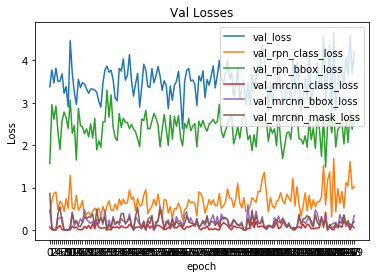

Train Loss 



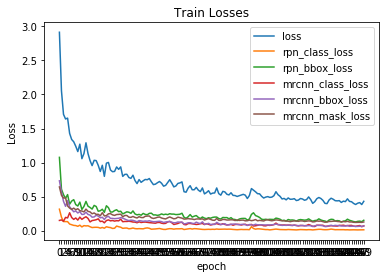

In [15]:
# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.


model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE, 
            epochs=1, 
            layers='heads', augmentation= seq)




Fine tune Resnet stage 4 and up

Starting at epoch 0. LR=0.001

Checkpoint Path: /home/harsh/Mask_RCNN/logs/shapes20190824T0132/mask_rcnn_shapes_{epoch:04d}.h5
Selecting layers to train
res4a_branch2a         (Conv2D)
bn4a_branch2a          (BatchNorm)
res4a_branch2b         (Conv2D)
bn4a_branch2b          (BatchNorm)
res4a_branch2c         (Conv2D)
res4a_branch1          (Conv2D)
bn4a_branch2c          (BatchNorm)
bn4a_branch1           (BatchNorm)
res4b_branch2a         (Conv2D)
bn4b_branch2a          (BatchNorm)
res4b_branch2b         (Conv2D)
bn4b_branch2b          (BatchNorm)
res4b_branch2c         (Conv2D)
bn4b_branch2c          (BatchNorm)
res4c_branch2a         (Conv2D)
bn4c_branch2a          (BatchNorm)
res4c_branch2b         (Conv2D)
bn4c_branch2b          (BatchNorm)
res4c_branch2c         (Conv2D)
bn4c_branch2c          (BatchNorm)
res4d_branch2a         (Conv2D)
bn4d_branch2a          (BatchNorm)
res4d_branch2b         (Conv2D)
bn4d_branch2b          (BatchNorm)
res4d_bran

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 14/100 [===>..........................] - ETA: 37s - loss: 0.3201 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1183 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.0946

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 36s - loss: 0.4868 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.0858 - mrcnn_mask_loss: 0.1174

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 19/100 [====>.........................] - ETA: 35s - loss: 0.4618 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.0801 - mrcnn_mask_loss: 0.1185

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 35s - loss: 0.4487 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1270 - mrcnn_class_loss: 0.0750 - mrcnn_bbox_loss: 0.0773 - mrcnn_mask_loss: 0.1176

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 34s - loss: 0.4349 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1165

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 32s - loss: 0.5909 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.1530

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 29s - loss: 0.7073 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 0.2093 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.1283 - mrcnn_mask_loss: 0.1907

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.5629 - rpn_class_loss: 0.0240 - rpn_bbox_loss: 0.1712 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1040 - mrcnn_mask_loss: 0.1680 - val_loss: 4.2113 - val_rpn_class_loss: 1.5092 - val_rpn_bbox_loss: 2.7021 - val_mrcnn_class_loss: 1.1921e-07 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 3/300
100/100 [==============================] - 48s 483ms/step - loss: 0.4000 - rpn_class_loss: 0.0135 - rpn_bbox_loss: 0.1187 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.0645 - mrcnn_mask_loss: 0.1256 - val_loss: 2.9799 - val_rpn_class_loss: 0.7983 - val_rpn_bbox_loss: 2.1816 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 4/300
 52/100 [==============>...............] - ETA: 20s - loss: 0.3599 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1041 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1324

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 10s - loss: 0.3892 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.1167 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1353

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 6s - loss: 0.4042 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0664 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1387

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.4200 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1431

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.4162 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0681 - mrcnn_bbox_loss: 0.0655 - mrcnn_mask_loss: 0.1418

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.4208 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1427 - val_loss: 3.8318 - val_rpn_class_loss: 0.4791 - val_rpn_bbox_loss: 2.4526 - val_mrcnn_class_loss: 0.0011 - val_mrcnn_bbox_loss: 0.5569 - val_mrcnn_mask_loss: 0.3421
Epoch 5/300
  1/100 [..............................] - ETA: 41s - loss: 0.1923 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0389 - mrcnn_class_loss: 0.0153 - mrcnn_bbox_loss: 0.0173 - mrcnn_mask_loss: 0.1183

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  4/100 [>.............................] - ETA: 41s - loss: 0.2106 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.0189 - mrcnn_mask_loss: 0.1043

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  9/100 [=>............................] - ETA: 39s - loss: 0.4540 - rpn_class_loss: 0.0231 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1226

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 48s 483ms/step - loss: 0.3809 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.1172 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1212 - val_loss: 4.7749 - val_rpn_class_loss: 1.5288 - val_rpn_bbox_loss: 2.8881 - val_mrcnn_class_loss: 0.0954 - val_mrcnn_bbox_loss: 0.1230 - val_mrcnn_mask_loss: 0.1397
Epoch 6/300
 64/100 [==================>...........] - ETA: 15s - loss: 0.3916 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.0966 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1360

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 7s - loss: 0.3757 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.0929 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1343

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 5s - loss: 0.3729 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.0935 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1326

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.3741 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.0946 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1331

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.3730 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.0945 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1327 - val_loss: 3.8441 - val_rpn_class_loss: 0.2919 - val_rpn_bbox_loss: 1.3652 - val_mrcnn_class_loss: 0.3295 - val_mrcnn_bbox_loss: 0.7590 - val_mrcnn_mask_loss: 1.0984
Epoch 7/300
  2/100 [..............................] - ETA: 39s - loss: 0.2818 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0638 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.0846

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  7/100 [=>............................] - ETA: 39s - loss: 0.3869 - rpn_class_loss: 0.0119 - rpn_bbox_loss: 0.0968 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0621 - mrcnn_mask_loss: 0.1328

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 18/100 [====>.........................] - ETA: 35s - loss: 0.3963 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.1096 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1342

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 33s - loss: 0.4137 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.1104 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1385

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.3628 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.1058 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1261 - val_loss: 5.6800 - val_rpn_class_loss: 1.4016 - val_rpn_bbox_loss: 3.4204 - val_mrcnn_class_loss: 0.0814 - val_mrcnn_bbox_loss: 0.4441 - val_mrcnn_mask_loss: 0.3326
Epoch 8/300
100/100 [==============================] - 46s 462ms/step - loss: 0.3599 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.1075 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1249 - val_loss: 3.4272 - val_rpn_class_loss: 0.5224 - val_rpn_bbox_loss: 2.9048 - val_mrcnn_class_loss: 1.1921e-07 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 9/300
100/100 [==============================] - 46s 459ms/step - loss: 0.3256 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.0897 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1165 - val_loss: 3.7542 - val_rp

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 32s - loss: 0.3116 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.0778 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1256

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 31s - loss: 0.3058 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1238

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 25s - loss: 0.2916 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1163

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 45/100 [============>.................] - ETA: 25s - loss: 0.2912 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.0704 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0521 - mrcnn_mask_loss: 0.1157

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 23s - loss: 0.2868 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0509 - mrcnn_mask_loss: 0.1148

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 20s - loss: 0.2879 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.0707 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0505 - mrcnn_mask_loss: 0.1145

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 18s - loss: 0.2904 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0503 - mrcnn_mask_loss: 0.1148

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 48s 477ms/step - loss: 0.3191 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.0850 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1176 - val_loss: 2.9971 - val_rpn_class_loss: 0.6373 - val_rpn_bbox_loss: 2.3598 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 11/300
100/100 [==============================] - 45s 453ms/step - loss: 0.3546 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.1022 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.0517 - mrcnn_mask_loss: 0.1245 - val_loss: 4.0145 - val_rpn_class_loss: 0.6553 - val_rpn_bbox_loss: 3.3591 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 12/300
100/100 [==============================] - 46s 465ms/step - loss: 0.3245 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.0904 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.0509 - mrcnn_mask_loss: 0.1112 - val_loss: 4

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 36s - loss: 0.2557 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.0988

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 32s - loss: 0.2480 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.0632 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0426 - mrcnn_mask_loss: 0.0972

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 32s - loss: 0.2490 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.0632 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.0972

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 29s - loss: 0.2479 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0427 - mrcnn_mask_loss: 0.0951

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 23s - loss: 0.2560 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0432 - mrcnn_mask_loss: 0.0957

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 20s - loss: 0.2620 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.0942

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 15s - loss: 0.2715 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.0977

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 48s 484ms/step - loss: 0.2987 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.0800 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1077 - val_loss: 3.3494 - val_rpn_class_loss: 0.5958 - val_rpn_bbox_loss: 1.5914 - val_mrcnn_class_loss: 0.3570 - val_mrcnn_bbox_loss: 0.3514 - val_mrcnn_mask_loss: 0.4539
Epoch 14/300
 58/100 [================>.............] - ETA: 18s - loss: 0.4316 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0697 - mrcnn_mask_loss: 0.1464

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 14s - loss: 0.4244 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.1231 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.0691 - mrcnn_mask_loss: 0.1446

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 10s - loss: 0.4374 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1463

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 8s - loss: 0.4305 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.1229 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0720 - mrcnn_mask_loss: 0.1438

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.4328 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0727 - mrcnn_mask_loss: 0.1450

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.4284 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.1192 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0715 - mrcnn_mask_loss: 0.1434

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 472ms/step - loss: 0.4282 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.1190 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1435 - val_loss: 5.4316 - val_rpn_class_loss: 1.3409 - val_rpn_bbox_loss: 3.3781 - val_mrcnn_class_loss: 0.1578 - val_mrcnn_bbox_loss: 0.2369 - val_mrcnn_mask_loss: 0.3178
Epoch 15/300
  2/100 [..............................] - ETA: 41s - loss: 0.2993 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.0631 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1173

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 14/100 [===>..........................] - ETA: 36s - loss: 0.3814 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1108 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1378

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 451ms/step - loss: 0.3697 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1325 - val_loss: 2.5646 - val_rpn_class_loss: 0.4696 - val_rpn_bbox_loss: 2.0950 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 16/300
100/100 [==============================] - 47s 473ms/step - loss: 0.3420 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1266 - val_loss: 2.8641 - val_rpn_class_loss: 0.4245 - val_rpn_bbox_loss: 2.3722 - val_mrcnn_class_loss: 0.0139 - val_mrcnn_bbox_loss: 0.0317 - val_mrcnn_mask_loss: 0.0218
Epoch 17/300
 61/100 [=================>............] - ETA: 16s - loss: 0.3380 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.0977 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.0474 - mrcnn_mask_loss: 0.1206

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.3274 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.0911 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1194

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 4s - loss: 0.3124 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.0865 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.0440 - mrcnn_mask_loss: 0.1171

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.3078 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.0853 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.0433 - mrcnn_mask_loss: 0.1158

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.3102 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.0867 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1167 - val_loss: 4.3998 - val_rpn_class_loss: 1.0710 - val_rpn_bbox_loss: 3.1821 - val_mrcnn_class_loss: 0.0171 - val_mrcnn_bbox_loss: 0.0742 - val_mrcnn_mask_loss: 0.0556
Epoch 18/300
  1/100 [..............................] - ETA: 39s - loss: 0.2941 - rpn_class_loss: 7.0104e-04 - rpn_bbox_loss: 0.0526 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.0357 - mrcnn_mask_loss: 0.0989

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  3/100 [..............................] - ETA: 40s - loss: 0.2379 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0270 - mrcnn_mask_loss: 0.1050    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 14/100 [===>..........................] - ETA: 37s - loss: 0.2877 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0888 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0434 - mrcnn_mask_loss: 0.1188

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 32s - loss: 0.2722 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0388 - mrcnn_mask_loss: 0.1127

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 7s - loss: 0.2977 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0777 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.1195

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 5s - loss: 0.2988 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.0441 - mrcnn_mask_loss: 0.1199

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.3021 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.0815 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.1183 - val_loss: 4.4808 - val_rpn_class_loss: 0.7918 - val_rpn_bbox_loss: 2.8387 - val_mrcnn_class_loss: 0.1727 - val_mrcnn_bbox_loss: 0.3335 - val_mrcnn_mask_loss: 0.3442
Epoch 19/300
 10/100 [==>...........................] - ETA: 38s - loss: 0.3610 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.0927 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1222

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 16/100 [===>..........................] - ETA: 36s - loss: 0.3216 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.0859 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1149

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 34s - loss: 0.3105 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.0867 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.0426 - mrcnn_mask_loss: 0.1123

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 31s - loss: 0.2971 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.0809 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.0418 - mrcnn_mask_loss: 0.1086

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 29s - loss: 0.3121 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.0834 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1097

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 25s - loss: 0.3066 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.0817 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.0465 - mrcnn_mask_loss: 0.1081

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 49s 486ms/step - loss: 0.2959 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1070 - val_loss: 2.8284 - val_rpn_class_loss: 0.3227 - val_rpn_bbox_loss: 1.7409 - val_mrcnn_class_loss: 0.2540 - val_mrcnn_bbox_loss: 0.2053 - val_mrcnn_mask_loss: 0.3054
Epoch 20/300
100/100 [==============================] - 45s 449ms/step - loss: 0.3148 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0814 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.0511 - mrcnn_mask_loss: 0.1141 - val_loss: 3.7037 - val_rpn_class_loss: 0.7309 - val_rpn_bbox_loss: 2.2064 - val_mrcnn_class_loss: 0.2585 - val_mrcnn_bbox_loss: 0.2365 - val_mrcnn_mask_loss: 0.2714
Epoch 21/300
100/100 [==============================] - 46s 458ms/step - loss: 0.2626 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0388 - mrcnn_mask_loss: 0.0955 - val_loss: 3.9865 - val_rpn_class_lo

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 33s - loss: 0.2933 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.0617 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.0516 - mrcnn_mask_loss: 0.1199

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 26s - loss: 0.2598 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0431 - mrcnn_mask_loss: 0.1096

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 18s - loss: 0.2667 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0624 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0440 - mrcnn_mask_loss: 0.1092

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 60/100 [=================>............] - ETA: 17s - loss: 0.2640 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0429 - mrcnn_mask_loss: 0.1085

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 12s - loss: 0.2526 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0421 - mrcnn_mask_loss: 0.1039

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 8s - loss: 0.2543 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0425 - mrcnn_mask_loss: 0.1035

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.2520 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0418 - mrcnn_mask_loss: 0.1030

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.2493 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0613 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0404 - mrcnn_mask_loss: 0.1003 - val_loss: 3.7309 - val_rpn_class_loss: 0.5785 - val_rpn_bbox_loss: 2.4884 - val_mrcnn_class_loss: 0.1642 - val_mrcnn_bbox_loss: 0.2408 - val_mrcnn_mask_loss: 0.2589
Epoch 24/300
100/100 [==============================] - 49s 491ms/step - loss: 0.3169 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.0975 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1167 - val_loss: 3.6463 - val_rpn_class_loss: 0.4611 - val_rpn_bbox_loss: 1.8133 - val_mrcnn_class_loss: 0.1146 - val_mrcnn_bbox_loss: 0.4464 - val_mrcnn_mask_loss: 0.8109
Epoch 25/300
  7/100 [=>............................] - ETA: 39s - loss: 0.5688 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1899 - mrcnn_class_loss: 0.1321 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1692

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 36s - loss: 0.4586 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1469

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 27s - loss: 0.4030 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1179 - mrcnn_class_loss: 0.0891 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1360

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 21s - loss: 0.3760 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1131 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0508 - mrcnn_mask_loss: 0.1280

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 19s - loss: 0.3742 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1157 - mrcnn_class_loss: 0.0753 - mrcnn_bbox_loss: 0.0518 - mrcnn_mask_loss: 0.1274

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 15s - loss: 0.3647 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1102 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.0510 - mrcnn_mask_loss: 0.1255

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 9s - loss: 0.3629 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1102 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.0508 - mrcnn_mask_loss: 0.1234

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 2s - loss: 0.3547 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1112 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1209

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 466ms/step - loss: 0.3488 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1098 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1196 - val_loss: 2.4158 - val_rpn_class_loss: 0.4689 - val_rpn_bbox_loss: 1.5484 - val_mrcnn_class_loss: 0.1194 - val_mrcnn_bbox_loss: 0.1375 - val_mrcnn_mask_loss: 0.1415
Epoch 26/300
 82/100 [=======================>......] - ETA: 7s - loss: 0.3101 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1232

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.3009 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0467 - mrcnn_mask_loss: 0.1228

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.2958 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1217 - val_loss: 3.2795 - val_rpn_class_loss: 0.6637 - val_rpn_bbox_loss: 1.8948 - val_mrcnn_class_loss: 0.2129 - val_mrcnn_bbox_loss: 0.2713 - val_mrcnn_mask_loss: 0.2368
Epoch 27/300
 15/100 [===>..........................] - ETA: 36s - loss: 0.2525 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.0332 - mrcnn_mask_loss: 0.1046

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 29s - loss: 0.2521 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0694 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0343 - mrcnn_mask_loss: 0.1038

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 27s - loss: 0.2498 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0340 - mrcnn_mask_loss: 0.1053

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 22s - loss: 0.2510 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0341 - mrcnn_mask_loss: 0.1039

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.2581 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0696 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0351 - mrcnn_mask_loss: 0.1058

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 10s - loss: 0.2713 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0394 - mrcnn_mask_loss: 0.1087

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.2736 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0399 - mrcnn_mask_loss: 0.1098 - val_loss: 4.8343 - val_rpn_class_loss: 1.2737 - val_rpn_bbox_loss: 3.1087 - val_mrcnn_class_loss: 0.1743 - val_mrcnn_bbox_loss: 0.1328 - val_mrcnn_mask_loss: 0.1448
Epoch 28/300
100/100 [==============================] - 48s 479ms/step - loss: 0.2927 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1160 - val_loss: 4.2170 - val_rpn_class_loss: 1.0616 - val_rpn_bbox_loss: 3.0969 - val_mrcnn_class_loss: 0.0156 - val_mrcnn_bbox_loss: 0.0248 - val_mrcnn_mask_loss: 0.0181
Epoch 29/300
100/100 [==============================] - 46s 461ms/step - loss: 0.3374 - rpn_class_loss: 0.0197 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.0419 - mrcnn_mask_loss: 0.1157 - val_loss: 4.3074 - val_rpn_class_lo

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 20s - loss: 0.2690 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1070

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 14s - loss: 0.2674 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1069

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.2795 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1089

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 5s - loss: 0.2855 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.0829 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1104

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 48s 483ms/step - loss: 0.2839 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.0821 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1104 - val_loss: 4.7157 - val_rpn_class_loss: 1.0323 - val_rpn_bbox_loss: 3.1639 - val_mrcnn_class_loss: 0.0422 - val_mrcnn_bbox_loss: 0.3217 - val_mrcnn_mask_loss: 0.1557


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 31/300
  5/100 [>.............................] - ETA: 41s - loss: 0.2498 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0511 - mrcnn_mask_loss: 0.0970

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 36s - loss: 0.3387 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0956 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1284

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 455ms/step - loss: 0.2928 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0772 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1155 - val_loss: 4.1092 - val_rpn_class_loss: 0.8572 - val_rpn_bbox_loss: 2.5911 - val_mrcnn_class_loss: 0.0336 - val_mrcnn_bbox_loss: 0.2954 - val_mrcnn_mask_loss: 0.3319
Epoch 32/300
100/100 [==============================] - 49s 490ms/step - loss: 0.2269 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0556 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0385 - mrcnn_mask_loss: 0.0965 - val_loss: 4.0855 - val_rpn_class_loss: 1.0592 - val_rpn_bbox_loss: 2.6776 - val_mrcnn_class_loss: 0.0728 - val_mrcnn_bbox_loss: 0.1071 - val_mrcnn_mask_loss: 0.1688
Epoch 33/300
100/100 [==============================] - 47s 470ms/step - loss: 0.3064 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.0894 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1163 - val_loss: 3.1036 - val_rpn_class_lo

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.2844 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0395 - mrcnn_mask_loss: 0.1152

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.2821 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0400 - mrcnn_mask_loss: 0.1127 - val_loss: 3.8561 - val_rpn_class_loss: 0.5970 - val_rpn_bbox_loss: 1.7545 - val_mrcnn_class_loss: 0.1528 - val_mrcnn_bbox_loss: 0.3748 - val_mrcnn_mask_loss: 0.9771
Epoch 35/300
 18/100 [====>.........................] - ETA: 35s - loss: 0.2239 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0710 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0310 - mrcnn_mask_loss: 0.0889

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 27s - loss: 0.2383 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0672 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0346 - mrcnn_mask_loss: 0.0968

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 22s - loss: 0.2316 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0628 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0330 - mrcnn_mask_loss: 0.0953

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 20s - loss: 0.2261 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0613 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0320 - mrcnn_mask_loss: 0.0937

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 19s - loss: 0.2234 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0314 - mrcnn_mask_loss: 0.0934

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.2245 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0616 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0310 - mrcnn_mask_loss: 0.0929

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 474ms/step - loss: 0.2240 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0585 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0318 - mrcnn_mask_loss: 0.0937 - val_loss: 3.8898 - val_rpn_class_loss: 0.7294 - val_rpn_bbox_loss: 2.1024 - val_mrcnn_class_loss: 0.1367 - val_mrcnn_bbox_loss: 0.2769 - val_mrcnn_mask_loss: 0.6445
Epoch 36/300
 79/100 [======================>.......] - ETA: 9s - loss: 0.2338 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0353 - mrcnn_mask_loss: 0.0967

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.2596 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0394 - mrcnn_mask_loss: 0.1052 - val_loss: 4.0465 - val_rpn_class_loss: 0.9972 - val_rpn_bbox_loss: 2.5476 - val_mrcnn_class_loss: 0.1282 - val_mrcnn_bbox_loss: 0.1480 - val_mrcnn_mask_loss: 0.2255
Epoch 37/300
 13/100 [==>...........................] - ETA: 38s - loss: 0.1917 - rpn_class_loss: 9.3830e-04 - rpn_bbox_loss: 0.0397 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.0246 - mrcnn_mask_loss: 0.0887

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 29s - loss: 0.2436 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.0345 - mrcnn_mask_loss: 0.0986

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 22s - loss: 0.2502 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0345 - mrcnn_mask_loss: 0.1021

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 15s - loss: 0.2528 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0614 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0347 - mrcnn_mask_loss: 0.1036

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 13s - loss: 0.2508 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0347 - mrcnn_mask_loss: 0.1029

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 8s - loss: 0.2542 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0357 - mrcnn_mask_loss: 0.1015

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 6s - loss: 0.2536 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0631 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0361 - mrcnn_mask_loss: 0.1016

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.2543 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0634 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0365 - mrcnn_mask_loss: 0.1014 - val_loss: 3.3406 - val_rpn_class_loss: 0.6622 - val_rpn_bbox_loss: 2.1165 - val_mrcnn_class_loss: 0.1468 - val_mrcnn_bbox_loss: 0.1707 - val_mrcnn_mask_loss: 0.2443
Epoch 38/300
 20/100 [=====>........................] - ETA: 34s - loss: 0.2363 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0586 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.0294 - mrcnn_mask_loss: 0.0954

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 18s - loss: 0.2291 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0550 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0304 - mrcnn_mask_loss: 0.0983

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 10s - loss: 0.2276 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0531 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0309 - mrcnn_mask_loss: 0.0995

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.2266 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0541 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0307 - mrcnn_mask_loss: 0.0994

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.2265 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0552 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0308 - mrcnn_mask_loss: 0.0982 - val_loss: 4.5728 - val_rpn_class_loss: 1.3961 - val_rpn_bbox_loss: 2.6765 - val_mrcnn_class_loss: 0.1455 - val_mrcnn_bbox_loss: 0.1387 - val_mrcnn_mask_loss: 0.2160
Epoch 39/300
  5/100 [>.............................] - ETA: 39s - loss: 0.3497 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.0959 - mrcnn_class_loss: 0.0743 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1262

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 13/100 [==>...........................] - ETA: 38s - loss: 0.2437 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0308 - mrcnn_mask_loss: 0.0989

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 35s - loss: 0.2195 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0586 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0282 - mrcnn_mask_loss: 0.0917

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 33s - loss: 0.2228 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0283 - mrcnn_mask_loss: 0.0926

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 474ms/step - loss: 0.2452 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0355 - mrcnn_mask_loss: 0.0987 - val_loss: 4.6248 - val_rpn_class_loss: 1.4115 - val_rpn_bbox_loss: 2.6423 - val_mrcnn_class_loss: 0.1644 - val_mrcnn_bbox_loss: 0.1750 - val_mrcnn_mask_loss: 0.2316
Epoch 40/300
100/100 [==============================] - 46s 458ms/step - loss: 0.2364 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0518 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0352 - mrcnn_mask_loss: 0.1035 - val_loss: 4.4265 - val_rpn_class_loss: 1.0941 - val_rpn_bbox_loss: 2.3312 - val_mrcnn_class_loss: 0.2198 - val_mrcnn_bbox_loss: 0.2956 - val_mrcnn_mask_loss: 0.4858
Epoch 41/300
 85/100 [========================>.....] - ETA: 6s - loss: 0.2105 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0455 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0294 - mrcnn_mask_loss: 0.0947

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 466ms/step - loss: 0.2064 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0283 - mrcnn_mask_loss: 0.0933 - val_loss: 3.7800 - val_rpn_class_loss: 0.8881 - val_rpn_bbox_loss: 2.2672 - val_mrcnn_class_loss: 0.1476 - val_mrcnn_bbox_loss: 0.1825 - val_mrcnn_mask_loss: 0.2946
Epoch 42/300
 22/100 [=====>........................] - ETA: 33s - loss: 0.3024 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.0430 - mrcnn_mask_loss: 0.1173

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 24s - loss: 0.2776 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0710 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.0396 - mrcnn_mask_loss: 0.1097

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 12s - loss: 0.2596 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0364 - mrcnn_mask_loss: 0.1077

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 10s - loss: 0.2613 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0366 - mrcnn_mask_loss: 0.1085

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 7s - loss: 0.2632 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0371 - mrcnn_mask_loss: 0.1083

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 5s - loss: 0.2618 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0363 - mrcnn_mask_loss: 0.1083

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.2640 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0373 - mrcnn_mask_loss: 0.1088

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.2617 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0370 - mrcnn_mask_loss: 0.1084 - val_loss: 3.1565 - val_rpn_class_loss: 0.7470 - val_rpn_bbox_loss: 2.1721 - val_mrcnn_class_loss: 0.0386 - val_mrcnn_bbox_loss: 0.0609 - val_mrcnn_mask_loss: 0.1378
Epoch 43/300
  8/100 [=>............................] - ETA: 39s - loss: 0.2550 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0394 - mrcnn_mask_loss: 0.0990

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 23s - loss: 0.2389 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0350 - mrcnn_mask_loss: 0.1116

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 15s - loss: 0.2497 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0354 - mrcnn_mask_loss: 0.1131

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.2502 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0579 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0353 - mrcnn_mask_loss: 0.1114

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 6s - loss: 0.2675 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0350 - mrcnn_mask_loss: 0.1109

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 472ms/step - loss: 0.2700 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0361 - mrcnn_mask_loss: 0.1131 - val_loss: 3.9172 - val_rpn_class_loss: 0.9244 - val_rpn_bbox_loss: 2.5621 - val_mrcnn_class_loss: 0.0363 - val_mrcnn_bbox_loss: 0.2462 - val_mrcnn_mask_loss: 0.1481
Epoch 44/300
  1/100 [..............................] - ETA: 43s - loss: 0.1275 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0184 - mrcnn_class_loss: 0.0216 - mrcnn_bbox_loss: 0.0116 - mrcnn_mask_loss: 0.0744

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  5/100 [>.............................] - ETA: 41s - loss: 0.2080 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0205 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0972

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 35s - loss: 0.2801 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0818 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0399 - mrcnn_mask_loss: 0.1134

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 48s 478ms/step - loss: 0.2855 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.0828 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0403 - mrcnn_mask_loss: 0.1084 - val_loss: 3.6495 - val_rpn_class_loss: 0.5665 - val_rpn_bbox_loss: 1.8054 - val_mrcnn_class_loss: 0.0762 - val_mrcnn_bbox_loss: 0.2844 - val_mrcnn_mask_loss: 0.9171
Epoch 45/300
100/100 [==============================] - 45s 453ms/step - loss: 0.2888 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.0400 - mrcnn_mask_loss: 0.1165 - val_loss: 3.2019 - val_rpn_class_loss: 0.6322 - val_rpn_bbox_loss: 1.9990 - val_mrcnn_class_loss: 0.0955 - val_mrcnn_bbox_loss: 0.1733 - val_mrcnn_mask_loss: 0.3019
Epoch 46/300
 92/100 [==========================>...] - ETA: 3s - loss: 0.2187 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0350 - mrcnn_mask_loss: 0.0928

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.2268 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0551 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.0359 - mrcnn_mask_loss: 0.0955 - val_loss: 3.5824 - val_rpn_class_loss: 0.7995 - val_rpn_bbox_loss: 2.1713 - val_mrcnn_class_loss: 0.1877 - val_mrcnn_bbox_loss: 0.1611 - val_mrcnn_mask_loss: 0.2627
Epoch 47/300
 24/100 [======>.......................] - ETA: 33s - loss: 0.2161 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0588 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0287 - mrcnn_mask_loss: 0.0953

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 20s - loss: 0.2123 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0560 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0280 - mrcnn_mask_loss: 0.0933

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.2250 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0305 - mrcnn_mask_loss: 0.0960

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 8s - loss: 0.2391 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0315 - mrcnn_mask_loss: 0.0978

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 464ms/step - loss: 0.2397 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0320 - mrcnn_mask_loss: 0.0979 - val_loss: 3.7850 - val_rpn_class_loss: 0.8896 - val_rpn_bbox_loss: 2.0661 - val_mrcnn_class_loss: 0.2289 - val_mrcnn_bbox_loss: 0.2097 - val_mrcnn_mask_loss: 0.3906
Epoch 48/300
  2/100 [..............................] - ETA: 40s - loss: 0.3535 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.0957    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  7/100 [=>............................] - ETA: 40s - loss: 0.2558 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0942 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0353 - mrcnn_mask_loss: 0.0879

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 12/100 [==>...........................] - ETA: 38s - loss: 0.3150 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0462 - mrcnn_mask_loss: 0.1132

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 470ms/step - loss: 0.2656 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0408 - mrcnn_mask_loss: 0.1019 - val_loss: 3.3122 - val_rpn_class_loss: 0.7435 - val_rpn_bbox_loss: 2.3785 - val_mrcnn_class_loss: 0.0589 - val_mrcnn_bbox_loss: 0.0550 - val_mrcnn_mask_loss: 0.0763
Epoch 49/300
 47/100 [=============>................] - ETA: 23s - loss: 0.2429 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0628 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0324 - mrcnn_mask_loss: 0.1012

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 10s - loss: 0.2329 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0322 - mrcnn_mask_loss: 0.0998

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 472ms/step - loss: 0.2294 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0544 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0318 - mrcnn_mask_loss: 0.0993 - val_loss: 4.0195 - val_rpn_class_loss: 1.1146 - val_rpn_bbox_loss: 2.5395 - val_mrcnn_class_loss: 0.1165 - val_mrcnn_bbox_loss: 0.1215 - val_mrcnn_mask_loss: 0.1274


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 50/300
 29/100 [=======>......................] - ETA: 31s - loss: 0.2323 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0359 - mrcnn_mask_loss: 0.1013

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 26s - loss: 0.2141 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0483 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0328 - mrcnn_mask_loss: 0.0932

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 22s - loss: 0.2304 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0519 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0357 - mrcnn_mask_loss: 0.0970

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 18s - loss: 0.2488 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0392 - mrcnn_mask_loss: 0.1026

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 13s - loss: 0.2449 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0564 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0381 - mrcnn_mask_loss: 0.0999

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.2471 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0549 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0382 - mrcnn_mask_loss: 0.1025 - val_loss: 3.2632 - val_rpn_class_loss: 0.7282 - val_rpn_bbox_loss: 2.2068 - val_mrcnn_class_loss: 0.1040 - val_mrcnn_bbox_loss: 0.1175 - val_mrcnn_mask_loss: 0.1068
Epoch 51/300
100/100 [==============================] - 45s 451ms/step - loss: 0.2350 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0337 - mrcnn_mask_loss: 0.1019 - val_loss: 3.7295 - val_rpn_class_loss: 0.9280 - val_rpn_bbox_loss: 2.2259 - val_mrcnn_class_loss: 0.1801 - val_mrcnn_bbox_loss: 0.1863 - val_mrcnn_mask_loss: 0.2092
Epoch 52/300
100/100 [==============================] - 45s 451ms/step - loss: 0.2028 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0268 - mrcnn_mask_loss: 0.0915 - val_loss: 4.1247 - val_rpn_class_lo

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 3s - loss: 0.2046 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0291 - mrcnn_mask_loss: 0.0908

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 468ms/step - loss: 0.2011 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0465 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0282 - mrcnn_mask_loss: 0.0896 - val_loss: 3.9067 - val_rpn_class_loss: 0.5868 - val_rpn_bbox_loss: 2.3846 - val_mrcnn_class_loss: 0.2604 - val_mrcnn_bbox_loss: 0.2351 - val_mrcnn_mask_loss: 0.4398
Epoch 54/300
 15/100 [===>..........................] - ETA: 39s - loss: 0.2383 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0560 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.0315 - mrcnn_mask_loss: 0.0949

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 28s - loss: 0.2323 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0303 - mrcnn_mask_loss: 0.0946

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 27s - loss: 0.2247 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0293 - mrcnn_mask_loss: 0.0924

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 22s - loss: 0.2318 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0303 - mrcnn_mask_loss: 0.0951

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 15s - loss: 0.2274 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0292 - mrcnn_mask_loss: 0.0942

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 14s - loss: 0.2325 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0302 - mrcnn_mask_loss: 0.0964

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.2311 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0300 - mrcnn_mask_loss: 0.0959

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 4s - loss: 0.2487 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0673 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0318 - mrcnn_mask_loss: 0.0985

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.2501 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0672 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0323 - mrcnn_mask_loss: 0.0996

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 470ms/step - loss: 0.2521 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0325 - mrcnn_mask_loss: 0.1005 - val_loss: 3.7849 - val_rpn_class_loss: 0.9998 - val_rpn_bbox_loss: 2.2833 - val_mrcnn_class_loss: 0.2216 - val_mrcnn_bbox_loss: 0.1308 - val_mrcnn_mask_loss: 0.1494
Epoch 55/300
 19/100 [====>.........................] - ETA: 34s - loss: 0.2750 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0693 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0392 - mrcnn_mask_loss: 0.1109

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 29s - loss: 0.2698 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.0374 - mrcnn_mask_loss: 0.1084

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 23s - loss: 0.2497 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0347 - mrcnn_mask_loss: 0.1035

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 19s - loss: 0.2482 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0588 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0343 - mrcnn_mask_loss: 0.1022

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 10s - loss: 0.2593 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0362 - mrcnn_mask_loss: 0.1079

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.2569 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.0365 - mrcnn_mask_loss: 0.1075 - val_loss: 3.6468 - val_rpn_class_loss: 0.7730 - val_rpn_bbox_loss: 2.2425 - val_mrcnn_class_loss: 0.0686 - val_mrcnn_bbox_loss: 0.2121 - val_mrcnn_mask_loss: 0.3507
Epoch 56/300
 70/100 [====================>.........] - ETA: 13s - loss: 0.2477 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.0356 - mrcnn_mask_loss: 0.1081

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.2473 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0560 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0350 - mrcnn_mask_loss: 0.1065 - val_loss: 3.9573 - val_rpn_class_loss: 0.9185 - val_rpn_bbox_loss: 2.2391 - val_mrcnn_class_loss: 0.1920 - val_mrcnn_bbox_loss: 0.3245 - val_mrcnn_mask_loss: 0.2832
Epoch 57/300
 10/100 [==>...........................] - ETA: 37s - loss: 0.2475 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0536 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0342 - mrcnn_mask_loss: 0.1143

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 29s - loss: 0.2384 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0303 - mrcnn_mask_loss: 0.1053

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 22s - loss: 0.2408 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0588 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0324 - mrcnn_mask_loss: 0.1074

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 12s - loss: 0.2355 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0302 - mrcnn_mask_loss: 0.1026

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.2382 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0631 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0307 - mrcnn_mask_loss: 0.1026

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.2357 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0626 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0303 - mrcnn_mask_loss: 0.1020

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 452ms/step - loss: 0.2351 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0623 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0302 - mrcnn_mask_loss: 0.1020 - val_loss: 3.9251 - val_rpn_class_loss: 0.9479 - val_rpn_bbox_loss: 2.4343 - val_mrcnn_class_loss: 0.0493 - val_mrcnn_bbox_loss: 0.1255 - val_mrcnn_mask_loss: 0.3681
Epoch 58/300
 19/100 [====>.........................] - ETA: 34s - loss: 0.2253 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0635 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0255 - mrcnn_mask_loss: 0.0974

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.2250 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0626 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0301 - mrcnn_mask_loss: 0.0927 - val_loss: 3.9395 - val_rpn_class_loss: 0.9842 - val_rpn_bbox_loss: 2.5130 - val_mrcnn_class_loss: 0.0521 - val_mrcnn_bbox_loss: 0.1409 - val_mrcnn_mask_loss: 0.2493
Epoch 59/300
100/100 [==============================] - 48s 485ms/step - loss: 0.2512 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0349 - mrcnn_mask_loss: 0.1005 - val_loss: 4.0276 - val_rpn_class_loss: 0.7012 - val_rpn_bbox_loss: 2.4170 - val_mrcnn_class_loss: 0.1314 - val_mrcnn_bbox_loss: 0.3919 - val_mrcnn_mask_loss: 0.3861
Epoch 60/300
  4/100 [>.............................] - ETA: 41s - loss: 0.2332 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0216 - mrcnn_bbox_loss: 0.0309 - mrcnn_mask_loss: 0.1045  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 35s - loss: 0.2636 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0372 - mrcnn_mask_loss: 0.1074

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 25s - loss: 0.2823 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0390 - mrcnn_mask_loss: 0.1134

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 17s - loss: 0.2801 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0375 - mrcnn_mask_loss: 0.1124

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 11s - loss: 0.2757 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0767 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0373 - mrcnn_mask_loss: 0.1117

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.2733 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0366 - mrcnn_mask_loss: 0.1097

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 48s 483ms/step - loss: 0.2700 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0364 - mrcnn_mask_loss: 0.1071 - val_loss: 4.3588 - val_rpn_class_loss: 0.7790 - val_rpn_bbox_loss: 2.4424 - val_mrcnn_class_loss: 0.2212 - val_mrcnn_bbox_loss: 0.4369 - val_mrcnn_mask_loss: 0.4793
Epoch 61/300
  4/100 [>.............................] - ETA: 40s - loss: 0.1679 - rpn_class_loss: 6.4170e-04 - rpn_bbox_loss: 0.0482 - mrcnn_class_loss: 0.0161 - mrcnn_bbox_loss: 0.0165 - mrcnn_mask_loss: 0.0864

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 19/100 [====>.........................] - ETA: 34s - loss: 0.2585 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0332 - mrcnn_mask_loss: 0.1031

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 447ms/step - loss: 0.2544 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0619 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0339 - mrcnn_mask_loss: 0.1038 - val_loss: 4.4638 - val_rpn_class_loss: 1.0618 - val_rpn_bbox_loss: 2.6564 - val_mrcnn_class_loss: 0.1066 - val_mrcnn_bbox_loss: 0.2872 - val_mrcnn_mask_loss: 0.3518
Epoch 62/300
100/100 [==============================] - 45s 451ms/step - loss: 0.2099 - rpn_class_loss: 8.1906e-04 - rpn_bbox_loss: 0.0564 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0290 - mrcnn_mask_loss: 0.0898 - val_loss: 4.3099 - val_rpn_class_loss: 1.0906 - val_rpn_bbox_loss: 2.5781 - val_mrcnn_class_loss: 0.1526 - val_mrcnn_bbox_loss: 0.2517 - val_mrcnn_mask_loss: 0.2368
Epoch 63/300
100/100 [==============================] - 46s 456ms/step - loss: 0.2293 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0578 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0347 - mrcnn_mask_loss: 0.1000 - val_loss: 4.1821 - val_rpn_clas

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 19s - loss: 0.2147 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0305 - mrcnn_mask_loss: 0.0998

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 12s - loss: 0.2087 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0431 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0290 - mrcnn_mask_loss: 0.0984

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 10s - loss: 0.2082 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0428 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0288 - mrcnn_mask_loss: 0.0977

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.2137 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0290 - mrcnn_mask_loss: 0.0982

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.2122 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0290 - mrcnn_mask_loss: 0.0979

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 467ms/step - loss: 0.2153 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0294 - mrcnn_mask_loss: 0.0990 - val_loss: 3.7596 - val_rpn_class_loss: 0.7600 - val_rpn_bbox_loss: 2.1551 - val_mrcnn_class_loss: 0.1376 - val_mrcnn_bbox_loss: 0.2447 - val_mrcnn_mask_loss: 0.4623
Epoch 65/300
 29/100 [=======>......................] - ETA: 30s - loss: 0.2437 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0395 - mrcnn_mask_loss: 0.1001

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 27s - loss: 0.2509 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.0387 - mrcnn_mask_loss: 0.1026

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 25s - loss: 0.2464 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0376 - mrcnn_mask_loss: 0.1019

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 22s - loss: 0.2471 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.0370 - mrcnn_mask_loss: 0.1015

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 21s - loss: 0.2430 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0364 - mrcnn_mask_loss: 0.1003

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 19s - loss: 0.2390 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0358 - mrcnn_mask_loss: 0.0981

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 13s - loss: 0.2492 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0559 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.0365 - mrcnn_mask_loss: 0.1010

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 11s - loss: 0.2488 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0361 - mrcnn_mask_loss: 0.1013

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 10s - loss: 0.2463 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0561 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0357 - mrcnn_mask_loss: 0.1007

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 7s - loss: 0.2435 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0546 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.0355 - mrcnn_mask_loss: 0.1002

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.2354 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0336 - mrcnn_mask_loss: 0.0984 - val_loss: 3.6543 - val_rpn_class_loss: 0.7664 - val_rpn_bbox_loss: 2.0619 - val_mrcnn_class_loss: 0.0893 - val_mrcnn_bbox_loss: 0.2348 - val_mrcnn_mask_loss: 0.5019
Epoch 66/300
100/100 [==============================] - 46s 460ms/step - loss: 0.2147 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0278 - mrcnn_mask_loss: 0.0898 - val_loss: 3.6912 - val_rpn_class_loss: 0.7919 - val_rpn_bbox_loss: 2.1183 - val_mrcnn_class_loss: 0.1390 - val_mrcnn_bbox_loss: 0.3618 - val_mrcnn_mask_loss: 0.2802
Epoch 67/300
100/100 [==============================] - 46s 461ms/step - loss: 0.2124 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.0270 - mrcnn_mask_loss: 0.0920 - val_loss: 3.5841 - val_rpn_class_lo

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 26s - loss: 0.1767 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0374 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0251 - mrcnn_mask_loss: 0.0825

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 17s - loss: 0.1853 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0415 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0252 - mrcnn_mask_loss: 0.0851

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.1889 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0429 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0260 - mrcnn_mask_loss: 0.0853

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1895 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0432 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0260 - mrcnn_mask_loss: 0.0856 - val_loss: 3.8368 - val_rpn_class_loss: 0.9240 - val_rpn_bbox_loss: 2.3852 - val_mrcnn_class_loss: 0.1276 - val_mrcnn_bbox_loss: 0.2027 - val_mrcnn_mask_loss: 0.1973
Epoch 69/300
 18/100 [====>.........................] - ETA: 36s - loss: 0.1943 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0422 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0278 - mrcnn_mask_loss: 0.0921

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 31s - loss: 0.2010 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0411 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0283 - mrcnn_mask_loss: 0.0953

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 25s - loss: 0.1998 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0413 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0281 - mrcnn_mask_loss: 0.0937

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 23s - loss: 0.1967 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0393 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0275 - mrcnn_mask_loss: 0.0919

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 473ms/step - loss: 0.2003 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0449 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0269 - mrcnn_mask_loss: 0.0935 - val_loss: 3.5687 - val_rpn_class_loss: 0.6021 - val_rpn_bbox_loss: 2.2340 - val_mrcnn_class_loss: 0.1305 - val_mrcnn_bbox_loss: 0.3368 - val_mrcnn_mask_loss: 0.2653
Epoch 70/300
 48/100 [=============>................] - ETA: 23s - loss: 0.2649 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0540 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0406 - mrcnn_mask_loss: 0.1159

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 13s - loss: 0.2494 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0377 - mrcnn_mask_loss: 0.1102

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 7s - loss: 0.2431 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0362 - mrcnn_mask_loss: 0.1076

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.2347 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0483 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0339 - mrcnn_mask_loss: 0.1039 - val_loss: 3.5108 - val_rpn_class_loss: 0.9582 - val_rpn_bbox_loss: 2.1135 - val_mrcnn_class_loss: 0.1324 - val_mrcnn_bbox_loss: 0.1272 - val_mrcnn_mask_loss: 0.1796
Epoch 71/300
 21/100 [=====>........................] - ETA: 33s - loss: 0.2110 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0536 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0295 - mrcnn_mask_loss: 0.0920

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 33s - loss: 0.2135 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0534 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0299 - mrcnn_mask_loss: 0.0929

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 45/100 [============>.................] - ETA: 23s - loss: 0.2277 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0579 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0337 - mrcnn_mask_loss: 0.0930

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 14s - loss: 0.2150 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0520 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.0325 - mrcnn_mask_loss: 0.0907

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 12s - loss: 0.2084 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0315 - mrcnn_mask_loss: 0.0885

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.1978 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0465 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0286 - mrcnn_mask_loss: 0.0861 - val_loss: 3.6784 - val_rpn_class_loss: 1.0438 - val_rpn_bbox_loss: 2.0698 - val_mrcnn_class_loss: 0.2062 - val_mrcnn_bbox_loss: 0.1263 - val_mrcnn_mask_loss: 0.2324
Epoch 72/300
100/100 [==============================] - 46s 459ms/step - loss: 0.1854 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0412 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0228 - mrcnn_mask_loss: 0.0845 - val_loss: 3.9581 - val_rpn_class_loss: 0.8479 - val_rpn_bbox_loss: 1.9938 - val_mrcnn_class_loss: 0.3054 - val_mrcnn_bbox_loss: 0.2342 - val_mrcnn_mask_loss: 0.5769
Epoch 73/300
 70/100 [====================>.........] - ETA: 13s - loss: 0.1997 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0448 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0263 - mrcnn_mask_loss: 0.0905

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 9s - loss: 0.1992 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0433 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0258 - mrcnn_mask_loss: 0.0912

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 2s - loss: 0.2006 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0431 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0262 - mrcnn_mask_loss: 0.0913

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 471ms/step - loss: 0.2009 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0265 - mrcnn_mask_loss: 0.0905 - val_loss: 3.3207 - val_rpn_class_loss: 0.6003 - val_rpn_bbox_loss: 2.0556 - val_mrcnn_class_loss: 0.0782 - val_mrcnn_bbox_loss: 0.3235 - val_mrcnn_mask_loss: 0.2631
Epoch 74/300
 32/100 [========>.....................] - ETA: 30s - loss: 0.2220 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0564 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0277 - mrcnn_mask_loss: 0.0917

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 27s - loss: 0.2299 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0277 - mrcnn_mask_loss: 0.0939

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 16s - loss: 0.2366 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0297 - mrcnn_mask_loss: 0.0974

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 10s - loss: 0.2360 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0297 - mrcnn_mask_loss: 0.0975

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 7s - loss: 0.2371 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0292 - mrcnn_mask_loss: 0.0961

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.2283 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0281 - mrcnn_mask_loss: 0.0932 - val_loss: 4.5202 - val_rpn_class_loss: 1.2663 - val_rpn_bbox_loss: 2.3756 - val_mrcnn_class_loss: 0.0529 - val_mrcnn_bbox_loss: 0.2292 - val_mrcnn_mask_loss: 0.5962
Epoch 75/300
100/100 [==============================] - 46s 455ms/step - loss: 0.2232 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0304 - mrcnn_mask_loss: 0.0921 - val_loss: 4.1277 - val_rpn_class_loss: 1.1942 - val_rpn_bbox_loss: 2.4772 - val_mrcnn_class_loss: 0.1318 - val_mrcnn_bbox_loss: 0.1430 - val_mrcnn_mask_loss: 0.1814
Epoch 76/300
 26/100 [======>.......................] - ETA: 31s - loss: 0.1810 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0392 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0244 - mrcnn_mask_loss: 0.0872

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 29s - loss: 0.1943 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0427 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0269 - mrcnn_mask_loss: 0.0879

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 20s - loss: 0.2081 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0448 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0305 - mrcnn_mask_loss: 0.0932

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 7s - loss: 0.2158 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0304 - mrcnn_mask_loss: 0.0928

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 6s - loss: 0.2143 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0299 - mrcnn_mask_loss: 0.0924

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.2090 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0289 - mrcnn_mask_loss: 0.0897 - val_loss: 4.6033 - val_rpn_class_loss: 1.5394 - val_rpn_bbox_loss: 2.4277 - val_mrcnn_class_loss: 0.1798 - val_mrcnn_bbox_loss: 0.1384 - val_mrcnn_mask_loss: 0.3180
Epoch 77/300
 21/100 [=====>........................] - ETA: 34s - loss: 0.1890 - rpn_class_loss: 9.9100e-04 - rpn_bbox_loss: 0.0399 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0258 - mrcnn_mask_loss: 0.0864

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 34s - loss: 0.1923 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0402 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0265 - mrcnn_mask_loss: 0.0870    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 33s - loss: 0.1997 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0461 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0273 - mrcnn_mask_loss: 0.0875

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 48s 476ms/step - loss: 0.2294 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0325 - mrcnn_mask_loss: 0.0915 - val_loss: 3.5548 - val_rpn_class_loss: 1.0239 - val_rpn_bbox_loss: 1.9670 - val_mrcnn_class_loss: 0.1701 - val_mrcnn_bbox_loss: 0.1778 - val_mrcnn_mask_loss: 0.2160
Epoch 78/300
100/100 [==============================] - 45s 447ms/step - loss: 0.2669 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0637 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0424 - mrcnn_mask_loss: 0.1065 - val_loss: 4.0086 - val_rpn_class_loss: 0.7977 - val_rpn_bbox_loss: 2.1485 - val_mrcnn_class_loss: 0.1327 - val_mrcnn_bbox_loss: 0.2644 - val_mrcnn_mask_loss: 0.6653
Epoch 79/300
 76/100 [=====================>........] - ETA: 10s - loss: 0.2076 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0520 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0324 - mrcnn_mask_loss: 0.0877

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.2110 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0553 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0322 - mrcnn_mask_loss: 0.0869

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 465ms/step - loss: 0.2093 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0542 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0317 - mrcnn_mask_loss: 0.0874 - val_loss: 4.2002 - val_rpn_class_loss: 1.1964 - val_rpn_bbox_loss: 2.3979 - val_mrcnn_class_loss: 0.1873 - val_mrcnn_bbox_loss: 0.2081 - val_mrcnn_mask_loss: 0.2103
Epoch 80/300
 19/100 [====>.........................] - ETA: 36s - loss: 0.2234 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.0615 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0275 - mrcnn_mask_loss: 0.0951

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 18s - loss: 0.2175 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0285 - mrcnn_mask_loss: 0.0952

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 15s - loss: 0.2190 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0522 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0290 - mrcnn_mask_loss: 0.0951

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 8s - loss: 0.2211 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0563 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0291 - mrcnn_mask_loss: 0.0948

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 95/100 [===========================>..] - ETA: 2s - loss: 0.2306 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0313 - mrcnn_mask_loss: 0.0974

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 468ms/step - loss: 0.2365 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0631 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0315 - mrcnn_mask_loss: 0.0976 - val_loss: 4.3799 - val_rpn_class_loss: 1.0452 - val_rpn_bbox_loss: 2.1727 - val_mrcnn_class_loss: 0.1170 - val_mrcnn_bbox_loss: 0.4488 - val_mrcnn_mask_loss: 0.5963
Epoch 81/300
  5/100 [>.............................] - ETA: 40s - loss: 0.2149 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0256 - mrcnn_mask_loss: 0.0759

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.2105 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0544 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0266 - mrcnn_mask_loss: 0.0878 - val_loss: 3.4447 - val_rpn_class_loss: 1.0057 - val_rpn_bbox_loss: 2.1345 - val_mrcnn_class_loss: 0.0443 - val_mrcnn_bbox_loss: 0.1153 - val_mrcnn_mask_loss: 0.1449
Epoch 82/300
100/100 [==============================] - 46s 459ms/step - loss: 0.1939 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0277 - mrcnn_mask_loss: 0.0845 - val_loss: 4.1122 - val_rpn_class_loss: 1.1119 - val_rpn_bbox_loss: 2.0932 - val_mrcnn_class_loss: 0.1578 - val_mrcnn_bbox_loss: 0.2607 - val_mrcnn_mask_loss: 0.4886
Epoch 83/300
 24/100 [======>.......................] - ETA: 32s - loss: 0.2206 - rpn_class_loss: 8.9396e-04 - rpn_bbox_loss: 0.0517 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0326 - mrcnn_mask_loss: 0.0954

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 21s - loss: 0.2126 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0517 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0293 - mrcnn_mask_loss: 0.0902

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 11s - loss: 0.1979 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0267 - mrcnn_mask_loss: 0.0874

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 471ms/step - loss: 0.1955 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0254 - mrcnn_mask_loss: 0.0877 - val_loss: 3.8435 - val_rpn_class_loss: 0.8953 - val_rpn_bbox_loss: 2.2881 - val_mrcnn_class_loss: 0.1681 - val_mrcnn_bbox_loss: 0.2708 - val_mrcnn_mask_loss: 0.2211
Epoch 84/300
 17/100 [====>.........................] - ETA: 34s - loss: 0.1817 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0382 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0218 - mrcnn_mask_loss: 0.0876

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 31s - loss: 0.1754 - rpn_class_loss: 9.1918e-04 - rpn_bbox_loss: 0.0339 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0210 - mrcnn_mask_loss: 0.0866

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 26s - loss: 0.1833 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0344 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0221 - mrcnn_mask_loss: 0.0882

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 25s - loss: 0.1829 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0338 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0217 - mrcnn_mask_loss: 0.0888

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 24s - loss: 0.1804 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0332 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0216 - mrcnn_mask_loss: 0.0879

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1905 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0345 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.0237 - mrcnn_mask_loss: 0.0912

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 8s - loss: 0.1955 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0362 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0238 - mrcnn_mask_loss: 0.0914

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 447ms/step - loss: 0.2043 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0396 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0257 - mrcnn_mask_loss: 0.0925 - val_loss: 4.4790 - val_rpn_class_loss: 1.0435 - val_rpn_bbox_loss: 2.5848 - val_mrcnn_class_loss: 0.1568 - val_mrcnn_bbox_loss: 0.2559 - val_mrcnn_mask_loss: 0.4379
Epoch 85/300
 10/100 [==>...........................] - ETA: 38s - loss: 0.1677 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0456 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.0187 - mrcnn_mask_loss: 0.0772  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 26s - loss: 0.1906 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0426 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0230 - mrcnn_mask_loss: 0.0874

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 19s - loss: 0.1935 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0222 - mrcnn_mask_loss: 0.0885

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 10s - loss: 0.1952 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0456 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0235 - mrcnn_mask_loss: 0.0886

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 8s - loss: 0.1989 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0239 - mrcnn_mask_loss: 0.0893

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 4s - loss: 0.1992 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0237 - mrcnn_mask_loss: 0.0892

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.2003 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0241 - mrcnn_mask_loss: 0.0897 - val_loss: 3.5895 - val_rpn_class_loss: 0.8234 - val_rpn_bbox_loss: 2.1121 - val_mrcnn_class_loss: 0.1801 - val_mrcnn_bbox_loss: 0.1794 - val_mrcnn_mask_loss: 0.2946
Epoch 86/300
100/100 [==============================] - 46s 458ms/step - loss: 0.2050 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0457 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0258 - mrcnn_mask_loss: 0.0924 - val_loss: 3.3089 - val_rpn_class_loss: 0.9006 - val_rpn_bbox_loss: 1.7644 - val_mrcnn_class_loss: 0.1948 - val_mrcnn_bbox_loss: 0.2198 - val_mrcnn_mask_loss: 0.2292
Epoch 87/300
 51/100 [==============>...............] - ETA: 21s - loss: 0.1984 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0269 - mrcnn_mask_loss: 0.0860

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 6s - loss: 0.1957 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0409 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0283 - mrcnn_mask_loss: 0.0856

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.2017 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0428 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0291 - mrcnn_mask_loss: 0.0889 - val_loss: 3.8771 - val_rpn_class_loss: 1.0390 - val_rpn_bbox_loss: 2.1104 - val_mrcnn_class_loss: 0.1654 - val_mrcnn_bbox_loss: 0.1988 - val_mrcnn_mask_loss: 0.3634
Epoch 88/300
 14/100 [===>..........................] - ETA: 36s - loss: 0.2050 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0538 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0295 - mrcnn_mask_loss: 0.0830    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 24s - loss: 0.2192 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0318 - mrcnn_mask_loss: 0.0954

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 19s - loss: 0.2125 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0465 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0300 - mrcnn_mask_loss: 0.0932

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 5s - loss: 0.2055 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0468 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0286 - mrcnn_mask_loss: 0.0895

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.2020 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0467 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0278 - mrcnn_mask_loss: 0.0883

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.2026 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0477 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0281 - mrcnn_mask_loss: 0.0880

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.2022 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0280 - mrcnn_mask_loss: 0.0877 - val_loss: 4.7943 - val_rpn_class_loss: 1.5281 - val_rpn_bbox_loss: 2.6157 - val_mrcnn_class_loss: 0.1320 - val_mrcnn_bbox_loss: 0.2103 - val_mrcnn_mask_loss: 0.3082
Epoch 89/300
100/100 [==============================] - 46s 459ms/step - loss: 0.1847 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0396 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0233 - mrcnn_mask_loss: 0.0834 - val_loss: 3.9873 - val_rpn_class_loss: 1.1949 - val_rpn_bbox_loss: 2.2347 - val_mrcnn_class_loss: 0.1461 - val_mrcnn_bbox_loss: 0.1793 - val_mrcnn_mask_loss: 0.2323
Epoch 90/300
100/100 [==============================] - 46s 465ms/step - loss: 0.2090 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0464 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0290 - mrcnn_mask_loss: 0.0884 - val_loss: 3.5511 - val_rpn_class_lo

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 22s - loss: 0.2257 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0322 - mrcnn_mask_loss: 0.1037

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 7s - loss: 0.2158 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0287 - mrcnn_mask_loss: 0.1000

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.2140 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0284 - mrcnn_mask_loss: 0.0993 - val_loss: 3.4447 - val_rpn_class_loss: 0.9497 - val_rpn_bbox_loss: 1.9742 - val_mrcnn_class_loss: 0.1857 - val_mrcnn_bbox_loss: 0.1201 - val_mrcnn_mask_loss: 0.2150
Epoch 92/300
 16/100 [===>..........................] - ETA: 35s - loss: 0.1662 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0328 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0189 - mrcnn_mask_loss: 0.0783  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 31s - loss: 0.1598 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0285 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0180 - mrcnn_mask_loss: 0.0755

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 18s - loss: 0.1826 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0345 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0229 - mrcnn_mask_loss: 0.0821

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 60/100 [=================>............] - ETA: 17s - loss: 0.1813 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0361 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0230 - mrcnn_mask_loss: 0.0813

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 9s - loss: 0.1753 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0339 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0225 - mrcnn_mask_loss: 0.0805 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 9s - loss: 0.1747 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0338 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0224 - mrcnn_mask_loss: 0.0806

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 451ms/step - loss: 0.1718 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0342 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0219 - mrcnn_mask_loss: 0.0795 - val_loss: 4.2727 - val_rpn_class_loss: 1.3579 - val_rpn_bbox_loss: 2.3666 - val_mrcnn_class_loss: 0.1611 - val_mrcnn_bbox_loss: 0.1450 - val_mrcnn_mask_loss: 0.2422
Epoch 93/300
 13/100 [==>...........................] - ETA: 36s - loss: 0.2007 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0417 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0288 - mrcnn_mask_loss: 0.0772

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 25s - loss: 0.1806 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0397 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0237 - mrcnn_mask_loss: 0.0807

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 10s - loss: 0.1815 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0395 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0242 - mrcnn_mask_loss: 0.0833

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 8s - loss: 0.1788 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0390 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0236 - mrcnn_mask_loss: 0.0822

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1894 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0408 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0248 - mrcnn_mask_loss: 0.0862 - val_loss: 3.9096 - val_rpn_class_loss: 1.0020 - val_rpn_bbox_loss: 2.1531 - val_mrcnn_class_loss: 0.1351 - val_mrcnn_bbox_loss: 0.2149 - val_mrcnn_mask_loss: 0.4045
Epoch 94/300
 11/100 [==>...........................] - ETA: 39s - loss: 0.2213 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.0335 - mrcnn_mask_loss: 0.0986

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 15/100 [===>..........................] - ETA: 39s - loss: 0.2073 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0457 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0308 - mrcnn_mask_loss: 0.0926

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 31s - loss: 0.2087 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0511 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0314 - mrcnn_mask_loss: 0.0918

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 464ms/step - loss: 0.2147 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0303 - mrcnn_mask_loss: 0.0929 - val_loss: 4.1919 - val_rpn_class_loss: 1.2596 - val_rpn_bbox_loss: 2.2342 - val_mrcnn_class_loss: 0.2044 - val_mrcnn_bbox_loss: 0.1565 - val_mrcnn_mask_loss: 0.3372
Epoch 95/300
100/100 [==============================] - 46s 459ms/step - loss: 0.2939 - rpn_class_loss: 0.0446 - rpn_bbox_loss: 0.0992 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0259 - mrcnn_mask_loss: 0.0844 - val_loss: 4.1343 - val_rpn_class_loss: 1.1049 - val_rpn_bbox_loss: 2.2213 - val_mrcnn_class_loss: 0.1350 - val_mrcnn_bbox_loss: 0.1901 - val_mrcnn_mask_loss: 0.4831
Epoch 96/300
 80/100 [=======================>......] - ETA: 8s - loss: 0.2625 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1183 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0259 - mrcnn_mask_loss: 0.0860

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 468ms/step - loss: 0.2511 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1108 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0248 - mrcnn_mask_loss: 0.0851 - val_loss: 3.6175 - val_rpn_class_loss: 0.9949 - val_rpn_bbox_loss: 2.2472 - val_mrcnn_class_loss: 0.1059 - val_mrcnn_bbox_loss: 0.1011 - val_mrcnn_mask_loss: 0.1684
Epoch 97/300
 10/100 [==>...........................] - ETA: 39s - loss: 0.2404 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0160 - mrcnn_bbox_loss: 0.0271 - mrcnn_mask_loss: 0.0911

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 26s - loss: 0.2293 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0306 - mrcnn_mask_loss: 0.0913

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 10s - loss: 0.2000 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0620 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0265 - mrcnn_mask_loss: 0.0830

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1900 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.0244 - mrcnn_mask_loss: 0.0811

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 467ms/step - loss: 0.1891 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0561 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.0242 - mrcnn_mask_loss: 0.0808 - val_loss: 3.3521 - val_rpn_class_loss: 0.9143 - val_rpn_bbox_loss: 2.2198 - val_mrcnn_class_loss: 0.0650 - val_mrcnn_bbox_loss: 0.0545 - val_mrcnn_mask_loss: 0.0985
Epoch 98/300
  3/100 [..............................] - ETA: 41s - loss: 0.2057 - rpn_class_loss: 6.9051e-04 - rpn_bbox_loss: 0.0983 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0154 - mrcnn_mask_loss: 0.0762

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 32s - loss: 0.1544 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0428 - mrcnn_class_loss: 0.0207 - mrcnn_bbox_loss: 0.0194 - mrcnn_mask_loss: 0.0703

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 29s - loss: 0.1808 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0482 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0236 - mrcnn_mask_loss: 0.0816

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 469ms/step - loss: 0.1755 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0434 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0230 - mrcnn_mask_loss: 0.0804 - val_loss: 3.3558 - val_rpn_class_loss: 0.8134 - val_rpn_bbox_loss: 1.8750 - val_mrcnn_class_loss: 0.0658 - val_mrcnn_bbox_loss: 0.1870 - val_mrcnn_mask_loss: 0.4146
Epoch 99/300
 62/100 [=================>............] - ETA: 16s - loss: 0.2490 - rpn_class_loss: 0.0253 - rpn_bbox_loss: 0.0852 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0240 - mrcnn_mask_loss: 0.0820

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 6s - loss: 0.2371 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0264 - mrcnn_mask_loss: 0.0834

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 472ms/step - loss: 0.2258 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.0691 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0258 - mrcnn_mask_loss: 0.0827 - val_loss: 3.8248 - val_rpn_class_loss: 1.0246 - val_rpn_bbox_loss: 2.0956 - val_mrcnn_class_loss: 0.0893 - val_mrcnn_bbox_loss: 0.2423 - val_mrcnn_mask_loss: 0.3730
Epoch 100/300
 20/100 [=====>........................] - ETA: 35s - loss: 0.2190 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0282 - mrcnn_mask_loss: 0.0815

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 18s - loss: 0.2218 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0252 - mrcnn_mask_loss: 0.0788

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 11s - loss: 0.2289 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0260 - mrcnn_mask_loss: 0.0812

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 6s - loss: 0.2213 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0250 - mrcnn_mask_loss: 0.0812

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.2133 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0696 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0242 - mrcnn_mask_loss: 0.0810 - val_loss: 3.6108 - val_rpn_class_loss: 1.0719 - val_rpn_bbox_loss: 2.1436 - val_mrcnn_class_loss: 0.0863 - val_mrcnn_bbox_loss: 0.1471 - val_mrcnn_mask_loss: 0.1618
Epoch 101/300
  1/100 [..............................] - ETA: 43s - loss: 0.1175 - rpn_class_loss: 7.6349e-06 - rpn_bbox_loss: 0.0183 - mrcnn_class_loss: 0.0084 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0829

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 11/100 [==>...........................] - ETA: 38s - loss: 0.1696 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0292 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0191 - mrcnn_mask_loss: 0.0832

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.1765 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0408 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0260 - mrcnn_mask_loss: 0.0795

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 467ms/step - loss: 0.1757 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0400 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0262 - mrcnn_mask_loss: 0.0796 - val_loss: 3.7247 - val_rpn_class_loss: 0.8807 - val_rpn_bbox_loss: 2.0345 - val_mrcnn_class_loss: 0.0726 - val_mrcnn_bbox_loss: 0.1555 - val_mrcnn_mask_loss: 0.5813
Epoch 102/300
 17/100 [====>.........................] - ETA: 35s - loss: 0.1740 - rpn_class_loss: 9.8551e-04 - rpn_bbox_loss: 0.0392 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0216 - mrcnn_mask_loss: 0.0781

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 23s - loss: 0.1686 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0345 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0218 - mrcnn_mask_loss: 0.0796

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 6s - loss: 0.1689 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0329 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0218 - mrcnn_mask_loss: 0.0808

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1753 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0348 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0232 - mrcnn_mask_loss: 0.0830 - val_loss: 3.9322 - val_rpn_class_loss: 0.8111 - val_rpn_bbox_loss: 1.8263 - val_mrcnn_class_loss: 0.2053 - val_mrcnn_bbox_loss: 0.3664 - val_mrcnn_mask_loss: 0.7232
Epoch 103/300
  4/100 [>.............................] - ETA: 39s - loss: 0.1648 - rpn_class_loss: 7.0317e-04 - rpn_bbox_loss: 0.0281 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0223 - mrcnn_mask_loss: 0.0822

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 32s - loss: 0.1999 - rpn_class_loss: 7.0228e-04 - rpn_bbox_loss: 0.0374 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0257 - mrcnn_mask_loss: 0.0933

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 35/100 [=========>....................] - ETA: 27s - loss: 0.2056 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0452 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0267 - mrcnn_mask_loss: 0.0939

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 23s - loss: 0.1986 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0426 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0248 - mrcnn_mask_loss: 0.0913

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1825 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0385 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0228 - mrcnn_mask_loss: 0.0852 - val_loss: 4.1862 - val_rpn_class_loss: 1.3155 - val_rpn_bbox_loss: 2.2168 - val_mrcnn_class_loss: 0.1566 - val_mrcnn_bbox_loss: 0.2478 - val_mrcnn_mask_loss: 0.2495
Epoch 104/300
 26/100 [======>.......................] - ETA: 31s - loss: 0.1764 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0376 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0225 - mrcnn_mask_loss: 0.0858

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 24s - loss: 0.2027 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0418 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0270 - mrcnn_mask_loss: 0.0964

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 8s - loss: 0.2025 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0434 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0277 - mrcnn_mask_loss: 0.0954

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 451ms/step - loss: 0.1923 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0397 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0258 - mrcnn_mask_loss: 0.0928 - val_loss: 4.8678 - val_rpn_class_loss: 1.7138 - val_rpn_bbox_loss: 2.6812 - val_mrcnn_class_loss: 0.0784 - val_mrcnn_bbox_loss: 0.1481 - val_mrcnn_mask_loss: 0.2463
Epoch 105/300
 20/100 [=====>........................] - ETA: 34s - loss: 0.1690 - rpn_class_loss: 7.9920e-04 - rpn_bbox_loss: 0.0382 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0200 - mrcnn_mask_loss: 0.0816

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 29s - loss: 0.1593 - rpn_class_loss: 7.2306e-04 - rpn_bbox_loss: 0.0336 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0185 - mrcnn_mask_loss: 0.0788

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 21s - loss: 0.1645 - rpn_class_loss: 7.8947e-04 - rpn_bbox_loss: 0.0317 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0187 - mrcnn_mask_loss: 0.0801

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 15s - loss: 0.1637 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0312 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0187 - mrcnn_mask_loss: 0.0797

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 9s - loss: 0.1613 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0296 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0190 - mrcnn_mask_loss: 0.0785

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 464ms/step - loss: 0.1642 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0322 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0189 - mrcnn_mask_loss: 0.0777 - val_loss: 4.5153 - val_rpn_class_loss: 1.4360 - val_rpn_bbox_loss: 2.1906 - val_mrcnn_class_loss: 0.1479 - val_mrcnn_bbox_loss: 0.2467 - val_mrcnn_mask_loss: 0.4942
Epoch 106/300
100/100 [==============================] - 48s 482ms/step - loss: 0.1879 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0406 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0218 - mrcnn_mask_loss: 0.0810 - val_loss: 4.6433 - val_rpn_class_loss: 1.6194 - val_rpn_bbox_loss: 2.6279 - val_mrcnn_class_loss: 0.0015 - val_mrcnn_bbox_loss: 0.2298 - val_mrcnn_mask_loss: 0.1646
Epoch 107/300
 34/100 [=========>....................] - ETA: 28s - loss: 0.2407 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0534 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0334 - mrcnn_mask_loss: 0.1001

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 18s - loss: 0.2393 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0321 - mrcnn_mask_loss: 0.1005

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 5s - loss: 0.2194 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0289 - mrcnn_mask_loss: 0.0940

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.2148 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0279 - mrcnn_mask_loss: 0.0928 - val_loss: 4.2108 - val_rpn_class_loss: 1.4732 - val_rpn_bbox_loss: 2.2862 - val_mrcnn_class_loss: 0.0266 - val_mrcnn_bbox_loss: 0.1285 - val_mrcnn_mask_loss: 0.2964
Epoch 108/300
 27/100 [=======>......................] - ETA: 31s - loss: 0.2084 - rpn_class_loss: 9.9466e-04 - rpn_bbox_loss: 0.0540 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0258 - mrcnn_mask_loss: 0.0831

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 24s - loss: 0.2125 - rpn_class_loss: 9.7923e-04 - rpn_bbox_loss: 0.0538 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0279 - mrcnn_mask_loss: 0.0874

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 22s - loss: 0.2070 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0274 - mrcnn_mask_loss: 0.0852    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 11s - loss: 0.1995 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0269 - mrcnn_mask_loss: 0.0863

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1955 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0489 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0265 - mrcnn_mask_loss: 0.0837

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1947 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0266 - mrcnn_mask_loss: 0.0835 - val_loss: 4.0241 - val_rpn_class_loss: 1.1111 - val_rpn_bbox_loss: 2.3422 - val_mrcnn_class_loss: 0.1031 - val_mrcnn_bbox_loss: 0.1533 - val_mrcnn_mask_loss: 0.3144
Epoch 109/300
  8/100 [=>............................] - ETA: 39s - loss: 0.1521 - rpn_class_loss: 5.9916e-04 - rpn_bbox_loss: 0.0375 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0833

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 28s - loss: 0.1825 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0211 - mrcnn_mask_loss: 0.0876

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 18s - loss: 0.2003 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0450 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0230 - mrcnn_mask_loss: 0.0916

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.1838 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0400 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0222 - mrcnn_mask_loss: 0.0869 - val_loss: 3.4356 - val_rpn_class_loss: 1.0204 - val_rpn_bbox_loss: 1.9954 - val_mrcnn_class_loss: 0.1194 - val_mrcnn_bbox_loss: 0.1122 - val_mrcnn_mask_loss: 0.1881


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 110/300
 13/100 [==>...........................] - ETA: 36s - loss: 0.2146 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0263 - mrcnn_mask_loss: 0.0953

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 32s - loss: 0.1997 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0478 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0236 - mrcnn_mask_loss: 0.0912

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 21s - loss: 0.1980 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0429 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0284 - mrcnn_mask_loss: 0.0872

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 12s - loss: 0.1882 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0401 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0266 - mrcnn_mask_loss: 0.0859

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.1823 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0375 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0259 - mrcnn_mask_loss: 0.0833 - val_loss: 3.6014 - val_rpn_class_loss: 0.9612 - val_rpn_bbox_loss: 2.2141 - val_mrcnn_class_loss: 0.1554 - val_mrcnn_bbox_loss: 0.1050 - val_mrcnn_mask_loss: 0.1656
Epoch 111/300
 79/100 [======================>.......] - ETA: 9s - loss: 0.1704 - rpn_class_loss: 9.2724e-04 - rpn_bbox_loss: 0.0364 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0228 - mrcnn_mask_loss: 0.0800

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 473ms/step - loss: 0.1640 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0345 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0220 - mrcnn_mask_loss: 0.0778 - val_loss: 3.7153 - val_rpn_class_loss: 1.0008 - val_rpn_bbox_loss: 1.8928 - val_mrcnn_class_loss: 0.2226 - val_mrcnn_bbox_loss: 0.1981 - val_mrcnn_mask_loss: 0.4010
Epoch 112/300
  1/100 [..............................] - ETA: 39s - loss: 0.0829 - rpn_class_loss: 6.3379e-05 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0512

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 34s - loss: 0.1878 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0463 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0241 - mrcnn_mask_loss: 0.0853

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 11s - loss: 0.1912 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0417 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.0235 - mrcnn_mask_loss: 0.0866

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 6s - loss: 0.1921 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0412 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0237 - mrcnn_mask_loss: 0.0856

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1932 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0407 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0241 - mrcnn_mask_loss: 0.0857

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1915 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0405 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0239 - mrcnn_mask_loss: 0.0853 - val_loss: 3.6101 - val_rpn_class_loss: 0.9224 - val_rpn_bbox_loss: 2.1233 - val_mrcnn_class_loss: 0.1974 - val_mrcnn_bbox_loss: 0.1312 - val_mrcnn_mask_loss: 0.2358
Epoch 113/300
 16/100 [===>..........................] - ETA: 36s - loss: 0.1660 - rpn_class_loss: 9.3862e-04 - rpn_bbox_loss: 0.0361 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0234 - mrcnn_mask_loss: 0.0746

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 28s - loss: 0.1541 - rpn_class_loss: 8.9570e-04 - rpn_bbox_loss: 0.0299 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0189 - mrcnn_mask_loss: 0.0752

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 10s - loss: 0.1627 - rpn_class_loss: 8.9206e-04 - rpn_bbox_loss: 0.0311 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0198 - mrcnn_mask_loss: 0.0783

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 450ms/step - loss: 0.1602 - rpn_class_loss: 8.0513e-04 - rpn_bbox_loss: 0.0302 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0196 - mrcnn_mask_loss: 0.0777 - val_loss: 4.1859 - val_rpn_class_loss: 1.0173 - val_rpn_bbox_loss: 2.1179 - val_mrcnn_class_loss: 0.2354 - val_mrcnn_bbox_loss: 0.3477 - val_mrcnn_mask_loss: 0.4675
Epoch 114/300
  7/100 [=>............................] - ETA: 39s - loss: 0.1303 - rpn_class_loss: 4.4070e-04 - rpn_bbox_loss: 0.0288 - mrcnn_class_loss: 0.0246 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0620

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 31s - loss: 0.1592 - rpn_class_loss: 9.9252e-04 - rpn_bbox_loss: 0.0306 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0204 - mrcnn_mask_loss: 0.0740

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 5s - loss: 0.1609 - rpn_class_loss: 9.1461e-04 - rpn_bbox_loss: 0.0398 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0196 - mrcnn_mask_loss: 0.0712

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.1585 - rpn_class_loss: 9.8398e-04 - rpn_bbox_loss: 0.0385 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0193 - mrcnn_mask_loss: 0.0713

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 452ms/step - loss: 0.1580 - rpn_class_loss: 9.7551e-04 - rpn_bbox_loss: 0.0385 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0193 - mrcnn_mask_loss: 0.0712 - val_loss: 3.8465 - val_rpn_class_loss: 1.2289 - val_rpn_bbox_loss: 2.1518 - val_mrcnn_class_loss: 0.1127 - val_mrcnn_bbox_loss: 0.1721 - val_mrcnn_mask_loss: 0.1810
Epoch 115/300
  2/100 [..............................] - ETA: 39s - loss: 0.2054 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0194 - mrcnn_bbox_loss: 0.0287 - mrcnn_mask_loss: 0.0823    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 30s - loss: 0.1580 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0315 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0222 - mrcnn_mask_loss: 0.0740

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 22s - loss: 0.1717 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0326 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0251 - mrcnn_mask_loss: 0.0792

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.1779 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0373 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0236 - mrcnn_mask_loss: 0.0808 - val_loss: 3.8640 - val_rpn_class_loss: 1.0312 - val_rpn_bbox_loss: 1.5806 - val_mrcnn_class_loss: 0.1818 - val_mrcnn_bbox_loss: 0.3883 - val_mrcnn_mask_loss: 0.6821
Epoch 116/300
100/100 [==============================] - 45s 454ms/step - loss: 0.1855 - rpn_class_loss: 6.1844e-04 - rpn_bbox_loss: 0.0360 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0240 - mrcnn_mask_loss: 0.0875 - val_loss: 3.6070 - val_rpn_class_loss: 1.0817 - val_rpn_bbox_loss: 1.9796 - val_mrcnn_class_loss: 0.2078 - val_mrcnn_bbox_loss: 0.1413 - val_mrcnn_mask_loss: 0.1967
Epoch 117/300
 43/100 [===========>..................] - ETA: 24s - loss: 0.1704 - rpn_class_loss: 6.0504e-04 - rpn_bbox_loss: 0.0293 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0211 - mrcnn_mask_loss: 0.0838

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 11s - loss: 0.1654 - rpn_class_loss: 5.5150e-04 - rpn_bbox_loss: 0.0295 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0215 - mrcnn_mask_loss: 0.0820

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 2s - loss: 0.1650 - rpn_class_loss: 5.7669e-04 - rpn_bbox_loss: 0.0287 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0209 - mrcnn_mask_loss: 0.0802

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.1661 - rpn_class_loss: 5.9940e-04 - rpn_bbox_loss: 0.0290 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0209 - mrcnn_mask_loss: 0.0799 - val_loss: 4.0630 - val_rpn_class_loss: 1.3585 - val_rpn_bbox_loss: 2.3337 - val_mrcnn_class_loss: 0.1120 - val_mrcnn_bbox_loss: 0.1213 - val_mrcnn_mask_loss: 0.1375
Epoch 118/300
 54/100 [===============>..............] - ETA: 19s - loss: 0.1677 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0314 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0227 - mrcnn_mask_loss: 0.0815

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 10s - loss: 0.1630 - rpn_class_loss: 9.7893e-04 - rpn_bbox_loss: 0.0314 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0211 - mrcnn_mask_loss: 0.0789

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 8s - loss: 0.1620 - rpn_class_loss: 9.6881e-04 - rpn_bbox_loss: 0.0310 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0207 - mrcnn_mask_loss: 0.0793

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 5s - loss: 0.1585 - rpn_class_loss: 9.2609e-04 - rpn_bbox_loss: 0.0307 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0199 - mrcnn_mask_loss: 0.0780

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1598 - rpn_class_loss: 8.5476e-04 - rpn_bbox_loss: 0.0307 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0199 - mrcnn_mask_loss: 0.0782 - val_loss: 4.4414 - val_rpn_class_loss: 1.2075 - val_rpn_bbox_loss: 2.1142 - val_mrcnn_class_loss: 0.1737 - val_mrcnn_bbox_loss: 0.2658 - val_mrcnn_mask_loss: 0.6802
Epoch 119/300
 20/100 [=====>........................] - ETA: 35s - loss: 0.1639 - rpn_class_loss: 9.8108e-04 - rpn_bbox_loss: 0.0420 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0171 - mrcnn_mask_loss: 0.0763

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 470ms/step - loss: 0.1696 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0406 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0183 - mrcnn_mask_loss: 0.0761 - val_loss: 4.5290 - val_rpn_class_loss: 1.5681 - val_rpn_bbox_loss: 2.3904 - val_mrcnn_class_loss: 0.1378 - val_mrcnn_bbox_loss: 0.1314 - val_mrcnn_mask_loss: 0.3014
Epoch 120/300
 87/100 [=========================>....] - ETA: 5s - loss: 0.1785 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0411 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0212 - mrcnn_mask_loss: 0.0802

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 464ms/step - loss: 0.1811 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0431 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0211 - mrcnn_mask_loss: 0.0806 - val_loss: 4.6468 - val_rpn_class_loss: 1.4677 - val_rpn_bbox_loss: 2.8645 - val_mrcnn_class_loss: 0.1506 - val_mrcnn_bbox_loss: 0.0611 - val_mrcnn_mask_loss: 0.1029
Epoch 121/300
 18/100 [====>.........................] - ETA: 34s - loss: 0.1474 - rpn_class_loss: 6.2122e-04 - rpn_bbox_loss: 0.0298 - mrcnn_class_loss: 0.0233 - mrcnn_bbox_loss: 0.0171 - mrcnn_mask_loss: 0.0765

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 26s - loss: 0.1659 - rpn_class_loss: 9.0661e-04 - rpn_bbox_loss: 0.0347 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0191 - mrcnn_mask_loss: 0.0803

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1713 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0356 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0210 - mrcnn_mask_loss: 0.0835 - val_loss: 3.8908 - val_rpn_class_loss: 1.2388 - val_rpn_bbox_loss: 2.4987 - val_mrcnn_class_loss: 0.0488 - val_mrcnn_bbox_loss: 0.0397 - val_mrcnn_mask_loss: 0.0648
Epoch 122/300
  1/100 [..............................] - ETA: 40s - loss: 0.4200 - rpn_class_loss: 8.1955e-04 - rpn_bbox_loss: 0.1122 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1469

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 34s - loss: 0.1823 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0466 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0227 - mrcnn_mask_loss: 0.0786

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 33s - loss: 0.1778 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0212 - mrcnn_mask_loss: 0.0773

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 30s - loss: 0.1738 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0416 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0205 - mrcnn_mask_loss: 0.0781

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 26s - loss: 0.1691 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0381 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0200 - mrcnn_mask_loss: 0.0763

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 18s - loss: 0.1632 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0361 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0195 - mrcnn_mask_loss: 0.0748

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 17s - loss: 0.1677 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0366 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0202 - mrcnn_mask_loss: 0.0771

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 13s - loss: 0.1645 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0357 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0204 - mrcnn_mask_loss: 0.0758

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 465ms/step - loss: 0.1769 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0371 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0231 - mrcnn_mask_loss: 0.0810 - val_loss: 4.5500 - val_rpn_class_loss: 1.5081 - val_rpn_bbox_loss: 2.4850 - val_mrcnn_class_loss: 0.1392 - val_mrcnn_bbox_loss: 0.1121 - val_mrcnn_mask_loss: 0.3056
Epoch 123/300
 33/100 [========>.....................] - ETA: 28s - loss: 0.1763 - rpn_class_loss: 4.2706e-04 - rpn_bbox_loss: 0.0320 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0219 - mrcnn_mask_loss: 0.0828

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 20s - loss: 0.1753 - rpn_class_loss: 6.1376e-04 - rpn_bbox_loss: 0.0324 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0209 - mrcnn_mask_loss: 0.0831

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 15s - loss: 0.1694 - rpn_class_loss: 5.6540e-04 - rpn_bbox_loss: 0.0310 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0205 - mrcnn_mask_loss: 0.0809

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 13s - loss: 0.1679 - rpn_class_loss: 5.5255e-04 - rpn_bbox_loss: 0.0306 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0202 - mrcnn_mask_loss: 0.0808

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.1731 - rpn_class_loss: 7.1949e-04 - rpn_bbox_loss: 0.0317 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0215 - mrcnn_mask_loss: 0.0817

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1783 - rpn_class_loss: 7.1761e-04 - rpn_bbox_loss: 0.0335 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0221 - mrcnn_mask_loss: 0.0829 - val_loss: 4.2148 - val_rpn_class_loss: 1.4276 - val_rpn_bbox_loss: 2.5122 - val_mrcnn_class_loss: 0.0848 - val_mrcnn_bbox_loss: 0.0716 - val_mrcnn_mask_loss: 0.1187
Epoch 124/300
100/100 [==============================] - 44s 444ms/step - loss: 0.1677 - rpn_class_loss: 8.7955e-04 - rpn_bbox_loss: 0.0334 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0197 - mrcnn_mask_loss: 0.0806 - val_loss: 3.8632 - val_rpn_class_loss: 1.0791 - val_rpn_bbox_loss: 1.7132 - val_mrcnn_class_loss: 0.1775 - val_mrcnn_bbox_loss: 0.2648 - val_mrcnn_mask_loss: 0.6286
Epoch 125/300
100/100 [==============================] - 45s 454ms/step - loss: 0.1609 - rpn_class_loss: 8.1033e-04 - rpn_bbox_loss: 0.0367 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0189 - mrcnn_mask_loss: 0.0768 - val_loss: 4.3041 - va

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 126/300
 26/100 [======>.......................] - ETA: 32s - loss: 0.1422 - rpn_class_loss: 4.1043e-04 - rpn_bbox_loss: 0.0339 - mrcnn_class_loss: 0.0251 - mrcnn_bbox_loss: 0.0136 - mrcnn_mask_loss: 0.0692

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 25s - loss: 0.1489 - rpn_class_loss: 4.6344e-04 - rpn_bbox_loss: 0.0376 - mrcnn_class_loss: 0.0239 - mrcnn_bbox_loss: 0.0147 - mrcnn_mask_loss: 0.0722

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1640 - rpn_class_loss: 5.9210e-04 - rpn_bbox_loss: 0.0373 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0188 - mrcnn_mask_loss: 0.0801 - val_loss: 3.7541 - val_rpn_class_loss: 0.8594 - val_rpn_bbox_loss: 1.5567 - val_mrcnn_class_loss: 0.1998 - val_mrcnn_bbox_loss: 0.3956 - val_mrcnn_mask_loss: 0.7425
Epoch 127/300
  3/100 [..............................] - ETA: 40s - loss: 0.2571 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0563 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.0301 - mrcnn_mask_loss: 0.1096    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 32s - loss: 0.1899 - rpn_class_loss: 0.0150 - rpn_bbox_loss: 0.0317 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0204 - mrcnn_mask_loss: 0.0827

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 36/100 [=========>....................] - ETA: 28s - loss: 0.1730 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.0296 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0179 - mrcnn_mask_loss: 0.0775

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 27s - loss: 0.1740 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.0310 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0177 - mrcnn_mask_loss: 0.0780

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 17s - loss: 0.1812 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.0338 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0200 - mrcnn_mask_loss: 0.0790

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1801 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.0337 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0200 - mrcnn_mask_loss: 0.0784

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 3s - loss: 0.1787 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.0359 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.0208 - mrcnn_mask_loss: 0.0786

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 465ms/step - loss: 0.1797 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.0360 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0213 - mrcnn_mask_loss: 0.0794 - val_loss: 3.7644 - val_rpn_class_loss: 0.8591 - val_rpn_bbox_loss: 1.9384 - val_mrcnn_class_loss: 0.1775 - val_mrcnn_bbox_loss: 0.2712 - val_mrcnn_mask_loss: 0.5181
Epoch 128/300
  1/100 [..............................] - ETA: 40s - loss: 0.1944 - rpn_class_loss: 8.8263e-04 - rpn_bbox_loss: 0.0223 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0213 - mrcnn_mask_loss: 0.1058

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1669 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0324 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0208 - mrcnn_mask_loss: 0.0798

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.1599 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0332 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0208 - mrcnn_mask_loss: 0.0759

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.1600 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0332 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0208 - mrcnn_mask_loss: 0.0758

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1610 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0331 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0209 - mrcnn_mask_loss: 0.0764 - val_loss: 3.8033 - val_rpn_class_loss: 1.0001 - val_rpn_bbox_loss: 1.9196 - val_mrcnn_class_loss: 0.1796 - val_mrcnn_bbox_loss: 0.2190 - val_mrcnn_mask_loss: 0.4850
Epoch 129/300
  5/100 [>.............................] - ETA: 40s - loss: 0.1303 - rpn_class_loss: 4.9449e-04 - rpn_bbox_loss: 0.0268 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0629

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 34s - loss: 0.1672 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0408 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0192 - mrcnn_mask_loss: 0.0741

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 467ms/step - loss: 0.1550 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0330 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0187 - mrcnn_mask_loss: 0.0737 - val_loss: 4.0290 - val_rpn_class_loss: 1.1889 - val_rpn_bbox_loss: 2.3221 - val_mrcnn_class_loss: 0.0975 - val_mrcnn_bbox_loss: 0.1663 - val_mrcnn_mask_loss: 0.2542
Epoch 130/300
 18/100 [====>.........................] - ETA: 34s - loss: 0.1612 - rpn_class_loss: 6.5922e-04 - rpn_bbox_loss: 0.0345 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0184 - mrcnn_mask_loss: 0.0730

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 19s - loss: 0.1657 - rpn_class_loss: 7.9037e-04 - rpn_bbox_loss: 0.0351 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0201 - mrcnn_mask_loss: 0.0789

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 14s - loss: 0.1626 - rpn_class_loss: 7.3284e-04 - rpn_bbox_loss: 0.0334 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0200 - mrcnn_mask_loss: 0.0786

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 453ms/step - loss: 0.1536 - rpn_class_loss: 6.7642e-04 - rpn_bbox_loss: 0.0316 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0184 - mrcnn_mask_loss: 0.0746 - val_loss: 4.3198 - val_rpn_class_loss: 1.3918 - val_rpn_bbox_loss: 2.2377 - val_mrcnn_class_loss: 0.1425 - val_mrcnn_bbox_loss: 0.1836 - val_mrcnn_mask_loss: 0.3642
Epoch 131/300
 29/100 [=======>......................] - ETA: 30s - loss: 0.1459 - rpn_class_loss: 8.4512e-04 - rpn_bbox_loss: 0.0312 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0179 - mrcnn_mask_loss: 0.0679

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 19s - loss: 0.1469 - rpn_class_loss: 5.8655e-04 - rpn_bbox_loss: 0.0314 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0179 - mrcnn_mask_loss: 0.0683

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 12s - loss: 0.1443 - rpn_class_loss: 5.3665e-04 - rpn_bbox_loss: 0.0305 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0171 - mrcnn_mask_loss: 0.0688

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 9s - loss: 0.1436 - rpn_class_loss: 5.5443e-04 - rpn_bbox_loss: 0.0298 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0166 - mrcnn_mask_loss: 0.0693 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1426 - rpn_class_loss: 4.9403e-04 - rpn_bbox_loss: 0.0285 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0163 - mrcnn_mask_loss: 0.0711

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1416 - rpn_class_loss: 4.8225e-04 - rpn_bbox_loss: 0.0281 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.0162 - mrcnn_mask_loss: 0.0708 - val_loss: 4.2388 - val_rpn_class_loss: 1.1914 - val_rpn_bbox_loss: 2.1116 - val_mrcnn_class_loss: 0.1312 - val_mrcnn_bbox_loss: 0.2032 - val_mrcnn_mask_loss: 0.6013
Epoch 132/300
100/100 [==============================] - 46s 460ms/step - loss: 0.1498 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0314 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.0173 - mrcnn_mask_loss: 0.0735 - val_loss: 4.2872 - val_rpn_class_loss: 1.2497 - val_rpn_bbox_loss: 2.4188 - val_mrcnn_class_loss: 0.1999 - val_mrcnn_bbox_loss: 0.1364 - val_mrcnn_mask_loss: 0.2825
Epoch 133/300
100/100 [==============================] - 47s 467ms/step - loss: 0.1578 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0298 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0198 - mrcnn_mask_loss: 0.0749 - val_loss: 4.4216 - val_rpn_cl

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 464ms/step - loss: 0.1785 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0393 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0207 - mrcnn_mask_loss: 0.0791 - val_loss: 4.1907 - val_rpn_class_loss: 0.9795 - val_rpn_bbox_loss: 1.8961 - val_mrcnn_class_loss: 0.3067 - val_mrcnn_bbox_loss: 0.3201 - val_mrcnn_mask_loss: 0.6882
Epoch 135/300
 20/100 [=====>........................] - ETA: 34s - loss: 0.1352 - rpn_class_loss: 4.5849e-04 - rpn_bbox_loss: 0.0241 - mrcnn_class_loss: 0.0252 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0709

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 26s - loss: 0.1885 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0350 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0216 - mrcnn_mask_loss: 0.0770

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 6s - loss: 0.1828 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0358 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0224 - mrcnn_mask_loss: 0.0802

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.1828 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0359 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0230 - mrcnn_mask_loss: 0.0815 - val_loss: 3.7793 - val_rpn_class_loss: 1.0017 - val_rpn_bbox_loss: 2.4258 - val_mrcnn_class_loss: 0.1023 - val_mrcnn_bbox_loss: 0.1001 - val_mrcnn_mask_loss: 0.1495
Epoch 136/300
 30/100 [========>.....................] - ETA: 30s - loss: 0.1624 - rpn_class_loss: 5.4364e-04 - rpn_bbox_loss: 0.0345 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0205 - mrcnn_mask_loss: 0.0754

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 25s - loss: 0.1758 - rpn_class_loss: 6.9430e-04 - rpn_bbox_loss: 0.0364 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0224 - mrcnn_mask_loss: 0.0829

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 16s - loss: 0.1749 - rpn_class_loss: 7.1532e-04 - rpn_bbox_loss: 0.0377 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0235 - mrcnn_mask_loss: 0.0825

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 6s - loss: 0.1820 - rpn_class_loss: 6.9240e-04 - rpn_bbox_loss: 0.0394 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0253 - mrcnn_mask_loss: 0.0858

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.1823 - rpn_class_loss: 6.7073e-04 - rpn_bbox_loss: 0.0393 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0255 - mrcnn_mask_loss: 0.0857

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1832 - rpn_class_loss: 6.5419e-04 - rpn_bbox_loss: 0.0405 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0256 - mrcnn_mask_loss: 0.0855 - val_loss: 3.0833 - val_rpn_class_loss: 0.7456 - val_rpn_bbox_loss: 1.4410 - val_mrcnn_class_loss: 0.2737 - val_mrcnn_bbox_loss: 0.2516 - val_mrcnn_mask_loss: 0.3715
Epoch 137/300
 15/100 [===>..........................] - ETA: 36s - loss: 0.1822 - rpn_class_loss: 4.2547e-04 - rpn_bbox_loss: 0.0545 - mrcnn_class_loss: 0.0243 - mrcnn_bbox_loss: 0.0254 - mrcnn_mask_loss: 0.0776

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 27s - loss: 0.1968 - rpn_class_loss: 4.8684e-04 - rpn_bbox_loss: 0.0521 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0293 - mrcnn_mask_loss: 0.0841

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 10s - loss: 0.1787 - rpn_class_loss: 5.4210e-04 - rpn_bbox_loss: 0.0430 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0247 - mrcnn_mask_loss: 0.0795

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.1844 - rpn_class_loss: 5.7998e-04 - rpn_bbox_loss: 0.0455 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0258 - mrcnn_mask_loss: 0.0810 - val_loss: 4.3083 - val_rpn_class_loss: 1.1471 - val_rpn_bbox_loss: 2.5359 - val_mrcnn_class_loss: 0.0362 - val_mrcnn_bbox_loss: 0.1296 - val_mrcnn_mask_loss: 0.4596
Epoch 138/300
 26/100 [======>.......................] - ETA: 32s - loss: 0.1972 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0286 - mrcnn_mask_loss: 0.0853

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 27s - loss: 0.1841 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0265 - mrcnn_mask_loss: 0.0821

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 25s - loss: 0.1870 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0468 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0267 - mrcnn_mask_loss: 0.0845

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 19s - loss: 0.1887 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0265 - mrcnn_mask_loss: 0.0836

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 13s - loss: 0.1869 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0470 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0266 - mrcnn_mask_loss: 0.0829

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 8s - loss: 0.1808 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0254 - mrcnn_mask_loss: 0.0805

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 5s - loss: 0.1782 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0428 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0246 - mrcnn_mask_loss: 0.0799

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.1782 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0413 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0247 - mrcnn_mask_loss: 0.0804 - val_loss: 3.9760 - val_rpn_class_loss: 1.1961 - val_rpn_bbox_loss: 2.1267 - val_mrcnn_class_loss: 0.1555 - val_mrcnn_bbox_loss: 0.1529 - val_mrcnn_mask_loss: 0.3448
Epoch 139/300
 28/100 [=======>......................] - ETA: 31s - loss: 0.1749 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0337 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0197 - mrcnn_mask_loss: 0.0773

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 10s - loss: 0.1724 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0353 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0194 - mrcnn_mask_loss: 0.0774

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 4s - loss: 0.1740 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0347 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0198 - mrcnn_mask_loss: 0.0782

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1703 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0332 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0194 - mrcnn_mask_loss: 0.0782 - val_loss: 3.7778 - val_rpn_class_loss: 1.2441 - val_rpn_bbox_loss: 2.4413 - val_mrcnn_class_loss: 0.0301 - val_mrcnn_bbox_loss: 0.0233 - val_mrcnn_mask_loss: 0.0390
Epoch 140/300
  1/100 [..............................] - ETA: 41s - loss: 0.2530 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0432 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1343

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 29s - loss: 0.1552 - rpn_class_loss: 9.4141e-04 - rpn_bbox_loss: 0.0242 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0786

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1585 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0280 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0176 - mrcnn_mask_loss: 0.0799 - val_loss: 4.3820 - val_rpn_class_loss: 1.3759 - val_rpn_bbox_loss: 2.7117 - val_mrcnn_class_loss: 0.0959 - val_mrcnn_bbox_loss: 0.0598 - val_mrcnn_mask_loss: 0.1386
Epoch 141/300
 56/100 [===============>..............] - ETA: 19s - loss: 0.1556 - rpn_class_loss: 7.4665e-04 - rpn_bbox_loss: 0.0299 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0168 - mrcnn_mask_loss: 0.0767

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 11s - loss: 0.1639 - rpn_class_loss: 6.9263e-04 - rpn_bbox_loss: 0.0319 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0182 - mrcnn_mask_loss: 0.0794

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 468ms/step - loss: 0.1595 - rpn_class_loss: 6.8470e-04 - rpn_bbox_loss: 0.0329 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0178 - mrcnn_mask_loss: 0.0778 - val_loss: 3.7130 - val_rpn_class_loss: 1.0512 - val_rpn_bbox_loss: 2.1271 - val_mrcnn_class_loss: 0.1839 - val_mrcnn_bbox_loss: 0.1179 - val_mrcnn_mask_loss: 0.2329
Epoch 142/300
  3/100 [..............................] - ETA: 40s - loss: 0.1536 - rpn_class_loss: 8.1424e-05 - rpn_bbox_loss: 0.0334 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0227 - mrcnn_mask_loss: 0.0687

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 24s - loss: 0.1859 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0469 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0206 - mrcnn_mask_loss: 0.0838  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 6s - loss: 0.1771 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0421 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0203 - mrcnn_mask_loss: 0.0812

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.1787 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0208 - mrcnn_mask_loss: 0.0820

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1770 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0432 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0206 - mrcnn_mask_loss: 0.0814 - val_loss: 4.5373 - val_rpn_class_loss: 1.6916 - val_rpn_bbox_loss: 2.5359 - val_mrcnn_class_loss: 0.1010 - val_mrcnn_bbox_loss: 0.0944 - val_mrcnn_mask_loss: 0.1144
Epoch 143/300
  7/100 [=>............................] - ETA: 39s - loss: 0.2078 - rpn_class_loss: 7.6882e-04 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0246 - mrcnn_mask_loss: 0.0881

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 16s - loss: 0.1735 - rpn_class_loss: 9.8019e-04 - rpn_bbox_loss: 0.0378 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0230 - mrcnn_mask_loss: 0.0794

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1762 - rpn_class_loss: 9.2573e-04 - rpn_bbox_loss: 0.0388 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0226 - mrcnn_mask_loss: 0.0808 - val_loss: 3.5952 - val_rpn_class_loss: 0.9352 - val_rpn_bbox_loss: 2.0678 - val_mrcnn_class_loss: 0.1265 - val_mrcnn_bbox_loss: 0.1846 - val_mrcnn_mask_loss: 0.2811
Epoch 144/300
100/100 [==============================] - 46s 456ms/step - loss: 0.1573 - rpn_class_loss: 7.5737e-04 - rpn_bbox_loss: 0.0342 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0196 - mrcnn_mask_loss: 0.0725 - val_loss: 4.6940 - val_rpn_class_loss: 1.7084 - val_rpn_bbox_loss: 2.5416 - val_mrcnn_class_loss: 0.0991 - val_mrcnn_bbox_loss: 0.1572 - val_mrcnn_mask_loss: 0.1877
Epoch 145/300
 48/100 [=============>................] - ETA: 22s - loss: 0.1789 - rpn_class_loss: 4.4771e-04 - rpn_bbox_loss: 0.0403 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0227 - mrcnn_mask_loss: 0.0824

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 10s - loss: 0.1800 - rpn_class_loss: 4.3475e-04 - rpn_bbox_loss: 0.0412 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0241 - mrcnn_mask_loss: 0.0824

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1752 - rpn_class_loss: 4.3752e-04 - rpn_bbox_loss: 0.0405 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0231 - mrcnn_mask_loss: 0.0804 - val_loss: 3.9090 - val_rpn_class_loss: 0.9572 - val_rpn_bbox_loss: 1.6474 - val_mrcnn_class_loss: 0.3467 - val_mrcnn_bbox_loss: 0.3892 - val_mrcnn_mask_loss: 0.5685
Epoch 146/300
  5/100 [>.............................] - ETA: 40s - loss: 0.1144 - rpn_class_loss: 7.8752e-04 - rpn_bbox_loss: 0.0222 - mrcnn_class_loss: 0.0042 - mrcnn_bbox_loss: 0.0171 - mrcnn_mask_loss: 0.0701

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 24s - loss: 0.1676 - rpn_class_loss: 5.7407e-04 - rpn_bbox_loss: 0.0298 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0202 - mrcnn_mask_loss: 0.0808

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 21s - loss: 0.1603 - rpn_class_loss: 5.2893e-04 - rpn_bbox_loss: 0.0279 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0191 - mrcnn_mask_loss: 0.0784

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 12s - loss: 0.1592 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0275 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0197 - mrcnn_mask_loss: 0.0780

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 8s - loss: 0.1638 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0297 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0195 - mrcnn_mask_loss: 0.0785   

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1588 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0279 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0188 - mrcnn_mask_loss: 0.0767

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1587 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0280 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0189 - mrcnn_mask_loss: 0.0765 - val_loss: 4.8758 - val_rpn_class_loss: 1.5674 - val_rpn_bbox_loss: 2.5515 - val_mrcnn_class_loss: 0.1850 - val_mrcnn_bbox_loss: 0.2737 - val_mrcnn_mask_loss: 0.2981
Epoch 147/300
  1/100 [..............................] - ETA: 40s - loss: 0.1159 - rpn_class_loss: 9.5219e-05 - rpn_bbox_loss: 0.0199 - mrcnn_class_loss: 0.0090 - mrcnn_bbox_loss: 0.0168 - mrcnn_mask_loss: 0.0702

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  7/100 [=>............................] - ETA: 39s - loss: 0.1248 - rpn_class_loss: 1.9638e-04 - rpn_bbox_loss: 0.0267 - mrcnn_class_loss: 0.0237 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0603

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 23s - loss: 0.1606 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0312 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0175 - mrcnn_mask_loss: 0.0746

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 12s - loss: 0.1459 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0269 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0157 - mrcnn_mask_loss: 0.0695

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.1469 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0267 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0698

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.1504 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0282 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0704

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.1492 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0281 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0162 - mrcnn_mask_loss: 0.0700 - val_loss: 4.3352 - val_rpn_class_loss: 1.4644 - val_rpn_bbox_loss: 2.2214 - val_mrcnn_class_loss: 0.1808 - val_mrcnn_bbox_loss: 0.1924 - val_mrcnn_mask_loss: 0.2762


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 148/300
 63/100 [=================>............] - ETA: 15s - loss: 0.1560 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0317 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0175 - mrcnn_mask_loss: 0.0730

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 450ms/step - loss: 0.1490 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0306 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0162 - mrcnn_mask_loss: 0.0715 - val_loss: 4.6354 - val_rpn_class_loss: 1.6272 - val_rpn_bbox_loss: 2.5948 - val_mrcnn_class_loss: 0.1645 - val_mrcnn_bbox_loss: 0.0998 - val_mrcnn_mask_loss: 0.1491
Epoch 149/300
 85/100 [========================>.....] - ETA: 6s - loss: 0.1501 - rpn_class_loss: 6.3740e-04 - rpn_bbox_loss: 0.0276 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0183 - mrcnn_mask_loss: 0.0714

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 453ms/step - loss: 0.1504 - rpn_class_loss: 6.6035e-04 - rpn_bbox_loss: 0.0278 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0184 - mrcnn_mask_loss: 0.0713 - val_loss: 4.2666 - val_rpn_class_loss: 1.5832 - val_rpn_bbox_loss: 2.2732 - val_mrcnn_class_loss: 0.0944 - val_mrcnn_bbox_loss: 0.1531 - val_mrcnn_mask_loss: 0.1626
Epoch 150/300
  8/100 [=>............................] - ETA: 40s - loss: 0.1517 - rpn_class_loss: 3.2012e-04 - rpn_bbox_loss: 0.0231 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0147 - mrcnn_mask_loss: 0.0838

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 22s - loss: 0.1640 - rpn_class_loss: 9.7102e-04 - rpn_bbox_loss: 0.0353 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0205 - mrcnn_mask_loss: 0.0766

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1654 - rpn_class_loss: 8.8029e-04 - rpn_bbox_loss: 0.0350 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0205 - mrcnn_mask_loss: 0.0778

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1653 - rpn_class_loss: 8.8160e-04 - rpn_bbox_loss: 0.0350 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0205 - mrcnn_mask_loss: 0.0774 - val_loss: 4.9734 - val_rpn_class_loss: 1.4613 - val_rpn_bbox_loss: 2.4188 - val_mrcnn_class_loss: 0.1155 - val_mrcnn_bbox_loss: 0.4506 - val_mrcnn_mask_loss: 0.5272
Epoch 151/300
 16/100 [===>..........................] - ETA: 35s - loss: 0.1975 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0399 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0264 - mrcnn_mask_loss: 0.0864  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 26s - loss: 0.1581 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0298 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0194 - mrcnn_mask_loss: 0.0761

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 25s - loss: 0.1551 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0288 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0189 - mrcnn_mask_loss: 0.0753

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1744 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0374 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0200 - mrcnn_mask_loss: 0.0786 - val_loss: 4.4469 - val_rpn_class_loss: 1.4394 - val_rpn_bbox_loss: 2.1914 - val_mrcnn_class_loss: 0.1805 - val_mrcnn_bbox_loss: 0.2394 - val_mrcnn_mask_loss: 0.3962
Epoch 152/300
  1/100 [..............................] - ETA: 41s - loss: 0.1683 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.0347 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0596

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  5/100 [>.............................] - ETA: 41s - loss: 0.1701 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0317 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0175 - mrcnn_mask_loss: 0.0774

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 27s - loss: 0.1844 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0203 - mrcnn_mask_loss: 0.0795

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 7s - loss: 0.1737 - rpn_class_loss: 9.7239e-04 - rpn_bbox_loss: 0.0414 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0201 - mrcnn_mask_loss: 0.0778

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1722 - rpn_class_loss: 9.0507e-04 - rpn_bbox_loss: 0.0417 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0202 - mrcnn_mask_loss: 0.0773 - val_loss: 3.2048 - val_rpn_class_loss: 0.8758 - val_rpn_bbox_loss: 1.8300 - val_mrcnn_class_loss: 0.1778 - val_mrcnn_bbox_loss: 0.1076 - val_mrcnn_mask_loss: 0.2136
Epoch 153/300
 15/100 [===>..........................] - ETA: 36s - loss: 0.1537 - rpn_class_loss: 4.8663e-04 - rpn_bbox_loss: 0.0398 - mrcnn_class_loss: 0.0209 - mrcnn_bbox_loss: 0.0195 - mrcnn_mask_loss: 0.0730

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 24s - loss: 0.1666 - rpn_class_loss: 5.6829e-04 - rpn_bbox_loss: 0.0414 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0222 - mrcnn_mask_loss: 0.0724

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 14s - loss: 0.1614 - rpn_class_loss: 9.0881e-04 - rpn_bbox_loss: 0.0386 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0227 - mrcnn_mask_loss: 0.0715

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.1622 - rpn_class_loss: 8.6901e-04 - rpn_bbox_loss: 0.0381 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0226 - mrcnn_mask_loss: 0.0725

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1633 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0371 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0229 - mrcnn_mask_loss: 0.0741 - val_loss: 4.2039 - val_rpn_class_loss: 1.2666 - val_rpn_bbox_loss: 2.4236 - val_mrcnn_class_loss: 0.0933 - val_mrcnn_bbox_loss: 0.1391 - val_mrcnn_mask_loss: 0.2813
Epoch 154/300
  9/100 [=>............................] - ETA: 39s - loss: 0.1229 - rpn_class_loss: 2.9293e-04 - rpn_bbox_loss: 0.0260 - mrcnn_class_loss: 0.0164 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0659

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 28s - loss: 0.1510 - rpn_class_loss: 4.8021e-04 - rpn_bbox_loss: 0.0379 - mrcnn_class_loss: 0.0206 - mrcnn_bbox_loss: 0.0194 - mrcnn_mask_loss: 0.0727

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 20s - loss: 0.1634 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0409 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0200 - mrcnn_mask_loss: 0.0733

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1659 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0413 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0195 - mrcnn_mask_loss: 0.0749

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 466ms/step - loss: 0.1650 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0414 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0193 - mrcnn_mask_loss: 0.0746 - val_loss: 4.5593 - val_rpn_class_loss: 1.5787 - val_rpn_bbox_loss: 2.0043 - val_mrcnn_class_loss: 0.2749 - val_mrcnn_bbox_loss: 0.2341 - val_mrcnn_mask_loss: 0.4672
Epoch 155/300
 25/100 [======>.......................] - ETA: 32s - loss: 0.1730 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0253 - mrcnn_bbox_loss: 0.0213 - mrcnn_mask_loss: 0.0776

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 22s - loss: 0.1787 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0429 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0210 - mrcnn_mask_loss: 0.0823

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 9s - loss: 0.1763 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0412 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0205 - mrcnn_mask_loss: 0.0833 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 7s - loss: 0.1744 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0405 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0205 - mrcnn_mask_loss: 0.0823

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 466ms/step - loss: 0.1763 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0396 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0206 - mrcnn_mask_loss: 0.0833 - val_loss: 3.4995 - val_rpn_class_loss: 0.7984 - val_rpn_bbox_loss: 1.3341 - val_mrcnn_class_loss: 0.1752 - val_mrcnn_bbox_loss: 0.3352 - val_mrcnn_mask_loss: 0.8568
Epoch 156/300
 39/100 [==========>...................] - ETA: 26s - loss: 0.1737 - rpn_class_loss: 6.7206e-04 - rpn_bbox_loss: 0.0368 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0215 - mrcnn_mask_loss: 0.0839

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.1681 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0331 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0204 - mrcnn_mask_loss: 0.0805 - val_loss: 4.1426 - val_rpn_class_loss: 1.2281 - val_rpn_bbox_loss: 2.0800 - val_mrcnn_class_loss: 0.0324 - val_mrcnn_bbox_loss: 0.2650 - val_mrcnn_mask_loss: 0.5370
Epoch 157/300
100/100 [==============================] - 46s 461ms/step - loss: 0.1628 - rpn_class_loss: 9.6931e-04 - rpn_bbox_loss: 0.0321 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0219 - mrcnn_mask_loss: 0.0766 - val_loss: 4.1708 - val_rpn_class_loss: 1.1542 - val_rpn_bbox_loss: 2.1123 - val_mrcnn_class_loss: 0.0953 - val_mrcnn_bbox_loss: 0.3767 - val_mrcnn_mask_loss: 0.4323
Epoch 158/300
 62/100 [=================>............] - ETA: 16s - loss: 0.1552 - rpn_class_loss: 6.7522e-04 - rpn_bbox_loss: 0.0292 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0202 - mrcnn_mask_loss: 0.0755

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 465ms/step - loss: 0.1600 - rpn_class_loss: 8.0875e-04 - rpn_bbox_loss: 0.0306 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0209 - mrcnn_mask_loss: 0.0759 - val_loss: 4.3094 - val_rpn_class_loss: 1.0304 - val_rpn_bbox_loss: 2.1795 - val_mrcnn_class_loss: 0.1614 - val_mrcnn_bbox_loss: 0.3680 - val_mrcnn_mask_loss: 0.5702
Epoch 159/300
  6/100 [>.............................] - ETA: 39s - loss: 0.2050 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0309 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0247 - mrcnn_mask_loss: 0.0944

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 26s - loss: 0.1612 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0265 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0189 - mrcnn_mask_loss: 0.0785

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 18s - loss: 0.1557 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0251 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0175 - mrcnn_mask_loss: 0.0763

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1620 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0275 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0185 - mrcnn_mask_loss: 0.0791 - val_loss: 4.1038 - val_rpn_class_loss: 0.9138 - val_rpn_bbox_loss: 2.1823 - val_mrcnn_class_loss: 0.1435 - val_mrcnn_bbox_loss: 0.4421 - val_mrcnn_mask_loss: 0.4221
Epoch 160/300
  4/100 [>.............................] - ETA: 40s - loss: 0.2107 - rpn_class_loss: 8.1243e-04 - rpn_bbox_loss: 0.0313 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.0252 - mrcnn_mask_loss: 0.0855

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 33s - loss: 0.1492 - rpn_class_loss: 4.6897e-04 - rpn_bbox_loss: 0.0232 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0168 - mrcnn_mask_loss: 0.0752

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 32s - loss: 0.1451 - rpn_class_loss: 5.3145e-04 - rpn_bbox_loss: 0.0230 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0166 - mrcnn_mask_loss: 0.0739

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.1679 - rpn_class_loss: 6.3084e-04 - rpn_bbox_loss: 0.0325 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0192 - mrcnn_mask_loss: 0.0807

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.1669 - rpn_class_loss: 5.7870e-04 - rpn_bbox_loss: 0.0334 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0192 - mrcnn_mask_loss: 0.0800

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1674 - rpn_class_loss: 5.6955e-04 - rpn_bbox_loss: 0.0348 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0193 - mrcnn_mask_loss: 0.0800 - val_loss: 4.3664 - val_rpn_class_loss: 1.0544 - val_rpn_bbox_loss: 2.3515 - val_mrcnn_class_loss: 0.1543 - val_mrcnn_bbox_loss: 0.2850 - val_mrcnn_mask_loss: 0.5212
Epoch 161/300
 30/100 [========>.....................] - ETA: 30s - loss: 0.2138 - rpn_class_loss: 8.3658e-04 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0241 - mrcnn_mask_loss: 0.0934

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 19s - loss: 0.2136 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0618 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0264 - mrcnn_mask_loss: 0.0887  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 6s - loss: 0.2008 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0533 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0252 - mrcnn_mask_loss: 0.0867

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.1991 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0534 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0243 - mrcnn_mask_loss: 0.0863 - val_loss: 3.7902 - val_rpn_class_loss: 1.0226 - val_rpn_bbox_loss: 1.9257 - val_mrcnn_class_loss: 0.1871 - val_mrcnn_bbox_loss: 0.2196 - val_mrcnn_mask_loss: 0.4353
Epoch 162/300
 22/100 [=====>........................] - ETA: 32s - loss: 0.1622 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0380 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0191 - mrcnn_mask_loss: 0.0730

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 18s - loss: 0.1757 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0447 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0211 - mrcnn_mask_loss: 0.0796

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 18s - loss: 0.1788 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0218 - mrcnn_mask_loss: 0.0810

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1777 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0218 - mrcnn_mask_loss: 0.0808

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.1740 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0408 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0212 - mrcnn_mask_loss: 0.0818 - val_loss: 3.8985 - val_rpn_class_loss: 1.3458 - val_rpn_bbox_loss: 2.1650 - val_mrcnn_class_loss: 0.1260 - val_mrcnn_bbox_loss: 0.0888 - val_mrcnn_mask_loss: 0.1728


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 163/300
 15/100 [===>..........................] - ETA: 35s - loss: 0.1346 - rpn_class_loss: 4.0367e-04 - rpn_bbox_loss: 0.0238 - mrcnn_class_loss: 0.0205 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0757

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 26s - loss: 0.1593 - rpn_class_loss: 9.1312e-04 - rpn_bbox_loss: 0.0311 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0190 - mrcnn_mask_loss: 0.0810

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 10s - loss: 0.1614 - rpn_class_loss: 8.0441e-04 - rpn_bbox_loss: 0.0330 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0191 - mrcnn_mask_loss: 0.0797

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 455ms/step - loss: 0.1627 - rpn_class_loss: 7.3464e-04 - rpn_bbox_loss: 0.0334 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0197 - mrcnn_mask_loss: 0.0796 - val_loss: 4.2694 - val_rpn_class_loss: 1.5187 - val_rpn_bbox_loss: 2.0627 - val_mrcnn_class_loss: 0.0953 - val_mrcnn_bbox_loss: 0.1734 - val_mrcnn_mask_loss: 0.4194
Epoch 164/300
  1/100 [..............................] - ETA: 39s - loss: 0.3796 - rpn_class_loss: 9.4127e-05 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.0298 - mrcnn_mask_loss: 0.0941

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 45/100 [============>.................] - ETA: 24s - loss: 0.1825 - rpn_class_loss: 9.0657e-04 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0241 - mrcnn_mask_loss: 0.0825

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 23s - loss: 0.1836 - rpn_class_loss: 9.0725e-04 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.0241 - mrcnn_mask_loss: 0.0849

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.1786 - rpn_class_loss: 9.7466e-04 - rpn_bbox_loss: 0.0434 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0219 - mrcnn_mask_loss: 0.0830

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1790 - rpn_class_loss: 9.0303e-04 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0213 - mrcnn_mask_loss: 0.0830 - val_loss: 3.7817 - val_rpn_class_loss: 1.1035 - val_rpn_bbox_loss: 1.8526 - val_mrcnn_class_loss: 0.0994 - val_mrcnn_bbox_loss: 0.2163 - val_mrcnn_mask_loss: 0.5099
Epoch 165/300
100/100 [==============================] - 45s 449ms/step - loss: 0.1586 - rpn_class_loss: 5.5342e-04 - rpn_bbox_loss: 0.0363 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0176 - mrcnn_mask_loss: 0.0752 - val_loss: 3.2927 - val_rpn_class_loss: 1.0200 - val_rpn_bbox_loss: 1.8997 - val_mrcnn_class_loss: 0.1058 - val_mrcnn_bbox_loss: 0.0803 - val_mrcnn_mask_loss: 0.1869
Epoch 166/300
 82/100 [=======================>......] - ETA: 7s - loss: 0.1472 - rpn_class_loss: 6.6374e-04 - rpn_bbox_loss: 0.0274 - mrcnn_class_loss: 0.0253 - mrcnn_bbox_loss: 0.0179 - mrcnn_mask_loss: 0.0759

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 451ms/step - loss: 0.1424 - rpn_class_loss: 6.9027e-04 - rpn_bbox_loss: 0.0261 - mrcnn_class_loss: 0.0246 - mrcnn_bbox_loss: 0.0173 - mrcnn_mask_loss: 0.0738 - val_loss: 3.6514 - val_rpn_class_loss: 1.0268 - val_rpn_bbox_loss: 2.2344 - val_mrcnn_class_loss: 0.1052 - val_mrcnn_bbox_loss: 0.1084 - val_mrcnn_mask_loss: 0.1764
Epoch 167/300
 27/100 [=======>......................] - ETA: 31s - loss: 0.1508 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0283 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0181 - mrcnn_mask_loss: 0.0740

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 19s - loss: 0.1475 - rpn_class_loss: 9.2949e-04 - rpn_bbox_loss: 0.0291 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0171 - mrcnn_mask_loss: 0.0735

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.1504 - rpn_class_loss: 9.0723e-04 - rpn_bbox_loss: 0.0285 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0176 - mrcnn_mask_loss: 0.0731

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.1486 - rpn_class_loss: 8.8426e-04 - rpn_bbox_loss: 0.0276 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0172 - mrcnn_mask_loss: 0.0727 - val_loss: 3.4147 - val_rpn_class_loss: 0.9926 - val_rpn_bbox_loss: 1.9359 - val_mrcnn_class_loss: 0.1067 - val_mrcnn_bbox_loss: 0.1093 - val_mrcnn_mask_loss: 0.2701
Epoch 168/300
 18/100 [====>.........................] - ETA: 35s - loss: 0.1536 - rpn_class_loss: 8.9222e-04 - rpn_bbox_loss: 0.0255 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0761

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 23s - loss: 0.1398 - rpn_class_loss: 7.3204e-04 - rpn_bbox_loss: 0.0243 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0700

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 15s - loss: 0.1429 - rpn_class_loss: 6.3652e-04 - rpn_bbox_loss: 0.0260 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0158 - mrcnn_mask_loss: 0.0712

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 9s - loss: 0.1470 - rpn_class_loss: 6.2112e-04 - rpn_bbox_loss: 0.0263 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0169 - mrcnn_mask_loss: 0.0728 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 5s - loss: 0.1479 - rpn_class_loss: 5.8796e-04 - rpn_bbox_loss: 0.0267 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0172 - mrcnn_mask_loss: 0.0732

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 4s - loss: 0.1469 - rpn_class_loss: 5.8338e-04 - rpn_bbox_loss: 0.0266 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0170 - mrcnn_mask_loss: 0.0731

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 471ms/step - loss: 0.1518 - rpn_class_loss: 7.6520e-04 - rpn_bbox_loss: 0.0274 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0174 - mrcnn_mask_loss: 0.0740 - val_loss: 4.3768 - val_rpn_class_loss: 1.1646 - val_rpn_bbox_loss: 2.2762 - val_mrcnn_class_loss: 0.1823 - val_mrcnn_bbox_loss: 0.2559 - val_mrcnn_mask_loss: 0.4979
Epoch 169/300
 18/100 [====>.........................] - ETA: 35s - loss: 0.1354 - rpn_class_loss: 5.2829e-04 - rpn_bbox_loss: 0.0282 - mrcnn_class_loss: 0.0248 - mrcnn_bbox_loss: 0.0171 - mrcnn_mask_loss: 0.0648

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 25s - loss: 0.1584 - rpn_class_loss: 9.0411e-04 - rpn_bbox_loss: 0.0322 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0194 - mrcnn_mask_loss: 0.0736

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 6s - loss: 0.1640 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0355 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0192 - mrcnn_mask_loss: 0.0729    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1673 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0356 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0199 - mrcnn_mask_loss: 0.0744 - val_loss: 3.5011 - val_rpn_class_loss: 1.0494 - val_rpn_bbox_loss: 1.6810 - val_mrcnn_class_loss: 0.2261 - val_mrcnn_bbox_loss: 0.1899 - val_mrcnn_mask_loss: 0.3547
Epoch 170/300
 40/100 [===========>..................] - ETA: 25s - loss: 0.1495 - rpn_class_loss: 8.9010e-04 - rpn_bbox_loss: 0.0274 - mrcnn_class_loss: 0.0258 - mrcnn_bbox_loss: 0.0180 - mrcnn_mask_loss: 0.0773

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 23s - loss: 0.1491 - rpn_class_loss: 8.6467e-04 - rpn_bbox_loss: 0.0265 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0179 - mrcnn_mask_loss: 0.0784

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 19s - loss: 0.1470 - rpn_class_loss: 8.7552e-04 - rpn_bbox_loss: 0.0260 - mrcnn_class_loss: 0.0242 - mrcnn_bbox_loss: 0.0180 - mrcnn_mask_loss: 0.0779

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1470 - rpn_class_loss: 8.0470e-04 - rpn_bbox_loss: 0.0262 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0178 - mrcnn_mask_loss: 0.0753 - val_loss: 4.2443 - val_rpn_class_loss: 1.1898 - val_rpn_bbox_loss: 2.3364 - val_mrcnn_class_loss: 0.1901 - val_mrcnn_bbox_loss: 0.1756 - val_mrcnn_mask_loss: 0.3525
Epoch 171/300
 86/100 [========================>.....] - ETA: 6s - loss: 0.1413 - rpn_class_loss: 4.6724e-04 - rpn_bbox_loss: 0.0280 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0167 - mrcnn_mask_loss: 0.0689

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 453ms/step - loss: 0.1387 - rpn_class_loss: 4.5270e-04 - rpn_bbox_loss: 0.0271 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.0165 - mrcnn_mask_loss: 0.0684 - val_loss: 3.9868 - val_rpn_class_loss: 1.1863 - val_rpn_bbox_loss: 2.3924 - val_mrcnn_class_loss: 0.1128 - val_mrcnn_bbox_loss: 0.1115 - val_mrcnn_mask_loss: 0.1838
Epoch 172/300
 27/100 [=======>......................] - ETA: 31s - loss: 0.1427 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0311 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0169 - mrcnn_mask_loss: 0.0671

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 15s - loss: 0.1415 - rpn_class_loss: 9.7171e-04 - rpn_bbox_loss: 0.0319 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0162 - mrcnn_mask_loss: 0.0655

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 6s - loss: 0.1407 - rpn_class_loss: 8.5103e-04 - rpn_bbox_loss: 0.0302 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0161 - mrcnn_mask_loss: 0.0671

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1420 - rpn_class_loss: 8.2602e-04 - rpn_bbox_loss: 0.0313 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0675 - val_loss: 4.5143 - val_rpn_class_loss: 1.5706 - val_rpn_bbox_loss: 2.4899 - val_mrcnn_class_loss: 0.1528 - val_mrcnn_bbox_loss: 0.1073 - val_mrcnn_mask_loss: 0.1937
Epoch 173/300
 35/100 [=========>....................] - ETA: 27s - loss: 0.1324 - rpn_class_loss: 6.8406e-04 - rpn_bbox_loss: 0.0212 - mrcnn_class_loss: 0.0241 - mrcnn_bbox_loss: 0.0155 - mrcnn_mask_loss: 0.0709

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 4s - loss: 0.1369 - rpn_class_loss: 7.2819e-04 - rpn_bbox_loss: 0.0231 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0708

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.1358 - rpn_class_loss: 7.1598e-04 - rpn_bbox_loss: 0.0229 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0158 - mrcnn_mask_loss: 0.0705

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1354 - rpn_class_loss: 6.8975e-04 - rpn_bbox_loss: 0.0225 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.0158 - mrcnn_mask_loss: 0.0707

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 448ms/step - loss: 0.1379 - rpn_class_loss: 6.7890e-04 - rpn_bbox_loss: 0.0247 - mrcnn_class_loss: 0.0258 - mrcnn_bbox_loss: 0.0161 - mrcnn_mask_loss: 0.0706 - val_loss: 4.9631 - val_rpn_class_loss: 1.8932 - val_rpn_bbox_loss: 2.8494 - val_mrcnn_class_loss: 0.0844 - val_mrcnn_bbox_loss: 0.0424 - val_mrcnn_mask_loss: 0.0937
Epoch 174/300
 13/100 [==>...........................] - ETA: 38s - loss: 0.1348 - rpn_class_loss: 3.7516e-04 - rpn_bbox_loss: 0.0226 - mrcnn_class_loss: 0.0222 - mrcnn_bbox_loss: 0.0178 - mrcnn_mask_loss: 0.0719

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 31s - loss: 0.1323 - rpn_class_loss: 6.2898e-04 - rpn_bbox_loss: 0.0229 - mrcnn_class_loss: 0.0221 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0707

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 14s - loss: 0.1454 - rpn_class_loss: 7.9677e-04 - rpn_bbox_loss: 0.0261 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0166 - mrcnn_mask_loss: 0.0733

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 5s - loss: 0.1460 - rpn_class_loss: 8.1241e-04 - rpn_bbox_loss: 0.0256 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0166 - mrcnn_mask_loss: 0.0733

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1506 - rpn_class_loss: 7.7985e-04 - rpn_bbox_loss: 0.0272 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0172 - mrcnn_mask_loss: 0.0750 - val_loss: 5.7321 - val_rpn_class_loss: 2.1762 - val_rpn_bbox_loss: 2.9273 - val_mrcnn_class_loss: 0.1009 - val_mrcnn_bbox_loss: 0.1909 - val_mrcnn_mask_loss: 0.3367
Epoch 175/300
 25/100 [======>.......................] - ETA: 32s - loss: 0.1482 - rpn_class_loss: 9.1020e-04 - rpn_bbox_loss: 0.0294 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0172 - mrcnn_mask_loss: 0.0699

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 5s - loss: 0.1630 - rpn_class_loss: 9.6359e-04 - rpn_bbox_loss: 0.0360 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0188 - mrcnn_mask_loss: 0.0735

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.1640 - rpn_class_loss: 9.6775e-04 - rpn_bbox_loss: 0.0367 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0188 - mrcnn_mask_loss: 0.0738

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1617 - rpn_class_loss: 9.3472e-04 - rpn_bbox_loss: 0.0359 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0188 - mrcnn_mask_loss: 0.0734 - val_loss: 4.9919 - val_rpn_class_loss: 1.5698 - val_rpn_bbox_loss: 2.6313 - val_mrcnn_class_loss: 0.0689 - val_mrcnn_bbox_loss: 0.3033 - val_mrcnn_mask_loss: 0.4186
Epoch 176/300
  9/100 [=>............................] - ETA: 38s - loss: 0.1936 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0419 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0246 - mrcnn_mask_loss: 0.0894    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1645 - rpn_class_loss: 7.7055e-04 - rpn_bbox_loss: 0.0360 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0201 - mrcnn_mask_loss: 0.0770

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 3s - loss: 0.1570 - rpn_class_loss: 7.0015e-04 - rpn_bbox_loss: 0.0328 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0185 - mrcnn_mask_loss: 0.0754

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1547 - rpn_class_loss: 6.7135e-04 - rpn_bbox_loss: 0.0322 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0183 - mrcnn_mask_loss: 0.0749 - val_loss: 4.0917 - val_rpn_class_loss: 1.3540 - val_rpn_bbox_loss: 2.3433 - val_mrcnn_class_loss: 0.0524 - val_mrcnn_bbox_loss: 0.1832 - val_mrcnn_mask_loss: 0.1589
Epoch 177/300
 40/100 [===========>..................] - ETA: 25s - loss: 0.1523 - rpn_class_loss: 6.9376e-04 - rpn_bbox_loss: 0.0291 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0191 - mrcnn_mask_loss: 0.0756

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 15s - loss: 0.1656 - rpn_class_loss: 8.5770e-04 - rpn_bbox_loss: 0.0332 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0203 - mrcnn_mask_loss: 0.0797

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1683 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0338 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0194 - mrcnn_mask_loss: 0.0806

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1654 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0329 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0190 - mrcnn_mask_loss: 0.0800 - val_loss: 3.5719 - val_rpn_class_loss: 1.1499 - val_rpn_bbox_loss: 1.7824 - val_mrcnn_class_loss: 0.1069 - val_mrcnn_bbox_loss: 0.2415 - val_mrcnn_mask_loss: 0.2912
Epoch 178/300
 65/100 [==================>...........] - ETA: 15s - loss: 0.1591 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0295 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0178 - mrcnn_mask_loss: 0.0788

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 13s - loss: 0.1581 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0293 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0179 - mrcnn_mask_loss: 0.0783

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 6s - loss: 0.1607 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0302 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0188 - mrcnn_mask_loss: 0.0785

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 455ms/step - loss: 0.1563 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0285 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0184 - mrcnn_mask_loss: 0.0766 - val_loss: 3.4841 - val_rpn_class_loss: 1.3637 - val_rpn_bbox_loss: 1.7872 - val_mrcnn_class_loss: 0.0476 - val_mrcnn_bbox_loss: 0.1182 - val_mrcnn_mask_loss: 0.1674
Epoch 179/300
100/100 [==============================] - 46s 460ms/step - loss: 0.1582 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0339 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0179 - mrcnn_mask_loss: 0.0737 - val_loss: 3.9464 - val_rpn_class_loss: 0.9799 - val_rpn_bbox_loss: 1.9018 - val_mrcnn_class_loss: 0.0262 - val_mrcnn_bbox_loss: 0.3283 - val_mrcnn_mask_loss: 0.7102
Epoch 180/300
 41/100 [===========>..................] - ETA: 25s - loss: 0.1484 - rpn_class_loss: 8.9570e-04 - rpn_bbox_loss: 0.0313 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0175 - mrcnn_mask_loss: 0.0656

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.1544 - rpn_class_loss: 7.0862e-04 - rpn_bbox_loss: 0.0310 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0181 - mrcnn_mask_loss: 0.0705

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 452ms/step - loss: 0.1517 - rpn_class_loss: 6.8831e-04 - rpn_bbox_loss: 0.0312 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0177 - mrcnn_mask_loss: 0.0700 - val_loss: 4.5768 - val_rpn_class_loss: 1.7702 - val_rpn_bbox_loss: 2.5127 - val_mrcnn_class_loss: 0.0209 - val_mrcnn_bbox_loss: 0.1294 - val_mrcnn_mask_loss: 0.1437
Epoch 181/300
 24/100 [======>.......................] - ETA: 32s - loss: 0.1289 - rpn_class_loss: 7.4541e-04 - rpn_bbox_loss: 0.0217 - mrcnn_class_loss: 0.0233 - mrcnn_bbox_loss: 0.0151 - mrcnn_mask_loss: 0.0680

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 28s - loss: 0.1301 - rpn_class_loss: 6.5889e-04 - rpn_bbox_loss: 0.0242 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0658

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 15s - loss: 0.1297 - rpn_class_loss: 4.7296e-04 - rpn_bbox_loss: 0.0233 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0660

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 12s - loss: 0.1319 - rpn_class_loss: 6.1528e-04 - rpn_bbox_loss: 0.0241 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.0148 - mrcnn_mask_loss: 0.0663

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.1381 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0282 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0147 - mrcnn_mask_loss: 0.0672

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.1367 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0270 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.0146 - mrcnn_mask_loss: 0.0672 - val_loss: 4.1823 - val_rpn_class_loss: 1.4570 - val_rpn_bbox_loss: 2.3210 - val_mrcnn_class_loss: 0.0753 - val_mrcnn_bbox_loss: 0.1289 - val_mrcnn_mask_loss: 0.2001
Epoch 182/300
 12/100 [==>...........................] - ETA: 38s - loss: 0.1456 - rpn_class_loss: 7.7133e-04 - rpn_bbox_loss: 0.0239 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0169 - mrcnn_mask_loss: 0.0762

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 23s - loss: 0.1411 - rpn_class_loss: 7.2336e-04 - rpn_bbox_loss: 0.0275 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0157 - mrcnn_mask_loss: 0.0678

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 19s - loss: 0.1409 - rpn_class_loss: 6.8792e-04 - rpn_bbox_loss: 0.0277 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0683

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 67/100 [===================>..........] - ETA: 14s - loss: 0.1456 - rpn_class_loss: 7.0013e-04 - rpn_bbox_loss: 0.0308 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0155 - mrcnn_mask_loss: 0.0699

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 11s - loss: 0.1429 - rpn_class_loss: 6.5867e-04 - rpn_bbox_loss: 0.0295 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0694

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 9s - loss: 0.1488 - rpn_class_loss: 9.0746e-04 - rpn_bbox_loss: 0.0301 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0717

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1516 - rpn_class_loss: 7.6781e-04 - rpn_bbox_loss: 0.0295 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0174 - mrcnn_mask_loss: 0.0740 - val_loss: 4.1790 - val_rpn_class_loss: 1.6031 - val_rpn_bbox_loss: 1.9855 - val_mrcnn_class_loss: 0.1283 - val_mrcnn_bbox_loss: 0.1819 - val_mrcnn_mask_loss: 0.2802
Epoch 183/300
 35/100 [=========>....................] - ETA: 27s - loss: 0.1601 - rpn_class_loss: 8.9435e-04 - rpn_bbox_loss: 0.0362 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0184 - mrcnn_mask_loss: 0.0746

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 23s - loss: 0.1573 - rpn_class_loss: 7.5506e-04 - rpn_bbox_loss: 0.0349 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0178 - mrcnn_mask_loss: 0.0739

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 19s - loss: 0.1536 - rpn_class_loss: 7.0173e-04 - rpn_bbox_loss: 0.0343 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0171 - mrcnn_mask_loss: 0.0728

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 453ms/step - loss: 0.1588 - rpn_class_loss: 7.1133e-04 - rpn_bbox_loss: 0.0356 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0184 - mrcnn_mask_loss: 0.0750 - val_loss: 4.9501 - val_rpn_class_loss: 1.7028 - val_rpn_bbox_loss: 2.4249 - val_mrcnn_class_loss: 0.2133 - val_mrcnn_bbox_loss: 0.2052 - val_mrcnn_mask_loss: 0.4039
Epoch 184/300
 17/100 [====>.........................] - ETA: 35s - loss: 0.1802 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.0327 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0240 - mrcnn_mask_loss: 0.0791

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.1653 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0317 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0211 - mrcnn_mask_loss: 0.0772

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.1544 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0293 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0195 - mrcnn_mask_loss: 0.0732

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.1545 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0297 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0194 - mrcnn_mask_loss: 0.0733 - val_loss: 3.6368 - val_rpn_class_loss: 1.1400 - val_rpn_bbox_loss: 1.9916 - val_mrcnn_class_loss: 0.1346 - val_mrcnn_bbox_loss: 0.1236 - val_mrcnn_mask_loss: 0.2470
Epoch 185/300
 48/100 [=============>................] - ETA: 22s - loss: 0.1535 - rpn_class_loss: 5.0115e-04 - rpn_bbox_loss: 0.0316 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0181 - mrcnn_mask_loss: 0.0739

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 11s - loss: 0.1448 - rpn_class_loss: 4.8198e-04 - rpn_bbox_loss: 0.0285 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0169 - mrcnn_mask_loss: 0.0703

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 452ms/step - loss: 0.1450 - rpn_class_loss: 4.7986e-04 - rpn_bbox_loss: 0.0287 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0175 - mrcnn_mask_loss: 0.0709 - val_loss: 4.3753 - val_rpn_class_loss: 1.4316 - val_rpn_bbox_loss: 2.4128 - val_mrcnn_class_loss: 0.1588 - val_mrcnn_bbox_loss: 0.1312 - val_mrcnn_mask_loss: 0.2409
Epoch 186/300
 33/100 [========>.....................] - ETA: 28s - loss: 0.1318 - rpn_class_loss: 5.9647e-04 - rpn_bbox_loss: 0.0266 - mrcnn_class_loss: 0.0237 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0656

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 21s - loss: 0.1390 - rpn_class_loss: 5.1093e-04 - rpn_bbox_loss: 0.0310 - mrcnn_class_loss: 0.0242 - mrcnn_bbox_loss: 0.0158 - mrcnn_mask_loss: 0.0675

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 21s - loss: 0.1385 - rpn_class_loss: 5.2344e-04 - rpn_bbox_loss: 0.0311 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0157 - mrcnn_mask_loss: 0.0672

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 18s - loss: 0.1393 - rpn_class_loss: 4.9832e-04 - rpn_bbox_loss: 0.0315 - mrcnn_class_loss: 0.0246 - mrcnn_bbox_loss: 0.0154 - mrcnn_mask_loss: 0.0673

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1401 - rpn_class_loss: 5.1129e-04 - rpn_bbox_loss: 0.0308 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.0163 - mrcnn_mask_loss: 0.0659 - val_loss: 4.0801 - val_rpn_class_loss: 1.2769 - val_rpn_bbox_loss: 1.8835 - val_mrcnn_class_loss: 0.1902 - val_mrcnn_bbox_loss: 0.2458 - val_mrcnn_mask_loss: 0.4836
Epoch 187/300
 13/100 [==>...........................] - ETA: 37s - loss: 0.1286 - rpn_class_loss: 3.2631e-04 - rpn_bbox_loss: 0.0293 - mrcnn_class_loss: 0.0218 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0635

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 26s - loss: 0.1455 - rpn_class_loss: 4.1289e-04 - rpn_bbox_loss: 0.0325 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0674

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 7s - loss: 0.1426 - rpn_class_loss: 4.0234e-04 - rpn_bbox_loss: 0.0309 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0155 - mrcnn_mask_loss: 0.0671

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1429 - rpn_class_loss: 4.3552e-04 - rpn_bbox_loss: 0.0306 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0151 - mrcnn_mask_loss: 0.0675 - val_loss: 4.6675 - val_rpn_class_loss: 1.8743 - val_rpn_bbox_loss: 2.6915 - val_mrcnn_class_loss: 0.0304 - val_mrcnn_bbox_loss: 0.0250 - val_mrcnn_mask_loss: 0.0464
Epoch 188/300
  6/100 [>.............................] - ETA: 39s - loss: 0.1648 - rpn_class_loss: 4.7414e-04 - rpn_bbox_loss: 0.0325 - mrcnn_class_loss: 0.0199 - mrcnn_bbox_loss: 0.0215 - mrcnn_mask_loss: 0.0904

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 14s - loss: 0.1351 - rpn_class_loss: 5.2200e-04 - rpn_bbox_loss: 0.0233 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.0135 - mrcnn_mask_loss: 0.0710

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 9s - loss: 0.1397 - rpn_class_loss: 5.7435e-04 - rpn_bbox_loss: 0.0242 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0146 - mrcnn_mask_loss: 0.0729 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 2s - loss: 0.1394 - rpn_class_loss: 5.3180e-04 - rpn_bbox_loss: 0.0247 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0725

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 470ms/step - loss: 0.1404 - rpn_class_loss: 5.2784e-04 - rpn_bbox_loss: 0.0259 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0725 - val_loss: 4.1532 - val_rpn_class_loss: 1.6339 - val_rpn_bbox_loss: 2.2760 - val_mrcnn_class_loss: 0.0693 - val_mrcnn_bbox_loss: 0.0668 - val_mrcnn_mask_loss: 0.1071
Epoch 189/300
 29/100 [=======>......................] - ETA: 30s - loss: 0.1577 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0330 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0171 - mrcnn_mask_loss: 0.0736

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.1703 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0380 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0198 - mrcnn_mask_loss: 0.0788

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 453ms/step - loss: 0.1665 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0367 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0193 - mrcnn_mask_loss: 0.0776 - val_loss: 4.4628 - val_rpn_class_loss: 1.8047 - val_rpn_bbox_loss: 2.3021 - val_mrcnn_class_loss: 0.0805 - val_mrcnn_bbox_loss: 0.1221 - val_mrcnn_mask_loss: 0.1533
Epoch 190/300
 25/100 [======>.......................] - ETA: 32s - loss: 0.1253 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0200 - mrcnn_class_loss: 0.0222 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0680

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.1295 - rpn_class_loss: 8.6723e-04 - rpn_bbox_loss: 0.0217 - mrcnn_class_loss: 0.0252 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0675

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 9s - loss: 0.1288 - rpn_class_loss: 8.6227e-04 - rpn_bbox_loss: 0.0218 - mrcnn_class_loss: 0.0248 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0674

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1314 - rpn_class_loss: 8.0637e-04 - rpn_bbox_loss: 0.0236 - mrcnn_class_loss: 0.0245 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0679 - val_loss: 5.4962 - val_rpn_class_loss: 2.1883 - val_rpn_bbox_loss: 2.7883 - val_mrcnn_class_loss: 0.1108 - val_mrcnn_bbox_loss: 0.1805 - val_mrcnn_mask_loss: 0.2283
Epoch 191/300
 52/100 [==============>...............] - ETA: 20s - loss: 0.1661 - rpn_class_loss: 6.2347e-04 - rpn_bbox_loss: 0.0327 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0209 - mrcnn_mask_loss: 0.0803

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 18s - loss: 0.1597 - rpn_class_loss: 5.9223e-04 - rpn_bbox_loss: 0.0311 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0201 - mrcnn_mask_loss: 0.0779

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 11s - loss: 0.1531 - rpn_class_loss: 6.7475e-04 - rpn_bbox_loss: 0.0287 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0187 - mrcnn_mask_loss: 0.0764

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1521 - rpn_class_loss: 6.2151e-04 - rpn_bbox_loss: 0.0272 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0185 - mrcnn_mask_loss: 0.0767 - val_loss: 4.5573 - val_rpn_class_loss: 1.6597 - val_rpn_bbox_loss: 2.1725 - val_mrcnn_class_loss: 0.1633 - val_mrcnn_bbox_loss: 0.2749 - val_mrcnn_mask_loss: 0.2868
Epoch 192/300
 39/100 [==========>...................] - ETA: 25s - loss: 0.1570 - rpn_class_loss: 6.2618e-04 - rpn_bbox_loss: 0.0274 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0187 - mrcnn_mask_loss: 0.0774

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.1452 - rpn_class_loss: 5.6764e-04 - rpn_bbox_loss: 0.0262 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0169 - mrcnn_mask_loss: 0.0720

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 453ms/step - loss: 0.1440 - rpn_class_loss: 5.9765e-04 - rpn_bbox_loss: 0.0259 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0167 - mrcnn_mask_loss: 0.0715 - val_loss: 3.8598 - val_rpn_class_loss: 1.1256 - val_rpn_bbox_loss: 1.9187 - val_mrcnn_class_loss: 0.1831 - val_mrcnn_bbox_loss: 0.2457 - val_mrcnn_mask_loss: 0.3868
Epoch 193/300
 34/100 [=========>....................] - ETA: 27s - loss: 0.1437 - rpn_class_loss: 6.7428e-04 - rpn_bbox_loss: 0.0301 - mrcnn_class_loss: 0.0239 - mrcnn_bbox_loss: 0.0167 - mrcnn_mask_loss: 0.0723

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 2s - loss: 0.1430 - rpn_class_loss: 6.0268e-04 - rpn_bbox_loss: 0.0291 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0714

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.1440 - rpn_class_loss: 5.9793e-04 - rpn_bbox_loss: 0.0291 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0718

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 449ms/step - loss: 0.1461 - rpn_class_loss: 5.8893e-04 - rpn_bbox_loss: 0.0293 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0170 - mrcnn_mask_loss: 0.0729 - val_loss: 4.2513 - val_rpn_class_loss: 1.3796 - val_rpn_bbox_loss: 2.1390 - val_mrcnn_class_loss: 0.1135 - val_mrcnn_bbox_loss: 0.2057 - val_mrcnn_mask_loss: 0.4135
Epoch 194/300
 69/100 [===================>..........] - ETA: 13s - loss: 0.1590 - rpn_class_loss: 4.4738e-04 - rpn_bbox_loss: 0.0361 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0181 - mrcnn_mask_loss: 0.0789

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.1585 - rpn_class_loss: 4.4617e-04 - rpn_bbox_loss: 0.0355 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.0180 - mrcnn_mask_loss: 0.0784

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 6s - loss: 0.1563 - rpn_class_loss: 4.0122e-04 - rpn_bbox_loss: 0.0351 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0176 - mrcnn_mask_loss: 0.0769

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.1544 - rpn_class_loss: 4.6944e-04 - rpn_bbox_loss: 0.0337 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.0180 - mrcnn_mask_loss: 0.0756 - val_loss: 4.0643 - val_rpn_class_loss: 0.9859 - val_rpn_bbox_loss: 2.1859 - val_mrcnn_class_loss: 0.1915 - val_mrcnn_bbox_loss: 0.2830 - val_mrcnn_mask_loss: 0.4180
Epoch 195/300
 70/100 [====================>.........] - ETA: 13s - loss: 0.1350 - rpn_class_loss: 4.3167e-04 - rpn_bbox_loss: 0.0228 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.0147 - mrcnn_mask_loss: 0.0713

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1316 - rpn_class_loss: 4.0860e-04 - rpn_bbox_loss: 0.0225 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0687 - val_loss: 4.0038 - val_rpn_class_loss: 1.2448 - val_rpn_bbox_loss: 2.2558 - val_mrcnn_class_loss: 0.1263 - val_mrcnn_bbox_loss: 0.1582 - val_mrcnn_mask_loss: 0.2187
Epoch 196/300
 27/100 [=======>......................] - ETA: 32s - loss: 0.1591 - rpn_class_loss: 7.4992e-04 - rpn_bbox_loss: 0.0293 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0176 - mrcnn_mask_loss: 0.0737

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 19s - loss: 0.1612 - rpn_class_loss: 8.4263e-04 - rpn_bbox_loss: 0.0279 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0180 - mrcnn_mask_loss: 0.0754

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.1502 - rpn_class_loss: 7.4710e-04 - rpn_bbox_loss: 0.0252 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0730 - val_loss: 4.1092 - val_rpn_class_loss: 1.1932 - val_rpn_bbox_loss: 2.2700 - val_mrcnn_class_loss: 0.1824 - val_mrcnn_bbox_loss: 0.1777 - val_mrcnn_mask_loss: 0.2859
Epoch 197/300
 24/100 [======>.......................] - ETA: 32s - loss: 0.1707 - rpn_class_loss: 5.4916e-04 - rpn_bbox_loss: 0.0333 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0211 - mrcnn_mask_loss: 0.0801

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 29s - loss: 0.1639 - rpn_class_loss: 4.9183e-04 - rpn_bbox_loss: 0.0319 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0195 - mrcnn_mask_loss: 0.0774

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.1461 - rpn_class_loss: 7.3599e-04 - rpn_bbox_loss: 0.0277 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0720 - val_loss: 3.6887 - val_rpn_class_loss: 1.3249 - val_rpn_bbox_loss: 1.9728 - val_mrcnn_class_loss: 0.1342 - val_mrcnn_bbox_loss: 0.0874 - val_mrcnn_mask_loss: 0.1694
Epoch 198/300
  1/100 [..............................] - ETA: 40s - loss: 0.0495 - rpn_class_loss: 2.2941e-05 - rpn_bbox_loss: 0.0059 - mrcnn_class_loss: 5.1942e-04 - mrcnn_bbox_loss: 0.0032 - mrcnn_mask_loss: 0.0399

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  5/100 [>.............................] - ETA: 39s - loss: 0.1106 - rpn_class_loss: 3.7317e-04 - rpn_bbox_loss: 0.0233 - mrcnn_class_loss: 0.0211 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0555

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  8/100 [=>............................] - ETA: 39s - loss: 0.0944 - rpn_class_loss: 3.3038e-04 - rpn_bbox_loss: 0.0175 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0539

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1386 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0253 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0670    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1307 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0240 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0660 - val_loss: 3.0005 - val_rpn_class_loss: 0.8126 - val_rpn_bbox_loss: 1.4221 - val_mrcnn_class_loss: 0.1687 - val_mrcnn_bbox_loss: 0.1778 - val_mrcnn_mask_loss: 0.4193
Epoch 199/300
 20/100 [=====>........................] - ETA: 34s - loss: 0.1645 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.0341 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0198 - mrcnn_mask_loss: 0.0750

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 17s - loss: 0.1480 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0265 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0176 - mrcnn_mask_loss: 0.0729

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 452ms/step - loss: 0.1554 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0279 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0187 - mrcnn_mask_loss: 0.0751 - val_loss: 3.3951 - val_rpn_class_loss: 1.0025 - val_rpn_bbox_loss: 1.9673 - val_mrcnn_class_loss: 0.1424 - val_mrcnn_bbox_loss: 0.1039 - val_mrcnn_mask_loss: 0.1790
Epoch 200/300
 12/100 [==>...........................] - ETA: 37s - loss: 0.1209 - rpn_class_loss: 4.1459e-04 - rpn_bbox_loss: 0.0274 - mrcnn_class_loss: 0.0200 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 31s - loss: 0.1284 - rpn_class_loss: 3.6256e-04 - rpn_bbox_loss: 0.0261 - mrcnn_class_loss: 0.0197 - mrcnn_bbox_loss: 0.0165 - mrcnn_mask_loss: 0.0658

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 24s - loss: 0.1298 - rpn_class_loss: 3.5927e-04 - rpn_bbox_loss: 0.0253 - mrcnn_class_loss: 0.0200 - mrcnn_bbox_loss: 0.0168 - mrcnn_mask_loss: 0.0674

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 15s - loss: 0.1299 - rpn_class_loss: 6.0677e-04 - rpn_bbox_loss: 0.0229 - mrcnn_class_loss: 0.0209 - mrcnn_bbox_loss: 0.0163 - mrcnn_mask_loss: 0.0692

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1367 - rpn_class_loss: 9.1067e-04 - rpn_bbox_loss: 0.0248 - mrcnn_class_loss: 0.0234 - mrcnn_bbox_loss: 0.0173 - mrcnn_mask_loss: 0.0702 - val_loss: 3.8670 - val_rpn_class_loss: 1.5125 - val_rpn_bbox_loss: 1.9744 - val_mrcnn_class_loss: 0.0824 - val_mrcnn_bbox_loss: 0.1122 - val_mrcnn_mask_loss: 0.1854
Epoch 201/300
  8/100 [=>............................] - ETA: 38s - loss: 0.1335 - rpn_class_loss: 4.7405e-04 - rpn_bbox_loss: 0.0236 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0679

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  9/100 [=>............................] - ETA: 37s - loss: 0.1268 - rpn_class_loss: 4.2506e-04 - rpn_bbox_loss: 0.0227 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0659

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 10/100 [==>...........................] - ETA: 37s - loss: 0.1253 - rpn_class_loss: 4.2944e-04 - rpn_bbox_loss: 0.0223 - mrcnn_class_loss: 0.0247 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0645

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 18/100 [====>.........................] - ETA: 33s - loss: 0.1145 - rpn_class_loss: 6.3529e-04 - rpn_bbox_loss: 0.0231 - mrcnn_class_loss: 0.0196 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 9s - loss: 0.1382 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0266 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0157 - mrcnn_mask_loss: 0.0694   

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 5s - loss: 0.1340 - rpn_class_loss: 9.6640e-04 - rpn_bbox_loss: 0.0253 - mrcnn_class_loss: 0.0246 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0679

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1332 - rpn_class_loss: 8.7449e-04 - rpn_bbox_loss: 0.0245 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0676 - val_loss: 4.1967 - val_rpn_class_loss: 1.0293 - val_rpn_bbox_loss: 1.9228 - val_mrcnn_class_loss: 0.0416 - val_mrcnn_bbox_loss: 0.4553 - val_mrcnn_mask_loss: 0.7478
Epoch 202/300
 48/100 [=============>................] - ETA: 23s - loss: 0.1434 - rpn_class_loss: 6.0920e-04 - rpn_bbox_loss: 0.0278 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0166 - mrcnn_mask_loss: 0.0709

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 18s - loss: 0.1422 - rpn_class_loss: 5.4925e-04 - rpn_bbox_loss: 0.0270 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0169 - mrcnn_mask_loss: 0.0705

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 16s - loss: 0.1418 - rpn_class_loss: 5.4105e-04 - rpn_bbox_loss: 0.0277 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.0171 - mrcnn_mask_loss: 0.0703

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 464ms/step - loss: 0.1380 - rpn_class_loss: 7.1501e-04 - rpn_bbox_loss: 0.0291 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0155 - mrcnn_mask_loss: 0.0673 - val_loss: 3.7416 - val_rpn_class_loss: 1.1645 - val_rpn_bbox_loss: 2.3390 - val_mrcnn_class_loss: 0.0540 - val_mrcnn_bbox_loss: 0.0728 - val_mrcnn_mask_loss: 0.1112
Epoch 203/300
100/100 [==============================] - 46s 459ms/step - loss: 0.1309 - rpn_class_loss: 4.6238e-04 - rpn_bbox_loss: 0.0251 - mrcnn_class_loss: 0.0243 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0668 - val_loss: 3.4376 - val_rpn_class_loss: 1.0231 - val_rpn_bbox_loss: 1.8591 - val_mrcnn_class_loss: 0.1117 - val_mrcnn_bbox_loss: 0.1876 - val_mrcnn_mask_loss: 0.2561
Epoch 204/300
 40/100 [===========>..................] - ETA: 27s - loss: 0.1374 - rpn_class_loss: 5.0771e-04 - rpn_bbox_loss: 0.0259 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0714

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 3s - loss: 0.1329 - rpn_class_loss: 4.3302e-04 - rpn_bbox_loss: 0.0241 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0150 - mrcnn_mask_loss: 0.0695

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 467ms/step - loss: 0.1336 - rpn_class_loss: 4.2448e-04 - rpn_bbox_loss: 0.0240 - mrcnn_class_loss: 0.0237 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0703 - val_loss: 3.7835 - val_rpn_class_loss: 1.1390 - val_rpn_bbox_loss: 1.7865 - val_mrcnn_class_loss: 0.0694 - val_mrcnn_bbox_loss: 0.2952 - val_mrcnn_mask_loss: 0.4934
Epoch 205/300
 32/100 [========>.....................] - ETA: 29s - loss: 0.1608 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0331 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0168 - mrcnn_mask_loss: 0.0762

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1488 - rpn_class_loss: 9.5257e-04 - rpn_bbox_loss: 0.0297 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0166 - mrcnn_mask_loss: 0.0741

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1478 - rpn_class_loss: 9.2826e-04 - rpn_bbox_loss: 0.0293 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0165 - mrcnn_mask_loss: 0.0737 - val_loss: 4.2952 - val_rpn_class_loss: 1.2890 - val_rpn_bbox_loss: 2.2933 - val_mrcnn_class_loss: 0.1030 - val_mrcnn_bbox_loss: 0.2466 - val_mrcnn_mask_loss: 0.3633
Epoch 206/300
 13/100 [==>...........................] - ETA: 36s - loss: 0.1129 - rpn_class_loss: 6.3847e-04 - rpn_bbox_loss: 0.0222 - mrcnn_class_loss: 0.0176 - mrcnn_bbox_loss: 0.0115 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.1411 - rpn_class_loss: 9.4023e-04 - rpn_bbox_loss: 0.0275 - mrcnn_class_loss: 0.0241 - mrcnn_bbox_loss: 0.0161 - mrcnn_mask_loss: 0.0724

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1403 - rpn_class_loss: 8.4605e-04 - rpn_bbox_loss: 0.0277 - mrcnn_class_loss: 0.0234 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0724

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 451ms/step - loss: 0.1421 - rpn_class_loss: 8.2819e-04 - rpn_bbox_loss: 0.0282 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0730 - val_loss: 4.5896 - val_rpn_class_loss: 1.3567 - val_rpn_bbox_loss: 2.4154 - val_mrcnn_class_loss: 0.1266 - val_mrcnn_bbox_loss: 0.2786 - val_mrcnn_mask_loss: 0.4123
Epoch 207/300
  2/100 [..............................] - ETA: 40s - loss: 0.2139 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.0315 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0158 - mrcnn_mask_loss: 0.0745

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  7/100 [=>............................] - ETA: 38s - loss: 0.1428 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0205 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0628

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 26s - loss: 0.1567 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0349 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0182 - mrcnn_mask_loss: 0.0699

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.1499 - rpn_class_loss: 9.3238e-04 - rpn_bbox_loss: 0.0322 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0176 - mrcnn_mask_loss: 0.0715

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1546 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0345 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0176 - mrcnn_mask_loss: 0.0715 - val_loss: 3.9050 - val_rpn_class_loss: 1.0051 - val_rpn_bbox_loss: 2.0852 - val_mrcnn_class_loss: 0.2280 - val_mrcnn_bbox_loss: 0.1703 - val_mrcnn_mask_loss: 0.4164
Epoch 208/300
 46/100 [============>.................] - ETA: 23s - loss: 0.1522 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0364 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0678

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1558 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0347 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0163 - mrcnn_mask_loss: 0.0710

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 15s - loss: 0.1537 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0340 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0703

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1475 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0333 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0150 - mrcnn_mask_loss: 0.0697 - val_loss: 4.4020 - val_rpn_class_loss: 1.4585 - val_rpn_bbox_loss: 2.0672 - val_mrcnn_class_loss: 0.1864 - val_mrcnn_bbox_loss: 0.3121 - val_mrcnn_mask_loss: 0.3778
Epoch 209/300
  4/100 [>.............................] - ETA: 40s - loss: 0.1289 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0209 - mrcnn_class_loss: 0.0216 - mrcnn_bbox_loss: 0.0135 - mrcnn_mask_loss: 0.0713

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 32s - loss: 0.1365 - rpn_class_loss: 8.3591e-04 - rpn_bbox_loss: 0.0231 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0162 - mrcnn_mask_loss: 0.0724

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 24s - loss: 0.1383 - rpn_class_loss: 9.2627e-04 - rpn_bbox_loss: 0.0275 - mrcnn_class_loss: 0.0221 - mrcnn_bbox_loss: 0.0151 - mrcnn_mask_loss: 0.0727

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 23s - loss: 0.1349 - rpn_class_loss: 8.8509e-04 - rpn_bbox_loss: 0.0263 - mrcnn_class_loss: 0.0218 - mrcnn_bbox_loss: 0.0146 - mrcnn_mask_loss: 0.0713

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 17s - loss: 0.1367 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0269 - mrcnn_class_loss: 0.0231 - mrcnn_bbox_loss: 0.0149 - mrcnn_mask_loss: 0.0702

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.1400 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0285 - mrcnn_class_loss: 0.0237 - mrcnn_bbox_loss: 0.0151 - mrcnn_mask_loss: 0.0712 - val_loss: 4.2970 - val_rpn_class_loss: 1.7676 - val_rpn_bbox_loss: 2.3180 - val_mrcnn_class_loss: 0.0522 - val_mrcnn_bbox_loss: 0.0584 - val_mrcnn_mask_loss: 0.1008
Epoch 210/300
 10/100 [==>...........................] - ETA: 38s - loss: 0.1216 - rpn_class_loss: 2.6967e-04 - rpn_bbox_loss: 0.0216 - mrcnn_class_loss: 0.0115 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0730

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 33s - loss: 0.1316 - rpn_class_loss: 6.5341e-04 - rpn_bbox_loss: 0.0258 - mrcnn_class_loss: 0.0166 - mrcnn_bbox_loss: 0.0170 - mrcnn_mask_loss: 0.0715

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 8s - loss: 0.1552 - rpn_class_loss: 9.3313e-04 - rpn_bbox_loss: 0.0315 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.0197 - mrcnn_mask_loss: 0.0770

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.1534 - rpn_class_loss: 8.8371e-04 - rpn_bbox_loss: 0.0305 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.0193 - mrcnn_mask_loss: 0.0761 - val_loss: 4.7192 - val_rpn_class_loss: 1.6446 - val_rpn_bbox_loss: 2.4405 - val_mrcnn_class_loss: 0.1695 - val_mrcnn_bbox_loss: 0.1759 - val_mrcnn_mask_loss: 0.2887
Epoch 211/300
  5/100 [>.............................] - ETA: 39s - loss: 0.1394 - rpn_class_loss: 5.4647e-04 - rpn_bbox_loss: 0.0350 - mrcnn_class_loss: 0.0162 - mrcnn_bbox_loss: 0.0185 - mrcnn_mask_loss: 0.0692

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 15/100 [===>..........................] - ETA: 36s - loss: 0.1658 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0403 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0193 - mrcnn_mask_loss: 0.0754

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 34s - loss: 0.1572 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0407 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0180 - mrcnn_mask_loss: 0.0719

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 16s - loss: 0.1482 - rpn_class_loss: 9.2002e-04 - rpn_bbox_loss: 0.0353 - mrcnn_class_loss: 0.0236 - mrcnn_bbox_loss: 0.0165 - mrcnn_mask_loss: 0.0718

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1393 - rpn_class_loss: 8.4585e-04 - rpn_bbox_loss: 0.0309 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0156 - mrcnn_mask_loss: 0.0703

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1404 - rpn_class_loss: 8.2989e-04 - rpn_bbox_loss: 0.0312 - mrcnn_class_loss: 0.0222 - mrcnn_bbox_loss: 0.0157 - mrcnn_mask_loss: 0.0705 - val_loss: 3.7643 - val_rpn_class_loss: 1.1551 - val_rpn_bbox_loss: 1.8164 - val_mrcnn_class_loss: 0.2292 - val_mrcnn_bbox_loss: 0.2013 - val_mrcnn_mask_loss: 0.3623
Epoch 212/300
 81/100 [=======================>......] - ETA: 8s - loss: 0.1450 - rpn_class_loss: 3.0718e-04 - rpn_bbox_loss: 0.0297 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0180 - mrcnn_mask_loss: 0.0715

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.1467 - rpn_class_loss: 3.0895e-04 - rpn_bbox_loss: 0.0303 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.0184 - mrcnn_mask_loss: 0.0721

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1474 - rpn_class_loss: 3.1172e-04 - rpn_bbox_loss: 0.0311 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.0185 - mrcnn_mask_loss: 0.0726 - val_loss: 4.1495 - val_rpn_class_loss: 1.5406 - val_rpn_bbox_loss: 2.4791 - val_mrcnn_class_loss: 0.0298 - val_mrcnn_bbox_loss: 0.0354 - val_mrcnn_mask_loss: 0.0646
Epoch 213/300
 46/100 [============>.................] - ETA: 23s - loss: 0.1423 - rpn_class_loss: 8.3672e-04 - rpn_bbox_loss: 0.0306 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0673

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1420 - rpn_class_loss: 7.0042e-04 - rpn_bbox_loss: 0.0291 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0682

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.1407 - rpn_class_loss: 6.6731e-04 - rpn_bbox_loss: 0.0292 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.0163 - mrcnn_mask_loss: 0.0685

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1434 - rpn_class_loss: 9.1947e-04 - rpn_bbox_loss: 0.0295 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.0167 - mrcnn_mask_loss: 0.0702 - val_loss: 3.7377 - val_rpn_class_loss: 1.3803 - val_rpn_bbox_loss: 2.1264 - val_mrcnn_class_loss: 0.0784 - val_mrcnn_bbox_loss: 0.0510 - val_mrcnn_mask_loss: 0.1016


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 214/300
 56/100 [===============>..............] - ETA: 19s - loss: 0.1357 - rpn_class_loss: 9.5070e-04 - rpn_bbox_loss: 0.0234 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.0148 - mrcnn_mask_loss: 0.0703

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 5s - loss: 0.1382 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0258 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0151 - mrcnn_mask_loss: 0.0700

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1383 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0259 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0698 - val_loss: 4.3570 - val_rpn_class_loss: 1.5297 - val_rpn_bbox_loss: 2.2926 - val_mrcnn_class_loss: 0.1245 - val_mrcnn_bbox_loss: 0.1712 - val_mrcnn_mask_loss: 0.2390
Epoch 215/300
 70/100 [====================>.........] - ETA: 13s - loss: 0.1435 - rpn_class_loss: 9.5747e-04 - rpn_bbox_loss: 0.0245 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0725

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 9s - loss: 0.1505 - rpn_class_loss: 9.3577e-04 - rpn_bbox_loss: 0.0268 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0158 - mrcnn_mask_loss: 0.0744

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 466ms/step - loss: 0.1457 - rpn_class_loss: 8.0526e-04 - rpn_bbox_loss: 0.0256 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0154 - mrcnn_mask_loss: 0.0738 - val_loss: 4.1354 - val_rpn_class_loss: 1.4820 - val_rpn_bbox_loss: 2.4749 - val_mrcnn_class_loss: 0.0301 - val_mrcnn_bbox_loss: 0.0423 - val_mrcnn_mask_loss: 0.1061


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 216/300
 39/100 [==========>...................] - ETA: 26s - loss: 0.1668 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.0299 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0197 - mrcnn_mask_loss: 0.0777

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 21s - loss: 0.1654 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0308 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0188 - mrcnn_mask_loss: 0.0766

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 60/100 [=================>............] - ETA: 17s - loss: 0.1648 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0311 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0185 - mrcnn_mask_loss: 0.0767

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1628 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0306 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0182 - mrcnn_mask_loss: 0.0760

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 7s - loss: 0.1518 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0290 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0169 - mrcnn_mask_loss: 0.0726

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 464ms/step - loss: 0.1556 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0283 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0182 - mrcnn_mask_loss: 0.0741 - val_loss: 4.1476 - val_rpn_class_loss: 1.2469 - val_rpn_bbox_loss: 1.9972 - val_mrcnn_class_loss: 0.2745 - val_mrcnn_bbox_loss: 0.2135 - val_mrcnn_mask_loss: 0.4155
Epoch 217/300
 76/100 [=====================>........] - ETA: 10s - loss: 0.1349 - rpn_class_loss: 9.4008e-04 - rpn_bbox_loss: 0.0227 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0161 - mrcnn_mask_loss: 0.0680

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 5s - loss: 0.1347 - rpn_class_loss: 8.7213e-04 - rpn_bbox_loss: 0.0234 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0158 - mrcnn_mask_loss: 0.0672

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 453ms/step - loss: 0.1325 - rpn_class_loss: 8.1117e-04 - rpn_bbox_loss: 0.0231 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0670 - val_loss: 3.8417 - val_rpn_class_loss: 1.0981 - val_rpn_bbox_loss: 1.8664 - val_mrcnn_class_loss: 0.1894 - val_mrcnn_bbox_loss: 0.2015 - val_mrcnn_mask_loss: 0.4862
Epoch 218/300
 54/100 [===============>..............] - ETA: 19s - loss: 0.1312 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0207 - mrcnn_class_loss: 0.0245 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0705

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 16s - loss: 0.1291 - rpn_class_loss: 9.8241e-04 - rpn_bbox_loss: 0.0206 - mrcnn_class_loss: 0.0239 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0695

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 11s - loss: 0.1244 - rpn_class_loss: 8.5343e-04 - rpn_bbox_loss: 0.0203 - mrcnn_class_loss: 0.0223 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0676

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1290 - rpn_class_loss: 7.1422e-04 - rpn_bbox_loss: 0.0218 - mrcnn_class_loss: 0.0231 - mrcnn_bbox_loss: 0.0143 - mrcnn_mask_loss: 0.0690 - val_loss: 4.4983 - val_rpn_class_loss: 1.8166 - val_rpn_bbox_loss: 2.4037 - val_mrcnn_class_loss: 0.0730 - val_mrcnn_bbox_loss: 0.0656 - val_mrcnn_mask_loss: 0.1394
Epoch 219/300
100/100 [==============================] - 46s 458ms/step - loss: 0.1207 - rpn_class_loss: 4.1626e-04 - rpn_bbox_loss: 0.0214 - mrcnn_class_loss: 0.0205 - mrcnn_bbox_loss: 0.0135 - mrcnn_mask_loss: 0.0649 - val_loss: 4.3177 - val_rpn_class_loss: 1.5231 - val_rpn_bbox_loss: 2.2520 - val_mrcnn_class_loss: 0.1413 - val_mrcnn_bbox_loss: 0.1326 - val_mrcnn_mask_loss: 0.2686
Epoch 220/300
 25/100 [======>.......................] - ETA: 31s - loss: 0.1238 - rpn_class_loss: 4.6945e-04 - rpn_bbox_loss: 0.0197 - mrcnn_class_loss: 0.0222 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0674

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 6s - loss: 0.1293 - rpn_class_loss: 4.6485e-04 - rpn_bbox_loss: 0.0238 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0671

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1297 - rpn_class_loss: 4.3101e-04 - rpn_bbox_loss: 0.0236 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0672 - val_loss: 3.7001 - val_rpn_class_loss: 1.3028 - val_rpn_bbox_loss: 1.9479 - val_mrcnn_class_loss: 0.0766 - val_mrcnn_bbox_loss: 0.1535 - val_mrcnn_mask_loss: 0.2193
Epoch 221/300
 13/100 [==>...........................] - ETA: 36s - loss: 0.1174 - rpn_class_loss: 3.1625e-04 - rpn_bbox_loss: 0.0161 - mrcnn_class_loss: 0.0229 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0647

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1254 - rpn_class_loss: 3.2477e-04 - rpn_bbox_loss: 0.0215 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0643 - val_loss: 3.8754 - val_rpn_class_loss: 1.2839 - val_rpn_bbox_loss: 2.0297 - val_mrcnn_class_loss: 0.0837 - val_mrcnn_bbox_loss: 0.1895 - val_mrcnn_mask_loss: 0.2885
Epoch 222/300
  8/100 [=>............................] - ETA: 39s - loss: 0.0951 - rpn_class_loss: 4.0828e-04 - rpn_bbox_loss: 0.0184 - mrcnn_class_loss: 0.0087 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 28s - loss: 0.1225 - rpn_class_loss: 5.0080e-04 - rpn_bbox_loss: 0.0245 - mrcnn_class_loss: 0.0169 - mrcnn_bbox_loss: 0.0148 - mrcnn_mask_loss: 0.0658

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 24s - loss: 0.1248 - rpn_class_loss: 6.2245e-04 - rpn_bbox_loss: 0.0248 - mrcnn_class_loss: 0.0181 - mrcnn_bbox_loss: 0.0146 - mrcnn_mask_loss: 0.0667

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 4s - loss: 0.1307 - rpn_class_loss: 8.0130e-04 - rpn_bbox_loss: 0.0251 - mrcnn_class_loss: 0.0204 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0691

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.1302 - rpn_class_loss: 7.7266e-04 - rpn_bbox_loss: 0.0244 - mrcnn_class_loss: 0.0215 - mrcnn_bbox_loss: 0.0150 - mrcnn_mask_loss: 0.0685

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 2s - loss: 0.1294 - rpn_class_loss: 7.6555e-04 - rpn_bbox_loss: 0.0242 - mrcnn_class_loss: 0.0213 - mrcnn_bbox_loss: 0.0149 - mrcnn_mask_loss: 0.0682

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1289 - rpn_class_loss: 7.3757e-04 - rpn_bbox_loss: 0.0237 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0147 - mrcnn_mask_loss: 0.0680 - val_loss: 4.3414 - val_rpn_class_loss: 1.4080 - val_rpn_bbox_loss: 2.3839 - val_mrcnn_class_loss: 0.0752 - val_mrcnn_bbox_loss: 0.1863 - val_mrcnn_mask_loss: 0.2879
Epoch 223/300
 12/100 [==>...........................] - ETA: 37s - loss: 0.1259 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0193 - mrcnn_class_loss: 0.0216 - mrcnn_bbox_loss: 0.0149 - mrcnn_mask_loss: 0.0691  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 28s - loss: 0.1311 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0240 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0132 - mrcnn_mask_loss: 0.0657

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 465ms/step - loss: 0.1428 - rpn_class_loss: 7.6856e-04 - rpn_bbox_loss: 0.0287 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0165 - mrcnn_mask_loss: 0.0676 - val_loss: 3.8629 - val_rpn_class_loss: 1.4060 - val_rpn_bbox_loss: 2.0876 - val_mrcnn_class_loss: 0.0595 - val_mrcnn_bbox_loss: 0.1190 - val_mrcnn_mask_loss: 0.1908
Epoch 224/300
 14/100 [===>..........................] - ETA: 36s - loss: 0.1519 - rpn_class_loss: 5.2231e-04 - rpn_bbox_loss: 0.0358 - mrcnn_class_loss: 0.0226 - mrcnn_bbox_loss: 0.0228 - mrcnn_mask_loss: 0.0701

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 33s - loss: 0.1452 - rpn_class_loss: 4.6828e-04 - rpn_bbox_loss: 0.0331 - mrcnn_class_loss: 0.0227 - mrcnn_bbox_loss: 0.0214 - mrcnn_mask_loss: 0.0675

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 23s - loss: 0.1631 - rpn_class_loss: 5.9322e-04 - rpn_bbox_loss: 0.0378 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.0216 - mrcnn_mask_loss: 0.0769

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 22s - loss: 0.1625 - rpn_class_loss: 6.0833e-04 - rpn_bbox_loss: 0.0373 - mrcnn_class_loss: 0.0258 - mrcnn_bbox_loss: 0.0217 - mrcnn_mask_loss: 0.0771

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1604 - rpn_class_loss: 9.9414e-04 - rpn_bbox_loss: 0.0359 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0203 - mrcnn_mask_loss: 0.0752 - val_loss: 4.4129 - val_rpn_class_loss: 1.4998 - val_rpn_bbox_loss: 2.4867 - val_mrcnn_class_loss: 0.0419 - val_mrcnn_bbox_loss: 0.1906 - val_mrcnn_mask_loss: 0.1939
Epoch 225/300
  1/100 [..............................] - ETA: 45s - loss: 0.1190 - rpn_class_loss: 1.0242e-05 - rpn_bbox_loss: 0.0296 - mrcnn_class_loss: 8.2379e-05 - mrcnn_bbox_loss: 0.0195 - mrcnn_mask_loss: 0.0697

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  3/100 [..............................] - ETA: 42s - loss: 0.1266 - rpn_class_loss: 3.5857e-04 - rpn_bbox_loss: 0.0293 - mrcnn_class_loss: 0.0111 - mrcnn_bbox_loss: 0.0147 - mrcnn_mask_loss: 0.0711  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  8/100 [=>............................] - ETA: 38s - loss: 0.1434 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0278 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0166 - mrcnn_mask_loss: 0.0724

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 33s - loss: 0.1635 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0359 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0186 - mrcnn_mask_loss: 0.0765

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 5s - loss: 0.1491 - rpn_class_loss: 7.5651e-04 - rpn_bbox_loss: 0.0303 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0171 - mrcnn_mask_loss: 0.0732

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 455ms/step - loss: 0.1474 - rpn_class_loss: 8.9176e-04 - rpn_bbox_loss: 0.0295 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0167 - mrcnn_mask_loss: 0.0717 - val_loss: 4.2605 - val_rpn_class_loss: 1.3032 - val_rpn_bbox_loss: 2.0468 - val_mrcnn_class_loss: 0.1588 - val_mrcnn_bbox_loss: 0.3121 - val_mrcnn_mask_loss: 0.4396
Epoch 226/300
 20/100 [=====>........................] - ETA: 33s - loss: 0.1595 - rpn_class_loss: 3.2196e-04 - rpn_bbox_loss: 0.0281 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0197 - mrcnn_mask_loss: 0.0733

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 7s - loss: 0.1497 - rpn_class_loss: 4.7160e-04 - rpn_bbox_loss: 0.0322 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0177 - mrcnn_mask_loss: 0.0702

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 6s - loss: 0.1492 - rpn_class_loss: 4.7259e-04 - rpn_bbox_loss: 0.0320 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0177 - mrcnn_mask_loss: 0.0703

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 2s - loss: 0.1474 - rpn_class_loss: 4.9002e-04 - rpn_bbox_loss: 0.0310 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0175 - mrcnn_mask_loss: 0.0698

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1469 - rpn_class_loss: 4.9420e-04 - rpn_bbox_loss: 0.0309 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0173 - mrcnn_mask_loss: 0.0698 - val_loss: 4.6493 - val_rpn_class_loss: 1.6341 - val_rpn_bbox_loss: 2.5145 - val_mrcnn_class_loss: 0.0704 - val_mrcnn_bbox_loss: 0.2038 - val_mrcnn_mask_loss: 0.2264
Epoch 227/300
100/100 [==============================] - 47s 467ms/step - loss: 0.1444 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0285 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0163 - mrcnn_mask_loss: 0.0690 - val_loss: 3.8869 - val_rpn_class_loss: 1.1508 - val_rpn_bbox_loss: 1.8945 - val_mrcnn_class_loss: 0.1667 - val_mrcnn_bbox_loss: 0.2206 - val_mrcnn_mask_loss: 0.4544
Epoch 228/300
 95/100 [===========================>..] - ETA: 2s - loss: 0.1619 - rpn_class_loss: 5.5829e-04 - rpn_bbox_loss: 0.0352 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0191 - mrcnn_mask_loss: 0.0768

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.1604 - rpn_class_loss: 5.4144e-04 - rpn_bbox_loss: 0.0343 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0189 - mrcnn_mask_loss: 0.0764 - val_loss: 4.1004 - val_rpn_class_loss: 1.2365 - val_rpn_bbox_loss: 2.0657 - val_mrcnn_class_loss: 0.0902 - val_mrcnn_bbox_loss: 0.3016 - val_mrcnn_mask_loss: 0.4065
Epoch 229/300
 51/100 [==============>...............] - ETA: 21s - loss: 0.1248 - rpn_class_loss: 4.2478e-04 - rpn_bbox_loss: 0.0253 - mrcnn_class_loss: 0.0186 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0665

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 453ms/step - loss: 0.1316 - rpn_class_loss: 5.4436e-04 - rpn_bbox_loss: 0.0260 - mrcnn_class_loss: 0.0231 - mrcnn_bbox_loss: 0.0146 - mrcnn_mask_loss: 0.0673 - val_loss: 3.9527 - val_rpn_class_loss: 1.1888 - val_rpn_bbox_loss: 2.1687 - val_mrcnn_class_loss: 0.0725 - val_mrcnn_bbox_loss: 0.2256 - val_mrcnn_mask_loss: 0.2971
Epoch 230/300
  2/100 [..............................] - ETA: 39s - loss: 0.1101 - rpn_class_loss: 3.4849e-04 - rpn_bbox_loss: 0.0176 - mrcnn_class_loss: 0.0165 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0654

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 10/100 [==>...........................] - ETA: 38s - loss: 0.1078 - rpn_class_loss: 4.2085e-04 - rpn_bbox_loss: 0.0158 - mrcnn_class_loss: 0.0182 - mrcnn_bbox_loss: 0.0105 - mrcnn_mask_loss: 0.0628

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 17s - loss: 0.1359 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0334 - mrcnn_class_loss: 0.0203 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0651

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 7s - loss: 0.1390 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0339 - mrcnn_class_loss: 0.0223 - mrcnn_bbox_loss: 0.0131 - mrcnn_mask_loss: 0.0666

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 467ms/step - loss: 0.1368 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0341 - mrcnn_class_loss: 0.0209 - mrcnn_bbox_loss: 0.0132 - mrcnn_mask_loss: 0.0658 - val_loss: 5.0221 - val_rpn_class_loss: 1.6525 - val_rpn_bbox_loss: 2.6403 - val_mrcnn_class_loss: 0.0474 - val_mrcnn_bbox_loss: 0.2725 - val_mrcnn_mask_loss: 0.4094
Epoch 231/300
  7/100 [=>............................] - ETA: 38s - loss: 0.2362 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0270 - mrcnn_mask_loss: 0.0772  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  8/100 [=>............................] - ETA: 38s - loss: 0.2155 - rpn_class_loss: 0.0315 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0244 - mrcnn_mask_loss: 0.0733

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 8s - loss: 0.1511 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0352 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.0167 - mrcnn_mask_loss: 0.0693

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 3s - loss: 0.1479 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0334 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.0163 - mrcnn_mask_loss: 0.0688

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1459 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0331 - mrcnn_class_loss: 0.0253 - mrcnn_bbox_loss: 0.0161 - mrcnn_mask_loss: 0.0679

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.1464 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0332 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0163 - mrcnn_mask_loss: 0.0680

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1453 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0327 - mrcnn_class_loss: 0.0253 - mrcnn_bbox_loss: 0.0162 - mrcnn_mask_loss: 0.0676 - val_loss: 3.7131 - val_rpn_class_loss: 1.1394 - val_rpn_bbox_loss: 1.6990 - val_mrcnn_class_loss: 0.1299 - val_mrcnn_bbox_loss: 0.3185 - val_mrcnn_mask_loss: 0.4263
Epoch 232/300
 22/100 [=====>........................] - ETA: 33s - loss: 0.1389 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0370 - mrcnn_class_loss: 0.0166 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0677

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 3s - loss: 0.1327 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0280 - mrcnn_class_loss: 0.0213 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0662

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1336 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0275 - mrcnn_class_loss: 0.0213 - mrcnn_bbox_loss: 0.0161 - mrcnn_mask_loss: 0.0677 - val_loss: 4.2777 - val_rpn_class_loss: 1.1164 - val_rpn_bbox_loss: 2.2741 - val_mrcnn_class_loss: 0.1161 - val_mrcnn_bbox_loss: 0.3643 - val_mrcnn_mask_loss: 0.4068
Epoch 233/300
 10/100 [==>...........................] - ETA: 38s - loss: 0.1158 - rpn_class_loss: 7.5450e-04 - rpn_bbox_loss: 0.0226 - mrcnn_class_loss: 0.0211 - mrcnn_bbox_loss: 0.0108 - mrcnn_mask_loss: 0.0605

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 16/100 [===>..........................] - ETA: 36s - loss: 0.1240 - rpn_class_loss: 5.6445e-04 - rpn_bbox_loss: 0.0267 - mrcnn_class_loss: 0.0190 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0636

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 22s - loss: 0.1353 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0293 - mrcnn_class_loss: 0.0209 - mrcnn_bbox_loss: 0.0165 - mrcnn_mask_loss: 0.0674

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 453ms/step - loss: 0.1374 - rpn_class_loss: 9.4491e-04 - rpn_bbox_loss: 0.0265 - mrcnn_class_loss: 0.0239 - mrcnn_bbox_loss: 0.0163 - mrcnn_mask_loss: 0.0698 - val_loss: 4.7215 - val_rpn_class_loss: 1.7969 - val_rpn_bbox_loss: 2.3568 - val_mrcnn_class_loss: 0.0966 - val_mrcnn_bbox_loss: 0.1870 - val_mrcnn_mask_loss: 0.2842
Epoch 234/300
  4/100 [>.............................] - ETA: 40s - loss: 0.2179 - rpn_class_loss: 6.1840e-04 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0440 - mrcnn_mask_loss: 0.0886

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 22s - loss: 0.1316 - rpn_class_loss: 8.8792e-04 - rpn_bbox_loss: 0.0217 - mrcnn_class_loss: 0.0226 - mrcnn_bbox_loss: 0.0161 - mrcnn_mask_loss: 0.0704

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.1313 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0217 - mrcnn_class_loss: 0.0236 - mrcnn_bbox_loss: 0.0151 - mrcnn_mask_loss: 0.0699 - val_loss: 3.5770 - val_rpn_class_loss: 1.0373 - val_rpn_bbox_loss: 1.7261 - val_mrcnn_class_loss: 0.1788 - val_mrcnn_bbox_loss: 0.1955 - val_mrcnn_mask_loss: 0.4393
Epoch 235/300
 27/100 [=======>......................] - ETA: 31s - loss: 0.1499 - rpn_class_loss: 4.6444e-04 - rpn_bbox_loss: 0.0226 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0770

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 30s - loss: 0.1496 - rpn_class_loss: 4.5690e-04 - rpn_bbox_loss: 0.0230 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0763

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 18s - loss: 0.1356 - rpn_class_loss: 3.9046e-04 - rpn_bbox_loss: 0.0232 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0719

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 6s - loss: 0.1344 - rpn_class_loss: 3.5505e-04 - rpn_bbox_loss: 0.0234 - mrcnn_class_loss: 0.0246 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0722

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1331 - rpn_class_loss: 3.4336e-04 - rpn_bbox_loss: 0.0229 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0720 - val_loss: 3.6581 - val_rpn_class_loss: 1.0848 - val_rpn_bbox_loss: 2.1608 - val_mrcnn_class_loss: 0.0970 - val_mrcnn_bbox_loss: 0.1110 - val_mrcnn_mask_loss: 0.2045
Epoch 236/300
 28/100 [=======>......................] - ETA: 31s - loss: 0.1498 - rpn_class_loss: 3.4210e-04 - rpn_bbox_loss: 0.0203 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0179 - mrcnn_mask_loss: 0.0762

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 29s - loss: 0.1477 - rpn_class_loss: 3.2241e-04 - rpn_bbox_loss: 0.0211 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0172 - mrcnn_mask_loss: 0.0752

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 23s - loss: 0.1404 - rpn_class_loss: 2.9280e-04 - rpn_bbox_loss: 0.0209 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0723

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 20s - loss: 0.1402 - rpn_class_loss: 3.0383e-04 - rpn_bbox_loss: 0.0225 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0157 - mrcnn_mask_loss: 0.0713

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1411 - rpn_class_loss: 4.8195e-04 - rpn_bbox_loss: 0.0260 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0173 - mrcnn_mask_loss: 0.0708 - val_loss: 3.6961 - val_rpn_class_loss: 1.0917 - val_rpn_bbox_loss: 1.8933 - val_mrcnn_class_loss: 0.1535 - val_mrcnn_bbox_loss: 0.1834 - val_mrcnn_mask_loss: 0.3741
Epoch 237/300
  9/100 [=>............................] - ETA: 38s - loss: 0.1381 - rpn_class_loss: 4.5967e-04 - rpn_bbox_loss: 0.0278 - mrcnn_class_loss: 0.0227 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0734

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 34s - loss: 0.1562 - rpn_class_loss: 7.3356e-04 - rpn_bbox_loss: 0.0293 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0200 - mrcnn_mask_loss: 0.0770

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1402 - rpn_class_loss: 4.6713e-04 - rpn_bbox_loss: 0.0280 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0702 - val_loss: 4.0428 - val_rpn_class_loss: 1.2410 - val_rpn_bbox_loss: 2.1339 - val_mrcnn_class_loss: 0.1239 - val_mrcnn_bbox_loss: 0.1658 - val_mrcnn_mask_loss: 0.3783
Epoch 238/300
  8/100 [=>............................] - ETA: 38s - loss: 0.1413 - rpn_class_loss: 7.1967e-04 - rpn_bbox_loss: 0.0298 - mrcnn_class_loss: 0.0179 - mrcnn_bbox_loss: 0.0173 - mrcnn_mask_loss: 0.0757

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 32s - loss: 0.1434 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0261 - mrcnn_class_loss: 0.0228 - mrcnn_bbox_loss: 0.0198 - mrcnn_mask_loss: 0.0735

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 31s - loss: 0.1576 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0287 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0209 - mrcnn_mask_loss: 0.0757

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.1440 - rpn_class_loss: 5.9441e-04 - rpn_bbox_loss: 0.0292 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0167 - mrcnn_mask_loss: 0.0703 - val_loss: 4.3043 - val_rpn_class_loss: 1.5448 - val_rpn_bbox_loss: 2.2568 - val_mrcnn_class_loss: 0.1154 - val_mrcnn_bbox_loss: 0.1519 - val_mrcnn_mask_loss: 0.2355
Epoch 239/300
 83/100 [=======================>......] - ETA: 7s - loss: 0.1510 - rpn_class_loss: 8.9236e-04 - rpn_bbox_loss: 0.0350 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.0174 - mrcnn_mask_loss: 0.0712

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 466ms/step - loss: 0.1470 - rpn_class_loss: 8.2817e-04 - rpn_bbox_loss: 0.0352 - mrcnn_class_loss: 0.0244 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0702 - val_loss: 4.6066 - val_rpn_class_loss: 1.4864 - val_rpn_bbox_loss: 2.0889 - val_mrcnn_class_loss: 0.1833 - val_mrcnn_bbox_loss: 0.3231 - val_mrcnn_mask_loss: 0.5249
Epoch 240/300
 48/100 [=============>................] - ETA: 22s - loss: 0.1411 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0317 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0655

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 6s - loss: 0.1546 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0322 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0174 - mrcnn_mask_loss: 0.0716

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.1499 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0311 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0166 - mrcnn_mask_loss: 0.0708 - val_loss: 4.9456 - val_rpn_class_loss: 1.9937 - val_rpn_bbox_loss: 2.5847 - val_mrcnn_class_loss: 0.1046 - val_mrcnn_bbox_loss: 0.0812 - val_mrcnn_mask_loss: 0.1814
Epoch 241/300
  2/100 [..............................] - ETA: 39s - loss: 0.1249 - rpn_class_loss: 4.9574e-04 - rpn_bbox_loss: 0.0215 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 20s - loss: 0.1291 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0252 - mrcnn_class_loss: 0.0242 - mrcnn_bbox_loss: 0.0151 - mrcnn_mask_loss: 0.0636

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.1281 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0240 - mrcnn_class_loss: 0.0241 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0645

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 8s - loss: 0.1260 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0240 - mrcnn_class_loss: 0.0226 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0643

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.1294 - rpn_class_loss: 9.2702e-04 - rpn_bbox_loss: 0.0244 - mrcnn_class_loss: 0.0228 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0669 - val_loss: 4.9801 - val_rpn_class_loss: 2.1436 - val_rpn_bbox_loss: 2.3877 - val_mrcnn_class_loss: 0.1134 - val_mrcnn_bbox_loss: 0.1362 - val_mrcnn_mask_loss: 0.1991
Epoch 242/300
  6/100 [>.............................] - ETA: 39s - loss: 0.1073 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0174 - mrcnn_class_loss: 0.0154 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1344 - rpn_class_loss: 9.9069e-04 - rpn_bbox_loss: 0.0277 - mrcnn_class_loss: 0.0236 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0669

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 12s - loss: 0.1306 - rpn_class_loss: 9.5432e-04 - rpn_bbox_loss: 0.0258 - mrcnn_class_loss: 0.0231 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0663

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 7s - loss: 0.1295 - rpn_class_loss: 8.7037e-04 - rpn_bbox_loss: 0.0255 - mrcnn_class_loss: 0.0229 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0657

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 6s - loss: 0.1324 - rpn_class_loss: 8.5833e-04 - rpn_bbox_loss: 0.0266 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0147 - mrcnn_mask_loss: 0.0662

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 452ms/step - loss: 0.1333 - rpn_class_loss: 8.0772e-04 - rpn_bbox_loss: 0.0261 - mrcnn_class_loss: 0.0241 - mrcnn_bbox_loss: 0.0148 - mrcnn_mask_loss: 0.0675 - val_loss: 5.5400 - val_rpn_class_loss: 2.4627 - val_rpn_bbox_loss: 2.5654 - val_mrcnn_class_loss: 0.1349 - val_mrcnn_bbox_loss: 0.1471 - val_mrcnn_mask_loss: 0.2298
Epoch 243/300
  3/100 [..............................] - ETA: 40s - loss: 0.1117 - rpn_class_loss: 4.8602e-04 - rpn_bbox_loss: 0.0235 - mrcnn_class_loss: 0.0103 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0672

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 8s - loss: 0.1187 - rpn_class_loss: 3.8038e-04 - rpn_bbox_loss: 0.0246 - mrcnn_class_loss: 0.0182 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0624

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.1228 - rpn_class_loss: 5.1095e-04 - rpn_bbox_loss: 0.0249 - mrcnn_class_loss: 0.0208 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0632 - val_loss: 4.4838 - val_rpn_class_loss: 1.6959 - val_rpn_bbox_loss: 2.1018 - val_mrcnn_class_loss: 0.1056 - val_mrcnn_bbox_loss: 0.2735 - val_mrcnn_mask_loss: 0.3070
Epoch 244/300
  5/100 [>.............................] - ETA: 39s - loss: 0.1425 - rpn_class_loss: 3.5314e-04 - rpn_bbox_loss: 0.0233 - mrcnn_class_loss: 0.0204 - mrcnn_bbox_loss: 0.0183 - mrcnn_mask_loss: 0.0802

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 12/100 [==>...........................] - ETA: 37s - loss: 0.1192 - rpn_class_loss: 2.6368e-04 - rpn_bbox_loss: 0.0213 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0706

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 30s - loss: 0.1353 - rpn_class_loss: 3.2264e-04 - rpn_bbox_loss: 0.0250 - mrcnn_class_loss: 0.0180 - mrcnn_bbox_loss: 0.0170 - mrcnn_mask_loss: 0.0749

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 447ms/step - loss: 0.1288 - rpn_class_loss: 4.0172e-04 - rpn_bbox_loss: 0.0237 - mrcnn_class_loss: 0.0231 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0676 - val_loss: 4.7551 - val_rpn_class_loss: 1.8764 - val_rpn_bbox_loss: 2.5418 - val_mrcnn_class_loss: 0.0715 - val_mrcnn_bbox_loss: 0.1123 - val_mrcnn_mask_loss: 0.1532
Epoch 245/300
  4/100 [>.............................] - ETA: 39s - loss: 0.1054 - rpn_class_loss: 2.8624e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.0208 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 28s - loss: 0.1268 - rpn_class_loss: 3.0706e-04 - rpn_bbox_loss: 0.0218 - mrcnn_class_loss: 0.0234 - mrcnn_bbox_loss: 0.0154 - mrcnn_mask_loss: 0.0660

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1245 - rpn_class_loss: 3.5712e-04 - rpn_bbox_loss: 0.0243 - mrcnn_class_loss: 0.0216 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0642 - val_loss: 3.6178 - val_rpn_class_loss: 1.3171 - val_rpn_bbox_loss: 1.8464 - val_mrcnn_class_loss: 0.1144 - val_mrcnn_bbox_loss: 0.1025 - val_mrcnn_mask_loss: 0.2373
Epoch 246/300
  5/100 [>.............................] - ETA: 40s - loss: 0.1250 - rpn_class_loss: 2.9215e-04 - rpn_bbox_loss: 0.0202 - mrcnn_class_loss: 0.0235 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0683

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  6/100 [>.............................] - ETA: 39s - loss: 0.1329 - rpn_class_loss: 5.4505e-04 - rpn_bbox_loss: 0.0236 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0711

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 29s - loss: 0.1446 - rpn_class_loss: 4.2397e-04 - rpn_bbox_loss: 0.0261 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0173 - mrcnn_mask_loss: 0.0737

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 9s - loss: 0.1458 - rpn_class_loss: 6.6683e-04 - rpn_bbox_loss: 0.0297 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0167 - mrcnn_mask_loss: 0.0718 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.1464 - rpn_class_loss: 7.3241e-04 - rpn_bbox_loss: 0.0308 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0162 - mrcnn_mask_loss: 0.0718

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1456 - rpn_class_loss: 7.2544e-04 - rpn_bbox_loss: 0.0305 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.0162 - mrcnn_mask_loss: 0.0717 - val_loss: 4.2917 - val_rpn_class_loss: 1.7309 - val_rpn_bbox_loss: 2.4783 - val_mrcnn_class_loss: 0.0282 - val_mrcnn_bbox_loss: 0.0199 - val_mrcnn_mask_loss: 0.0342
Epoch 247/300
 10/100 [==>...........................] - ETA: 37s - loss: 0.1255 - rpn_class_loss: 7.1390e-04 - rpn_bbox_loss: 0.0274 - mrcnn_class_loss: 0.0112 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0734

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 26s - loss: 0.1311 - rpn_class_loss: 4.0378e-04 - rpn_bbox_loss: 0.0227 - mrcnn_class_loss: 0.0241 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0705

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 25s - loss: 0.1318 - rpn_class_loss: 3.9194e-04 - rpn_bbox_loss: 0.0231 - mrcnn_class_loss: 0.0239 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0705

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 9s - loss: 0.1358 - rpn_class_loss: 5.8793e-04 - rpn_bbox_loss: 0.0243 - mrcnn_class_loss: 0.0247 - mrcnn_bbox_loss: 0.0161 - mrcnn_mask_loss: 0.0701 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.1405 - rpn_class_loss: 5.7613e-04 - rpn_bbox_loss: 0.0257 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0170 - mrcnn_mask_loss: 0.0719

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1380 - rpn_class_loss: 5.7617e-04 - rpn_bbox_loss: 0.0251 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.0167 - mrcnn_mask_loss: 0.0708 - val_loss: 3.6769 - val_rpn_class_loss: 1.1539 - val_rpn_bbox_loss: 2.0877 - val_mrcnn_class_loss: 0.0180 - val_mrcnn_bbox_loss: 0.1084 - val_mrcnn_mask_loss: 0.3089
Epoch 248/300
 82/100 [=======================>......] - ETA: 7s - loss: 0.1379 - rpn_class_loss: 4.6805e-04 - rpn_bbox_loss: 0.0243 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0155 - mrcnn_mask_loss: 0.0667

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1407 - rpn_class_loss: 4.4974e-04 - rpn_bbox_loss: 0.0248 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0157 - mrcnn_mask_loss: 0.0674 - val_loss: 3.8997 - val_rpn_class_loss: 1.3798 - val_rpn_bbox_loss: 2.0866 - val_mrcnn_class_loss: 0.0593 - val_mrcnn_bbox_loss: 0.1770 - val_mrcnn_mask_loss: 0.1969
Epoch 249/300
  3/100 [..............................] - ETA: 39s - loss: 0.1016 - rpn_class_loss: 6.4179e-04 - rpn_bbox_loss: 0.0215 - mrcnn_class_loss: 0.0214 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0479

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  9/100 [=>............................] - ETA: 37s - loss: 0.1311 - rpn_class_loss: 8.1262e-04 - rpn_bbox_loss: 0.0248 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0136 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1259 - rpn_class_loss: 5.0041e-04 - rpn_bbox_loss: 0.0212 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0631 - val_loss: 4.1210 - val_rpn_class_loss: 1.1666 - val_rpn_bbox_loss: 1.9650 - val_mrcnn_class_loss: 0.1291 - val_mrcnn_bbox_loss: 0.3063 - val_mrcnn_mask_loss: 0.5541
Epoch 250/300
 82/100 [=======================>......] - ETA: 7s - loss: 0.1268 - rpn_class_loss: 8.5187e-04 - rpn_bbox_loss: 0.0202 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0664

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1263 - rpn_class_loss: 8.0191e-04 - rpn_bbox_loss: 0.0206 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0655 - val_loss: 4.4085 - val_rpn_class_loss: 1.3483 - val_rpn_bbox_loss: 2.1627 - val_mrcnn_class_loss: 0.1508 - val_mrcnn_bbox_loss: 0.2567 - val_mrcnn_mask_loss: 0.4900
Epoch 251/300
 69/100 [===================>..........] - ETA: 13s - loss: 0.1168 - rpn_class_loss: 4.4581e-04 - rpn_bbox_loss: 0.0195 - mrcnn_class_loss: 0.0234 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0616

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 10s - loss: 0.1154 - rpn_class_loss: 4.2765e-04 - rpn_bbox_loss: 0.0188 - mrcnn_class_loss: 0.0233 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0612

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.1198 - rpn_class_loss: 4.1038e-04 - rpn_bbox_loss: 0.0192 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0627 - val_loss: 4.4568 - val_rpn_class_loss: 1.5933 - val_rpn_bbox_loss: 2.0058 - val_mrcnn_class_loss: 0.1268 - val_mrcnn_bbox_loss: 0.1931 - val_mrcnn_mask_loss: 0.5379
Epoch 252/300
 56/100 [===============>..............] - ETA: 18s - loss: 0.1307 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0211 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0131 - mrcnn_mask_loss: 0.0664

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 15s - loss: 0.1268 - rpn_class_loss: 9.7769e-04 - rpn_bbox_loss: 0.0205 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0125 - mrcnn_mask_loss: 0.0642

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 451ms/step - loss: 0.1258 - rpn_class_loss: 9.2660e-04 - rpn_bbox_loss: 0.0223 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0635 - val_loss: 4.6002 - val_rpn_class_loss: 1.7033 - val_rpn_bbox_loss: 2.0938 - val_mrcnn_class_loss: 0.2122 - val_mrcnn_bbox_loss: 0.2209 - val_mrcnn_mask_loss: 0.3701
Epoch 253/300
 25/100 [======>.......................] - ETA: 32s - loss: 0.1402 - rpn_class_loss: 9.8062e-04 - rpn_bbox_loss: 0.0204 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0156 - mrcnn_mask_loss: 0.0669

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 14s - loss: 0.1267 - rpn_class_loss: 5.3107e-04 - rpn_bbox_loss: 0.0187 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0631

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 11s - loss: 0.1261 - rpn_class_loss: 4.9232e-04 - rpn_bbox_loss: 0.0183 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0641

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1268 - rpn_class_loss: 7.5892e-04 - rpn_bbox_loss: 0.0208 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0641

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.1264 - rpn_class_loss: 7.9249e-04 - rpn_bbox_loss: 0.0207 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0638

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 449ms/step - loss: 0.1266 - rpn_class_loss: 7.8893e-04 - rpn_bbox_loss: 0.0207 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0641 - val_loss: 5.1164 - val_rpn_class_loss: 1.9393 - val_rpn_bbox_loss: 2.4665 - val_mrcnn_class_loss: 0.1556 - val_mrcnn_bbox_loss: 0.2068 - val_mrcnn_mask_loss: 0.3481
Epoch 254/300
 24/100 [======>.......................] - ETA: 33s - loss: 0.1183 - rpn_class_loss: 3.1335e-04 - rpn_bbox_loss: 0.0189 - mrcnn_class_loss: 0.0202 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0650

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 31s - loss: 0.1166 - rpn_class_loss: 3.3605e-04 - rpn_bbox_loss: 0.0188 - mrcnn_class_loss: 0.0203 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0635

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 95/100 [===========================>..] - ETA: 2s - loss: 0.1136 - rpn_class_loss: 5.4659e-04 - rpn_bbox_loss: 0.0189 - mrcnn_class_loss: 0.0202 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0619

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1142 - rpn_class_loss: 5.9537e-04 - rpn_bbox_loss: 0.0192 - mrcnn_class_loss: 0.0201 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0621

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1147 - rpn_class_loss: 5.8458e-04 - rpn_bbox_loss: 0.0192 - mrcnn_class_loss: 0.0204 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0620 - val_loss: 4.6407 - val_rpn_class_loss: 1.7383 - val_rpn_bbox_loss: 2.4566 - val_mrcnn_class_loss: 0.0489 - val_mrcnn_bbox_loss: 0.1477 - val_mrcnn_mask_loss: 0.2491
Epoch 255/300
  4/100 [>.............................] - ETA: 39s - loss: 0.1284 - rpn_class_loss: 1.9479e-04 - rpn_bbox_loss: 0.0192 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0700

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 16/100 [===>..........................] - ETA: 36s - loss: 0.1325 - rpn_class_loss: 6.6654e-04 - rpn_bbox_loss: 0.0221 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0187 - mrcnn_mask_loss: 0.0630

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 11s - loss: 0.1395 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.0326 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0628

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 7s - loss: 0.1343 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.0306 - mrcnn_class_loss: 0.0220 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0626

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1380 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0312 - mrcnn_class_loss: 0.0248 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0633 - val_loss: 5.0834 - val_rpn_class_loss: 1.9013 - val_rpn_bbox_loss: 2.3281 - val_mrcnn_class_loss: 0.1690 - val_mrcnn_bbox_loss: 0.2670 - val_mrcnn_mask_loss: 0.4181
Epoch 256/300
 11/100 [==>...........................] - ETA: 38s - loss: 0.1470 - rpn_class_loss: 3.6874e-04 - rpn_bbox_loss: 0.0358 - mrcnn_class_loss: 0.0190 - mrcnn_bbox_loss: 0.0181 - mrcnn_mask_loss: 0.0737

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 31s - loss: 0.1637 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0195 - mrcnn_bbox_loss: 0.0167 - mrcnn_mask_loss: 0.0718

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 23s - loss: 0.1607 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.0477 - mrcnn_class_loss: 0.0236 - mrcnn_bbox_loss: 0.0155 - mrcnn_mask_loss: 0.0691

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 15s - loss: 0.1474 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0395 - mrcnn_class_loss: 0.0226 - mrcnn_bbox_loss: 0.0149 - mrcnn_mask_loss: 0.0667

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 11s - loss: 0.1472 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0404 - mrcnn_class_loss: 0.0215 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0669

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.1528 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0415 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0158 - mrcnn_mask_loss: 0.0689

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 472ms/step - loss: 0.1497 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0394 - mrcnn_class_loss: 0.0228 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0690 - val_loss: 4.7403 - val_rpn_class_loss: 1.7907 - val_rpn_bbox_loss: 2.5812 - val_mrcnn_class_loss: 0.0841 - val_mrcnn_bbox_loss: 0.0950 - val_mrcnn_mask_loss: 0.1892
Epoch 257/300
 12/100 [==>...........................] - ETA: 37s - loss: 0.1527 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0198 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0705

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 20s - loss: 0.1348 - rpn_class_loss: 8.4526e-04 - rpn_bbox_loss: 0.0322 - mrcnn_class_loss: 0.0216 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0667

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 18s - loss: 0.1348 - rpn_class_loss: 8.1540e-04 - rpn_bbox_loss: 0.0317 - mrcnn_class_loss: 0.0219 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0664

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.1511 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0347 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0194 - mrcnn_mask_loss: 0.0706 - val_loss: 5.0968 - val_rpn_class_loss: 1.9255 - val_rpn_bbox_loss: 2.4921 - val_mrcnn_class_loss: 0.1481 - val_mrcnn_bbox_loss: 0.2028 - val_mrcnn_mask_loss: 0.3283
Epoch 258/300
 36/100 [=========>....................] - ETA: 28s - loss: 0.1245 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0278 - mrcnn_class_loss: 0.0232 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0596

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 23s - loss: 0.1273 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0282 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0615

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 470ms/step - loss: 0.1456 - rpn_class_loss: 7.2647e-04 - rpn_bbox_loss: 0.0361 - mrcnn_class_loss: 0.0223 - mrcnn_bbox_loss: 0.0179 - mrcnn_mask_loss: 0.0685 - val_loss: 4.8308 - val_rpn_class_loss: 1.3754 - val_rpn_bbox_loss: 2.1229 - val_mrcnn_class_loss: 0.2176 - val_mrcnn_bbox_loss: 0.2887 - val_mrcnn_mask_loss: 0.8261
Epoch 259/300
 30/100 [========>.....................] - ETA: 30s - loss: 0.1351 - rpn_class_loss: 9.3637e-04 - rpn_bbox_loss: 0.0299 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.0129 - mrcnn_mask_loss: 0.0658

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 22s - loss: 0.1493 - rpn_class_loss: 7.4391e-04 - rpn_bbox_loss: 0.0381 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0692

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 11s - loss: 0.1463 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0350 - mrcnn_class_loss: 0.0242 - mrcnn_bbox_loss: 0.0164 - mrcnn_mask_loss: 0.0692

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1395 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0331 - mrcnn_class_loss: 0.0219 - mrcnn_bbox_loss: 0.0154 - mrcnn_mask_loss: 0.0679 - val_loss: 4.2608 - val_rpn_class_loss: 1.4899 - val_rpn_bbox_loss: 2.1879 - val_mrcnn_class_loss: 0.1347 - val_mrcnn_bbox_loss: 0.1245 - val_mrcnn_mask_loss: 0.3238
Epoch 260/300
100/100 [==============================] - 46s 462ms/step - loss: 0.1296 - rpn_class_loss: 5.3383e-04 - rpn_bbox_loss: 0.0264 - mrcnn_class_loss: 0.0206 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0689 - val_loss: 4.5653 - val_rpn_class_loss: 1.3010 - val_rpn_bbox_loss: 2.0327 - val_mrcnn_class_loss: 0.1403 - val_mrcnn_bbox_loss: 0.3278 - val_mrcnn_mask_loss: 0.7635
Epoch 261/300
 64/100 [==================>...........] - ETA: 15s - loss: 0.1285 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0248 - mrcnn_class_loss: 0.0210 - mrcnn_bbox_loss: 0.0148 - mrcnn_mask_loss: 0.0664

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 451ms/step - loss: 0.1277 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0254 - mrcnn_class_loss: 0.0206 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0657 - val_loss: 3.9463 - val_rpn_class_loss: 1.1666 - val_rpn_bbox_loss: 1.9577 - val_mrcnn_class_loss: 0.2176 - val_mrcnn_bbox_loss: 0.2709 - val_mrcnn_mask_loss: 0.3336
Epoch 262/300
  6/100 [>.............................] - ETA: 39s - loss: 0.0901 - rpn_class_loss: 1.2045e-04 - rpn_bbox_loss: 0.0251 - mrcnn_class_loss: 0.0063 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0496

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 10s - loss: 0.1235 - rpn_class_loss: 2.4388e-04 - rpn_bbox_loss: 0.0203 - mrcnn_class_loss: 0.0202 - mrcnn_bbox_loss: 0.0143 - mrcnn_mask_loss: 0.0684

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 7s - loss: 0.1243 - rpn_class_loss: 2.5048e-04 - rpn_bbox_loss: 0.0207 - mrcnn_class_loss: 0.0207 - mrcnn_bbox_loss: 0.0147 - mrcnn_mask_loss: 0.0679

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 465ms/step - loss: 0.1207 - rpn_class_loss: 3.5586e-04 - rpn_bbox_loss: 0.0207 - mrcnn_class_loss: 0.0197 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0660 - val_loss: 4.3709 - val_rpn_class_loss: 1.3283 - val_rpn_bbox_loss: 2.1653 - val_mrcnn_class_loss: 0.1124 - val_mrcnn_bbox_loss: 0.2102 - val_mrcnn_mask_loss: 0.5547
Epoch 263/300
 18/100 [====>.........................] - ETA: 34s - loss: 0.1418 - rpn_class_loss: 8.4226e-04 - rpn_bbox_loss: 0.0358 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0670

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 32s - loss: 0.1414 - rpn_class_loss: 7.6598e-04 - rpn_bbox_loss: 0.0326 - mrcnn_class_loss: 0.0258 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0682

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 26s - loss: 0.1359 - rpn_class_loss: 8.2446e-04 - rpn_bbox_loss: 0.0311 - mrcnn_class_loss: 0.0226 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0670

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 18s - loss: 0.1277 - rpn_class_loss: 6.1129e-04 - rpn_bbox_loss: 0.0283 - mrcnn_class_loss: 0.0202 - mrcnn_bbox_loss: 0.0133 - mrcnn_mask_loss: 0.0653

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 9s - loss: 0.1292 - rpn_class_loss: 7.5766e-04 - rpn_bbox_loss: 0.0268 - mrcnn_class_loss: 0.0231 - mrcnn_bbox_loss: 0.0132 - mrcnn_mask_loss: 0.0653

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.1286 - rpn_class_loss: 6.7222e-04 - rpn_bbox_loss: 0.0256 - mrcnn_class_loss: 0.0242 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0651

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1285 - rpn_class_loss: 6.6621e-04 - rpn_bbox_loss: 0.0256 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0653 - val_loss: 3.3063 - val_rpn_class_loss: 1.0813 - val_rpn_bbox_loss: 1.5688 - val_mrcnn_class_loss: 0.1789 - val_mrcnn_bbox_loss: 0.1936 - val_mrcnn_mask_loss: 0.2838
Epoch 264/300
 39/100 [==========>...................] - ETA: 26s - loss: 0.1051 - rpn_class_loss: 1.9361e-04 - rpn_bbox_loss: 0.0166 - mrcnn_class_loss: 0.0165 - mrcnn_bbox_loss: 0.0108 - mrcnn_mask_loss: 0.0610

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 16s - loss: 0.1116 - rpn_class_loss: 2.9540e-04 - rpn_bbox_loss: 0.0168 - mrcnn_class_loss: 0.0183 - mrcnn_bbox_loss: 0.0116 - mrcnn_mask_loss: 0.0646

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 10s - loss: 0.1169 - rpn_class_loss: 7.3131e-04 - rpn_bbox_loss: 0.0180 - mrcnn_class_loss: 0.0204 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0662

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 8s - loss: 0.1183 - rpn_class_loss: 7.1115e-04 - rpn_bbox_loss: 0.0180 - mrcnn_class_loss: 0.0214 - mrcnn_bbox_loss: 0.0118 - mrcnn_mask_loss: 0.0664

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1193 - rpn_class_loss: 6.8623e-04 - rpn_bbox_loss: 0.0183 - mrcnn_class_loss: 0.0222 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0662 - val_loss: 4.0041 - val_rpn_class_loss: 1.2290 - val_rpn_bbox_loss: 2.0604 - val_mrcnn_class_loss: 0.1621 - val_mrcnn_bbox_loss: 0.1740 - val_mrcnn_mask_loss: 0.3787
Epoch 265/300
  3/100 [..............................] - ETA: 40s - loss: 0.1973 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0878 - mrcnn_class_loss: 0.0172 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0768    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 35s - loss: 0.1427 - rpn_class_loss: 3.6616e-04 - rpn_bbox_loss: 0.0333 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0715

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 18/100 [====>.........................] - ETA: 34s - loss: 0.1386 - rpn_class_loss: 3.6709e-04 - rpn_bbox_loss: 0.0320 - mrcnn_class_loss: 0.0239 - mrcnn_bbox_loss: 0.0123 - mrcnn_mask_loss: 0.0699

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 455ms/step - loss: 0.1225 - rpn_class_loss: 7.6672e-04 - rpn_bbox_loss: 0.0229 - mrcnn_class_loss: 0.0229 - mrcnn_bbox_loss: 0.0123 - mrcnn_mask_loss: 0.0637 - val_loss: 3.7198 - val_rpn_class_loss: 1.3167 - val_rpn_bbox_loss: 2.1227 - val_mrcnn_class_loss: 0.0733 - val_mrcnn_bbox_loss: 0.0680 - val_mrcnn_mask_loss: 0.1390
Epoch 266/300
 29/100 [=======>......................] - ETA: 31s - loss: 0.1188 - rpn_class_loss: 3.9875e-04 - rpn_bbox_loss: 0.0222 - mrcnn_class_loss: 0.0222 - mrcnn_bbox_loss: 0.0112 - mrcnn_mask_loss: 0.0628

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 25s - loss: 0.1208 - rpn_class_loss: 5.4491e-04 - rpn_bbox_loss: 0.0218 - mrcnn_class_loss: 0.0218 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0648

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1253 - rpn_class_loss: 5.8309e-04 - rpn_bbox_loss: 0.0243 - mrcnn_class_loss: 0.0241 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0643

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.1252 - rpn_class_loss: 5.8619e-04 - rpn_bbox_loss: 0.0245 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0643 - val_loss: 3.7718 - val_rpn_class_loss: 1.2561 - val_rpn_bbox_loss: 1.9817 - val_mrcnn_class_loss: 0.1181 - val_mrcnn_bbox_loss: 0.1476 - val_mrcnn_mask_loss: 0.2683
Epoch 267/300
 15/100 [===>..........................] - ETA: 36s - loss: 0.1480 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0312 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0698

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1309 - rpn_class_loss: 5.4556e-04 - rpn_bbox_loss: 0.0275 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0645

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 467ms/step - loss: 0.1303 - rpn_class_loss: 5.4717e-04 - rpn_bbox_loss: 0.0274 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0643 - val_loss: 3.8413 - val_rpn_class_loss: 1.1362 - val_rpn_bbox_loss: 1.8798 - val_mrcnn_class_loss: 0.1600 - val_mrcnn_bbox_loss: 0.2878 - val_mrcnn_mask_loss: 0.3774
Epoch 268/300
 25/100 [======>.......................] - ETA: 32s - loss: 0.1412 - rpn_class_loss: 9.6833e-04 - rpn_bbox_loss: 0.0271 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0724

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 29s - loss: 0.1326 - rpn_class_loss: 8.1342e-04 - rpn_bbox_loss: 0.0268 - mrcnn_class_loss: 0.0236 - mrcnn_bbox_loss: 0.0129 - mrcnn_mask_loss: 0.0684

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 457ms/step - loss: 0.1372 - rpn_class_loss: 8.3861e-04 - rpn_bbox_loss: 0.0290 - mrcnn_class_loss: 0.0236 - mrcnn_bbox_loss: 0.0151 - mrcnn_mask_loss: 0.0687 - val_loss: 4.5099 - val_rpn_class_loss: 1.4982 - val_rpn_bbox_loss: 2.2448 - val_mrcnn_class_loss: 0.0679 - val_mrcnn_bbox_loss: 0.2619 - val_mrcnn_mask_loss: 0.4371
Epoch 269/300
 75/100 [=====================>........] - ETA: 11s - loss: 0.1375 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0275 - mrcnn_class_loss: 0.0223 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0716

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1350 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0271 - mrcnn_class_loss: 0.0218 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0704 - val_loss: 3.7094 - val_rpn_class_loss: 1.2768 - val_rpn_bbox_loss: 2.1489 - val_mrcnn_class_loss: 0.0647 - val_mrcnn_bbox_loss: 0.0766 - val_mrcnn_mask_loss: 0.1424
Epoch 270/300
 82/100 [=======================>......] - ETA: 7s - loss: 0.1358 - rpn_class_loss: 6.7505e-04 - rpn_bbox_loss: 0.0294 - mrcnn_class_loss: 0.0212 - mrcnn_bbox_loss: 0.0131 - mrcnn_mask_loss: 0.0714

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1323 - rpn_class_loss: 6.0015e-04 - rpn_bbox_loss: 0.0272 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0701 - val_loss: 4.4556 - val_rpn_class_loss: 1.5244 - val_rpn_bbox_loss: 2.5103 - val_mrcnn_class_loss: 0.1016 - val_mrcnn_bbox_loss: 0.1367 - val_mrcnn_mask_loss: 0.1826
Epoch 271/300
  2/100 [..............................] - ETA: 42s - loss: 0.1076 - rpn_class_loss: 1.9542e-04 - rpn_bbox_loss: 0.0086 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0612

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 25s - loss: 0.1243 - rpn_class_loss: 5.5415e-04 - rpn_bbox_loss: 0.0211 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0669

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 8s - loss: 0.1261 - rpn_class_loss: 4.4576e-04 - rpn_bbox_loss: 0.0232 - mrcnn_class_loss: 0.0226 - mrcnn_bbox_loss: 0.0125 - mrcnn_mask_loss: 0.0674

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 95/100 [===========================>..] - ETA: 2s - loss: 0.1249 - rpn_class_loss: 4.4785e-04 - rpn_bbox_loss: 0.0234 - mrcnn_class_loss: 0.0220 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0668

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 463ms/step - loss: 0.1259 - rpn_class_loss: 4.6969e-04 - rpn_bbox_loss: 0.0234 - mrcnn_class_loss: 0.0222 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0674 - val_loss: 4.8469 - val_rpn_class_loss: 1.8208 - val_rpn_bbox_loss: 2.6449 - val_mrcnn_class_loss: 0.0727 - val_mrcnn_bbox_loss: 0.0858 - val_mrcnn_mask_loss: 0.2228
Epoch 272/300
 64/100 [==================>...........] - ETA: 15s - loss: 0.1161 - rpn_class_loss: 3.9488e-04 - rpn_bbox_loss: 0.0208 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0615

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1198 - rpn_class_loss: 3.8339e-04 - rpn_bbox_loss: 0.0211 - mrcnn_class_loss: 0.0225 - mrcnn_bbox_loss: 0.0125 - mrcnn_mask_loss: 0.0633

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.1211 - rpn_class_loss: 3.7332e-04 - rpn_bbox_loss: 0.0219 - mrcnn_class_loss: 0.0228 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0634 - val_loss: 4.0737 - val_rpn_class_loss: 1.1124 - val_rpn_bbox_loss: 1.9782 - val_mrcnn_class_loss: 0.1503 - val_mrcnn_bbox_loss: 0.3235 - val_mrcnn_mask_loss: 0.5092
Epoch 273/300
  3/100 [..............................] - ETA: 41s - loss: 0.1029 - rpn_class_loss: 1.7424e-04 - rpn_bbox_loss: 0.0226 - mrcnn_class_loss: 0.0057 - mrcnn_bbox_loss: 0.0099 - mrcnn_mask_loss: 0.0644  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 13/100 [==>...........................] - ETA: 37s - loss: 0.1114 - rpn_class_loss: 1.9433e-04 - rpn_bbox_loss: 0.0226 - mrcnn_class_loss: 0.0161 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 18/100 [====>.........................] - ETA: 34s - loss: 0.1302 - rpn_class_loss: 2.5390e-04 - rpn_bbox_loss: 0.0242 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0633

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 20s - loss: 0.1236 - rpn_class_loss: 2.0170e-04 - rpn_bbox_loss: 0.0222 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0620

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.1212 - rpn_class_loss: 3.1151e-04 - rpn_bbox_loss: 0.0216 - mrcnn_class_loss: 0.0233 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0630

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1227 - rpn_class_loss: 3.1923e-04 - rpn_bbox_loss: 0.0219 - mrcnn_class_loss: 0.0245 - mrcnn_bbox_loss: 0.0129 - mrcnn_mask_loss: 0.0631 - val_loss: 4.5170 - val_rpn_class_loss: 1.4979 - val_rpn_bbox_loss: 2.4130 - val_mrcnn_class_loss: 0.0669 - val_mrcnn_bbox_loss: 0.1956 - val_mrcnn_mask_loss: 0.3436
Epoch 274/300
 81/100 [=======================>......] - ETA: 8s - loss: 0.1235 - rpn_class_loss: 9.8144e-04 - rpn_bbox_loss: 0.0246 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0125 - mrcnn_mask_loss: 0.0616

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.1239 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0246 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0617    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1227 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0245 - mrcnn_class_loss: 0.0237 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0610 - val_loss: 4.2525 - val_rpn_class_loss: 1.5860 - val_rpn_bbox_loss: 2.3634 - val_mrcnn_class_loss: 0.0669 - val_mrcnn_bbox_loss: 0.0998 - val_mrcnn_mask_loss: 0.1364
Epoch 275/300
 25/100 [======>.......................] - ETA: 32s - loss: 0.1124 - rpn_class_loss: 1.9557e-04 - rpn_bbox_loss: 0.0206 - mrcnn_class_loss: 0.0208 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0589

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 30s - loss: 0.1173 - rpn_class_loss: 5.7963e-04 - rpn_bbox_loss: 0.0219 - mrcnn_class_loss: 0.0229 - mrcnn_bbox_loss: 0.0123 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 67/100 [===================>..........] - ETA: 14s - loss: 0.1292 - rpn_class_loss: 8.9609e-04 - rpn_bbox_loss: 0.0226 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0648

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 451ms/step - loss: 0.1276 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0222 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0131 - mrcnn_mask_loss: 0.0650 - val_loss: 4.2912 - val_rpn_class_loss: 1.6944 - val_rpn_bbox_loss: 2.1137 - val_mrcnn_class_loss: 0.1455 - val_mrcnn_bbox_loss: 0.1125 - val_mrcnn_mask_loss: 0.2250
Epoch 276/300
  3/100 [..............................] - ETA: 40s - loss: 0.1189 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0230 - mrcnn_class_loss: 0.0207 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0618    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 34s - loss: 0.1246 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0193 - mrcnn_class_loss: 0.0227 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0670

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 18s - loss: 0.1186 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0200 - mrcnn_class_loss: 0.0195 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0650

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 15s - loss: 0.1171 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0196 - mrcnn_class_loss: 0.0197 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0641

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 3s - loss: 0.1186 - rpn_class_loss: 8.4912e-04 - rpn_bbox_loss: 0.0215 - mrcnn_class_loss: 0.0203 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0635

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.1194 - rpn_class_loss: 8.5577e-04 - rpn_bbox_loss: 0.0216 - mrcnn_class_loss: 0.0208 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0636

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 464ms/step - loss: 0.1173 - rpn_class_loss: 8.0736e-04 - rpn_bbox_loss: 0.0208 - mrcnn_class_loss: 0.0206 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0628 - val_loss: 4.5112 - val_rpn_class_loss: 1.5931 - val_rpn_bbox_loss: 2.5671 - val_mrcnn_class_loss: 0.0480 - val_mrcnn_bbox_loss: 0.1372 - val_mrcnn_mask_loss: 0.1658
Epoch 277/300
 30/100 [========>.....................] - ETA: 29s - loss: 0.1326 - rpn_class_loss: 3.8391e-04 - rpn_bbox_loss: 0.0254 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0687

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 14s - loss: 0.1424 - rpn_class_loss: 6.6646e-04 - rpn_bbox_loss: 0.0260 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0710

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 6s - loss: 0.1377 - rpn_class_loss: 8.4785e-04 - rpn_bbox_loss: 0.0252 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0694

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.1375 - rpn_class_loss: 9.1125e-04 - rpn_bbox_loss: 0.0250 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0695 - val_loss: 5.4372 - val_rpn_class_loss: 2.2695 - val_rpn_bbox_loss: 2.6312 - val_mrcnn_class_loss: 0.0527 - val_mrcnn_bbox_loss: 0.1863 - val_mrcnn_mask_loss: 0.2975
Epoch 278/300
 21/100 [=====>........................] - ETA: 35s - loss: 0.1100 - rpn_class_loss: 2.4952e-04 - rpn_bbox_loss: 0.0197 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 36/100 [=========>....................] - ETA: 29s - loss: 0.1185 - rpn_class_loss: 2.3233e-04 - rpn_bbox_loss: 0.0202 - mrcnn_class_loss: 0.0199 - mrcnn_bbox_loss: 0.0136 - mrcnn_mask_loss: 0.0646

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 20s - loss: 0.1189 - rpn_class_loss: 2.5677e-04 - rpn_bbox_loss: 0.0202 - mrcnn_class_loss: 0.0196 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0647

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 2s - loss: 0.1289 - rpn_class_loss: 4.0020e-04 - rpn_bbox_loss: 0.0239 - mrcnn_class_loss: 0.0224 - mrcnn_bbox_loss: 0.0149 - mrcnn_mask_loss: 0.0673

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 464ms/step - loss: 0.1273 - rpn_class_loss: 3.8334e-04 - rpn_bbox_loss: 0.0237 - mrcnn_class_loss: 0.0219 - mrcnn_bbox_loss: 0.0147 - mrcnn_mask_loss: 0.0667 - val_loss: 3.9981 - val_rpn_class_loss: 1.1844 - val_rpn_bbox_loss: 2.0094 - val_mrcnn_class_loss: 0.1358 - val_mrcnn_bbox_loss: 0.3099 - val_mrcnn_mask_loss: 0.3585
Epoch 279/300
  9/100 [=>............................] - ETA: 38s - loss: 0.1519 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0330 - mrcnn_class_loss: 0.0242 - mrcnn_bbox_loss: 0.0148 - mrcnn_mask_loss: 0.0773

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 462ms/step - loss: 0.1320 - rpn_class_loss: 6.3145e-04 - rpn_bbox_loss: 0.0266 - mrcnn_class_loss: 0.0227 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0675 - val_loss: 5.7150 - val_rpn_class_loss: 2.4965 - val_rpn_bbox_loss: 2.8982 - val_mrcnn_class_loss: 0.0807 - val_mrcnn_bbox_loss: 0.0371 - val_mrcnn_mask_loss: 0.2025
Epoch 280/300
 85/100 [========================>.....] - ETA: 6s - loss: 0.1339 - rpn_class_loss: 8.5724e-04 - rpn_bbox_loss: 0.0268 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0639

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 447ms/step - loss: 0.1435 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0344 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0654 - val_loss: 4.5939 - val_rpn_class_loss: 1.5897 - val_rpn_bbox_loss: 2.0431 - val_mrcnn_class_loss: 0.1195 - val_mrcnn_bbox_loss: 0.2482 - val_mrcnn_mask_loss: 0.5934
Epoch 281/300
 85/100 [========================>.....] - ETA: 6s - loss: 0.1190 - rpn_class_loss: 6.6706e-04 - rpn_bbox_loss: 0.0243 - mrcnn_class_loss: 0.0187 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0628

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1180 - rpn_class_loss: 6.1930e-04 - rpn_bbox_loss: 0.0231 - mrcnn_class_loss: 0.0189 - mrcnn_bbox_loss: 0.0125 - mrcnn_mask_loss: 0.0629

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 455ms/step - loss: 0.1189 - rpn_class_loss: 6.0826e-04 - rpn_bbox_loss: 0.0233 - mrcnn_class_loss: 0.0186 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0636 - val_loss: 5.1994 - val_rpn_class_loss: 2.0796 - val_rpn_bbox_loss: 2.8058 - val_mrcnn_class_loss: 0.0596 - val_mrcnn_bbox_loss: 0.0783 - val_mrcnn_mask_loss: 0.1761
Epoch 282/300
 10/100 [==>...........................] - ETA: 39s - loss: 0.0913 - rpn_class_loss: 2.9474e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0161 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0514

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 25s - loss: 0.1223 - rpn_class_loss: 6.1480e-04 - rpn_bbox_loss: 0.0214 - mrcnn_class_loss: 0.0205 - mrcnn_bbox_loss: 0.0133 - mrcnn_mask_loss: 0.0664

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 6s - loss: 0.1313 - rpn_class_loss: 9.0946e-04 - rpn_bbox_loss: 0.0278 - mrcnn_class_loss: 0.0220 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0665

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 460ms/step - loss: 0.1313 - rpn_class_loss: 8.5846e-04 - rpn_bbox_loss: 0.0265 - mrcnn_class_loss: 0.0229 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0670 - val_loss: 5.0370 - val_rpn_class_loss: 1.7023 - val_rpn_bbox_loss: 2.3197 - val_mrcnn_class_loss: 0.0230 - val_mrcnn_bbox_loss: 0.2731 - val_mrcnn_mask_loss: 0.7189


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 283/300
 15/100 [===>..........................] - ETA: 36s - loss: 0.1567 - rpn_class_loss: 5.5594e-04 - rpn_bbox_loss: 0.0349 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0741

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 21s - loss: 0.1327 - rpn_class_loss: 6.0656e-04 - rpn_bbox_loss: 0.0256 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0135 - mrcnn_mask_loss: 0.0692

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 12s - loss: 0.1387 - rpn_class_loss: 8.2615e-04 - rpn_bbox_loss: 0.0291 - mrcnn_class_loss: 0.0245 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0704

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 452ms/step - loss: 0.1380 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0301 - mrcnn_class_loss: 0.0241 - mrcnn_bbox_loss: 0.0143 - mrcnn_mask_loss: 0.0684 - val_loss: 3.9015 - val_rpn_class_loss: 1.3659 - val_rpn_bbox_loss: 2.1436 - val_mrcnn_class_loss: 0.0923 - val_mrcnn_bbox_loss: 0.1000 - val_mrcnn_mask_loss: 0.1996
Epoch 284/300
  2/100 [..............................] - ETA: 41s - loss: 0.1494 - rpn_class_loss: 6.7637e-04 - rpn_bbox_loss: 0.0188 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0715

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 31s - loss: 0.1560 - rpn_class_loss: 6.0022e-04 - rpn_bbox_loss: 0.0398 - mrcnn_class_loss: 0.0235 - mrcnn_bbox_loss: 0.0156 - mrcnn_mask_loss: 0.0764

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 26s - loss: 0.1485 - rpn_class_loss: 6.4181e-04 - rpn_bbox_loss: 0.0372 - mrcnn_class_loss: 0.0226 - mrcnn_bbox_loss: 0.0148 - mrcnn_mask_loss: 0.0732

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 17s - loss: 0.1433 - rpn_class_loss: 8.0500e-04 - rpn_bbox_loss: 0.0354 - mrcnn_class_loss: 0.0211 - mrcnn_bbox_loss: 0.0151 - mrcnn_mask_loss: 0.0709

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 8s - loss: 0.1366 - rpn_class_loss: 6.4122e-04 - rpn_bbox_loss: 0.0320 - mrcnn_class_loss: 0.0204 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0694

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1361 - rpn_class_loss: 5.6647e-04 - rpn_bbox_loss: 0.0304 - mrcnn_class_loss: 0.0209 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0698 - val_loss: 4.5113 - val_rpn_class_loss: 1.5429 - val_rpn_bbox_loss: 2.4209 - val_mrcnn_class_loss: 0.0787 - val_mrcnn_bbox_loss: 0.1219 - val_mrcnn_mask_loss: 0.3468
Epoch 285/300
 35/100 [=========>....................] - ETA: 27s - loss: 0.1171 - rpn_class_loss: 6.8927e-04 - rpn_bbox_loss: 0.0181 - mrcnn_class_loss: 0.0207 - mrcnn_bbox_loss: 0.0116 - mrcnn_mask_loss: 0.0660

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 20s - loss: 0.1229 - rpn_class_loss: 5.4713e-04 - rpn_bbox_loss: 0.0232 - mrcnn_class_loss: 0.0202 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0662

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 60/100 [=================>............] - ETA: 17s - loss: 0.1219 - rpn_class_loss: 5.2868e-04 - rpn_bbox_loss: 0.0229 - mrcnn_class_loss: 0.0198 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0659

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 5s - loss: 0.1278 - rpn_class_loss: 6.0939e-04 - rpn_bbox_loss: 0.0238 - mrcnn_class_loss: 0.0207 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0688

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 450ms/step - loss: 0.1282 - rpn_class_loss: 5.6222e-04 - rpn_bbox_loss: 0.0232 - mrcnn_class_loss: 0.0224 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0684 - val_loss: 4.7992 - val_rpn_class_loss: 1.8556 - val_rpn_bbox_loss: 2.3814 - val_mrcnn_class_loss: 0.1076 - val_mrcnn_bbox_loss: 0.1580 - val_mrcnn_mask_loss: 0.2965
Epoch 286/300
 10/100 [==>...........................] - ETA: 37s - loss: 0.1137 - rpn_class_loss: 2.3013e-04 - rpn_bbox_loss: 0.0218 - mrcnn_class_loss: 0.0148 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0652

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 15s - loss: 0.1199 - rpn_class_loss: 7.8034e-04 - rpn_bbox_loss: 0.0215 - mrcnn_class_loss: 0.0210 - mrcnn_bbox_loss: 0.0135 - mrcnn_mask_loss: 0.0631

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 452ms/step - loss: 0.1209 - rpn_class_loss: 6.4130e-04 - rpn_bbox_loss: 0.0212 - mrcnn_class_loss: 0.0212 - mrcnn_bbox_loss: 0.0132 - mrcnn_mask_loss: 0.0646 - val_loss: 4.2510 - val_rpn_class_loss: 1.3969 - val_rpn_bbox_loss: 2.2810 - val_mrcnn_class_loss: 0.1536 - val_mrcnn_bbox_loss: 0.1587 - val_mrcnn_mask_loss: 0.2608
Epoch 287/300
 24/100 [======>.......................] - ETA: 32s - loss: 0.1008 - rpn_class_loss: 2.7090e-04 - rpn_bbox_loss: 0.0187 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0108 - mrcnn_mask_loss: 0.0571

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 24s - loss: 0.1138 - rpn_class_loss: 6.1164e-04 - rpn_bbox_loss: 0.0196 - mrcnn_class_loss: 0.0199 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0615

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 458ms/step - loss: 0.1182 - rpn_class_loss: 4.2678e-04 - rpn_bbox_loss: 0.0197 - mrcnn_class_loss: 0.0209 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0645 - val_loss: 4.6247 - val_rpn_class_loss: 1.5113 - val_rpn_bbox_loss: 2.2079 - val_mrcnn_class_loss: 0.1147 - val_mrcnn_bbox_loss: 0.3274 - val_mrcnn_mask_loss: 0.4634
Epoch 288/300
  3/100 [..............................] - ETA: 39s - loss: 0.1030 - rpn_class_loss: 1.3638e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0241 - mrcnn_bbox_loss: 0.0109 - mrcnn_mask_loss: 0.0544

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 32s - loss: 0.1224 - rpn_class_loss: 3.3928e-04 - rpn_bbox_loss: 0.0245 - mrcnn_class_loss: 0.0219 - mrcnn_bbox_loss: 0.0116 - mrcnn_mask_loss: 0.0641

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 29s - loss: 0.1249 - rpn_class_loss: 3.1414e-04 - rpn_bbox_loss: 0.0243 - mrcnn_class_loss: 0.0229 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0653

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 20s - loss: 0.1211 - rpn_class_loss: 3.2333e-04 - rpn_bbox_loss: 0.0255 - mrcnn_class_loss: 0.0210 - mrcnn_bbox_loss: 0.0115 - mrcnn_mask_loss: 0.0628

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 15s - loss: 0.1248 - rpn_class_loss: 3.6645e-04 - rpn_bbox_loss: 0.0259 - mrcnn_class_loss: 0.0229 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0636

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 456ms/step - loss: 0.1212 - rpn_class_loss: 3.3462e-04 - rpn_bbox_loss: 0.0238 - mrcnn_class_loss: 0.0212 - mrcnn_bbox_loss: 0.0123 - mrcnn_mask_loss: 0.0635 - val_loss: 4.3735 - val_rpn_class_loss: 1.5434 - val_rpn_bbox_loss: 2.2256 - val_mrcnn_class_loss: 0.0868 - val_mrcnn_bbox_loss: 0.1695 - val_mrcnn_mask_loss: 0.3481
Epoch 289/300
 13/100 [==>...........................] - ETA: 37s - loss: 0.1177 - rpn_class_loss: 4.2913e-04 - rpn_bbox_loss: 0.0191 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0627

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1183 - rpn_class_loss: 4.7199e-04 - rpn_bbox_loss: 0.0223 - mrcnn_class_loss: 0.0211 - mrcnn_bbox_loss: 0.0118 - mrcnn_mask_loss: 0.0625

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 467ms/step - loss: 0.1177 - rpn_class_loss: 4.6334e-04 - rpn_bbox_loss: 0.0220 - mrcnn_class_loss: 0.0213 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0623 - val_loss: 4.8134 - val_rpn_class_loss: 1.6970 - val_rpn_bbox_loss: 2.5191 - val_mrcnn_class_loss: 0.0237 - val_mrcnn_bbox_loss: 0.1367 - val_mrcnn_mask_loss: 0.4369
Epoch 290/300
 63/100 [=================>............] - ETA: 16s - loss: 0.1371 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0282 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0643

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 6s - loss: 0.1358 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0272 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0647

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 452ms/step - loss: 0.1399 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0276 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0663 - val_loss: 4.5242 - val_rpn_class_loss: 1.4907 - val_rpn_bbox_loss: 2.1109 - val_mrcnn_class_loss: 0.1496 - val_mrcnn_bbox_loss: 0.2485 - val_mrcnn_mask_loss: 0.5245
Epoch 291/300
 29/100 [=======>......................] - ETA: 32s - loss: 0.1317 - rpn_class_loss: 3.0895e-04 - rpn_bbox_loss: 0.0221 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0149 - mrcnn_mask_loss: 0.0654

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 47s 466ms/step - loss: 0.1232 - rpn_class_loss: 7.7388e-04 - rpn_bbox_loss: 0.0231 - mrcnn_class_loss: 0.0203 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0646 - val_loss: 5.5198 - val_rpn_class_loss: 2.2175 - val_rpn_bbox_loss: 2.8415 - val_mrcnn_class_loss: 0.0286 - val_mrcnn_bbox_loss: 0.1134 - val_mrcnn_mask_loss: 0.3187
Epoch 292/300
  6/100 [>.............................] - ETA: 40s - loss: 0.1010 - rpn_class_loss: 4.2018e-04 - rpn_bbox_loss: 0.0174 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0583

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 20s - loss: 0.1348 - rpn_class_loss: 9.0625e-04 - rpn_bbox_loss: 0.0237 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0700

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 18s - loss: 0.1414 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0248 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0149 - mrcnn_mask_loss: 0.0719

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.1360 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0233 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0703

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 452ms/step - loss: 0.1382 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0236 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0146 - mrcnn_mask_loss: 0.0711 - val_loss: 5.1981 - val_rpn_class_loss: 1.9935 - val_rpn_bbox_loss: 2.1563 - val_mrcnn_class_loss: 0.2301 - val_mrcnn_bbox_loss: 0.2783 - val_mrcnn_mask_loss: 0.5400
Epoch 293/300
 82/100 [=======================>......] - ETA: 7s - loss: 0.1179 - rpn_class_loss: 2.6664e-04 - rpn_bbox_loss: 0.0204 - mrcnn_class_loss: 0.0207 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0640

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 5s - loss: 0.1165 - rpn_class_loss: 2.5889e-04 - rpn_bbox_loss: 0.0204 - mrcnn_class_loss: 0.0199 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0636

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1159 - rpn_class_loss: 4.7998e-04 - rpn_bbox_loss: 0.0206 - mrcnn_class_loss: 0.0196 - mrcnn_bbox_loss: 0.0123 - mrcnn_mask_loss: 0.0629 - val_loss: 4.7952 - val_rpn_class_loss: 1.6908 - val_rpn_bbox_loss: 2.8646 - val_mrcnn_class_loss: 0.0793 - val_mrcnn_bbox_loss: 0.0714 - val_mrcnn_mask_loss: 0.0890
Epoch 294/300
 50/100 [==============>...............] - ETA: 21s - loss: 0.1209 - rpn_class_loss: 2.7099e-04 - rpn_bbox_loss: 0.0200 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0633

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 19s - loss: 0.1215 - rpn_class_loss: 2.5895e-04 - rpn_bbox_loss: 0.0204 - mrcnn_class_loss: 0.0252 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0633

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 10s - loss: 0.1272 - rpn_class_loss: 4.8338e-04 - rpn_bbox_loss: 0.0210 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0136 - mrcnn_mask_loss: 0.0637

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 5s - loss: 0.1270 - rpn_class_loss: 6.6106e-04 - rpn_bbox_loss: 0.0216 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0642

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.1283 - rpn_class_loss: 6.2243e-04 - rpn_bbox_loss: 0.0219 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.0140 - mrcnn_mask_loss: 0.0651

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.1285 - rpn_class_loss: 6.1239e-04 - rpn_bbox_loss: 0.0222 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0656 - val_loss: 5.0425 - val_rpn_class_loss: 1.7296 - val_rpn_bbox_loss: 2.2779 - val_mrcnn_class_loss: 0.2221 - val_mrcnn_bbox_loss: 0.2710 - val_mrcnn_mask_loss: 0.5419
Epoch 295/300
 28/100 [=======>......................] - ETA: 31s - loss: 0.1220 - rpn_class_loss: 1.7987e-04 - rpn_bbox_loss: 0.0241 - mrcnn_class_loss: 0.0211 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0620

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 455ms/step - loss: 0.1236 - rpn_class_loss: 3.2353e-04 - rpn_bbox_loss: 0.0240 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0135 - mrcnn_mask_loss: 0.0641 - val_loss: 3.5246 - val_rpn_class_loss: 1.0152 - val_rpn_bbox_loss: 2.1665 - val_mrcnn_class_loss: 0.0934 - val_mrcnn_bbox_loss: 0.0893 - val_mrcnn_mask_loss: 0.1602
Epoch 296/300
 27/100 [=======>......................] - ETA: 31s - loss: 0.1276 - rpn_class_loss: 1.7921e-04 - rpn_bbox_loss: 0.0219 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0646

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 28s - loss: 0.1259 - rpn_class_loss: 2.8751e-04 - rpn_bbox_loss: 0.0212 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0640

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1183 - rpn_class_loss: 2.1201e-04 - rpn_bbox_loss: 0.0197 - mrcnn_class_loss: 0.0241 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0619

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 459ms/step - loss: 0.1176 - rpn_class_loss: 2.1526e-04 - rpn_bbox_loss: 0.0196 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0616 - val_loss: 4.9505 - val_rpn_class_loss: 1.6842 - val_rpn_bbox_loss: 2.7711 - val_mrcnn_class_loss: 0.0872 - val_mrcnn_bbox_loss: 0.1398 - val_mrcnn_mask_loss: 0.2682
Epoch 297/300
  1/100 [..............................] - ETA: 39s - loss: 0.1131 - rpn_class_loss: 1.5290e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0487

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 32s - loss: 0.1096 - rpn_class_loss: 1.9488e-04 - rpn_bbox_loss: 0.0211 - mrcnn_class_loss: 0.0196 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0594

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 30s - loss: 0.1241 - rpn_class_loss: 2.5098e-04 - rpn_bbox_loss: 0.0305 - mrcnn_class_loss: 0.0210 - mrcnn_bbox_loss: 0.0107 - mrcnn_mask_loss: 0.0617

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 21s - loss: 0.1272 - rpn_class_loss: 2.5207e-04 - rpn_bbox_loss: 0.0294 - mrcnn_class_loss: 0.0219 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0637

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 10s - loss: 0.1219 - rpn_class_loss: 2.3100e-04 - rpn_bbox_loss: 0.0264 - mrcnn_class_loss: 0.0215 - mrcnn_bbox_loss: 0.0116 - mrcnn_mask_loss: 0.0622

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 454ms/step - loss: 0.1200 - rpn_class_loss: 2.3083e-04 - rpn_bbox_loss: 0.0254 - mrcnn_class_loss: 0.0221 - mrcnn_bbox_loss: 0.0112 - mrcnn_mask_loss: 0.0611 - val_loss: 4.1245 - val_rpn_class_loss: 1.4388 - val_rpn_bbox_loss: 2.3374 - val_mrcnn_class_loss: 0.0944 - val_mrcnn_bbox_loss: 0.1119 - val_mrcnn_mask_loss: 0.1420
Epoch 298/300
 78/100 [======================>.......] - ETA: 9s - loss: 0.1279 - rpn_class_loss: 2.3504e-04 - rpn_bbox_loss: 0.0256 - mrcnn_class_loss: 0.0225 - mrcnn_bbox_loss: 0.0132 - mrcnn_mask_loss: 0.0663 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 455ms/step - loss: 0.1249 - rpn_class_loss: 2.7343e-04 - rpn_bbox_loss: 0.0249 - mrcnn_class_loss: 0.0223 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0647 - val_loss: 3.8278 - val_rpn_class_loss: 1.1841 - val_rpn_bbox_loss: 2.0346 - val_mrcnn_class_loss: 0.1441 - val_mrcnn_bbox_loss: 0.1607 - val_mrcnn_mask_loss: 0.3043
Epoch 299/300
  9/100 [=>............................] - ETA: 37s - loss: 0.1155 - rpn_class_loss: 2.9892e-04 - rpn_bbox_loss: 0.0231 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0658

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 23s - loss: 0.1205 - rpn_class_loss: 2.2228e-04 - rpn_bbox_loss: 0.0216 - mrcnn_class_loss: 0.0212 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0653

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 12s - loss: 0.1226 - rpn_class_loss: 3.6117e-04 - rpn_bbox_loss: 0.0211 - mrcnn_class_loss: 0.0230 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0657

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 95/100 [===========================>..] - ETA: 2s - loss: 0.1221 - rpn_class_loss: 3.3038e-04 - rpn_bbox_loss: 0.0227 - mrcnn_class_loss: 0.0222 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0647

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 46s 461ms/step - loss: 0.1209 - rpn_class_loss: 3.2220e-04 - rpn_bbox_loss: 0.0226 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0643 - val_loss: 4.6966 - val_rpn_class_loss: 1.9936 - val_rpn_bbox_loss: 2.4945 - val_mrcnn_class_loss: 0.0467 - val_mrcnn_bbox_loss: 0.0732 - val_mrcnn_mask_loss: 0.0887
Epoch 300/300
 15/100 [===>..........................] - ETA: 36s - loss: 0.1268 - rpn_class_loss: 2.5117e-04 - rpn_bbox_loss: 0.0206 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0135 - mrcnn_mask_loss: 0.0634

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 32s - loss: 0.1092 - rpn_class_loss: 2.0452e-04 - rpn_bbox_loss: 0.0173 - mrcnn_class_loss: 0.0224 - mrcnn_bbox_loss: 0.0109 - mrcnn_mask_loss: 0.0583

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 25s - loss: 0.1217 - rpn_class_loss: 3.8699e-04 - rpn_bbox_loss: 0.0226 - mrcnn_class_loss: 0.0226 - mrcnn_bbox_loss: 0.0129 - mrcnn_mask_loss: 0.0632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.1325 - rpn_class_loss: 4.5727e-04 - rpn_bbox_loss: 0.0257 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0669

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 45s 451ms/step - loss: 0.1344 - rpn_class_loss: 4.5751e-04 - rpn_bbox_loss: 0.0263 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0676 - val_loss: 4.4829 - val_rpn_class_loss: 1.5016 - val_rpn_bbox_loss: 2.2585 - val_mrcnn_class_loss: 0.1403 - val_mrcnn_bbox_loss: 0.1878 - val_mrcnn_mask_loss: 0.3947
Validation Loss 



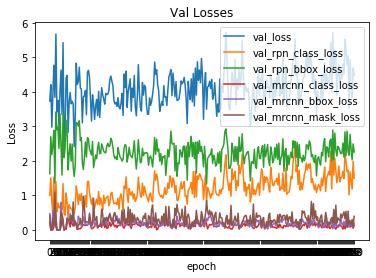

Train Loss 



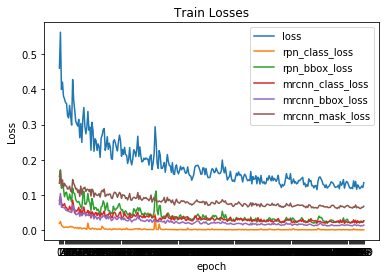

In [16]:
 '''
    # Training - Stage 2
        # Finetune layers from ResNet stage 4 and up
        print("Fine tune Resnet stage 4 and up")
        model.train(dataset_train, dataset_val,
                    learning_rate=config.LEARNING_RATE,
                    epochs=1,
                    layers='4+',
                    augmentation=seq)
                    '''

Fine tune all layers

Starting at epoch 0. LR=0.0001

Checkpoint Path: /home/harsh/Mask_RCNN/logs/shapes20190824T0132/mask_rcnn_shapes_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b      

 99/100 [============================>.] - ETA: 1s - loss: 0.1299 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0266 - mrcnn_class_loss: 0.0199 - mrcnn_bbox_loss: 0.0161 - mrcnn_mask_loss: 0.0652

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 114s 1s/step - loss: 0.1302 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0267 - mrcnn_class_loss: 0.0199 - mrcnn_bbox_loss: 0.0163 - mrcnn_mask_loss: 0.0652 - val_loss: 3.2975 - val_rpn_class_loss: 0.8226 - val_rpn_bbox_loss: 1.1964 - val_mrcnn_class_loss: 0.3149 - val_mrcnn_bbox_loss: 0.3721 - val_mrcnn_mask_loss: 0.5915
Epoch 2/300
 12/100 [==>...........................] - ETA: 44s - loss: 0.0883 - rpn_class_loss: 6.4174e-04 - rpn_bbox_loss: 0.0165 - mrcnn_class_loss: 0.0055 - mrcnn_bbox_loss: 0.0154 - mrcnn_mask_loss: 0.0501

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 15/100 [===>..........................] - ETA: 42s - loss: 0.0867 - rpn_class_loss: 5.2785e-04 - rpn_bbox_loss: 0.0159 - mrcnn_class_loss: 0.0046 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0519

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 16/100 [===>..........................] - ETA: 42s - loss: 0.0872 - rpn_class_loss: 5.0138e-04 - rpn_bbox_loss: 0.0159 - mrcnn_class_loss: 0.0043 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0530

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 19/100 [====>.........................] - ETA: 40s - loss: 0.1039 - rpn_class_loss: 4.9163e-04 - rpn_bbox_loss: 0.0186 - mrcnn_class_loss: 0.0111 - mrcnn_bbox_loss: 0.0150 - mrcnn_mask_loss: 0.0587

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 37s - loss: 0.1465 - rpn_class_loss: 5.4467e-04 - rpn_bbox_loss: 0.0256 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0201 - mrcnn_mask_loss: 0.0721

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 35s - loss: 0.1707 - rpn_class_loss: 5.7426e-04 - rpn_bbox_loss: 0.0305 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0218 - mrcnn_mask_loss: 0.0790

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 32s - loss: 0.1826 - rpn_class_loss: 5.2503e-04 - rpn_bbox_loss: 0.0349 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0235 - mrcnn_mask_loss: 0.0826

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 51s 512ms/step - loss: 0.1521 - rpn_class_loss: 3.8500e-04 - rpn_bbox_loss: 0.0294 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0201 - mrcnn_mask_loss: 0.0750 - val_loss: 4.6035 - val_rpn_class_loss: 1.2638 - val_rpn_bbox_loss: 2.1487 - val_mrcnn_class_loss: 0.1338 - val_mrcnn_bbox_loss: 0.3251 - val_mrcnn_mask_loss: 0.7321
Epoch 3/300
100/100 [==============================] - 54s 535ms/step - loss: 0.1101 - rpn_class_loss: 3.4099e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0229 - mrcnn_bbox_loss: 0.0116 - mrcnn_mask_loss: 0.0612 - val_loss: 4.1696 - val_rpn_class_loss: 1.5536 - val_rpn_bbox_loss: 2.0334 - val_mrcnn_class_loss: 1.8256e-05 - val_mrcnn_bbox_loss: 0.1486 - val_mrcnn_mask_loss: 0.4339
Epoch 4/300
 53/100 [==============>...............] - ETA: 23s - loss: 0.1112 - rpn_class_loss: 2.5407e-04 - rpn_bbox_loss: 0.0151 - mrcnn_class_loss: 0.0188 - mrcnn_bbox_loss: 0.0110 - mrcnn_mask_loss: 0.0660

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.1183 - rpn_class_loss: 2.5944e-04 - rpn_bbox_loss: 0.0196 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0114 - mrcnn_mask_loss: 0.0654

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 8s - loss: 0.1259 - rpn_class_loss: 2.9862e-04 - rpn_bbox_loss: 0.0233 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0663

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.1299 - rpn_class_loss: 3.1388e-04 - rpn_bbox_loss: 0.0249 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0668

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 0s - loss: 0.1306 - rpn_class_loss: 3.1999e-04 - rpn_bbox_loss: 0.0255 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0669

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 516ms/step - loss: 0.1299 - rpn_class_loss: 3.2181e-04 - rpn_bbox_loss: 0.0253 - mrcnn_class_loss: 0.0253 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0668 - val_loss: 3.9447 - val_rpn_class_loss: 1.5132 - val_rpn_bbox_loss: 2.4315 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 5/300
  1/100 [..............................] - ETA: 47s - loss: 0.1465 - rpn_class_loss: 1.7337e-04 - rpn_bbox_loss: 0.0309 - mrcnn_class_loss: 0.0115 - mrcnn_bbox_loss: 0.0218 - mrcnn_mask_loss: 0.0820

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  8/100 [=>............................] - ETA: 44s - loss: 0.1060 - rpn_class_loss: 2.4767e-04 - rpn_bbox_loss: 0.0159 - mrcnn_class_loss: 0.0158 - mrcnn_bbox_loss: 0.0106 - mrcnn_mask_loss: 0.0634

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 10/100 [==>...........................] - ETA: 43s - loss: 0.1177 - rpn_class_loss: 3.9089e-04 - rpn_bbox_loss: 0.0205 - mrcnn_class_loss: 0.0202 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0644

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 537ms/step - loss: 0.1096 - rpn_class_loss: 3.7789e-04 - rpn_bbox_loss: 0.0180 - mrcnn_class_loss: 0.0169 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0620 - val_loss: 5.3300 - val_rpn_class_loss: 2.0179 - val_rpn_bbox_loss: 3.0321 - val_mrcnn_class_loss: 0.0814 - val_mrcnn_bbox_loss: 0.0789 - val_mrcnn_mask_loss: 0.1196
Epoch 6/300
 63/100 [=================>............] - ETA: 18s - loss: 0.1232 - rpn_class_loss: 6.2436e-04 - rpn_bbox_loss: 0.0197 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 8s - loss: 0.1187 - rpn_class_loss: 5.1336e-04 - rpn_bbox_loss: 0.0193 - mrcnn_class_loss: 0.0248 - mrcnn_bbox_loss: 0.0116 - mrcnn_mask_loss: 0.0625

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 4s - loss: 0.1186 - rpn_class_loss: 4.8482e-04 - rpn_bbox_loss: 0.0194 - mrcnn_class_loss: 0.0245 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0625

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 517ms/step - loss: 0.1183 - rpn_class_loss: 4.6106e-04 - rpn_bbox_loss: 0.0194 - mrcnn_class_loss: 0.0242 - mrcnn_bbox_loss: 0.0116 - mrcnn_mask_loss: 0.0626 - val_loss: 3.3920 - val_rpn_class_loss: 0.9684 - val_rpn_bbox_loss: 1.4696 - val_mrcnn_class_loss: 0.1744 - val_mrcnn_bbox_loss: 0.2472 - val_mrcnn_mask_loss: 0.5324


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 7/300
  3/100 [..............................] - ETA: 46s - loss: 0.1166 - rpn_class_loss: 2.7877e-04 - rpn_bbox_loss: 0.0176 - mrcnn_class_loss: 0.0211 - mrcnn_bbox_loss: 0.0112 - mrcnn_mask_loss: 0.0665

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 10/100 [==>...........................] - ETA: 43s - loss: 0.1270 - rpn_class_loss: 3.7877e-04 - rpn_bbox_loss: 0.0257 - mrcnn_class_loss: 0.0205 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0667

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 40s - loss: 0.1309 - rpn_class_loss: 3.4544e-04 - rpn_bbox_loss: 0.0239 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0670

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 39s - loss: 0.1316 - rpn_class_loss: 3.6610e-04 - rpn_bbox_loss: 0.0244 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0671

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 520ms/step - loss: 0.1136 - rpn_class_loss: 5.1523e-04 - rpn_bbox_loss: 0.0189 - mrcnn_class_loss: 0.0200 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0621 - val_loss: 5.0735 - val_rpn_class_loss: 1.9665 - val_rpn_bbox_loss: 2.6084 - val_mrcnn_class_loss: 0.1524 - val_mrcnn_bbox_loss: 0.1544 - val_mrcnn_mask_loss: 0.1918
Epoch 8/300
100/100 [==============================] - 52s 515ms/step - loss: 0.1460 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0340 - mrcnn_class_loss: 0.0232 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0727 - val_loss: 5.8120 - val_rpn_class_loss: 2.4529 - val_rpn_bbox_loss: 2.6758 - val_mrcnn_class_loss: 0.0717 - val_mrcnn_bbox_loss: 0.3471 - val_mrcnn_mask_loss: 0.2645
Epoch 9/300
100/100 [==============================] - 52s 518ms/step - loss: 0.1150 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0164 - mrcnn_class_loss: 0.0203 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0646 - val_loss: 5.3865 - val_rpn_class_

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 41s - loss: 0.1176 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0142 - mrcnn_class_loss: 0.0224 - mrcnn_bbox_loss: 0.0111 - mrcnn_mask_loss: 0.0665

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 34s - loss: 0.1162 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0230 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0657

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 31s - loss: 0.1133 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0216 - mrcnn_bbox_loss: 0.0114 - mrcnn_mask_loss: 0.0649

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 26s - loss: 0.1090 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0197 - mrcnn_bbox_loss: 0.0109 - mrcnn_mask_loss: 0.0637

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 22s - loss: 0.1071 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0182 - mrcnn_bbox_loss: 0.0108 - mrcnn_mask_loss: 0.0638

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 60/100 [=================>............] - ETA: 20s - loss: 0.1064 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0182 - mrcnn_bbox_loss: 0.0105 - mrcnn_mask_loss: 0.0635

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.1089 - rpn_class_loss: 9.6029e-04 - rpn_bbox_loss: 0.0134 - mrcnn_class_loss: 0.0192 - mrcnn_bbox_loss: 0.0110 - mrcnn_mask_loss: 0.0643

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.1098 - rpn_class_loss: 7.0778e-04 - rpn_bbox_loss: 0.0142 - mrcnn_class_loss: 0.0191 - mrcnn_bbox_loss: 0.0112 - mrcnn_mask_loss: 0.0647 - val_loss: 4.4082 - val_rpn_class_loss: 1.5424 - val_rpn_bbox_loss: 2.4009 - val_mrcnn_class_loss: 1.3780e-06 - val_mrcnn_bbox_loss: 0.1399 - val_mrcnn_mask_loss: 0.3250
Epoch 11/300
100/100 [==============================] - 52s 518ms/step - loss: 0.1188 - rpn_class_loss: 6.2803e-04 - rpn_bbox_loss: 0.0192 - mrcnn_class_loss: 0.0197 - mrcnn_bbox_loss: 0.0114 - mrcnn_mask_loss: 0.0678 - val_loss: 5.1465 - val_rpn_class_loss: 1.9801 - val_rpn_bbox_loss: 3.0170 - val_mrcnn_class_loss: 5.0006e-08 - val_mrcnn_bbox_loss: 0.0466 - val_mrcnn_mask_loss: 0.1027
Epoch 12/300
100/100 [==============================] - 52s 525ms/step - loss: 0.1093 - rpn_class_loss: 1.5009e-04 - rpn_bbox_loss: 0.0188 - mrcnn_class_loss: 0.0181 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0600 - val_loss: 4.426

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 12/100 [==>...........................] - ETA: 45s - loss: 0.0988 - rpn_class_loss: 1.5514e-04 - rpn_bbox_loss: 0.0165 - mrcnn_class_loss: 0.0098 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0582

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 38s - loss: 0.1056 - rpn_class_loss: 6.1680e-04 - rpn_bbox_loss: 0.0174 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 35s - loss: 0.1035 - rpn_class_loss: 5.3803e-04 - rpn_bbox_loss: 0.0162 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0114 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 26s - loss: 0.1042 - rpn_class_loss: 6.2768e-04 - rpn_bbox_loss: 0.0174 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0598

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 24s - loss: 0.1035 - rpn_class_loss: 5.8728e-04 - rpn_bbox_loss: 0.0172 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0599

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 19s - loss: 0.1006 - rpn_class_loss: 5.8915e-04 - rpn_bbox_loss: 0.0165 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0113 - mrcnn_mask_loss: 0.0586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 16s - loss: 0.1080 - rpn_class_loss: 6.7171e-04 - rpn_bbox_loss: 0.0178 - mrcnn_class_loss: 0.0160 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0613

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 537ms/step - loss: 0.1112 - rpn_class_loss: 5.9929e-04 - rpn_bbox_loss: 0.0183 - mrcnn_class_loss: 0.0168 - mrcnn_bbox_loss: 0.0125 - mrcnn_mask_loss: 0.0629 - val_loss: 3.9533 - val_rpn_class_loss: 1.3474 - val_rpn_bbox_loss: 1.6312 - val_mrcnn_class_loss: 0.2337 - val_mrcnn_bbox_loss: 0.3004 - val_mrcnn_mask_loss: 0.4407
Epoch 14/300
 46/100 [============>.................] - ETA: 27s - loss: 0.1431 - rpn_class_loss: 2.5346e-04 - rpn_bbox_loss: 0.0289 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0154 - mrcnn_mask_loss: 0.0705

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 21s - loss: 0.1367 - rpn_class_loss: 2.3182e-04 - rpn_bbox_loss: 0.0268 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0148 - mrcnn_mask_loss: 0.0694

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 14s - loss: 0.1382 - rpn_class_loss: 2.7178e-04 - rpn_bbox_loss: 0.0270 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0147 - mrcnn_mask_loss: 0.0692

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.1357 - rpn_class_loss: 3.1340e-04 - rpn_bbox_loss: 0.0262 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0685

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.1367 - rpn_class_loss: 2.8913e-04 - rpn_bbox_loss: 0.0261 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0687

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.1347 - rpn_class_loss: 3.3698e-04 - rpn_bbox_loss: 0.0260 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.0143 - mrcnn_mask_loss: 0.0680 - val_loss: 4.7428 - val_rpn_class_loss: 1.3816 - val_rpn_bbox_loss: 1.9508 - val_mrcnn_class_loss: 0.1455 - val_mrcnn_bbox_loss: 0.3556 - val_mrcnn_mask_loss: 0.9093
Epoch 15/300
  2/100 [..............................] - ETA: 47s - loss: 0.1127 - rpn_class_loss: 8.2713e-05 - rpn_bbox_loss: 0.0301 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0581

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 11/100 [==>...........................] - ETA: 43s - loss: 0.1380 - rpn_class_loss: 8.7464e-04 - rpn_bbox_loss: 0.0283 - mrcnn_class_loss: 0.0244 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0702

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 40s - loss: 0.1280 - rpn_class_loss: 7.7485e-04 - rpn_bbox_loss: 0.0246 - mrcnn_class_loss: 0.0229 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0674

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 51s 514ms/step - loss: 0.1315 - rpn_class_loss: 9.9328e-04 - rpn_bbox_loss: 0.0253 - mrcnn_class_loss: 0.0231 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0691 - val_loss: 4.9285 - val_rpn_class_loss: 1.5402 - val_rpn_bbox_loss: 2.3246 - val_mrcnn_class_loss: 0.0361 - val_mrcnn_bbox_loss: 0.2779 - val_mrcnn_mask_loss: 0.7496
Epoch 16/300
100/100 [==============================] - 53s 527ms/step - loss: 0.1174 - rpn_class_loss: 7.7507e-04 - rpn_bbox_loss: 0.0183 - mrcnn_class_loss: 0.0179 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0666 - val_loss: 5.1136 - val_rpn_class_loss: 2.0410 - val_rpn_bbox_loss: 2.4622 - val_mrcnn_class_loss: 1.0818e-06 - val_mrcnn_bbox_loss: 0.1776 - val_mrcnn_mask_loss: 0.4328
Epoch 17/300
 55/100 [===============>..............] - ETA: 22s - loss: 0.1254 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0218 - mrcnn_class_loss: 0.0211 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0670

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 17s - loss: 0.1256 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0224 - mrcnn_class_loss: 0.0207 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0669

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.1233 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0222 - mrcnn_class_loss: 0.0201 - mrcnn_bbox_loss: 0.0118 - mrcnn_mask_loss: 0.0661

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 4s - loss: 0.1230 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0234 - mrcnn_class_loss: 0.0188 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0662

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 520ms/step - loss: 0.1201 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0224 - mrcnn_class_loss: 0.0181 - mrcnn_bbox_loss: 0.0114 - mrcnn_mask_loss: 0.0656 - val_loss: 5.4536 - val_rpn_class_loss: 2.3480 - val_rpn_bbox_loss: 2.6615 - val_mrcnn_class_loss: 0.0752 - val_mrcnn_bbox_loss: 0.1109 - val_mrcnn_mask_loss: 0.2579
Epoch 18/300
  2/100 [..............................] - ETA: 46s - loss: 0.2009 - rpn_class_loss: 7.3420e-05 - rpn_bbox_loss: 0.0377 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0263 - mrcnn_mask_loss: 0.0955

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 15/100 [===>..........................] - ETA: 41s - loss: 0.1108 - rpn_class_loss: 8.3629e-05 - rpn_bbox_loss: 0.0166 - mrcnn_class_loss: 0.0166 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0656

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 37s - loss: 0.1049 - rpn_class_loss: 9.0693e-05 - rpn_bbox_loss: 0.0153 - mrcnn_class_loss: 0.0148 - mrcnn_bbox_loss: 0.0108 - mrcnn_mask_loss: 0.0638

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 35s - loss: 0.1079 - rpn_class_loss: 1.0849e-04 - rpn_bbox_loss: 0.0157 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0106 - mrcnn_mask_loss: 0.0664

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.1181 - rpn_class_loss: 6.7429e-04 - rpn_bbox_loss: 0.0165 - mrcnn_class_loss: 0.0198 - mrcnn_bbox_loss: 0.0116 - mrcnn_mask_loss: 0.0695

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 8s - loss: 0.1200 - rpn_class_loss: 6.4558e-04 - rpn_bbox_loss: 0.0169 - mrcnn_class_loss: 0.0206 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0697

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 1s - loss: 0.1404 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.0303 - mrcnn_class_loss: 0.0213 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0690

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 518ms/step - loss: 0.1385 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.0296 - mrcnn_class_loss: 0.0209 - mrcnn_bbox_loss: 0.0123 - mrcnn_mask_loss: 0.0685 - val_loss: 4.5680 - val_rpn_class_loss: 1.8359 - val_rpn_bbox_loss: 2.1597 - val_mrcnn_class_loss: 0.1460 - val_mrcnn_bbox_loss: 0.1598 - val_mrcnn_mask_loss: 0.2666
Epoch 19/300
 10/100 [==>...........................] - ETA: 44s - loss: 0.1864 - rpn_class_loss: 0.0222 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0636  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 37s - loss: 0.1623 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0195 - mrcnn_bbox_loss: 0.0136 - mrcnn_mask_loss: 0.0631

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 34s - loss: 0.1502 - rpn_class_loss: 0.0120 - rpn_bbox_loss: 0.0432 - mrcnn_class_loss: 0.0194 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0629

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 28s - loss: 0.1496 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.0416 - mrcnn_class_loss: 0.0205 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 25s - loss: 0.1565 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0230 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0642

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 536ms/step - loss: 0.1376 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.0307 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0159 - mrcnn_mask_loss: 0.0634 - val_loss: 4.0500 - val_rpn_class_loss: 1.5320 - val_rpn_bbox_loss: 2.0776 - val_mrcnn_class_loss: 0.1181 - val_mrcnn_bbox_loss: 0.1299 - val_mrcnn_mask_loss: 0.1925
Epoch 20/300
100/100 [==============================] - 51s 514ms/step - loss: 0.1184 - rpn_class_loss: 4.1648e-04 - rpn_bbox_loss: 0.0212 - mrcnn_class_loss: 0.0225 - mrcnn_bbox_loss: 0.0124 - mrcnn_mask_loss: 0.0619 - val_loss: 3.8643 - val_rpn_class_loss: 1.4921 - val_rpn_bbox_loss: 1.7419 - val_mrcnn_class_loss: 0.1745 - val_mrcnn_bbox_loss: 0.1872 - val_mrcnn_mask_loss: 0.2686
Epoch 21/300
100/100 [==============================] - 52s 523ms/step - loss: 0.0969 - rpn_class_loss: 4.8464e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0576 - val_loss: 4.1399 - val_rpn_

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 24/100 [======>.......................] - ETA: 37s - loss: 0.1134 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0142 - mrcnn_class_loss: 0.0171 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0689  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 34s - loss: 0.1100 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0168 - mrcnn_bbox_loss: 0.0116 - mrcnn_mask_loss: 0.0663

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 25s - loss: 0.1040 - rpn_class_loss: 7.0911e-04 - rpn_bbox_loss: 0.0143 - mrcnn_class_loss: 0.0153 - mrcnn_bbox_loss: 0.0109 - mrcnn_mask_loss: 0.0629

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 13s - loss: 0.0994 - rpn_class_loss: 5.6529e-04 - rpn_bbox_loss: 0.0140 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 11s - loss: 0.0983 - rpn_class_loss: 5.4411e-04 - rpn_bbox_loss: 0.0138 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0607

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.0965 - rpn_class_loss: 5.0844e-04 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 6s - loss: 0.0960 - rpn_class_loss: 4.9704e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0932 - rpn_class_loss: 4.4238e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0581 - val_loss: 4.5969 - val_rpn_class_loss: 1.6845 - val_rpn_bbox_loss: 2.2092 - val_mrcnn_class_loss: 0.1729 - val_mrcnn_bbox_loss: 0.1749 - val_mrcnn_mask_loss: 0.3553
Epoch 24/300
100/100 [==============================] - 54s 543ms/step - loss: 0.1224 - rpn_class_loss: 4.8548e-04 - rpn_bbox_loss: 0.0214 - mrcnn_class_loss: 0.0215 - mrcnn_bbox_loss: 0.0136 - mrcnn_mask_loss: 0.0653 - val_loss: 3.6986 - val_rpn_class_loss: 1.4079 - val_rpn_bbox_loss: 1.9737 - val_mrcnn_class_loss: 0.0705 - val_mrcnn_bbox_loss: 0.0807 - val_mrcnn_mask_loss: 0.1658
Epoch 25/300
  7/100 [=>............................] - ETA: 45s - loss: 0.1141 - rpn_class_loss: 3.0556e-04 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0208 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0660

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 39s - loss: 0.1435 - rpn_class_loss: 9.3455e-04 - rpn_bbox_loss: 0.0252 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0726

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 33s - loss: 0.1627 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0351 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0160 - mrcnn_mask_loss: 0.0796

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 28s - loss: 0.1483 - rpn_class_loss: 8.4565e-04 - rpn_bbox_loss: 0.0306 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0145 - mrcnn_mask_loss: 0.0752

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 20s - loss: 0.1413 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0281 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0727  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 13s - loss: 0.1343 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0252 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0697    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.1361 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0258 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0699

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 6s - loss: 0.1361 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0257 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0697

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.1357 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0256 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0694 - val_loss: 3.7338 - val_rpn_class_loss: 1.2925 - val_rpn_bbox_loss: 1.8177 - val_mrcnn_class_loss: 0.1318 - val_mrcnn_bbox_loss: 0.1857 - val_mrcnn_mask_loss: 0.3061
Epoch 26/300
 86/100 [========================>.....] - ETA: 7s - loss: 0.1139 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0181 - mrcnn_class_loss: 0.0187 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 1s - loss: 0.1095 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0169 - mrcnn_class_loss: 0.0171 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0624

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 522ms/step - loss: 0.1097 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0169 - mrcnn_class_loss: 0.0174 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0624 - val_loss: 3.7441 - val_rpn_class_loss: 1.2884 - val_rpn_bbox_loss: 1.8695 - val_mrcnn_class_loss: 0.1434 - val_mrcnn_bbox_loss: 0.1635 - val_mrcnn_mask_loss: 0.2793
Epoch 27/300
  7/100 [=>............................] - ETA: 46s - loss: 0.0798 - rpn_class_loss: 3.0438e-04 - rpn_bbox_loss: 0.0078 - mrcnn_class_loss: 0.0050 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 36s - loss: 0.0995 - rpn_class_loss: 2.2929e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0167 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0612

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 28s - loss: 0.1031 - rpn_class_loss: 1.9402e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0169 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0631

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 21s - loss: 0.1049 - rpn_class_loss: 1.8033e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0177 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0635

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 18s - loss: 0.1044 - rpn_class_loss: 1.8323e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0182 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0631

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 15s - loss: 0.1047 - rpn_class_loss: 1.8015e-04 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0186 - mrcnn_bbox_loss: 0.0101 - mrcnn_mask_loss: 0.0630

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 522ms/step - loss: 0.1106 - rpn_class_loss: 1.7116e-04 - rpn_bbox_loss: 0.0138 - mrcnn_class_loss: 0.0196 - mrcnn_bbox_loss: 0.0113 - mrcnn_mask_loss: 0.0657 - val_loss: 4.1367 - val_rpn_class_loss: 1.5945 - val_rpn_bbox_loss: 2.0254 - val_mrcnn_class_loss: 0.1263 - val_mrcnn_bbox_loss: 0.1534 - val_mrcnn_mask_loss: 0.2370
Epoch 28/300
100/100 [==============================] - 54s 535ms/step - loss: 0.1074 - rpn_class_loss: 2.7974e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0177 - mrcnn_bbox_loss: 0.0105 - mrcnn_mask_loss: 0.0643 - val_loss: 4.9580 - val_rpn_class_loss: 2.1356 - val_rpn_bbox_loss: 2.7208 - val_mrcnn_class_loss: 0.0306 - val_mrcnn_bbox_loss: 0.0334 - val_mrcnn_mask_loss: 0.0377
Epoch 29/300
100/100 [==============================] - 52s 522ms/step - loss: 0.1772 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.0431 - mrcnn_class_loss: 0.0220 - mrcnn_bbox_loss: 0.0110 - mrcnn_mask_loss: 0.0661 - val_loss: 4.8251 - val_rpn_

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 31s - loss: 0.1296 - rpn_class_loss: 0.0128 - rpn_bbox_loss: 0.0254 - mrcnn_class_loss: 0.0192 - mrcnn_bbox_loss: 0.0112 - mrcnn_mask_loss: 0.0610

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 19s - loss: 0.1162 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.0220 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0106 - mrcnn_mask_loss: 0.0601

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.1156 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.0219 - mrcnn_class_loss: 0.0153 - mrcnn_bbox_loss: 0.0108 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.1112 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.0203 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0106 - mrcnn_mask_loss: 0.0599

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 537ms/step - loss: 0.1143 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.0211 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0109 - mrcnn_mask_loss: 0.0607 - val_loss: 5.0629 - val_rpn_class_loss: 1.9533 - val_rpn_bbox_loss: 2.6457 - val_mrcnn_class_loss: 0.1350 - val_mrcnn_bbox_loss: 0.1643 - val_mrcnn_mask_loss: 0.1647
Epoch 31/300
  6/100 [>.............................] - ETA: 46s - loss: 0.0799 - rpn_class_loss: 1.7954e-04 - rpn_bbox_loss: 0.0093 - mrcnn_class_loss: 0.0107 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0524

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 10/100 [==>...........................] - ETA: 44s - loss: 0.1087 - rpn_class_loss: 5.3042e-04 - rpn_bbox_loss: 0.0199 - mrcnn_class_loss: 0.0180 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 41s - loss: 0.1105 - rpn_class_loss: 3.9225e-04 - rpn_bbox_loss: 0.0183 - mrcnn_class_loss: 0.0170 - mrcnn_bbox_loss: 0.0115 - mrcnn_mask_loss: 0.0633

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 516ms/step - loss: 0.1239 - rpn_class_loss: 2.8710e-04 - rpn_bbox_loss: 0.0256 - mrcnn_class_loss: 0.0200 - mrcnn_bbox_loss: 0.0125 - mrcnn_mask_loss: 0.0656 - val_loss: 5.6805 - val_rpn_class_loss: 2.1706 - val_rpn_bbox_loss: 2.7779 - val_mrcnn_class_loss: 0.0535 - val_mrcnn_bbox_loss: 0.2041 - val_mrcnn_mask_loss: 0.4742
Epoch 32/300
100/100 [==============================] - 54s 541ms/step - loss: 0.0921 - rpn_class_loss: 2.1919e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0101 - mrcnn_mask_loss: 0.0571 - val_loss: 4.8333 - val_rpn_class_loss: 2.2538 - val_rpn_bbox_loss: 2.4736 - val_mrcnn_class_loss: 0.0325 - val_mrcnn_bbox_loss: 0.0364 - val_mrcnn_mask_loss: 0.0371
Epoch 33/300
100/100 [==============================] - 53s 528ms/step - loss: 0.1175 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0166 - mrcnn_class_loss: 0.0206 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0664 - val_loss: 3.9003 - val_rpn_

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 6s - loss: 0.1248 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0236 - mrcnn_class_loss: 0.0200 - mrcnn_bbox_loss: 0.0125 - mrcnn_mask_loss: 0.0674

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 51s 515ms/step - loss: 0.1209 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0225 - mrcnn_class_loss: 0.0193 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0659 - val_loss: 3.0565 - val_rpn_class_loss: 1.1756 - val_rpn_bbox_loss: 1.6129 - val_mrcnn_class_loss: 0.0721 - val_mrcnn_bbox_loss: 0.0804 - val_mrcnn_mask_loss: 0.1155
Epoch 35/300
 11/100 [==>...........................] - ETA: 45s - loss: 0.1167 - rpn_class_loss: 1.4843e-04 - rpn_bbox_loss: 0.0226 - mrcnn_class_loss: 0.0175 - mrcnn_bbox_loss: 0.0114 - mrcnn_mask_loss: 0.0650

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 42s - loss: 0.1067 - rpn_class_loss: 6.1660e-04 - rpn_bbox_loss: 0.0189 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0608

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 30s - loss: 0.0993 - rpn_class_loss: 4.5589e-04 - rpn_bbox_loss: 0.0169 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0583

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.0972 - rpn_class_loss: 4.1612e-04 - rpn_bbox_loss: 0.0160 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 67/100 [===================>..........] - ETA: 16s - loss: 0.0962 - rpn_class_loss: 4.2537e-04 - rpn_bbox_loss: 0.0153 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0569

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 14s - loss: 0.0947 - rpn_class_loss: 4.1061e-04 - rpn_bbox_loss: 0.0150 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0563

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0931 - rpn_class_loss: 5.6061e-04 - rpn_bbox_loss: 0.0140 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0560 - val_loss: 4.5235 - val_rpn_class_loss: 1.4555 - val_rpn_bbox_loss: 2.1624 - val_mrcnn_class_loss: 0.1272 - val_mrcnn_bbox_loss: 0.2755 - val_mrcnn_mask_loss: 0.5028
Epoch 36/300
 94/100 [===========================>..] - ETA: 3s - loss: 0.1029 - rpn_class_loss: 8.1278e-04 - rpn_bbox_loss: 0.0158 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.1049 - rpn_class_loss: 7.8453e-04 - rpn_bbox_loss: 0.0162 - mrcnn_class_loss: 0.0161 - mrcnn_bbox_loss: 0.0097 - mrcnn_mask_loss: 0.0621 - val_loss: 5.0085 - val_rpn_class_loss: 1.9597 - val_rpn_bbox_loss: 2.6883 - val_mrcnn_class_loss: 0.0399 - val_mrcnn_bbox_loss: 0.1029 - val_mrcnn_mask_loss: 0.2177
Epoch 37/300
 10/100 [==>...........................] - ETA: 45s - loss: 0.0850 - rpn_class_loss: 3.0691e-04 - rpn_bbox_loss: 0.0121 - mrcnn_class_loss: 0.0066 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0591

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 36s - loss: 0.0875 - rpn_class_loss: 4.3668e-04 - rpn_bbox_loss: 0.0115 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0575

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 31s - loss: 0.0896 - rpn_class_loss: 4.6051e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.0907 - rpn_class_loss: 4.0430e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0572

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 13s - loss: 0.0903 - rpn_class_loss: 3.4315e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0571

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 6s - loss: 0.0914 - rpn_class_loss: 3.1834e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0911 - rpn_class_loss: 3.0960e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0564

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0911 - rpn_class_loss: 3.0211e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0563 - val_loss: 4.8867 - val_rpn_class_loss: 2.0981 - val_rpn_bbox_loss: 2.2410 - val_mrcnn_class_loss: 0.1080 - val_mrcnn_bbox_loss: 0.1637 - val_mrcnn_mask_loss: 0.2759
Epoch 38/300
 35/100 [=========>....................] - ETA: 31s - loss: 0.1004 - rpn_class_loss: 2.0649e-04 - rpn_bbox_loss: 0.0142 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0616

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 24s - loss: 0.1015 - rpn_class_loss: 1.9739e-04 - rpn_bbox_loss: 0.0140 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0099 - mrcnn_mask_loss: 0.0617

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 13s - loss: 0.1006 - rpn_class_loss: 1.9987e-04 - rpn_bbox_loss: 0.0134 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0617

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 8s - loss: 0.0999 - rpn_class_loss: 1.9550e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0617

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 1s - loss: 0.0987 - rpn_class_loss: 1.8508e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0614

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 520ms/step - loss: 0.0985 - rpn_class_loss: 1.8334e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0613 - val_loss: 4.3559 - val_rpn_class_loss: 2.0087 - val_rpn_bbox_loss: 1.9982 - val_mrcnn_class_loss: 0.0613 - val_mrcnn_bbox_loss: 0.1058 - val_mrcnn_mask_loss: 0.1819
Epoch 39/300
 18/100 [====>.........................] - ETA: 40s - loss: 0.0902 - rpn_class_loss: 1.5155e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0092 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 36s - loss: 0.0965 - rpn_class_loss: 1.3707e-04 - rpn_bbox_loss: 0.0142 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0599

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 34s - loss: 0.0952 - rpn_class_loss: 1.2576e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0592

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0981 - rpn_class_loss: 1.8619e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0097 - mrcnn_mask_loss: 0.0601 - val_loss: 5.5826 - val_rpn_class_loss: 2.6106 - val_rpn_bbox_loss: 2.4965 - val_mrcnn_class_loss: 0.0926 - val_mrcnn_bbox_loss: 0.1190 - val_mrcnn_mask_loss: 0.2639
Epoch 40/300
100/100 [==============================] - 52s 519ms/step - loss: 0.1066 - rpn_class_loss: 5.7889e-04 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0183 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0630 - val_loss: 4.9824 - val_rpn_class_loss: 2.0112 - val_rpn_bbox_loss: 2.0308 - val_mrcnn_class_loss: 0.1944 - val_mrcnn_bbox_loss: 0.2382 - val_mrcnn_mask_loss: 0.5078
Epoch 41/300
 99/100 [============================>.] - ETA: 0s - loss: 0.0997 - rpn_class_loss: 3.3289e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0619

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0996 - rpn_class_loss: 3.2959e-04 - rpn_bbox_loss: 0.0134 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0101 - mrcnn_mask_loss: 0.0620 - val_loss: 4.4271 - val_rpn_class_loss: 1.8837 - val_rpn_bbox_loss: 2.3877 - val_mrcnn_class_loss: 0.0327 - val_mrcnn_bbox_loss: 0.0415 - val_mrcnn_mask_loss: 0.0815
Epoch 42/300
  2/100 [..............................] - ETA: 46s - loss: 0.0934 - rpn_class_loss: 3.3756e-05 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0630

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 27s - loss: 0.1134 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0152 - mrcnn_class_loss: 0.0192 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0654

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 25s - loss: 0.1116 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0185 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0649

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 18s - loss: 0.1060 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0138 - mrcnn_class_loss: 0.0173 - mrcnn_bbox_loss: 0.0109 - mrcnn_mask_loss: 0.0630

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 4s - loss: 0.1026 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0169 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0612

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.1020 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0171 - mrcnn_bbox_loss: 0.0101 - mrcnn_mask_loss: 0.0608 - val_loss: 3.7891 - val_rpn_class_loss: 1.2996 - val_rpn_bbox_loss: 1.9938 - val_mrcnn_class_loss: 0.0363 - val_mrcnn_bbox_loss: 0.1355 - val_mrcnn_mask_loss: 0.3239
Epoch 43/300
  3/100 [..............................] - ETA: 48s - loss: 0.0698 - rpn_class_loss: 2.8069e-04 - rpn_bbox_loss: 0.0086 - mrcnn_class_loss: 0.0056 - mrcnn_bbox_loss: 0.0045 - mrcnn_mask_loss: 0.0507

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  7/100 [=>............................] - ETA: 46s - loss: 0.0802 - rpn_class_loss: 2.5399e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0088 - mrcnn_bbox_loss: 0.0061 - mrcnn_mask_loss: 0.0548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 39s - loss: 0.1072 - rpn_class_loss: 3.0295e-04 - rpn_bbox_loss: 0.0169 - mrcnn_class_loss: 0.0155 - mrcnn_bbox_loss: 0.0105 - mrcnn_mask_loss: 0.0641

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 36s - loss: 0.1057 - rpn_class_loss: 7.5319e-04 - rpn_bbox_loss: 0.0158 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0105 - mrcnn_mask_loss: 0.0636

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.1014 - rpn_class_loss: 6.8249e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0099 - mrcnn_mask_loss: 0.0622

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 13s - loss: 0.1014 - rpn_class_loss: 6.9700e-04 - rpn_bbox_loss: 0.0138 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0099 - mrcnn_mask_loss: 0.0623

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 9s - loss: 0.1042 - rpn_class_loss: 6.7946e-04 - rpn_bbox_loss: 0.0138 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0637 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.1097 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0158 - mrcnn_class_loss: 0.0174 - mrcnn_bbox_loss: 0.0110 - mrcnn_mask_loss: 0.0641 - val_loss: 4.2206 - val_rpn_class_loss: 1.2844 - val_rpn_bbox_loss: 1.9273 - val_mrcnn_class_loss: 0.0189 - val_mrcnn_bbox_loss: 0.2913 - val_mrcnn_mask_loss: 0.6986
Epoch 44/300
  5/100 [>.............................] - ETA: 46s - loss: 0.1793 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.0413 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.0186 - mrcnn_mask_loss: 0.0701

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 18/100 [====>.........................] - ETA: 40s - loss: 0.1336 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0224 - mrcnn_class_loss: 0.0220 - mrcnn_bbox_loss: 0.0131 - mrcnn_mask_loss: 0.0718

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 39s - loss: 0.1243 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0202 - mrcnn_class_loss: 0.0193 - mrcnn_bbox_loss: 0.0118 - mrcnn_mask_loss: 0.0693

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 534ms/step - loss: 0.1279 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0243 - mrcnn_class_loss: 0.0224 - mrcnn_bbox_loss: 0.0129 - mrcnn_mask_loss: 0.0662 - val_loss: 4.5653 - val_rpn_class_loss: 1.4040 - val_rpn_bbox_loss: 2.1547 - val_mrcnn_class_loss: 0.0654 - val_mrcnn_bbox_loss: 0.2818 - val_mrcnn_mask_loss: 0.6594
Epoch 45/300
100/100 [==============================] - 52s 516ms/step - loss: 0.1137 - rpn_class_loss: 6.9123e-04 - rpn_bbox_loss: 0.0173 - mrcnn_class_loss: 0.0170 - mrcnn_bbox_loss: 0.0106 - mrcnn_mask_loss: 0.0680 - val_loss: 4.2831 - val_rpn_class_loss: 1.4779 - val_rpn_bbox_loss: 2.1961 - val_mrcnn_class_loss: 0.1062 - val_mrcnn_bbox_loss: 0.1864 - val_mrcnn_mask_loss: 0.3165
Epoch 46/300
100/100 [==============================] - 52s 518ms/step - loss: 0.0910 - rpn_class_loss: 5.3389e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0581 - val_loss: 3.8536 - val_rpn_

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 18/100 [====>.........................] - ETA: 40s - loss: 0.0997 - rpn_class_loss: 2.0232e-04 - rpn_bbox_loss: 0.0167 - mrcnn_class_loss: 0.0168 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 19s - loss: 0.0935 - rpn_class_loss: 3.0036e-04 - rpn_bbox_loss: 0.0134 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0571

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 18s - loss: 0.0922 - rpn_class_loss: 2.8925e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0565

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 67/100 [===================>..........] - ETA: 16s - loss: 0.0928 - rpn_class_loss: 2.8062e-04 - rpn_bbox_loss: 0.0134 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0568

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0945 - rpn_class_loss: 2.2704e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0571

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0975 - rpn_class_loss: 2.4688e-04 - rpn_bbox_loss: 0.0161 - mrcnn_class_loss: 0.0153 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0572 - val_loss: 4.5584 - val_rpn_class_loss: 2.0522 - val_rpn_bbox_loss: 2.1463 - val_mrcnn_class_loss: 0.0681 - val_mrcnn_bbox_loss: 0.0893 - val_mrcnn_mask_loss: 0.2025
Epoch 48/300
 12/100 [==>...........................] - ETA: 44s - loss: 0.1760 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0616 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0174 - mrcnn_mask_loss: 0.0605

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 41s - loss: 0.1495 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0477 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.0146 - mrcnn_mask_loss: 0.0582

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.1302 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0342 - mrcnn_class_loss: 0.0202 - mrcnn_bbox_loss: 0.0134 - mrcnn_mask_loss: 0.0610 - val_loss: 5.4673 - val_rpn_class_loss: 2.5662 - val_rpn_bbox_loss: 2.7597 - val_mrcnn_class_loss: 0.0324 - val_mrcnn_bbox_loss: 0.0417 - val_mrcnn_mask_loss: 0.0674
Epoch 49/300
 58/100 [================>.............] - ETA: 21s - loss: 0.1116 - rpn_class_loss: 5.7213e-04 - rpn_bbox_loss: 0.0198 - mrcnn_class_loss: 0.0189 - mrcnn_bbox_loss: 0.0111 - mrcnn_mask_loss: 0.0612

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.1023 - rpn_class_loss: 5.2041e-04 - rpn_bbox_loss: 0.0171 - mrcnn_class_loss: 0.0160 - mrcnn_bbox_loss: 0.0099 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 535ms/step - loss: 0.1044 - rpn_class_loss: 5.8216e-04 - rpn_bbox_loss: 0.0175 - mrcnn_class_loss: 0.0166 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0599 - val_loss: 4.3738 - val_rpn_class_loss: 1.9604 - val_rpn_bbox_loss: 2.2685 - val_mrcnn_class_loss: 0.0281 - val_mrcnn_bbox_loss: 0.0437 - val_mrcnn_mask_loss: 0.0731
Epoch 50/300
 10/100 [==>...........................] - ETA: 44s - loss: 0.0950 - rpn_class_loss: 6.8387e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0592

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 14/100 [===>..........................] - ETA: 42s - loss: 0.0966 - rpn_class_loss: 6.1296e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 39s - loss: 0.0868 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 36/100 [=========>....................] - ETA: 32s - loss: 0.1098 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0186 - mrcnn_class_loss: 0.0170 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0628

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 17s - loss: 0.1055 - rpn_class_loss: 8.9515e-04 - rpn_bbox_loss: 0.0176 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 12s - loss: 0.1051 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0172 - mrcnn_class_loss: 0.0156 - mrcnn_bbox_loss: 0.0105 - mrcnn_mask_loss: 0.0608

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 518ms/step - loss: 0.1093 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0177 - mrcnn_class_loss: 0.0170 - mrcnn_bbox_loss: 0.0111 - mrcnn_mask_loss: 0.0624 - val_loss: 4.0114 - val_rpn_class_loss: 1.4559 - val_rpn_bbox_loss: 1.8047 - val_mrcnn_class_loss: 0.1171 - val_mrcnn_bbox_loss: 0.2050 - val_mrcnn_mask_loss: 0.4286
Epoch 51/300
100/100 [==============================] - 52s 518ms/step - loss: 0.1047 - rpn_class_loss: 6.1023e-04 - rpn_bbox_loss: 0.0143 - mrcnn_class_loss: 0.0175 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0620 - val_loss: 4.5817 - val_rpn_class_loss: 1.5289 - val_rpn_bbox_loss: 1.9408 - val_mrcnn_class_loss: 0.1107 - val_mrcnn_bbox_loss: 0.2813 - val_mrcnn_mask_loss: 0.7199
Epoch 52/300
100/100 [==============================] - 52s 517ms/step - loss: 0.0972 - rpn_class_loss: 3.3452e-04 - rpn_bbox_loss: 0.0144 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0594 - val_loss: 5.8921 - val_rpn_

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0975 - rpn_class_loss: 3.5554e-04 - rpn_bbox_loss: 0.0151 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0589

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0975 - rpn_class_loss: 3.4652e-04 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0592 - val_loss: 5.7469 - val_rpn_class_loss: 2.3235 - val_rpn_bbox_loss: 2.7090 - val_mrcnn_class_loss: 0.0712 - val_mrcnn_bbox_loss: 0.1659 - val_mrcnn_mask_loss: 0.4773
Epoch 54/300
 27/100 [=======>......................] - ETA: 38s - loss: 0.1013 - rpn_class_loss: 3.2516e-04 - rpn_bbox_loss: 0.0150 - mrcnn_class_loss: 0.0171 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0599

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 34s - loss: 0.0989 - rpn_class_loss: 2.8702e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0599

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 30s - loss: 0.1015 - rpn_class_loss: 3.3851e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0171 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0605

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 27s - loss: 0.1011 - rpn_class_loss: 3.2228e-04 - rpn_bbox_loss: 0.0144 - mrcnn_class_loss: 0.0173 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0603

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 22s - loss: 0.1015 - rpn_class_loss: 3.2332e-04 - rpn_bbox_loss: 0.0147 - mrcnn_class_loss: 0.0170 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0606

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 15s - loss: 0.1031 - rpn_class_loss: 3.5575e-04 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0174 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0613

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.1049 - rpn_class_loss: 3.7598e-04 - rpn_bbox_loss: 0.0156 - mrcnn_class_loss: 0.0178 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0619

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 8s - loss: 0.1150 - rpn_class_loss: 6.1334e-04 - rpn_bbox_loss: 0.0205 - mrcnn_class_loss: 0.0201 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0638

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.1147 - rpn_class_loss: 5.4293e-04 - rpn_bbox_loss: 0.0198 - mrcnn_class_loss: 0.0203 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0637 - val_loss: 5.4726 - val_rpn_class_loss: 2.0812 - val_rpn_bbox_loss: 2.4831 - val_mrcnn_class_loss: 0.0452 - val_mrcnn_bbox_loss: 0.2162 - val_mrcnn_mask_loss: 0.6469
Epoch 55/300
 10/100 [==>...........................] - ETA: 44s - loss: 0.1470 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0428 - mrcnn_class_loss: 0.0162 - mrcnn_bbox_loss: 0.0154 - mrcnn_mask_loss: 0.0710

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 41s - loss: 0.1286 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0301 - mrcnn_class_loss: 0.0186 - mrcnn_bbox_loss: 0.0129 - mrcnn_mask_loss: 0.0658

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 39s - loss: 0.1343 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0311 - mrcnn_class_loss: 0.0203 - mrcnn_bbox_loss: 0.0135 - mrcnn_mask_loss: 0.0683

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 31s - loss: 0.1309 - rpn_class_loss: 8.8007e-04 - rpn_bbox_loss: 0.0301 - mrcnn_class_loss: 0.0195 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0675

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 19s - loss: 0.1268 - rpn_class_loss: 8.2845e-04 - rpn_bbox_loss: 0.0278 - mrcnn_class_loss: 0.0187 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0669

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.1272 - rpn_class_loss: 8.0946e-04 - rpn_bbox_loss: 0.0278 - mrcnn_class_loss: 0.0189 - mrcnn_bbox_loss: 0.0126 - mrcnn_mask_loss: 0.0670

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.1204 - rpn_class_loss: 6.6460e-04 - rpn_bbox_loss: 0.0236 - mrcnn_class_loss: 0.0184 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0657 - val_loss: 4.4251 - val_rpn_class_loss: 1.5141 - val_rpn_bbox_loss: 1.8287 - val_mrcnn_class_loss: 0.1383 - val_mrcnn_bbox_loss: 0.2777 - val_mrcnn_mask_loss: 0.6662
Epoch 56/300
 82/100 [=======================>......] - ETA: 9s - loss: 0.1086 - rpn_class_loss: 4.6991e-04 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0186 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0660

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 522ms/step - loss: 0.1125 - rpn_class_loss: 4.6185e-04 - rpn_bbox_loss: 0.0152 - mrcnn_class_loss: 0.0193 - mrcnn_bbox_loss: 0.0108 - mrcnn_mask_loss: 0.0667 - val_loss: 4.5992 - val_rpn_class_loss: 2.0749 - val_rpn_bbox_loss: 1.9389 - val_mrcnn_class_loss: 0.0860 - val_mrcnn_bbox_loss: 0.1501 - val_mrcnn_mask_loss: 0.3494
Epoch 57/300
  3/100 [..............................] - ETA: 48s - loss: 0.0588 - rpn_class_loss: 1.0560e-04 - rpn_bbox_loss: 0.0052 - mrcnn_class_loss: 0.0055 - mrcnn_bbox_loss: 0.0049 - mrcnn_mask_loss: 0.0430

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 24s - loss: 0.1043 - rpn_class_loss: 2.8884e-04 - rpn_bbox_loss: 0.0151 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0105 - mrcnn_mask_loss: 0.0620

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.1057 - rpn_class_loss: 3.4381e-04 - rpn_bbox_loss: 0.0153 - mrcnn_class_loss: 0.0164 - mrcnn_bbox_loss: 0.0109 - mrcnn_mask_loss: 0.0627

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 20s - loss: 0.1060 - rpn_class_loss: 3.8497e-04 - rpn_bbox_loss: 0.0158 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0112 - mrcnn_mask_loss: 0.0628

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 10s - loss: 0.1020 - rpn_class_loss: 4.1114e-04 - rpn_bbox_loss: 0.0152 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0106 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 517ms/step - loss: 0.1001 - rpn_class_loss: 4.9318e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0611 - val_loss: 4.5047 - val_rpn_class_loss: 1.6200 - val_rpn_bbox_loss: 2.2060 - val_mrcnn_class_loss: 0.0562 - val_mrcnn_bbox_loss: 0.1459 - val_mrcnn_mask_loss: 0.4766


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 58/300
  6/100 [>.............................] - ETA: 45s - loss: 0.1195 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0207 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0125 - mrcnn_mask_loss: 0.0701

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.0951 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0604 - val_loss: 4.8062 - val_rpn_class_loss: 1.8018 - val_rpn_bbox_loss: 2.2979 - val_mrcnn_class_loss: 0.1178 - val_mrcnn_bbox_loss: 0.1857 - val_mrcnn_mask_loss: 0.4031
Epoch 59/300
 89/100 [=========================>....] - ETA: 5s - loss: 0.0968 - rpn_class_loss: 5.1511e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0608

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 55s 546ms/step - loss: 0.0975 - rpn_class_loss: 4.8316e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0611 - val_loss: 4.9654 - val_rpn_class_loss: 1.5331 - val_rpn_bbox_loss: 2.3185 - val_mrcnn_class_loss: 0.0614 - val_mrcnn_bbox_loss: 0.2929 - val_mrcnn_mask_loss: 0.7596
Epoch 60/300
 13/100 [==>...........................] - ETA: 43s - loss: 0.1540 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0308 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0149 - mrcnn_mask_loss: 0.0778

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 19s - loss: 0.1246 - rpn_class_loss: 9.1661e-04 - rpn_bbox_loss: 0.0216 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0118 - mrcnn_mask_loss: 0.0685

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 16s - loss: 0.1208 - rpn_class_loss: 8.4255e-04 - rpn_bbox_loss: 0.0204 - mrcnn_class_loss: 0.0209 - mrcnn_bbox_loss: 0.0114 - mrcnn_mask_loss: 0.0672

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 12s - loss: 0.1200 - rpn_class_loss: 9.6660e-04 - rpn_bbox_loss: 0.0199 - mrcnn_class_loss: 0.0207 - mrcnn_bbox_loss: 0.0114 - mrcnn_mask_loss: 0.0670

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 7s - loss: 0.1210 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0195 - mrcnn_class_loss: 0.0215 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0671   

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 538ms/step - loss: 0.1201 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0193 - mrcnn_class_loss: 0.0210 - mrcnn_bbox_loss: 0.0117 - mrcnn_mask_loss: 0.0668 - val_loss: 5.1252 - val_rpn_class_loss: 1.9508 - val_rpn_bbox_loss: 2.5364 - val_mrcnn_class_loss: 0.0657 - val_mrcnn_bbox_loss: 0.2157 - val_mrcnn_mask_loss: 0.3567
Epoch 61/300
  2/100 [..............................] - ETA: 48s - loss: 0.0562 - rpn_class_loss: 6.4631e-05 - rpn_bbox_loss: 0.0036 - mrcnn_class_loss: 0.0053 - mrcnn_bbox_loss: 0.0031 - mrcnn_mask_loss: 0.0442    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  6/100 [>.............................] - ETA: 46s - loss: 0.1077 - rpn_class_loss: 2.2515e-04 - rpn_bbox_loss: 0.0160 - mrcnn_class_loss: 0.0242 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0575

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 51s 512ms/step - loss: 0.1179 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0178 - mrcnn_class_loss: 0.0231 - mrcnn_bbox_loss: 0.0108 - mrcnn_mask_loss: 0.0646 - val_loss: 4.4792 - val_rpn_class_loss: 1.5573 - val_rpn_bbox_loss: 1.9254 - val_mrcnn_class_loss: 0.1707 - val_mrcnn_bbox_loss: 0.2665 - val_mrcnn_mask_loss: 0.5593
Epoch 62/300
100/100 [==============================] - 52s 518ms/step - loss: 0.0991 - rpn_class_loss: 1.2273e-04 - rpn_bbox_loss: 0.0142 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0621 - val_loss: 4.6692 - val_rpn_class_loss: 1.5783 - val_rpn_bbox_loss: 2.0213 - val_mrcnn_class_loss: 0.2455 - val_mrcnn_bbox_loss: 0.2931 - val_mrcnn_mask_loss: 0.5311
Epoch 63/300
100/100 [==============================] - 52s 523ms/step - loss: 0.0892 - rpn_class_loss: 1.5478e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0582 - val_loss: 5.2038 - val_rpn_

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 24s - loss: 0.0963 - rpn_class_loss: 2.1800e-04 - rpn_bbox_loss: 0.0121 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.0969 - rpn_class_loss: 2.3407e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0608

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 14s - loss: 0.0964 - rpn_class_loss: 2.2590e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0601

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 534ms/step - loss: 0.0988 - rpn_class_loss: 2.0856e-04 - rpn_bbox_loss: 0.0121 - mrcnn_class_loss: 0.0158 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0604 - val_loss: 5.2246 - val_rpn_class_loss: 2.2715 - val_rpn_bbox_loss: 2.5480 - val_mrcnn_class_loss: 0.0913 - val_mrcnn_bbox_loss: 0.0996 - val_mrcnn_mask_loss: 0.2142
Epoch 65/300
 20/100 [=====>........................] - ETA: 39s - loss: 0.1102 - rpn_class_loss: 2.9968e-04 - rpn_bbox_loss: 0.0126 - mrcnn_class_loss: 0.0179 - mrcnn_bbox_loss: 0.0152 - mrcnn_mask_loss: 0.0642

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 36s - loss: 0.1147 - rpn_class_loss: 2.5439e-04 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0203 - mrcnn_bbox_loss: 0.0146 - mrcnn_mask_loss: 0.0667

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 32s - loss: 0.1214 - rpn_class_loss: 3.5580e-04 - rpn_bbox_loss: 0.0143 - mrcnn_class_loss: 0.0245 - mrcnn_bbox_loss: 0.0141 - mrcnn_mask_loss: 0.0683

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 36/100 [=========>....................] - ETA: 31s - loss: 0.1211 - rpn_class_loss: 3.7691e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0246 - mrcnn_bbox_loss: 0.0139 - mrcnn_mask_loss: 0.0681

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 29s - loss: 0.1214 - rpn_class_loss: 3.8413e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0248 - mrcnn_bbox_loss: 0.0133 - mrcnn_mask_loss: 0.0683

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 27s - loss: 0.1201 - rpn_class_loss: 3.7751e-04 - rpn_bbox_loss: 0.0145 - mrcnn_class_loss: 0.0245 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0678

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 25s - loss: 0.1216 - rpn_class_loss: 3.5902e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0128 - mrcnn_mask_loss: 0.0683

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 22s - loss: 0.1220 - rpn_class_loss: 3.3299e-04 - rpn_bbox_loss: 0.0144 - mrcnn_class_loss: 0.0252 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0683

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 18s - loss: 0.1231 - rpn_class_loss: 3.3579e-04 - rpn_bbox_loss: 0.0150 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0133 - mrcnn_mask_loss: 0.0689

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 15s - loss: 0.1253 - rpn_class_loss: 3.4807e-04 - rpn_bbox_loss: 0.0151 - mrcnn_class_loss: 0.0258 - mrcnn_bbox_loss: 0.0144 - mrcnn_mask_loss: 0.0696

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 14s - loss: 0.1239 - rpn_class_loss: 3.3892e-04 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0142 - mrcnn_mask_loss: 0.0690

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.1225 - rpn_class_loss: 3.2445e-04 - rpn_bbox_loss: 0.0151 - mrcnn_class_loss: 0.0247 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0686

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.1162 - rpn_class_loss: 3.2787e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0225 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0665 - val_loss: 4.3659 - val_rpn_class_loss: 1.3923 - val_rpn_bbox_loss: 1.8523 - val_mrcnn_class_loss: 0.2101 - val_mrcnn_bbox_loss: 0.2682 - val_mrcnn_mask_loss: 0.6431
Epoch 66/300
100/100 [==============================] - 53s 525ms/step - loss: 0.0994 - rpn_class_loss: 1.4178e-04 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0174 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0602 - val_loss: 4.0982 - val_rpn_class_loss: 1.1931 - val_rpn_bbox_loss: 1.7042 - val_mrcnn_class_loss: 0.0870 - val_mrcnn_bbox_loss: 0.3042 - val_mrcnn_mask_loss: 0.8096
Epoch 67/300
100/100 [==============================] - 52s 522ms/step - loss: 0.1053 - rpn_class_loss: 5.5761e-04 - rpn_bbox_loss: 0.0191 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0611 - val_loss: 4.9821 - val_

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 30s - loss: 0.1087 - rpn_class_loss: 7.6780e-04 - rpn_bbox_loss: 0.0236 - mrcnn_class_loss: 0.0188 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0563

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.1001 - rpn_class_loss: 7.5531e-04 - rpn_bbox_loss: 0.0190 - mrcnn_class_loss: 0.0158 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 522ms/step - loss: 0.0998 - rpn_class_loss: 7.2844e-04 - rpn_bbox_loss: 0.0182 - mrcnn_class_loss: 0.0155 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0566 - val_loss: 4.1528 - val_rpn_class_loss: 1.6750 - val_rpn_bbox_loss: 2.2132 - val_mrcnn_class_loss: 0.0649 - val_mrcnn_bbox_loss: 0.0698 - val_mrcnn_mask_loss: 0.1299
Epoch 69/300
  7/100 [=>............................] - ETA: 47s - loss: 0.0887 - rpn_class_loss: 6.8206e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0563

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 12/100 [==>...........................] - ETA: 44s - loss: 0.0838 - rpn_class_loss: 7.3910e-04 - rpn_bbox_loss: 0.0115 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0529

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 32/100 [========>.....................] - ETA: 34s - loss: 0.0966 - rpn_class_loss: 5.9407e-04 - rpn_bbox_loss: 0.0144 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 30s - loss: 0.0927 - rpn_class_loss: 6.1793e-04 - rpn_bbox_loss: 0.0134 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0572

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 25s - loss: 0.0987 - rpn_class_loss: 6.0222e-04 - rpn_bbox_loss: 0.0153 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0589

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 536ms/step - loss: 0.0942 - rpn_class_loss: 5.1696e-04 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0576 - val_loss: 4.7343 - val_rpn_class_loss: 1.9175 - val_rpn_bbox_loss: 2.3709 - val_mrcnn_class_loss: 0.0816 - val_mrcnn_bbox_loss: 0.1435 - val_mrcnn_mask_loss: 0.2208
Epoch 70/300
 35/100 [=========>....................] - ETA: 33s - loss: 0.1163 - rpn_class_loss: 5.9787e-04 - rpn_bbox_loss: 0.0176 - mrcnn_class_loss: 0.0211 - mrcnn_bbox_loss: 0.0111 - mrcnn_mask_loss: 0.0660

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 23s - loss: 0.1105 - rpn_class_loss: 4.9765e-04 - rpn_bbox_loss: 0.0168 - mrcnn_class_loss: 0.0185 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0644

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.1089 - rpn_class_loss: 4.3183e-04 - rpn_bbox_loss: 0.0166 - mrcnn_class_loss: 0.0192 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0626 - val_loss: 5.0726 - val_rpn_class_loss: 2.0910 - val_rpn_bbox_loss: 2.3670 - val_mrcnn_class_loss: 0.1254 - val_mrcnn_bbox_loss: 0.1423 - val_mrcnn_mask_loss: 0.3469
Epoch 71/300
  3/100 [..............................] - ETA: 47s - loss: 0.0784 - rpn_class_loss: 1.7071e-04 - rpn_bbox_loss: 0.0102 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0478

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 39s - loss: 0.1100 - rpn_class_loss: 2.9520e-04 - rpn_bbox_loss: 0.0151 - mrcnn_class_loss: 0.0229 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0625

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 34s - loss: 0.1062 - rpn_class_loss: 2.6191e-04 - rpn_bbox_loss: 0.0145 - mrcnn_class_loss: 0.0212 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0615

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 21s - loss: 0.0958 - rpn_class_loss: 2.4976e-04 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0160 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0587

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 18s - loss: 0.0950 - rpn_class_loss: 2.5594e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.0909 - rpn_class_loss: 2.9514e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0568

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 525ms/step - loss: 0.0931 - rpn_class_loss: 3.0948e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0572 - val_loss: 4.5199 - val_rpn_class_loss: 1.8341 - val_rpn_bbox_loss: 1.9984 - val_mrcnn_class_loss: 0.1016 - val_mrcnn_bbox_loss: 0.1964 - val_mrcnn_mask_loss: 0.3894
Epoch 72/300
100/100 [==============================] - 52s 521ms/step - loss: 0.0920 - rpn_class_loss: 4.1940e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0572 - val_loss: 4.3786 - val_rpn_class_loss: 1.7950 - val_rpn_bbox_loss: 1.8089 - val_mrcnn_class_loss: 0.0841 - val_mrcnn_bbox_loss: 0.2063 - val_mrcnn_mask_loss: 0.4843
Epoch 73/300
 44/100 [============>.................] - ETA: 28s - loss: 0.0885 - rpn_class_loss: 3.5046e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 13s - loss: 0.0932 - rpn_class_loss: 3.5097e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0582

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0987 - rpn_class_loss: 5.4175e-04 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0154 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0591 - val_loss: 4.6360 - val_rpn_class_loss: 1.5787 - val_rpn_bbox_loss: 2.0534 - val_mrcnn_class_loss: 0.0610 - val_mrcnn_bbox_loss: 0.2587 - val_mrcnn_mask_loss: 0.6843
Epoch 74/300
 14/100 [===>..........................] - ETA: 43s - loss: 0.0973 - rpn_class_loss: 2.8477e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0606

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 37s - loss: 0.1146 - rpn_class_loss: 4.9319e-04 - rpn_bbox_loss: 0.0215 - mrcnn_class_loss: 0.0191 - mrcnn_bbox_loss: 0.0112 - mrcnn_mask_loss: 0.0624

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 31s - loss: 0.1079 - rpn_class_loss: 3.9309e-04 - rpn_bbox_loss: 0.0181 - mrcnn_class_loss: 0.0170 - mrcnn_bbox_loss: 0.0105 - mrcnn_mask_loss: 0.0619

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 67/100 [===================>..........] - ETA: 16s - loss: 0.1082 - rpn_class_loss: 4.4661e-04 - rpn_bbox_loss: 0.0192 - mrcnn_class_loss: 0.0173 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0610

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 13s - loss: 0.1103 - rpn_class_loss: 4.7724e-04 - rpn_bbox_loss: 0.0212 - mrcnn_class_loss: 0.0171 - mrcnn_bbox_loss: 0.0104 - mrcnn_mask_loss: 0.0612

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 3s - loss: 0.1107 - rpn_class_loss: 5.2596e-04 - rpn_bbox_loss: 0.0215 - mrcnn_class_loss: 0.0171 - mrcnn_bbox_loss: 0.0105 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.1110 - rpn_class_loss: 5.0011e-04 - rpn_bbox_loss: 0.0211 - mrcnn_class_loss: 0.0175 - mrcnn_bbox_loss: 0.0107 - mrcnn_mask_loss: 0.0612 - val_loss: 4.7954 - val_rpn_class_loss: 1.9922 - val_rpn_bbox_loss: 2.1903 - val_mrcnn_class_loss: 0.0568 - val_mrcnn_bbox_loss: 0.1932 - val_mrcnn_mask_loss: 0.3628
Epoch 75/300
 92/100 [==========================>...] - ETA: 4s - loss: 0.1094 - rpn_class_loss: 8.8603e-04 - rpn_bbox_loss: 0.0195 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0104 - mrcnn_mask_loss: 0.0638

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.1079 - rpn_class_loss: 9.1180e-04 - rpn_bbox_loss: 0.0189 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0634 - val_loss: 5.0471 - val_rpn_class_loss: 2.1625 - val_rpn_bbox_loss: 2.5117 - val_mrcnn_class_loss: 0.0355 - val_mrcnn_bbox_loss: 0.0868 - val_mrcnn_mask_loss: 0.2505
Epoch 76/300
 33/100 [========>.....................] - ETA: 33s - loss: 0.0898 - rpn_class_loss: 5.6670e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 18s - loss: 0.0900 - rpn_class_loss: 5.8731e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 7s - loss: 0.0902 - rpn_class_loss: 5.8904e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0572

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 4s - loss: 0.0898 - rpn_class_loss: 5.9169e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0569

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0891 - rpn_class_loss: 5.5267e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0569 - val_loss: 4.7451 - val_rpn_class_loss: 1.9137 - val_rpn_bbox_loss: 2.2388 - val_mrcnn_class_loss: 0.0302 - val_mrcnn_bbox_loss: 0.1648 - val_mrcnn_mask_loss: 0.3976
Epoch 77/300
 16/100 [===>..........................] - ETA: 41s - loss: 0.0896 - rpn_class_loss: 1.9093e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 39s - loss: 0.0911 - rpn_class_loss: 1.6239e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 29s - loss: 0.0934 - rpn_class_loss: 4.7310e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0982 - rpn_class_loss: 5.8949e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0161 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0586 - val_loss: 5.2058 - val_rpn_class_loss: 2.0762 - val_rpn_bbox_loss: 2.2592 - val_mrcnn_class_loss: 0.1242 - val_mrcnn_bbox_loss: 0.2553 - val_mrcnn_mask_loss: 0.4910
Epoch 78/300
100/100 [==============================] - 52s 520ms/step - loss: 0.1043 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0147 - mrcnn_class_loss: 0.0162 - mrcnn_bbox_loss: 0.0104 - mrcnn_mask_loss: 0.0619 - val_loss: 5.0591 - val_rpn_class_loss: 1.9382 - val_rpn_bbox_loss: 2.2674 - val_mrcnn_class_loss: 0.0762 - val_mrcnn_bbox_loss: 0.2361 - val_mrcnn_mask_loss: 0.5412
Epoch 79/300
 50/100 [==============>...............] - ETA: 25s - loss: 0.0864 - rpn_class_loss: 6.1914e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0542

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0910 - rpn_class_loss: 7.1585e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0568 - val_loss: 4.9192 - val_rpn_class_loss: 1.8999 - val_rpn_bbox_loss: 2.1183 - val_mrcnn_class_loss: 0.0861 - val_mrcnn_bbox_loss: 0.2828 - val_mrcnn_mask_loss: 0.5320
Epoch 80/300
  1/100 [..............................] - ETA: 50s - loss: 0.0902 - rpn_class_loss: 1.6030e-05 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 3.3503e-04 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0723

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 37s - loss: 0.0943 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0591

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 60/100 [=================>............] - ETA: 20s - loss: 0.1004 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0607

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 17s - loss: 0.1007 - rpn_class_loss: 9.8673e-04 - rpn_bbox_loss: 0.0147 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0608

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 7s - loss: 0.1045 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0152 - mrcnn_class_loss: 0.0168 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0616

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.1045 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0155 - mrcnn_class_loss: 0.0164 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0618 - val_loss: 4.5229 - val_rpn_class_loss: 1.6744 - val_rpn_bbox_loss: 1.8852 - val_mrcnn_class_loss: 0.1173 - val_mrcnn_bbox_loss: 0.2727 - val_mrcnn_mask_loss: 0.5732


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 81/300
 16/100 [===>..........................] - ETA: 41s - loss: 0.1142 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0169 - mrcnn_class_loss: 0.0214 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0653

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.1015 - rpn_class_loss: 8.0792e-04 - rpn_bbox_loss: 0.0142 - mrcnn_class_loss: 0.0167 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0610 - val_loss: 4.5498 - val_rpn_class_loss: 1.8125 - val_rpn_bbox_loss: 2.0545 - val_mrcnn_class_loss: 0.0200 - val_mrcnn_bbox_loss: 0.1579 - val_mrcnn_mask_loss: 0.5049
Epoch 82/300
 99/100 [============================>.] - ETA: 0s - loss: 0.0972 - rpn_class_loss: 5.8727e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0982 - rpn_class_loss: 5.9549e-04 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0151 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0590 - val_loss: 5.2561 - val_rpn_class_loss: 1.7581 - val_rpn_bbox_loss: 2.2030 - val_mrcnn_class_loss: 0.0945 - val_mrcnn_bbox_loss: 0.3935 - val_mrcnn_mask_loss: 0.8069
Epoch 83/300
 56/100 [===============>..............] - ETA: 22s - loss: 0.1058 - rpn_class_loss: 4.1520e-04 - rpn_bbox_loss: 0.0170 - mrcnn_class_loss: 0.0160 - mrcnn_bbox_loss: 0.0099 - mrcnn_mask_loss: 0.0624

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 10s - loss: 0.1014 - rpn_class_loss: 4.1333e-04 - rpn_bbox_loss: 0.0153 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0619

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.1015 - rpn_class_loss: 3.9893e-04 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0623 - val_loss: 4.9029 - val_rpn_class_loss: 2.0865 - val_rpn_bbox_loss: 2.2769 - val_mrcnn_class_loss: 0.0272 - val_mrcnn_bbox_loss: 0.1265 - val_mrcnn_mask_loss: 0.3858
Epoch 84/300
 17/100 [====>.........................] - ETA: 41s - loss: 0.1012 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0622

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 39s - loss: 0.1032 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0155 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0631

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 38s - loss: 0.1018 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0631

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 29s - loss: 0.0945 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0615

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 24s - loss: 0.0920 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.0966 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0621

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.1018 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0633

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.1015 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0151 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0628 - val_loss: 4.8777 - val_rpn_class_loss: 1.9382 - val_rpn_bbox_loss: 2.1716 - val_mrcnn_class_loss: 0.0779 - val_mrcnn_bbox_loss: 0.1790 - val_mrcnn_mask_loss: 0.5110
Epoch 85/300
  8/100 [=>............................] - ETA: 45s - loss: 0.0926 - rpn_class_loss: 2.6605e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0099 - mrcnn_mask_loss: 0.0554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 26s - loss: 0.0973 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0574

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 23s - loss: 0.0978 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0581

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 15s - loss: 0.0987 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0143 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 10s - loss: 0.0974 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0140 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0577

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 2s - loss: 0.0950 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0570

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0948 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0134 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0567 - val_loss: 5.0983 - val_rpn_class_loss: 2.3561 - val_rpn_bbox_loss: 2.3267 - val_mrcnn_class_loss: 0.0797 - val_mrcnn_bbox_loss: 0.1226 - val_mrcnn_mask_loss: 0.2132
Epoch 86/300
100/100 [==============================] - 52s 521ms/step - loss: 0.1031 - rpn_class_loss: 8.7452e-04 - rpn_bbox_loss: 0.0174 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0097 - mrcnn_mask_loss: 0.0601 - val_loss: 4.8223 - val_rpn_class_loss: 2.0771 - val_rpn_bbox_loss: 2.1828 - val_mrcnn_class_loss: 0.1251 - val_mrcnn_bbox_loss: 0.1616 - val_mrcnn_mask_loss: 0.2755
Epoch 87/300
 36/100 [=========>....................] - ETA: 32s - loss: 0.0984 - rpn_class_loss: 7.7641e-04 - rpn_bbox_loss: 0.0138 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0604

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.0982 - rpn_class_loss: 4.6374e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0600

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 525ms/step - loss: 0.0973 - rpn_class_loss: 4.5049e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0599 - val_loss: 4.6967 - val_rpn_class_loss: 2.1057 - val_rpn_bbox_loss: 2.1318 - val_mrcnn_class_loss: 0.0829 - val_mrcnn_bbox_loss: 0.1551 - val_mrcnn_mask_loss: 0.2212
Epoch 88/300
 16/100 [===>..........................] - ETA: 41s - loss: 0.1089 - rpn_class_loss: 2.7820e-04 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0188 - mrcnn_bbox_loss: 0.0109 - mrcnn_mask_loss: 0.0654

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.1035 - rpn_class_loss: 4.8266e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0168 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 21s - loss: 0.1028 - rpn_class_loss: 4.6703e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0164 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 7s - loss: 0.0993 - rpn_class_loss: 3.3928e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0156 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0615

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0997 - rpn_class_loss: 3.2269e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0158 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0615

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.1003 - rpn_class_loss: 3.1178e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0617 - val_loss: 4.0547 - val_rpn_class_loss: 1.7245 - val_rpn_bbox_loss: 1.6857 - val_mrcnn_class_loss: 0.1218 - val_mrcnn_bbox_loss: 0.2032 - val_mrcnn_mask_loss: 0.3194
Epoch 89/300
  6/100 [>.............................] - ETA: 46s - loss: 0.0995 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0612  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0951 - rpn_class_loss: 4.5897e-04 - rpn_bbox_loss: 0.0121 - mrcnn_class_loss: 0.0151 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0586 - val_loss: 5.1690 - val_rpn_class_loss: 2.2982 - val_rpn_bbox_loss: 2.3134 - val_mrcnn_class_loss: 0.0402 - val_mrcnn_bbox_loss: 0.1688 - val_mrcnn_mask_loss: 0.3484
Epoch 90/300
100/100 [==============================] - 53s 527ms/step - loss: 0.0980 - rpn_class_loss: 3.6821e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0162 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0604 - val_loss: 5.2003 - val_rpn_class_loss: 2.3704 - val_rpn_bbox_loss: 2.5001 - val_mrcnn_class_loss: 0.0649 - val_mrcnn_bbox_loss: 0.1134 - val_mrcnn_mask_loss: 0.1515
Epoch 91/300
  7/100 [=>............................] - ETA: 46s - loss: 0.0861 - rpn_class_loss: 1.5218e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 23s - loss: 0.1042 - rpn_class_loss: 4.4968e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0170 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0647

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 8s - loss: 0.1019 - rpn_class_loss: 5.4986e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0161 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0629

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0994 - rpn_class_loss: 5.6406e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0617 - val_loss: 4.3016 - val_rpn_class_loss: 1.7917 - val_rpn_bbox_loss: 2.1770 - val_mrcnn_class_loss: 0.0708 - val_mrcnn_bbox_loss: 0.1085 - val_mrcnn_mask_loss: 0.1535
Epoch 92/300
 21/100 [=====>........................] - ETA: 38s - loss: 0.0935 - rpn_class_loss: 4.8370e-04 - rpn_bbox_loss: 0.0162 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0574

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 35s - loss: 0.0939 - rpn_class_loss: 5.9325e-04 - rpn_bbox_loss: 0.0150 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0575

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 20s - loss: 0.0964 - rpn_class_loss: 5.4339e-04 - rpn_bbox_loss: 0.0155 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 18s - loss: 0.0945 - rpn_class_loss: 5.3763e-04 - rpn_bbox_loss: 0.0151 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0581

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 16s - loss: 0.0966 - rpn_class_loss: 5.1669e-04 - rpn_bbox_loss: 0.0154 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 13s - loss: 0.0958 - rpn_class_loss: 5.2197e-04 - rpn_bbox_loss: 0.0151 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.0942 - rpn_class_loss: 5.0441e-04 - rpn_bbox_loss: 0.0145 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0582 - val_loss: 4.4036 - val_rpn_class_loss: 1.8252 - val_rpn_bbox_loss: 2.0176 - val_mrcnn_class_loss: 0.1465 - val_mrcnn_bbox_loss: 0.1660 - val_mrcnn_mask_loss: 0.2483
Epoch 93/300
 15/100 [===>..........................] - ETA: 41s - loss: 0.0848 - rpn_class_loss: 1.6608e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0521

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 28s - loss: 0.0884 - rpn_class_loss: 4.1176e-04 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.0922 - rpn_class_loss: 4.0465e-04 - rpn_bbox_loss: 0.0144 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0561

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.0911 - rpn_class_loss: 3.8671e-04 - rpn_bbox_loss: 0.0142 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0556

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0957 - rpn_class_loss: 4.1347e-04 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0575 - val_loss: 4.8507 - val_rpn_class_loss: 2.1368 - val_rpn_bbox_loss: 2.2582 - val_mrcnn_class_loss: 0.0968 - val_mrcnn_bbox_loss: 0.1381 - val_mrcnn_mask_loss: 0.2208
Epoch 94/300
 15/100 [===>..........................] - ETA: 45s - loss: 0.0903 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0096 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0562

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 19/100 [====>.........................] - ETA: 42s - loss: 0.0852 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0082 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0536

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 36s - loss: 0.0840 - rpn_class_loss: 9.8176e-04 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0525

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0956 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0140 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0576 - val_loss: 4.8726 - val_rpn_class_loss: 1.9745 - val_rpn_bbox_loss: 2.1867 - val_mrcnn_class_loss: 0.1047 - val_mrcnn_bbox_loss: 0.2323 - val_mrcnn_mask_loss: 0.3744
Epoch 95/300
100/100 [==============================] - 52s 522ms/step - loss: 0.1592 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0101 - mrcnn_mask_loss: 0.0610 - val_loss: 5.0492 - val_rpn_class_loss: 2.1978 - val_rpn_bbox_loss: 2.1440 - val_mrcnn_class_loss: 0.1247 - val_mrcnn_bbox_loss: 0.2363 - val_mrcnn_mask_loss: 0.3464
Epoch 96/300
 65/100 [==================>...........] - ETA: 17s - loss: 0.1615 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.0709 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0595

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.1617 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.0695 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0610 - val_loss: 5.7788 - val_rpn_class_loss: 2.6827 - val_rpn_bbox_loss: 2.5476 - val_mrcnn_class_loss: 0.0975 - val_mrcnn_bbox_loss: 0.1511 - val_mrcnn_mask_loss: 0.2999
Epoch 97/300
 13/100 [==>...........................] - ETA: 43s - loss: 0.5075 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.4001 - mrcnn_class_loss: 0.0164 - mrcnn_bbox_loss: 0.0115 - mrcnn_mask_loss: 0.0680

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 29s - loss: 0.2282 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0153 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0641

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.1640 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0603

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 4s - loss: 0.1514 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 525ms/step - loss: 0.1464 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0622 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0594 - val_loss: 4.7954 - val_rpn_class_loss: 2.1825 - val_rpn_bbox_loss: 2.2890 - val_mrcnn_class_loss: 0.0778 - val_mrcnn_bbox_loss: 0.0957 - val_mrcnn_mask_loss: 0.1505
Epoch 98/300
 17/100 [====>.........................] - ETA: 42s - loss: 0.0952 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0598

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 36s - loss: 0.0894 - rpn_class_loss: 7.7852e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 34s - loss: 0.0889 - rpn_class_loss: 7.1814e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0101 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.1007 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0231 - mrcnn_class_loss: 0.0104 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0577 - val_loss: 4.5643 - val_rpn_class_loss: 1.8932 - val_rpn_bbox_loss: 2.2376 - val_mrcnn_class_loss: 0.0341 - val_mrcnn_bbox_loss: 0.1245 - val_mrcnn_mask_loss: 0.2749
Epoch 99/300
 44/100 [============>.................] - ETA: 27s - loss: 0.1148 - rpn_class_loss: 6.0348e-04 - rpn_bbox_loss: 0.0369 - mrcnn_class_loss: 0.0109 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0568

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.1115 - rpn_class_loss: 5.4700e-04 - rpn_bbox_loss: 0.0351 - mrcnn_class_loss: 0.0101 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.1100 - rpn_class_loss: 6.8464e-04 - rpn_bbox_loss: 0.0325 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0570 - val_loss: 4.1516 - val_rpn_class_loss: 1.6088 - val_rpn_bbox_loss: 1.7593 - val_mrcnn_class_loss: 0.0623 - val_mrcnn_bbox_loss: 0.2468 - val_mrcnn_mask_loss: 0.4743
Epoch 100/300
 18/100 [====>.........................] - ETA: 42s - loss: 0.1579 - rpn_class_loss: 7.1013e-04 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 20s - loss: 0.1464 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0619 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0133 - mrcnn_mask_loss: 0.0577  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 14s - loss: 0.1479 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0138 - mrcnn_mask_loss: 0.0587

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 2s - loss: 0.1342 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0123 - mrcnn_mask_loss: 0.0589

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.1324 - rpn_class_loss: 9.6426e-04 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0589 - val_loss: 4.6330 - val_rpn_class_loss: 1.9994 - val_rpn_bbox_loss: 2.2185 - val_mrcnn_class_loss: 0.0855 - val_mrcnn_bbox_loss: 0.1550 - val_mrcnn_mask_loss: 0.1746
Epoch 101/300
  9/100 [=>............................] - ETA: 44s - loss: 0.1213 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0192 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0621

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 12/100 [==>...........................] - ETA: 43s - loss: 0.1112 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0173 - mrcnn_class_loss: 0.0224 - mrcnn_bbox_loss: 0.0112 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 14s - loss: 0.0947 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0126 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0561

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0921 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0555 - val_loss: 4.1783 - val_rpn_class_loss: 1.8228 - val_rpn_bbox_loss: 2.0215 - val_mrcnn_class_loss: 0.0557 - val_mrcnn_bbox_loss: 0.1107 - val_mrcnn_mask_loss: 0.1676
Epoch 102/300
 21/100 [=====>........................] - ETA: 39s - loss: 0.0928 - rpn_class_loss: 8.6318e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 22s - loss: 0.0882 - rpn_class_loss: 7.7440e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0111 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.0935 - rpn_class_loss: 9.6133e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0579

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 525ms/step - loss: 0.0941 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0580 - val_loss: 4.8887 - val_rpn_class_loss: 1.8983 - val_rpn_bbox_loss: 2.1780 - val_mrcnn_class_loss: 0.0755 - val_mrcnn_bbox_loss: 0.2493 - val_mrcnn_mask_loss: 0.4875
Epoch 103/300
  3/100 [..............................] - ETA: 48s - loss: 0.1066 - rpn_class_loss: 1.6388e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0215 - mrcnn_bbox_loss: 0.0127 - mrcnn_mask_loss: 0.0602  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 33s - loss: 0.1041 - rpn_class_loss: 5.4356e-04 - rpn_bbox_loss: 0.0140 - mrcnn_class_loss: 0.0161 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0635

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 30s - loss: 0.1045 - rpn_class_loss: 7.8605e-04 - rpn_bbox_loss: 0.0157 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0625

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 26s - loss: 0.0980 - rpn_class_loss: 6.6105e-04 - rpn_bbox_loss: 0.0143 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0599

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 1s - loss: 0.0934 - rpn_class_loss: 8.0946e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0934 - rpn_class_loss: 7.9753e-04 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0585 - val_loss: 4.7664 - val_rpn_class_loss: 2.0850 - val_rpn_bbox_loss: 2.2277 - val_mrcnn_class_loss: 0.0861 - val_mrcnn_bbox_loss: 0.1513 - val_mrcnn_mask_loss: 0.2163
Epoch 104/300
 52/100 [==============>...............] - ETA: 24s - loss: 0.0963 - rpn_class_loss: 2.7811e-04 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 4s - loss: 0.0950 - rpn_class_loss: 3.3983e-04 - rpn_bbox_loss: 0.0144 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0591

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0932 - rpn_class_loss: 3.4631e-04 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0584 - val_loss: 4.8639 - val_rpn_class_loss: 2.2911 - val_rpn_bbox_loss: 2.3225 - val_mrcnn_class_loss: 0.0438 - val_mrcnn_bbox_loss: 0.0788 - val_mrcnn_mask_loss: 0.1277
Epoch 105/300
 20/100 [=====>........................] - ETA: 39s - loss: 0.0869 - rpn_class_loss: 6.5266e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0528

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 33s - loss: 0.0843 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0113 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0532

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.0886 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 13s - loss: 0.0876 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0551

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 12s - loss: 0.0871 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0550

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0919 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0566 - val_loss: 4.5721 - val_rpn_class_loss: 2.0476 - val_rpn_bbox_loss: 2.1936 - val_mrcnn_class_loss: 0.0438 - val_mrcnn_bbox_loss: 0.1203 - val_mrcnn_mask_loss: 0.1668
Epoch 106/300
100/100 [==============================] - 55s 548ms/step - loss: 0.1009 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0607 - val_loss: 5.0915 - val_rpn_class_loss: 2.4636 - val_rpn_bbox_loss: 2.3727 - val_mrcnn_class_loss: 0.0545 - val_mrcnn_bbox_loss: 0.0699 - val_mrcnn_mask_loss: 0.1307
Epoch 107/300
  6/100 [>.............................] - ETA: 47s - loss: 0.0928 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.0126 - mrcnn_class_loss: 0.0071 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0592

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.1099 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0179 - mrcnn_class_loss: 0.0167 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0645

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.1094 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0172 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0659

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.1090 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0172 - mrcnn_class_loss: 0.0158 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0656 - val_loss: 4.8437 - val_rpn_class_loss: 2.4142 - val_rpn_bbox_loss: 2.3077 - val_mrcnn_class_loss: 0.0313 - val_mrcnn_bbox_loss: 0.0353 - val_mrcnn_mask_loss: 0.0553
Epoch 108/300
 13/100 [==>...........................] - ETA: 43s - loss: 0.0861 - rpn_class_loss: 3.3439e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0565

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 30s - loss: 0.0895 - rpn_class_loss: 5.1257e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0569

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 13s - loss: 0.0951 - rpn_class_loss: 4.1205e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0142 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0595

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 10s - loss: 0.0950 - rpn_class_loss: 3.9959e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0596

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 10s - loss: 0.0962 - rpn_class_loss: 4.0030e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 7s - loss: 0.0955 - rpn_class_loss: 3.8632e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0601

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0941 - rpn_class_loss: 4.8147e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0595 - val_loss: 4.2297 - val_rpn_class_loss: 1.8954 - val_rpn_bbox_loss: 2.1227 - val_mrcnn_class_loss: 0.0386 - val_mrcnn_bbox_loss: 0.0751 - val_mrcnn_mask_loss: 0.0980
Epoch 109/300
 44/100 [============>.................] - ETA: 27s - loss: 0.0906 - rpn_class_loss: 5.7584e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0579

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 14s - loss: 0.0964 - rpn_class_loss: 5.4397e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 8s - loss: 0.0981 - rpn_class_loss: 5.1858e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0616

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0972 - rpn_class_loss: 6.6679e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0612 - val_loss: 4.6277 - val_rpn_class_loss: 1.9882 - val_rpn_bbox_loss: 2.1916 - val_mrcnn_class_loss: 0.0880 - val_mrcnn_bbox_loss: 0.1490 - val_mrcnn_mask_loss: 0.2110
Epoch 110/300
 12/100 [==>...........................] - ETA: 43s - loss: 0.0899 - rpn_class_loss: 4.3217e-04 - rpn_bbox_loss: 0.0115 - mrcnn_class_loss: 0.0094 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0608

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 25s - loss: 0.0923 - rpn_class_loss: 3.1140e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.0950 - rpn_class_loss: 5.0303e-04 - rpn_bbox_loss: 0.0126 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0607

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 18s - loss: 0.0953 - rpn_class_loss: 4.8244e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0601

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0955 - rpn_class_loss: 5.3887e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0591 - val_loss: 4.4217 - val_rpn_class_loss: 1.7749 - val_rpn_bbox_loss: 2.0246 - val_mrcnn_class_loss: 0.1264 - val_mrcnn_bbox_loss: 0.1827 - val_mrcnn_mask_loss: 0.3131
Epoch 111/300
 47/100 [=============>................] - ETA: 27s - loss: 0.0849 - rpn_class_loss: 2.8886e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0540

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 538ms/step - loss: 0.0920 - rpn_class_loss: 4.9143e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0568 - val_loss: 4.0901 - val_rpn_class_loss: 1.5087 - val_rpn_bbox_loss: 2.0135 - val_mrcnn_class_loss: 0.1431 - val_mrcnn_bbox_loss: 0.1760 - val_mrcnn_mask_loss: 0.2488
Epoch 112/300
 14/100 [===>..........................] - ETA: 43s - loss: 0.0855 - rpn_class_loss: 9.6725e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0103 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 35/100 [=========>....................] - ETA: 33s - loss: 0.0961 - rpn_class_loss: 7.2594e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0595

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 25s - loss: 0.0937 - rpn_class_loss: 6.9710e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 7s - loss: 0.0982 - rpn_class_loss: 6.7286e-04 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0148 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0598

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0977 - rpn_class_loss: 7.3604e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0596 - val_loss: 4.4201 - val_rpn_class_loss: 1.8248 - val_rpn_bbox_loss: 1.9724 - val_mrcnn_class_loss: 0.1491 - val_mrcnn_bbox_loss: 0.1762 - val_mrcnn_mask_loss: 0.2977
Epoch 113/300
 21/100 [=====>........................] - ETA: 39s - loss: 0.0959 - rpn_class_loss: 5.4062e-04 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 39s - loss: 0.0945 - rpn_class_loss: 5.1857e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0589

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 33s - loss: 0.0908 - rpn_class_loss: 5.0902e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0576

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 28s - loss: 0.0900 - rpn_class_loss: 7.3862e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0572

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 522ms/step - loss: 0.0906 - rpn_class_loss: 6.7522e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0575 - val_loss: 4.6953 - val_rpn_class_loss: 1.7647 - val_rpn_bbox_loss: 2.0241 - val_mrcnn_class_loss: 0.1079 - val_mrcnn_bbox_loss: 0.2413 - val_mrcnn_mask_loss: 0.5573
Epoch 114/300
 24/100 [======>.......................] - ETA: 37s - loss: 0.0952 - rpn_class_loss: 1.8305e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0596

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 29s - loss: 0.0875 - rpn_class_loss: 1.9317e-04 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0561

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 21s - loss: 0.0852 - rpn_class_loss: 5.1343e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0552

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0824 - rpn_class_loss: 5.1687e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0109 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0541 - val_loss: 4.7320 - val_rpn_class_loss: 2.0636 - val_rpn_bbox_loss: 2.1658 - val_mrcnn_class_loss: 0.0591 - val_mrcnn_bbox_loss: 0.1462 - val_mrcnn_mask_loss: 0.2972
Epoch 115/300
  1/100 [..............................] - ETA: 52s - loss: 0.1009 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0169 - mrcnn_class_loss: 0.0022 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0685

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 33s - loss: 0.0801 - rpn_class_loss: 6.2997e-04 - rpn_bbox_loss: 0.0089 - mrcnn_class_loss: 0.0096 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0543

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 36/100 [=========>....................] - ETA: 32s - loss: 0.0809 - rpn_class_loss: 6.0177e-04 - rpn_bbox_loss: 0.0092 - mrcnn_class_loss: 0.0095 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 27s - loss: 0.0806 - rpn_class_loss: 7.6653e-04 - rpn_bbox_loss: 0.0090 - mrcnn_class_loss: 0.0095 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0545

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0880 - rpn_class_loss: 7.1518e-04 - rpn_bbox_loss: 0.0104 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0573 - val_loss: 3.5853 - val_rpn_class_loss: 1.6075 - val_rpn_bbox_loss: 1.6546 - val_mrcnn_class_loss: 0.0529 - val_mrcnn_bbox_loss: 0.1124 - val_mrcnn_mask_loss: 0.1579
Epoch 116/300
100/100 [==============================] - 53s 530ms/step - loss: 0.0925 - rpn_class_loss: 3.5261e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0610 - val_loss: 4.2661 - val_rpn_class_loss: 1.8646 - val_rpn_bbox_loss: 1.9725 - val_mrcnn_class_loss: 0.0509 - val_mrcnn_bbox_loss: 0.1468 - val_mrcnn_mask_loss: 0.2312
Epoch 117/300
 16/100 [===>..........................] - ETA: 41s - loss: 0.1063 - rpn_class_loss: 1.5381e-04 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0182 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0650

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 8s - loss: 0.0971 - rpn_class_loss: 1.7694e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0626

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0951 - rpn_class_loss: 1.7303e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0618 - val_loss: 4.3000 - val_rpn_class_loss: 1.8909 - val_rpn_bbox_loss: 2.0696 - val_mrcnn_class_loss: 0.0238 - val_mrcnn_bbox_loss: 0.1579 - val_mrcnn_mask_loss: 0.1578
Epoch 118/300
 12/100 [==>...........................] - ETA: 44s - loss: 0.0894 - rpn_class_loss: 1.5174e-04 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 36s - loss: 0.0873 - rpn_class_loss: 1.7490e-04 - rpn_bbox_loss: 0.0102 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0565

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.0930 - rpn_class_loss: 1.8192e-04 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0594

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0919 - rpn_class_loss: 2.3187e-04 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0595

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0937 - rpn_class_loss: 3.4531e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0595 - val_loss: 4.3587 - val_rpn_class_loss: 1.5759 - val_rpn_bbox_loss: 1.9747 - val_mrcnn_class_loss: 0.0799 - val_mrcnn_bbox_loss: 0.2813 - val_mrcnn_mask_loss: 0.4469
Epoch 119/300
 12/100 [==>...........................] - ETA: 44s - loss: 0.0872 - rpn_class_loss: 2.2200e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0560

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 15/100 [===>..........................] - ETA: 42s - loss: 0.0892 - rpn_class_loss: 2.2413e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0565

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0937 - rpn_class_loss: 4.6448e-04 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0569 - val_loss: 4.2167 - val_rpn_class_loss: 1.6980 - val_rpn_bbox_loss: 1.9933 - val_mrcnn_class_loss: 0.0519 - val_mrcnn_bbox_loss: 0.1580 - val_mrcnn_mask_loss: 0.3155
Epoch 120/300
 49/100 [=============>................] - ETA: 26s - loss: 0.0953 - rpn_class_loss: 6.1449e-04 - rpn_bbox_loss: 0.0167 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0561

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 536ms/step - loss: 0.1005 - rpn_class_loss: 6.9006e-04 - rpn_bbox_loss: 0.0203 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0574 - val_loss: 5.8915 - val_rpn_class_loss: 2.7803 - val_rpn_bbox_loss: 2.8267 - val_mrcnn_class_loss: 0.0328 - val_mrcnn_bbox_loss: 0.1083 - val_mrcnn_mask_loss: 0.1434
Epoch 121/300
 31/100 [========>.....................] - ETA: 34s - loss: 0.1115 - rpn_class_loss: 5.4056e-04 - rpn_bbox_loss: 0.0187 - mrcnn_class_loss: 0.0182 - mrcnn_bbox_loss: 0.0108 - mrcnn_mask_loss: 0.0632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 19s - loss: 0.1028 - rpn_class_loss: 6.1111e-04 - rpn_bbox_loss: 0.0153 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0610

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 10s - loss: 0.1010 - rpn_class_loss: 5.2989e-04 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0606

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.1002 - rpn_class_loss: 5.2132e-04 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0154 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0603

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.1014 - rpn_class_loss: 4.5839e-04 - rpn_bbox_loss: 0.0150 - mrcnn_class_loss: 0.0165 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0604 - val_loss: 4.4043 - val_rpn_class_loss: 1.8820 - val_rpn_bbox_loss: 2.3233 - val_mrcnn_class_loss: 0.0257 - val_mrcnn_bbox_loss: 0.0721 - val_mrcnn_mask_loss: 0.1012
Epoch 122/300
 16/100 [===>..........................] - ETA: 43s - loss: 0.0967 - rpn_class_loss: 4.0098e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0110 - mrcnn_mask_loss: 0.0590

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 29s - loss: 0.0936 - rpn_class_loss: 2.6477e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 22s - loss: 0.0935 - rpn_class_loss: 2.3990e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0594

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 20s - loss: 0.0932 - rpn_class_loss: 2.3037e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0591

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 67/100 [===================>..........] - ETA: 16s - loss: 0.0921 - rpn_class_loss: 2.2982e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0593

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 2s - loss: 0.0930 - rpn_class_loss: 2.0622e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0592

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 535ms/step - loss: 0.0941 - rpn_class_loss: 2.0340e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0596 - val_loss: 5.2682 - val_rpn_class_loss: 2.4421 - val_rpn_bbox_loss: 2.4401 - val_mrcnn_class_loss: 0.0746 - val_mrcnn_bbox_loss: 0.1445 - val_mrcnn_mask_loss: 0.1670
Epoch 123/300
 15/100 [===>..........................] - ETA: 41s - loss: 0.1170 - rpn_class_loss: 1.6958e-04 - rpn_bbox_loss: 0.0198 - mrcnn_class_loss: 0.0154 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0715

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 26s - loss: 0.1062 - rpn_class_loss: 2.1598e-04 - rpn_bbox_loss: 0.0152 - mrcnn_class_loss: 0.0185 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0635

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 14s - loss: 0.1019 - rpn_class_loss: 1.8256e-04 - rpn_bbox_loss: 0.0143 - mrcnn_class_loss: 0.0160 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0627

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.1008 - rpn_class_loss: 3.4619e-04 - rpn_bbox_loss: 0.0138 - mrcnn_class_loss: 0.0162 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0619

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 3s - loss: 0.0996 - rpn_class_loss: 3.3380e-04 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0614

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.1023 - rpn_class_loss: 3.2493e-04 - rpn_bbox_loss: 0.0145 - mrcnn_class_loss: 0.0164 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0624 - val_loss: 4.9351 - val_rpn_class_loss: 2.2775 - val_rpn_bbox_loss: 2.3202 - val_mrcnn_class_loss: 0.0517 - val_mrcnn_bbox_loss: 0.1098 - val_mrcnn_mask_loss: 0.1759
Epoch 124/300
100/100 [==============================] - 52s 523ms/step - loss: 0.0966 - rpn_class_loss: 4.2005e-04 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0602 - val_loss: 4.5836 - val_rpn_class_loss: 2.1915 - val_rpn_bbox_loss: 2.1701 - val_mrcnn_class_loss: 0.0347 - val_mrcnn_bbox_loss: 0.0720 - val_mrcnn_mask_loss: 0.1153
Epoch 125/300
 48/100 [=============>................] - ETA: 25s - loss: 0.0954 - rpn_class_loss: 4.9204e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 522ms/step - loss: 0.0895 - rpn_class_loss: 7.8463e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0572 - val_loss: 4.5709 - val_rpn_class_loss: 2.1068 - val_rpn_bbox_loss: 2.0430 - val_mrcnn_class_loss: 0.0908 - val_mrcnn_bbox_loss: 0.1110 - val_mrcnn_mask_loss: 0.2192
Epoch 126/300
 40/100 [===========>..................] - ETA: 30s - loss: 0.0835 - rpn_class_loss: 1.8328e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0087 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0574

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.0824 - rpn_class_loss: 2.1839e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0095 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0560

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0871 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0561

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0871 - rpn_class_loss: 9.6210e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0560 - val_loss: 3.9807 - val_rpn_class_loss: 1.7057 - val_rpn_bbox_loss: 1.7559 - val_mrcnn_class_loss: 0.1251 - val_mrcnn_bbox_loss: 0.1453 - val_mrcnn_mask_loss: 0.2486
Epoch 127/300
 13/100 [==>...........................] - ETA: 43s - loss: 0.1007 - rpn_class_loss: 3.3060e-04 - rpn_bbox_loss: 0.0121 - mrcnn_class_loss: 0.0182 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0614

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 38s - loss: 0.0897 - rpn_class_loss: 2.3270e-04 - rpn_bbox_loss: 0.0104 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 45/100 [============>.................] - ETA: 28s - loss: 0.0921 - rpn_class_loss: 3.2631e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0589

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 23s - loss: 0.0928 - rpn_class_loss: 3.2662e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0596

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 19s - loss: 0.0940 - rpn_class_loss: 3.3340e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0142 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0594

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0953 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0151 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0584 - val_loss: 4.3487 - val_rpn_class_loss: 1.9259 - val_rpn_bbox_loss: 1.9477 - val_mrcnn_class_loss: 0.0858 - val_mrcnn_bbox_loss: 0.1482 - val_mrcnn_mask_loss: 0.2410
Epoch 128/300
  2/100 [..............................] - ETA: 48s - loss: 0.1077 - rpn_class_loss: 1.5807e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0623

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 34s - loss: 0.1093 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0193 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0638

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 21s - loss: 0.1041 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0166 - mrcnn_bbox_loss: 0.0100 - mrcnn_mask_loss: 0.0623

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.1000 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0614

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0990 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0148 - mrcnn_bbox_loss: 0.0097 - mrcnn_mask_loss: 0.0604 - val_loss: 4.8339 - val_rpn_class_loss: 2.2881 - val_rpn_bbox_loss: 2.3264 - val_mrcnn_class_loss: 0.0508 - val_mrcnn_bbox_loss: 0.0637 - val_mrcnn_mask_loss: 0.1050
Epoch 129/300
  5/100 [>.............................] - ETA: 45s - loss: 0.0803 - rpn_class_loss: 1.6005e-04 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0103 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0537

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 39s - loss: 0.0815 - rpn_class_loss: 2.3613e-04 - rpn_bbox_loss: 0.0092 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0543

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 33s - loss: 0.0813 - rpn_class_loss: 4.1650e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0533

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.0931 - rpn_class_loss: 3.9695e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0583

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0890 - rpn_class_loss: 4.2756e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0562 - val_loss: 5.0417 - val_rpn_class_loss: 2.2903 - val_rpn_bbox_loss: 2.3210 - val_mrcnn_class_loss: 0.0971 - val_mrcnn_bbox_loss: 0.1202 - val_mrcnn_mask_loss: 0.2131
Epoch 130/300
 65/100 [==================>...........] - ETA: 17s - loss: 0.0970 - rpn_class_loss: 4.2665e-04 - rpn_bbox_loss: 0.0140 - mrcnn_class_loss: 0.0155 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0580

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0950 - rpn_class_loss: 4.4041e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0577

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 522ms/step - loss: 0.0934 - rpn_class_loss: 4.4898e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0575 - val_loss: 4.4714 - val_rpn_class_loss: 1.8660 - val_rpn_bbox_loss: 2.0660 - val_mrcnn_class_loss: 0.1227 - val_mrcnn_bbox_loss: 0.1602 - val_mrcnn_mask_loss: 0.2564
Epoch 131/300
 14/100 [===>..........................] - ETA: 42s - loss: 0.0769 - rpn_class_loss: 2.8460e-04 - rpn_bbox_loss: 0.0071 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0057 - mrcnn_mask_loss: 0.0513

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 21s - loss: 0.0828 - rpn_class_loss: 2.6187e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0535

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 13s - loss: 0.0828 - rpn_class_loss: 2.8331e-04 - rpn_bbox_loss: 0.0092 - mrcnn_class_loss: 0.0111 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0543

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 4s - loss: 0.0820 - rpn_class_loss: 2.5096e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0540

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0815 - rpn_class_loss: 2.5349e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0544 - val_loss: 4.4624 - val_rpn_class_loss: 1.7867 - val_rpn_bbox_loss: 1.9905 - val_mrcnn_class_loss: 0.0634 - val_mrcnn_bbox_loss: 0.2231 - val_mrcnn_mask_loss: 0.3988
Epoch 132/300
  2/100 [..............................] - ETA: 49s - loss: 0.0959 - rpn_class_loss: 8.3721e-05 - rpn_bbox_loss: 0.0170 - mrcnn_class_loss: 0.0063 - mrcnn_bbox_loss: 0.0122 - mrcnn_mask_loss: 0.0603

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 538ms/step - loss: 0.0845 - rpn_class_loss: 5.7628e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0566 - val_loss: 5.3712 - val_rpn_class_loss: 2.4676 - val_rpn_bbox_loss: 2.4897 - val_mrcnn_class_loss: 0.0348 - val_mrcnn_bbox_loss: 0.1279 - val_mrcnn_mask_loss: 0.2512
Epoch 133/300
100/100 [==============================] - 53s 530ms/step - loss: 0.0922 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0585 - val_loss: 4.9668 - val_rpn_class_loss: 2.0506 - val_rpn_bbox_loss: 2.1581 - val_mrcnn_class_loss: 0.1117 - val_mrcnn_bbox_loss: 0.2257 - val_mrcnn_mask_loss: 0.4208
Epoch 134/300
 54/100 [===============>..............] - ETA: 23s - loss: 0.0915 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0576

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 534ms/step - loss: 0.0935 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0576 - val_loss: 4.9137 - val_rpn_class_loss: 2.0676 - val_rpn_bbox_loss: 2.2362 - val_mrcnn_class_loss: 0.1039 - val_mrcnn_bbox_loss: 0.1808 - val_mrcnn_mask_loss: 0.3252
Epoch 135/300
 33/100 [========>.....................] - ETA: 33s - loss: 0.0981 - rpn_class_loss: 2.5508e-04 - rpn_bbox_loss: 0.0166 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0581

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 18s - loss: 0.0919 - rpn_class_loss: 2.1500e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 7s - loss: 0.0990 - rpn_class_loss: 3.4520e-04 - rpn_bbox_loss: 0.0156 - mrcnn_class_loss: 0.0151 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0593

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.1009 - rpn_class_loss: 3.8741e-04 - rpn_bbox_loss: 0.0160 - mrcnn_class_loss: 0.0156 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0599 - val_loss: 4.9999 - val_rpn_class_loss: 1.8763 - val_rpn_bbox_loss: 2.1161 - val_mrcnn_class_loss: 0.1081 - val_mrcnn_bbox_loss: 0.3039 - val_mrcnn_mask_loss: 0.5955
Epoch 136/300
 29/100 [=======>......................] - ETA: 36s - loss: 0.1042 - rpn_class_loss: 3.4114e-04 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0120 - mrcnn_mask_loss: 0.0610

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 29s - loss: 0.0975 - rpn_class_loss: 2.8612e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0108 - mrcnn_mask_loss: 0.0594

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 23s - loss: 0.0933 - rpn_class_loss: 2.4557e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0101 - mrcnn_mask_loss: 0.0574

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 22s - loss: 0.0918 - rpn_class_loss: 2.3330e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0099 - mrcnn_mask_loss: 0.0568

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 10s - loss: 0.0912 - rpn_class_loss: 2.7057e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0113 - mrcnn_bbox_loss: 0.0099 - mrcnn_mask_loss: 0.0574

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0942 - rpn_class_loss: 2.5897e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0101 - mrcnn_mask_loss: 0.0588 - val_loss: 4.3550 - val_rpn_class_loss: 1.7623 - val_rpn_bbox_loss: 1.8759 - val_mrcnn_class_loss: 0.1020 - val_mrcnn_bbox_loss: 0.2137 - val_mrcnn_mask_loss: 0.4012
Epoch 137/300
 35/100 [=========>....................] - ETA: 32s - loss: 0.0994 - rpn_class_loss: 1.9755e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0109 - mrcnn_mask_loss: 0.0609

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 19s - loss: 0.0949 - rpn_class_loss: 1.4452e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0097 - mrcnn_mask_loss: 0.0592

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.0943 - rpn_class_loss: 1.3462e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0977 - rpn_class_loss: 3.1333e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0602 - val_loss: 4.4507 - val_rpn_class_loss: 1.9343 - val_rpn_bbox_loss: 2.1473 - val_mrcnn_class_loss: 0.0409 - val_mrcnn_bbox_loss: 0.1186 - val_mrcnn_mask_loss: 0.2095
Epoch 138/300
  6/100 [>.............................] - ETA: 45s - loss: 0.1066 - rpn_class_loss: 1.2321e-04 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0107 - mrcnn_mask_loss: 0.0717

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 29/100 [=======>......................] - ETA: 36s - loss: 0.0874 - rpn_class_loss: 1.9446e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0075 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0600

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 30s - loss: 0.0846 - rpn_class_loss: 1.6634e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0082 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0576

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 24s - loss: 0.0823 - rpn_class_loss: 1.5152e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0084 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0561

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.0859 - rpn_class_loss: 3.4668e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0565

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 7s - loss: 0.0850 - rpn_class_loss: 3.2500e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0562

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0874 - rpn_class_loss: 4.7849e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0107 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0567 - val_loss: 4.8551 - val_rpn_class_loss: 2.0185 - val_rpn_bbox_loss: 2.1371 - val_mrcnn_class_loss: 0.1307 - val_mrcnn_bbox_loss: 0.2164 - val_mrcnn_mask_loss: 0.3524
Epoch 139/300
 11/100 [==>...........................] - ETA: 44s - loss: 0.0849 - rpn_class_loss: 1.2603e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0111 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 35s - loss: 0.0937 - rpn_class_loss: 7.3125e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0156 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0576

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 13s - loss: 0.0901 - rpn_class_loss: 7.7134e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 6s - loss: 0.0931 - rpn_class_loss: 8.4229e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0579

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0912 - rpn_class_loss: 7.6320e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0575 - val_loss: 4.5439 - val_rpn_class_loss: 1.6110 - val_rpn_bbox_loss: 2.1581 - val_mrcnn_class_loss: 0.0460 - val_mrcnn_bbox_loss: 0.2656 - val_mrcnn_mask_loss: 0.4632
Epoch 140/300
  3/100 [..............................] - ETA: 47s - loss: 0.1226 - rpn_class_loss: 5.0449e-04 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0236 - mrcnn_bbox_loss: 0.0190 - mrcnn_mask_loss: 0.0646

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 23/100 [=====>........................] - ETA: 39s - loss: 0.0988 - rpn_class_loss: 7.0177e-04 - rpn_bbox_loss: 0.0134 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0592

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0935 - rpn_class_loss: 5.9830e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0583 - val_loss: 5.4584 - val_rpn_class_loss: 2.4071 - val_rpn_bbox_loss: 2.5419 - val_mrcnn_class_loss: 0.0871 - val_mrcnn_bbox_loss: 0.1595 - val_mrcnn_mask_loss: 0.2628
Epoch 141/300
 19/100 [====>.........................] - ETA: 41s - loss: 0.0965 - rpn_class_loss: 2.2045e-04 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.0935 - rpn_class_loss: 5.4688e-04 - rpn_bbox_loss: 0.0126 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0945 - rpn_class_loss: 5.3246e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0601 - val_loss: 4.4474 - val_rpn_class_loss: 1.9063 - val_rpn_bbox_loss: 2.3161 - val_mrcnn_class_loss: 0.0403 - val_mrcnn_bbox_loss: 0.0625 - val_mrcnn_mask_loss: 0.1222
Epoch 142/300
 25/100 [======>.......................] - ETA: 38s - loss: 0.1038 - rpn_class_loss: 7.7718e-04 - rpn_bbox_loss: 0.0206 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0599

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 31s - loss: 0.1008 - rpn_class_loss: 7.3123e-04 - rpn_bbox_loss: 0.0192 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0593

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.0939 - rpn_class_loss: 6.0619e-04 - rpn_bbox_loss: 0.0152 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0574

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 540ms/step - loss: 0.0940 - rpn_class_loss: 5.9238e-04 - rpn_bbox_loss: 0.0153 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0575 - val_loss: 4.5260 - val_rpn_class_loss: 1.9471 - val_rpn_bbox_loss: 2.3852 - val_mrcnn_class_loss: 0.0408 - val_mrcnn_bbox_loss: 0.0500 - val_mrcnn_mask_loss: 0.1029
Epoch 143/300
  5/100 [>.............................] - ETA: 47s - loss: 0.0805 - rpn_class_loss: 5.6802e-05 - rpn_bbox_loss: 0.0055 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0054 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 15/100 [===>..........................] - ETA: 42s - loss: 0.1096 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0211 - mrcnn_class_loss: 0.0181 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0607  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 30s - loss: 0.1044 - rpn_class_loss: 8.1262e-04 - rpn_bbox_loss: 0.0179 - mrcnn_class_loss: 0.0165 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.1015 - rpn_class_loss: 6.3639e-04 - rpn_bbox_loss: 0.0170 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0589 - val_loss: 3.9730 - val_rpn_class_loss: 1.6160 - val_rpn_bbox_loss: 1.9325 - val_mrcnn_class_loss: 0.0790 - val_mrcnn_bbox_loss: 0.1342 - val_mrcnn_mask_loss: 0.2113
Epoch 144/300
100/100 [==============================] - 53s 530ms/step - loss: 0.0930 - rpn_class_loss: 3.6158e-04 - rpn_bbox_loss: 0.0151 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0570 - val_loss: 4.4328 - val_rpn_class_loss: 1.9293 - val_rpn_bbox_loss: 2.0560 - val_mrcnn_class_loss: 0.0993 - val_mrcnn_bbox_loss: 0.1279 - val_mrcnn_mask_loss: 0.2202
Epoch 145/300
 19/100 [====>.........................] - ETA: 40s - loss: 0.0955 - rpn_class_loss: 2.4205e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0166 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0582

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0907 - rpn_class_loss: 2.0374e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0564

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0915 - rpn_class_loss: 2.0434e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0567 - val_loss: 4.5155 - val_rpn_class_loss: 1.9609 - val_rpn_bbox_loss: 2.0249 - val_mrcnn_class_loss: 0.0992 - val_mrcnn_bbox_loss: 0.1616 - val_mrcnn_mask_loss: 0.2688
Epoch 146/300
 10/100 [==>...........................] - ETA: 44s - loss: 0.0898 - rpn_class_loss: 1.6419e-04 - rpn_bbox_loss: 0.0140 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0061 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 40s - loss: 0.0896 - rpn_class_loss: 1.6988e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 26s - loss: 0.0859 - rpn_class_loss: 8.1037e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0553

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.0873 - rpn_class_loss: 8.4412e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0865 - rpn_class_loss: 7.6199e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0545 - val_loss: 4.9897 - val_rpn_class_loss: 2.3428 - val_rpn_bbox_loss: 2.3452 - val_mrcnn_class_loss: 0.0633 - val_mrcnn_bbox_loss: 0.0898 - val_mrcnn_mask_loss: 0.1486
Epoch 147/300
  1/100 [..............................] - ETA: 47s - loss: 0.0892 - rpn_class_loss: 2.7457e-05 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0103 - mrcnn_mask_loss: 0.0535

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 11/100 [==>...........................] - ETA: 43s - loss: 0.0718 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0080 - mrcnn_class_loss: 0.0053 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0492

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 16/100 [===>..........................] - ETA: 41s - loss: 0.0781 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0070 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0515

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 38s - loss: 0.0784 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0093 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0505

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 31s - loss: 0.0846 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0529

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 30s - loss: 0.0847 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0115 - mrcnn_class_loss: 0.0110 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0528

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.0890 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0883 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0540 - val_loss: 4.6917 - val_rpn_class_loss: 2.1517 - val_rpn_bbox_loss: 2.2085 - val_mrcnn_class_loss: 0.0755 - val_mrcnn_bbox_loss: 0.0994 - val_mrcnn_mask_loss: 0.1566
Epoch 148/300
  9/100 [=>............................] - ETA: 44s - loss: 0.0708 - rpn_class_loss: 7.6399e-05 - rpn_bbox_loss: 0.0086 - mrcnn_class_loss: 0.0072 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0487

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 11/100 [==>...........................] - ETA: 43s - loss: 0.0796 - rpn_class_loss: 8.0289e-05 - rpn_bbox_loss: 0.0105 - mrcnn_class_loss: 0.0087 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0532

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 36s - loss: 0.0805 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0092 - mrcnn_class_loss: 0.0084 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0542

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0891 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0550 - val_loss: 5.6777 - val_rpn_class_loss: 2.5991 - val_rpn_bbox_loss: 2.6379 - val_mrcnn_class_loss: 0.0739 - val_mrcnn_bbox_loss: 0.1390 - val_mrcnn_mask_loss: 0.2278
Epoch 149/300
 53/100 [==============>...............] - ETA: 23s - loss: 0.0814 - rpn_class_loss: 1.7870e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0097 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 525ms/step - loss: 0.0801 - rpn_class_loss: 1.6071e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0094 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0541 - val_loss: 4.4674 - val_rpn_class_loss: 1.9490 - val_rpn_bbox_loss: 1.8846 - val_mrcnn_class_loss: 0.1217 - val_mrcnn_bbox_loss: 0.2091 - val_mrcnn_mask_loss: 0.3029
Epoch 150/300
 36/100 [=========>....................] - ETA: 32s - loss: 0.0925 - rpn_class_loss: 2.7827e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 23s - loss: 0.0925 - rpn_class_loss: 2.6922e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0593

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.0874 - rpn_class_loss: 2.0138e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0109 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0568

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0891 - rpn_class_loss: 2.1651e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0570 - val_loss: 4.8452 - val_rpn_class_loss: 2.0941 - val_rpn_bbox_loss: 2.2438 - val_mrcnn_class_loss: 0.0922 - val_mrcnn_bbox_loss: 0.1764 - val_mrcnn_mask_loss: 0.2387
Epoch 151/300
 27/100 [=======>......................] - ETA: 37s - loss: 0.0911 - rpn_class_loss: 3.6360e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0581

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 23s - loss: 0.0949 - rpn_class_loss: 2.8595e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0607

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 17s - loss: 0.0944 - rpn_class_loss: 2.5313e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0606

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 15s - loss: 0.0971 - rpn_class_loss: 2.7893e-04 - rpn_bbox_loss: 0.0143 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0091 - mrcnn_mask_loss: 0.0606

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 12s - loss: 0.0953 - rpn_class_loss: 2.6869e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0598

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0957 - rpn_class_loss: 2.5329e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0593 - val_loss: 5.3127 - val_rpn_class_loss: 2.1311 - val_rpn_bbox_loss: 2.2027 - val_mrcnn_class_loss: 0.0452 - val_mrcnn_bbox_loss: 0.3716 - val_mrcnn_mask_loss: 0.5621
Epoch 152/300
 62/100 [=================>............] - ETA: 19s - loss: 0.1017 - rpn_class_loss: 2.8152e-04 - rpn_bbox_loss: 0.0153 - mrcnn_class_loss: 0.0168 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0600

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.1029 - rpn_class_loss: 2.7633e-04 - rpn_bbox_loss: 0.0159 - mrcnn_class_loss: 0.0175 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0596

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.1007 - rpn_class_loss: 2.5167e-04 - rpn_bbox_loss: 0.0154 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0099 - mrcnn_mask_loss: 0.0591 - val_loss: 5.0112 - val_rpn_class_loss: 1.8309 - val_rpn_bbox_loss: 2.1104 - val_mrcnn_class_loss: 0.0930 - val_mrcnn_bbox_loss: 0.3075 - val_mrcnn_mask_loss: 0.6694
Epoch 153/300
  4/100 [>.............................] - ETA: 47s - loss: 0.0812 - rpn_class_loss: 3.7456e-04 - rpn_bbox_loss: 0.0073 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0533

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 25s - loss: 0.0848 - rpn_class_loss: 5.9621e-04 - rpn_bbox_loss: 0.0105 - mrcnn_class_loss: 0.0113 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0540

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 9s - loss: 0.0913 - rpn_class_loss: 4.3935e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0570 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 6s - loss: 0.0902 - rpn_class_loss: 4.0719e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0111 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0911 - rpn_class_loss: 3.9891e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0115 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0906 - rpn_class_loss: 3.8127e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0113 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0906 - rpn_class_loss: 3.7832e-04 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0113 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0567 - val_loss: 4.3572 - val_rpn_class_loss: 1.7868 - val_rpn_bbox_loss: 1.9718 - val_mrcnn_class_loss: 0.0949 - val_mrcnn_bbox_loss: 0.1833 - val_mrcnn_mask_loss: 0.3204
Epoch 154/300
 75/100 [=====================>........] - ETA: 12s - loss: 0.0916 - rpn_class_loss: 9.3077e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0590

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 3s - loss: 0.0932 - rpn_class_loss: 7.7716e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0112 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0600

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0926 - rpn_class_loss: 7.3678e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0113 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0596 - val_loss: 4.5167 - val_rpn_class_loss: 1.7068 - val_rpn_bbox_loss: 1.9243 - val_mrcnn_class_loss: 0.0863 - val_mrcnn_bbox_loss: 0.3036 - val_mrcnn_mask_loss: 0.4958
Epoch 155/300
 16/100 [===>..........................] - ETA: 43s - loss: 0.1055 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0170 - mrcnn_bbox_loss: 0.0097 - mrcnn_mask_loss: 0.0633

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 21s - loss: 0.0982 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0606

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 3s - loss: 0.0949 - rpn_class_loss: 9.5021e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0608

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 534ms/step - loss: 0.0979 - rpn_class_loss: 9.1161e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0617 - val_loss: 4.1985 - val_rpn_class_loss: 1.6913 - val_rpn_bbox_loss: 1.8543 - val_mrcnn_class_loss: 0.0589 - val_mrcnn_bbox_loss: 0.2397 - val_mrcnn_mask_loss: 0.3543


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 156/300
 11/100 [==>...........................] - ETA: 44s - loss: 0.1081 - rpn_class_loss: 2.7408e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0228 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0637

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0976 - rpn_class_loss: 2.9446e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0165 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0599 - val_loss: 5.1532 - val_rpn_class_loss: 1.7920 - val_rpn_bbox_loss: 2.1549 - val_mrcnn_class_loss: 0.0723 - val_mrcnn_bbox_loss: 0.3740 - val_mrcnn_mask_loss: 0.7600
Epoch 157/300
100/100 [==============================] - 53s 527ms/step - loss: 0.0916 - rpn_class_loss: 3.2674e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0572 - val_loss: 4.7806 - val_rpn_class_loss: 1.8440 - val_rpn_bbox_loss: 1.9689 - val_mrcnn_class_loss: 0.1112 - val_mrcnn_bbox_loss: 0.3604 - val_mrcnn_mask_loss: 0.4961
Epoch 158/300
 26/100 [======>.......................] - ETA: 37s - loss: 0.0882 - rpn_class_loss: 4.2052e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0579

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0887 - rpn_class_loss: 4.7374e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0568 - val_loss: 5.3031 - val_rpn_class_loss: 1.9537 - val_rpn_bbox_loss: 2.2879 - val_mrcnn_class_loss: 0.0714 - val_mrcnn_bbox_loss: 0.3315 - val_mrcnn_mask_loss: 0.6586
Epoch 159/300
 18/100 [====>.........................] - ETA: 43s - loss: 0.0995 - rpn_class_loss: 3.1789e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0165 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0600

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 30s - loss: 0.0957 - rpn_class_loss: 2.5206e-04 - rpn_bbox_loss: 0.0121 - mrcnn_class_loss: 0.0156 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0595

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 63/100 [=================>............] - ETA: 19s - loss: 0.0897 - rpn_class_loss: 5.2463e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0569

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 535ms/step - loss: 0.0910 - rpn_class_loss: 4.7143e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0577 - val_loss: 4.3272 - val_rpn_class_loss: 1.6842 - val_rpn_bbox_loss: 1.9852 - val_mrcnn_class_loss: 0.0948 - val_mrcnn_bbox_loss: 0.1893 - val_mrcnn_mask_loss: 0.3738


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 160/300
 41/100 [===========>..................] - ETA: 29s - loss: 0.1032 - rpn_class_loss: 3.7901e-04 - rpn_bbox_loss: 0.0158 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0632

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 44/100 [============>.................] - ETA: 28s - loss: 0.1035 - rpn_class_loss: 3.6974e-04 - rpn_bbox_loss: 0.0155 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0637

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 27s - loss: 0.1010 - rpn_class_loss: 3.5837e-04 - rpn_bbox_loss: 0.0151 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0627

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.0981 - rpn_class_loss: 3.2035e-04 - rpn_bbox_loss: 0.0143 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0613

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0956 - rpn_class_loss: 3.6457e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0604 - val_loss: 5.6386 - val_rpn_class_loss: 2.2019 - val_rpn_bbox_loss: 2.3915 - val_mrcnn_class_loss: 0.2052 - val_mrcnn_bbox_loss: 0.2966 - val_mrcnn_mask_loss: 0.5434
Epoch 161/300
 38/100 [==========>...................] - ETA: 31s - loss: 0.0930 - rpn_class_loss: 5.8564e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0112 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0595

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 67/100 [===================>..........] - ETA: 16s - loss: 0.0955 - rpn_class_loss: 4.4681e-04 - rpn_bbox_loss: 0.0145 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 10s - loss: 0.0936 - rpn_class_loss: 3.8789e-04 - rpn_bbox_loss: 0.0138 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0590

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0923 - rpn_class_loss: 3.4189e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0589 - val_loss: 5.0863 - val_rpn_class_loss: 1.9100 - val_rpn_bbox_loss: 2.1481 - val_mrcnn_class_loss: 0.0801 - val_mrcnn_bbox_loss: 0.3575 - val_mrcnn_mask_loss: 0.5906
Epoch 162/300
 21/100 [=====>........................] - ETA: 39s - loss: 0.0994 - rpn_class_loss: 8.5876e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0175 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0599

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 37s - loss: 0.0999 - rpn_class_loss: 7.3284e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0153 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0615

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.1028 - rpn_class_loss: 8.0428e-04 - rpn_bbox_loss: 0.0147 - mrcnn_class_loss: 0.0162 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0624

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 14s - loss: 0.1024 - rpn_class_loss: 7.8317e-04 - rpn_bbox_loss: 0.0145 - mrcnn_class_loss: 0.0163 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0622

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 8s - loss: 0.1002 - rpn_class_loss: 6.9352e-04 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0162 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0610

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 525ms/step - loss: 0.0988 - rpn_class_loss: 7.3677e-04 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0607 - val_loss: 5.1942 - val_rpn_class_loss: 2.0795 - val_rpn_bbox_loss: 2.2918 - val_mrcnn_class_loss: 0.0733 - val_mrcnn_bbox_loss: 0.2730 - val_mrcnn_mask_loss: 0.4766
Epoch 163/300
 15/100 [===>..........................] - ETA: 42s - loss: 0.1029 - rpn_class_loss: 1.4953e-04 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0160 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0635

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 24s - loss: 0.0879 - rpn_class_loss: 5.8455e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0577

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.0863 - rpn_class_loss: 6.3959e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0574

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0883 - rpn_class_loss: 4.8296e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0579 - val_loss: 4.0262 - val_rpn_class_loss: 1.6504 - val_rpn_bbox_loss: 1.7099 - val_mrcnn_class_loss: 0.1470 - val_mrcnn_bbox_loss: 0.1971 - val_mrcnn_mask_loss: 0.3218
Epoch 164/300
  9/100 [=>............................] - ETA: 45s - loss: 0.0938 - rpn_class_loss: 6.4352e-05 - rpn_bbox_loss: 0.0104 - mrcnn_class_loss: 0.0107 - mrcnn_bbox_loss: 0.0109 - mrcnn_mask_loss: 0.0617

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 23s - loss: 0.0876 - rpn_class_loss: 1.6795e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0111 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0568

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 19s - loss: 0.0869 - rpn_class_loss: 1.6613e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0113 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0568

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.0879 - rpn_class_loss: 1.6284e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0904 - rpn_class_loss: 1.7477e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0584 - val_loss: 4.3285 - val_rpn_class_loss: 2.0132 - val_rpn_bbox_loss: 2.2009 - val_mrcnn_class_loss: 0.0236 - val_mrcnn_bbox_loss: 0.0351 - val_mrcnn_mask_loss: 0.0557
Epoch 165/300
100/100 [==============================] - 52s 522ms/step - loss: 0.0912 - rpn_class_loss: 2.5112e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0593 - val_loss: 4.1288 - val_rpn_class_loss: 1.6922 - val_rpn_bbox_loss: 1.8358 - val_mrcnn_class_loss: 0.0698 - val_mrcnn_bbox_loss: 0.2221 - val_mrcnn_mask_loss: 0.3088
Epoch 166/300
 47/100 [=============>................] - ETA: 26s - loss: 0.0933 - rpn_class_loss: 2.9010e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0142 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0593

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 525ms/step - loss: 0.0843 - rpn_class_loss: 3.5279e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0556 - val_loss: 4.2677 - val_rpn_class_loss: 1.9258 - val_rpn_bbox_loss: 2.1084 - val_mrcnn_class_loss: 0.0481 - val_mrcnn_bbox_loss: 0.0643 - val_mrcnn_mask_loss: 0.1210
Epoch 167/300
 32/100 [========>.....................] - ETA: 33s - loss: 0.0947 - rpn_class_loss: 3.1681e-04 - rpn_bbox_loss: 0.0126 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0587

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 67/100 [===================>..........] - ETA: 16s - loss: 0.0943 - rpn_class_loss: 2.7100e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0582

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 6s - loss: 0.0919 - rpn_class_loss: 3.7310e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0899 - rpn_class_loss: 3.5021e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0565 - val_loss: 4.0864 - val_rpn_class_loss: 1.4808 - val_rpn_bbox_loss: 1.7413 - val_mrcnn_class_loss: 0.1380 - val_mrcnn_bbox_loss: 0.2801 - val_mrcnn_mask_loss: 0.4462
Epoch 168/300
 12/100 [==>...........................] - ETA: 45s - loss: 0.0765 - rpn_class_loss: 2.1092e-04 - rpn_bbox_loss: 0.0074 - mrcnn_class_loss: 0.0087 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0534

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 32s - loss: 0.0860 - rpn_class_loss: 2.0976e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0572

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 14s - loss: 0.0922 - rpn_class_loss: 4.3543e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.0938 - rpn_class_loss: 4.2641e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0142 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0587

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.0937 - rpn_class_loss: 4.1283e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 3s - loss: 0.0955 - rpn_class_loss: 3.9116e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0155 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0593

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 541ms/step - loss: 0.0963 - rpn_class_loss: 3.7546e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0156 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0598 - val_loss: 4.9941 - val_rpn_class_loss: 2.0262 - val_rpn_bbox_loss: 2.3995 - val_mrcnn_class_loss: 0.1013 - val_mrcnn_bbox_loss: 0.1918 - val_mrcnn_mask_loss: 0.2753
Epoch 169/300
 32/100 [========>.....................] - ETA: 33s - loss: 0.0932 - rpn_class_loss: 4.1728e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0169 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 24s - loss: 0.0968 - rpn_class_loss: 6.1358e-04 - rpn_bbox_loss: 0.0126 - mrcnn_class_loss: 0.0181 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.1016 - rpn_class_loss: 6.6347e-04 - rpn_bbox_loss: 0.0145 - mrcnn_class_loss: 0.0185 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0595

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 525ms/step - loss: 0.1028 - rpn_class_loss: 6.6689e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0188 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0601 - val_loss: 4.8427 - val_rpn_class_loss: 1.8073 - val_rpn_bbox_loss: 2.1538 - val_mrcnn_class_loss: 0.0833 - val_mrcnn_bbox_loss: 0.3011 - val_mrcnn_mask_loss: 0.4972
Epoch 170/300
 34/100 [=========>....................] - ETA: 33s - loss: 0.0888 - rpn_class_loss: 2.7346e-04 - rpn_bbox_loss: 0.0105 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0575

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 45/100 [============>.................] - ETA: 27s - loss: 0.0943 - rpn_class_loss: 5.0113e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0599

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 25s - loss: 0.0940 - rpn_class_loss: 4.5721e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0947 - rpn_class_loss: 6.3506e-04 - rpn_bbox_loss: 0.0134 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0583 - val_loss: 5.0349 - val_rpn_class_loss: 1.7132 - val_rpn_bbox_loss: 2.1909 - val_mrcnn_class_loss: 0.1121 - val_mrcnn_bbox_loss: 0.3841 - val_mrcnn_mask_loss: 0.6346
Epoch 171/300
 54/100 [===============>..............] - ETA: 23s - loss: 0.0891 - rpn_class_loss: 2.2114e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0556

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 522ms/step - loss: 0.0883 - rpn_class_loss: 2.4006e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0553 - val_loss: 5.0227 - val_rpn_class_loss: 1.8941 - val_rpn_bbox_loss: 2.1696 - val_mrcnn_class_loss: 0.1538 - val_mrcnn_bbox_loss: 0.2793 - val_mrcnn_mask_loss: 0.5258
Epoch 172/300
 32/100 [========>.....................] - ETA: 34s - loss: 0.0742 - rpn_class_loss: 1.9753e-04 - rpn_bbox_loss: 0.0086 - mrcnn_class_loss: 0.0097 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0496

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 7s - loss: 0.0808 - rpn_class_loss: 2.1176e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0096 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0533

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0809 - rpn_class_loss: 1.9575e-04 - rpn_bbox_loss: 0.0105 - mrcnn_class_loss: 0.0104 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0530

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0808 - rpn_class_loss: 1.9748e-04 - rpn_bbox_loss: 0.0104 - mrcnn_class_loss: 0.0103 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0530 - val_loss: 4.9307 - val_rpn_class_loss: 1.7102 - val_rpn_bbox_loss: 2.1463 - val_mrcnn_class_loss: 0.1074 - val_mrcnn_bbox_loss: 0.3237 - val_mrcnn_mask_loss: 0.6431
Epoch 173/300
 43/100 [===========>..................] - ETA: 28s - loss: 0.0866 - rpn_class_loss: 2.3098e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 19s - loss: 0.0867 - rpn_class_loss: 1.7943e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0115 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0538

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 6s - loss: 0.0905 - rpn_class_loss: 1.9772e-04 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0563

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 1s - loss: 0.0910 - rpn_class_loss: 1.9146e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 520ms/step - loss: 0.0911 - rpn_class_loss: 1.8920e-04 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0568 - val_loss: 5.0748 - val_rpn_class_loss: 2.1344 - val_rpn_bbox_loss: 2.4796 - val_mrcnn_class_loss: 0.1091 - val_mrcnn_bbox_loss: 0.1217 - val_mrcnn_mask_loss: 0.2299
Epoch 174/300
  2/100 [..............................] - ETA: 49s - loss: 0.0789 - rpn_class_loss: 1.0856e-04 - rpn_bbox_loss: 0.0083 - mrcnn_class_loss: 0.0018 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0616

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 36s - loss: 0.0805 - rpn_class_loss: 3.1430e-04 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0529

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 6s - loss: 0.0875 - rpn_class_loss: 2.9028e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 4s - loss: 0.0876 - rpn_class_loss: 2.8959e-04 - rpn_bbox_loss: 0.0102 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0564

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0880 - rpn_class_loss: 2.7287e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0567 - val_loss: 4.7347 - val_rpn_class_loss: 2.0624 - val_rpn_bbox_loss: 2.3430 - val_mrcnn_class_loss: 0.0774 - val_mrcnn_bbox_loss: 0.0853 - val_mrcnn_mask_loss: 0.1665
Epoch 175/300
 41/100 [===========>..................] - ETA: 29s - loss: 0.0910 - rpn_class_loss: 2.9128e-04 - rpn_bbox_loss: 0.0120 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 84/100 [========================>.....] - ETA: 8s - loss: 0.0925 - rpn_class_loss: 2.3284e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0583

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 2s - loss: 0.0936 - rpn_class_loss: 2.7029e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0142 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0934 - rpn_class_loss: 2.6453e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0585 - val_loss: 4.7641 - val_rpn_class_loss: 2.1178 - val_rpn_bbox_loss: 2.4392 - val_mrcnn_class_loss: 0.0465 - val_mrcnn_bbox_loss: 0.0536 - val_mrcnn_mask_loss: 0.1070
Epoch 176/300
  7/100 [=>............................] - ETA: 46s - loss: 0.1012 - rpn_class_loss: 5.9864e-04 - rpn_bbox_loss: 0.0093 - mrcnn_class_loss: 0.0151 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0677

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 30s - loss: 0.0895 - rpn_class_loss: 2.9189e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0911 - rpn_class_loss: 3.2365e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0582 - val_loss: 4.4020 - val_rpn_class_loss: 1.8358 - val_rpn_bbox_loss: 2.2785 - val_mrcnn_class_loss: 0.0726 - val_mrcnn_bbox_loss: 0.0737 - val_mrcnn_mask_loss: 0.1413
Epoch 177/300
  1/100 [..............................] - ETA: 47s - loss: 0.0960 - rpn_class_loss: 6.9366e-05 - rpn_bbox_loss: 0.0062 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0051 - mrcnn_mask_loss: 0.0587

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 19s - loss: 0.0921 - rpn_class_loss: 8.7757e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0154 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0569

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 17s - loss: 0.0922 - rpn_class_loss: 8.6472e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0564

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0889 - rpn_class_loss: 6.5013e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0559 - val_loss: 4.0174 - val_rpn_class_loss: 1.7223 - val_rpn_bbox_loss: 2.0435 - val_mrcnn_class_loss: 0.0564 - val_mrcnn_bbox_loss: 0.0738 - val_mrcnn_mask_loss: 0.1213
Epoch 178/300
 10/100 [==>...........................] - ETA: 43s - loss: 0.1025 - rpn_class_loss: 6.4343e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0179 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0621

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.0914 - rpn_class_loss: 8.8295e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.0903 - rpn_class_loss: 7.9755e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0570

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 12s - loss: 0.0905 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0562

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0892 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0557 - val_loss: 4.1058 - val_rpn_class_loss: 1.7540 - val_rpn_bbox_loss: 1.8267 - val_mrcnn_class_loss: 0.1110 - val_mrcnn_bbox_loss: 0.1374 - val_mrcnn_mask_loss: 0.2767
Epoch 179/300
100/100 [==============================] - 53s 529ms/step - loss: 0.0892 - rpn_class_loss: 8.1251e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0553 - val_loss: 3.7827 - val_rpn_class_loss: 1.6278 - val_rpn_bbox_loss: 1.8809 - val_mrcnn_class_loss: 0.0651 - val_mrcnn_bbox_loss: 0.0657 - val_mrcnn_mask_loss: 0.1431
Epoch 180/300
 26/100 [======>.......................] - ETA: 36s - loss: 0.0874 - rpn_class_loss: 2.5032e-04 - rpn_bbox_loss: 0.0128 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0516

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 2s - loss: 0.0905 - rpn_class_loss: 4.3218e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0565

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0895 - rpn_class_loss: 4.5890e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0564 - val_loss: 3.7264 - val_rpn_class_loss: 1.4499 - val_rpn_bbox_loss: 1.9987 - val_mrcnn_class_loss: 0.0656 - val_mrcnn_bbox_loss: 0.0676 - val_mrcnn_mask_loss: 0.1446
Epoch 181/300
  6/100 [>.............................] - ETA: 45s - loss: 0.0921 - rpn_class_loss: 1.9000e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0104 - mrcnn_mask_loss: 0.0570

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 20s - loss: 0.0825 - rpn_class_loss: 1.4830e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0546

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 64/100 [==================>...........] - ETA: 17s - loss: 0.0870 - rpn_class_loss: 1.7163e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0553

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.0877 - rpn_class_loss: 2.0374e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0556

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.0899 - rpn_class_loss: 1.9591e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0906 - rpn_class_loss: 1.9296e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0575 - val_loss: 4.3353 - val_rpn_class_loss: 1.7138 - val_rpn_bbox_loss: 2.0159 - val_mrcnn_class_loss: 0.1445 - val_mrcnn_bbox_loss: 0.1712 - val_mrcnn_mask_loss: 0.2899
Epoch 182/300
 37/100 [==========>...................] - ETA: 31s - loss: 0.0838 - rpn_class_loss: 3.1251e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0546

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 28s - loss: 0.0835 - rpn_class_loss: 2.8904e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0111 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0546

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 24s - loss: 0.0837 - rpn_class_loss: 2.8137e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0536

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 17s - loss: 0.0888 - rpn_class_loss: 4.7856e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 15s - loss: 0.0904 - rpn_class_loss: 4.6240e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0565

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.0899 - rpn_class_loss: 4.4256e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0568

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 525ms/step - loss: 0.0933 - rpn_class_loss: 3.8264e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0577 - val_loss: 4.8864 - val_rpn_class_loss: 1.9701 - val_rpn_bbox_loss: 2.2795 - val_mrcnn_class_loss: 0.1076 - val_mrcnn_bbox_loss: 0.1657 - val_mrcnn_mask_loss: 0.3635
Epoch 183/300
 30/100 [========>.....................] - ETA: 35s - loss: 0.0795 - rpn_class_loss: 1.5904e-04 - rpn_bbox_loss: 0.0075 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0532

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 29s - loss: 0.0842 - rpn_class_loss: 4.5483e-04 - rpn_bbox_loss: 0.0087 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0545

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 49/100 [=============>................] - ETA: 26s - loss: 0.0847 - rpn_class_loss: 4.1671e-04 - rpn_bbox_loss: 0.0090 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0549

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0895 - rpn_class_loss: 4.7666e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0558 - val_loss: 4.5782 - val_rpn_class_loss: 1.8082 - val_rpn_bbox_loss: 1.8883 - val_mrcnn_class_loss: 0.1824 - val_mrcnn_bbox_loss: 0.2348 - val_mrcnn_mask_loss: 0.4645
Epoch 184/300
  1/100 [..............................] - ETA: 48s - loss: 0.0868 - rpn_class_loss: 1.4931e-04 - rpn_bbox_loss: 0.0067 - mrcnn_class_loss: 0.0155 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 12s - loss: 0.0875 - rpn_class_loss: 2.8640e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0887 - rpn_class_loss: 4.0215e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0556 - val_loss: 5.1508 - val_rpn_class_loss: 2.2523 - val_rpn_bbox_loss: 2.5724 - val_mrcnn_class_loss: 0.0752 - val_mrcnn_bbox_loss: 0.0922 - val_mrcnn_mask_loss: 0.1586
Epoch 185/300
 38/100 [==========>...................] - ETA: 30s - loss: 0.0960 - rpn_class_loss: 3.7141e-04 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0166 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 30s - loss: 0.1012 - rpn_class_loss: 3.9342e-04 - rpn_bbox_loss: 0.0170 - mrcnn_class_loss: 0.0175 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 67/100 [===================>..........] - ETA: 16s - loss: 0.0937 - rpn_class_loss: 2.8186e-04 - rpn_bbox_loss: 0.0138 - mrcnn_class_loss: 0.0155 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.0905 - rpn_class_loss: 2.7781e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0546 - val_loss: 3.9809 - val_rpn_class_loss: 1.4591 - val_rpn_bbox_loss: 1.8780 - val_mrcnn_class_loss: 0.1457 - val_mrcnn_bbox_loss: 0.1562 - val_mrcnn_mask_loss: 0.3419
Epoch 186/300
 25/100 [======>.......................] - ETA: 38s - loss: 0.0802 - rpn_class_loss: 1.4431e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0526

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 35/100 [=========>....................] - ETA: 33s - loss: 0.0850 - rpn_class_loss: 1.3528e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0552

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 27s - loss: 0.0814 - rpn_class_loss: 1.2869e-04 - rpn_bbox_loss: 0.0092 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0538

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 24s - loss: 0.0845 - rpn_class_loss: 1.3877e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0837 - rpn_class_loss: 1.5387e-04 - rpn_bbox_loss: 0.0093 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0534 - val_loss: 4.9049 - val_rpn_class_loss: 2.0113 - val_rpn_bbox_loss: 2.2024 - val_mrcnn_class_loss: 0.1446 - val_mrcnn_bbox_loss: 0.1851 - val_mrcnn_mask_loss: 0.3614
Epoch 187/300
 13/100 [==>...........................] - ETA: 42s - loss: 0.0834 - rpn_class_loss: 1.5859e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 13s - loss: 0.0866 - rpn_class_loss: 2.1234e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 10s - loss: 0.0862 - rpn_class_loss: 2.1410e-04 - rpn_bbox_loss: 0.0102 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0885 - rpn_class_loss: 2.3262e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0567 - val_loss: 5.1614 - val_rpn_class_loss: 2.0473 - val_rpn_bbox_loss: 2.2321 - val_mrcnn_class_loss: 0.1058 - val_mrcnn_bbox_loss: 0.2439 - val_mrcnn_mask_loss: 0.5323
Epoch 188/300
  3/100 [..............................] - ETA: 47s - loss: 0.0908 - rpn_class_loss: 1.6130e-04 - rpn_bbox_loss: 0.0083 - mrcnn_class_loss: 0.0168 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0595

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 21s - loss: 0.0861 - rpn_class_loss: 3.0091e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0558

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.0868 - rpn_class_loss: 2.8126e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0571

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 8s - loss: 0.0872 - rpn_class_loss: 2.6993e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0571

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 534ms/step - loss: 0.0872 - rpn_class_loss: 2.8916e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0567 - val_loss: 5.0490 - val_rpn_class_loss: 2.0245 - val_rpn_bbox_loss: 2.2903 - val_mrcnn_class_loss: 0.0709 - val_mrcnn_bbox_loss: 0.2107 - val_mrcnn_mask_loss: 0.4526
Epoch 189/300
 12/100 [==>...........................] - ETA: 43s - loss: 0.0878 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0087 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0558

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0948 - rpn_class_loss: 5.1630e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0591

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.0946 - rpn_class_loss: 5.1419e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0590 - val_loss: 4.2646 - val_rpn_class_loss: 1.5970 - val_rpn_bbox_loss: 1.9370 - val_mrcnn_class_loss: 0.0404 - val_mrcnn_bbox_loss: 0.1771 - val_mrcnn_mask_loss: 0.5131
Epoch 190/300
 57/100 [================>.............] - ETA: 21s - loss: 0.0908 - rpn_class_loss: 4.7311e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 19s - loss: 0.0895 - rpn_class_loss: 4.4535e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0580

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 8s - loss: 0.0905 - rpn_class_loss: 4.6518e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0156 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0576

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0917 - rpn_class_loss: 4.3903e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0153 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0587 - val_loss: 4.7165 - val_rpn_class_loss: 2.1936 - val_rpn_bbox_loss: 2.2563 - val_mrcnn_class_loss: 0.0570 - val_mrcnn_bbox_loss: 0.0588 - val_mrcnn_mask_loss: 0.1507
Epoch 191/300
 42/100 [===========>..................] - ETA: 29s - loss: 0.0946 - rpn_class_loss: 2.7579e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0155 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0592

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 20s - loss: 0.0931 - rpn_class_loss: 3.9926e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 16s - loss: 0.0920 - rpn_class_loss: 3.9684e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0924 - rpn_class_loss: 3.4025e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0586 - val_loss: 5.4989 - val_rpn_class_loss: 2.4688 - val_rpn_bbox_loss: 2.5577 - val_mrcnn_class_loss: 0.0693 - val_mrcnn_bbox_loss: 0.1126 - val_mrcnn_mask_loss: 0.2905
Epoch 192/300
 17/100 [====>.........................] - ETA: 41s - loss: 0.0923 - rpn_class_loss: 2.1183e-04 - rpn_bbox_loss: 0.0115 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0594

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0909 - rpn_class_loss: 2.9288e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0580 - val_loss: 4.3873 - val_rpn_class_loss: 1.8437 - val_rpn_bbox_loss: 1.9394 - val_mrcnn_class_loss: 0.1204 - val_mrcnn_bbox_loss: 0.1360 - val_mrcnn_mask_loss: 0.3478
Epoch 193/300
  9/100 [=>............................] - ETA: 45s - loss: 0.1070 - rpn_class_loss: 2.2211e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0191 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0689

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 15s - loss: 0.0919 - rpn_class_loss: 2.5713e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0609

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 13s - loss: 0.0917 - rpn_class_loss: 2.5666e-04 - rpn_bbox_loss: 0.0100 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0607

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.0908 - rpn_class_loss: 2.4623e-04 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0597 - val_loss: 4.1036 - val_rpn_class_loss: 1.3528 - val_rpn_bbox_loss: 1.6362 - val_mrcnn_class_loss: 0.1567 - val_mrcnn_bbox_loss: 0.3095 - val_mrcnn_mask_loss: 0.6484
Epoch 194/300
  3/100 [..............................] - ETA: 47s - loss: 0.0527 - rpn_class_loss: 2.8756e-05 - rpn_bbox_loss: 0.0037 - mrcnn_class_loss: 0.0021 - mrcnn_bbox_loss: 0.0036 - mrcnn_mask_loss: 0.0433  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.0874 - rpn_class_loss: 2.3578e-04 - rpn_bbox_loss: 0.0089 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0590

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.0895 - rpn_class_loss: 2.2818e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 7s - loss: 0.0885 - rpn_class_loss: 2.1832e-04 - rpn_bbox_loss: 0.0093 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0593

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0855 - rpn_class_loss: 1.9561e-04 - rpn_bbox_loss: 0.0090 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0576 - val_loss: 4.0492 - val_rpn_class_loss: 1.4648 - val_rpn_bbox_loss: 1.9191 - val_mrcnn_class_loss: 0.1205 - val_mrcnn_bbox_loss: 0.1698 - val_mrcnn_mask_loss: 0.3750
Epoch 195/300
 45/100 [============>.................] - ETA: 27s - loss: 0.0860 - rpn_class_loss: 4.6837e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0560

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0857 - rpn_class_loss: 3.4353e-04 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0564 - val_loss: 4.9639 - val_rpn_class_loss: 2.0390 - val_rpn_bbox_loss: 2.3219 - val_mrcnn_class_loss: 0.1049 - val_mrcnn_bbox_loss: 0.1706 - val_mrcnn_mask_loss: 0.3275
Epoch 196/300
 39/100 [==========>...................] - ETA: 31s - loss: 0.0931 - rpn_class_loss: 4.3340e-04 - rpn_bbox_loss: 0.0121 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 3s - loss: 0.0939 - rpn_class_loss: 3.8587e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0599

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0942 - rpn_class_loss: 3.7612e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0599 - val_loss: 5.4013 - val_rpn_class_loss: 2.5950 - val_rpn_bbox_loss: 2.5688 - val_mrcnn_class_loss: 0.0633 - val_mrcnn_bbox_loss: 0.0748 - val_mrcnn_mask_loss: 0.0994
Epoch 197/300
  9/100 [=>............................] - ETA: 44s - loss: 0.0805 - rpn_class_loss: 3.1821e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0080 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 37s - loss: 0.0952 - rpn_class_loss: 4.0258e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0148 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 73/100 [====================>.........] - ETA: 13s - loss: 0.0925 - rpn_class_loss: 5.8097e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 534ms/step - loss: 0.0875 - rpn_class_loss: 4.9258e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0566 - val_loss: 4.6366 - val_rpn_class_loss: 2.0439 - val_rpn_bbox_loss: 2.2260 - val_mrcnn_class_loss: 0.0971 - val_mrcnn_bbox_loss: 0.1105 - val_mrcnn_mask_loss: 0.1590
Epoch 198/300
  6/100 [>.............................] - ETA: 47s - loss: 0.1014 - rpn_class_loss: 1.1213e-04 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0137 - mrcnn_mask_loss: 0.0666

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  9/100 [=>............................] - ETA: 45s - loss: 0.0872 - rpn_class_loss: 2.0769e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0081 - mrcnn_bbox_loss: 0.0110 - mrcnn_mask_loss: 0.0583

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.0950 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0589

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 525ms/step - loss: 0.0925 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0585 - val_loss: 4.1272 - val_rpn_class_loss: 1.7364 - val_rpn_bbox_loss: 1.7595 - val_mrcnn_class_loss: 0.1461 - val_mrcnn_bbox_loss: 0.1544 - val_mrcnn_mask_loss: 0.3309
Epoch 199/300
 43/100 [===========>..................] - ETA: 28s - loss: 0.0956 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0600

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0901 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0579 - val_loss: 4.0475 - val_rpn_class_loss: 1.6560 - val_rpn_bbox_loss: 1.7043 - val_mrcnn_class_loss: 0.1613 - val_mrcnn_bbox_loss: 0.1864 - val_mrcnn_mask_loss: 0.3394


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 200/300
  3/100 [..............................] - ETA: 46s - loss: 0.0801 - rpn_class_loss: 1.4221e-04 - rpn_bbox_loss: 0.0067 - mrcnn_class_loss: 0.0199 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0471

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 16/100 [===>..........................] - ETA: 42s - loss: 0.0801 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0085 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0495

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 34/100 [=========>....................] - ETA: 33s - loss: 0.0811 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0082 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0513

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.0885 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0553

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.0874 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0102 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0856 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0100 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0542 - val_loss: 4.0220 - val_rpn_class_loss: 1.6403 - val_rpn_bbox_loss: 1.9066 - val_mrcnn_class_loss: 0.1199 - val_mrcnn_bbox_loss: 0.1286 - val_mrcnn_mask_loss: 0.2267
Epoch 201/300
 20/100 [=====>........................] - ETA: 39s - loss: 0.0888 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0555  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 38s - loss: 0.0876 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 28s - loss: 0.0918 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.0890 - rpn_class_loss: 9.0881e-04 - rpn_bbox_loss: 0.0104 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 13s - loss: 0.0900 - rpn_class_loss: 8.7171e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0899 - rpn_class_loss: 6.8505e-04 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0559 - val_loss: 5.1543 - val_rpn_class_loss: 2.2895 - val_rpn_bbox_loss: 2.2783 - val_mrcnn_class_loss: 0.0029 - val_mrcnn_bbox_loss: 0.2030 - val_mrcnn_mask_loss: 0.3805
Epoch 202/300
 18/100 [====>.........................] - ETA: 40s - loss: 0.0830 - rpn_class_loss: 3.9492e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0103 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0541

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 62/100 [=================>............] - ETA: 19s - loss: 0.0934 - rpn_class_loss: 3.9448e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0097 - mrcnn_mask_loss: 0.0586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 15s - loss: 0.0905 - rpn_class_loss: 3.7094e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0572

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0894 - rpn_class_loss: 2.7726e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0557 - val_loss: 4.7675 - val_rpn_class_loss: 1.9551 - val_rpn_bbox_loss: 2.0345 - val_mrcnn_class_loss: 0.0630 - val_mrcnn_bbox_loss: 0.2828 - val_mrcnn_mask_loss: 0.4321
Epoch 203/300
100/100 [==============================] - 53s 530ms/step - loss: 0.0862 - rpn_class_loss: 1.8756e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0110 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0556 - val_loss: 5.3640 - val_rpn_class_loss: 2.3267 - val_rpn_bbox_loss: 2.4261 - val_mrcnn_class_loss: 0.0794 - val_mrcnn_bbox_loss: 0.1902 - val_mrcnn_mask_loss: 0.3415
Epoch 204/300
 27/100 [=======>......................] - ETA: 37s - loss: 0.1094 - rpn_class_loss: 2.8109e-04 - rpn_bbox_loss: 0.0188 - mrcnn_class_loss: 0.0181 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0628

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0979 - rpn_class_loss: 2.1717e-04 - rpn_bbox_loss: 0.0143 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0596 - val_loss: 4.3555 - val_rpn_class_loss: 1.7708 - val_rpn_bbox_loss: 1.7765 - val_mrcnn_class_loss: 0.1260 - val_mrcnn_bbox_loss: 0.2178 - val_mrcnn_mask_loss: 0.4644
Epoch 205/300
 22/100 [=====>........................] - ETA: 38s - loss: 0.0877 - rpn_class_loss: 2.9906e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0110 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0542

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 14s - loss: 0.0929 - rpn_class_loss: 3.3081e-04 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.0919 - rpn_class_loss: 2.9338e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0576

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0921 - rpn_class_loss: 2.8916e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0578 - val_loss: 4.8425 - val_rpn_class_loss: 1.9997 - val_rpn_bbox_loss: 2.1692 - val_mrcnn_class_loss: 0.0208 - val_mrcnn_bbox_loss: 0.1889 - val_mrcnn_mask_loss: 0.4638
Epoch 206/300
  1/100 [..............................] - ETA: 46s - loss: 0.0673 - rpn_class_loss: 3.8128e-05 - rpn_bbox_loss: 0.0058 - mrcnn_class_loss: 0.0022 - mrcnn_bbox_loss: 0.0053 - mrcnn_mask_loss: 0.0539

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 21s - loss: 0.0860 - rpn_class_loss: 3.7328e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0564

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.0874 - rpn_class_loss: 3.1079e-04 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0570

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0858 - rpn_class_loss: 3.3016e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0562

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0843 - rpn_class_loss: 3.7851e-04 - rpn_bbox_loss: 0.0100 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0556 - val_loss: 4.6761 - val_rpn_class_loss: 2.0929 - val_rpn_bbox_loss: 2.0843 - val_mrcnn_class_loss: 0.1013 - val_mrcnn_bbox_loss: 0.1170 - val_mrcnn_mask_loss: 0.2805
Epoch 207/300
  7/100 [=>............................] - ETA: 45s - loss: 0.0927 - rpn_class_loss: 7.6783e-05 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 14s - loss: 0.0895 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0562    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0890 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0560 - val_loss: 5.0218 - val_rpn_class_loss: 2.0407 - val_rpn_bbox_loss: 2.2027 - val_mrcnn_class_loss: 0.1303 - val_mrcnn_bbox_loss: 0.2235 - val_mrcnn_mask_loss: 0.4246
Epoch 208/300
 26/100 [======>.......................] - ETA: 36s - loss: 0.0813 - rpn_class_loss: 3.4934e-04 - rpn_bbox_loss: 0.0084 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0544

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 30s - loss: 0.0814 - rpn_class_loss: 3.2659e-04 - rpn_bbox_loss: 0.0082 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0549

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 28s - loss: 0.0835 - rpn_class_loss: 3.0681e-04 - rpn_bbox_loss: 0.0081 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0551

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 24s - loss: 0.0826 - rpn_class_loss: 3.4870e-04 - rpn_bbox_loss: 0.0082 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 525ms/step - loss: 0.0844 - rpn_class_loss: 9.1416e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0549 - val_loss: 5.0354 - val_rpn_class_loss: 2.0833 - val_rpn_bbox_loss: 2.3147 - val_mrcnn_class_loss: 0.0926 - val_mrcnn_bbox_loss: 0.1739 - val_mrcnn_mask_loss: 0.3709
Epoch 209/300
  3/100 [..............................] - ETA: 47s - loss: 0.0661 - rpn_class_loss: 1.2990e-04 - rpn_bbox_loss: 0.0069 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0056 - mrcnn_mask_loss: 0.0406

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 36s - loss: 0.0917 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0558

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 26s - loss: 0.0950 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0179 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 54/100 [===============>..............] - ETA: 23s - loss: 0.0933 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0170 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 12s - loss: 0.0943 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0158 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0919 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0560 - val_loss: 4.4787 - val_rpn_class_loss: 1.5655 - val_rpn_bbox_loss: 1.7562 - val_mrcnn_class_loss: 0.1754 - val_mrcnn_bbox_loss: 0.3255 - val_mrcnn_mask_loss: 0.6562
Epoch 210/300
  5/100 [>.............................] - ETA: 47s - loss: 0.0702 - rpn_class_loss: 8.2090e-05 - rpn_bbox_loss: 0.0053 - mrcnn_class_loss: 0.0091 - mrcnn_bbox_loss: 0.0048 - mrcnn_mask_loss: 0.0510

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  9/100 [=>............................] - ETA: 45s - loss: 0.0807 - rpn_class_loss: 8.6854e-04 - rpn_bbox_loss: 0.0076 - mrcnn_class_loss: 0.0100 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0558

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 22s - loss: 0.0925 - rpn_class_loss: 9.8402e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0562

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 1s - loss: 0.0948 - rpn_class_loss: 8.8451e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0580

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0944 - rpn_class_loss: 8.6957e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0578 - val_loss: 4.7166 - val_rpn_class_loss: 1.9380 - val_rpn_bbox_loss: 2.2270 - val_mrcnn_class_loss: 0.0016 - val_mrcnn_bbox_loss: 0.3043 - val_mrcnn_mask_loss: 0.2457
Epoch 211/300
  7/100 [=>............................] - ETA: 46s - loss: 0.0908 - rpn_class_loss: 2.4506e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0084 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0640

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 12/100 [==>...........................] - ETA: 44s - loss: 0.0947 - rpn_class_loss: 1.9188e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0635

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.0844 - rpn_class_loss: 3.3709e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0104 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0564

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0859 - rpn_class_loss: 3.8132e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0112 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0567 - val_loss: 5.2208 - val_rpn_class_loss: 1.9207 - val_rpn_bbox_loss: 2.3397 - val_mrcnn_class_loss: 0.2091 - val_mrcnn_bbox_loss: 0.2978 - val_mrcnn_mask_loss: 0.4535
Epoch 212/300
 39/100 [==========>...................] - ETA: 30s - loss: 0.0860 - rpn_class_loss: 1.9310e-04 - rpn_bbox_loss: 0.0104 - mrcnn_class_loss: 0.0085 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 14s - loss: 0.0861 - rpn_class_loss: 1.5828e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0565

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 76/100 [=====================>........] - ETA: 12s - loss: 0.0883 - rpn_class_loss: 1.7551e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0574

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0882 - rpn_class_loss: 1.8234e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0569 - val_loss: 4.4328 - val_rpn_class_loss: 1.6233 - val_rpn_bbox_loss: 1.8162 - val_mrcnn_class_loss: 0.2165 - val_mrcnn_bbox_loss: 0.3055 - val_mrcnn_mask_loss: 0.4713
Epoch 213/300
 19/100 [====>.........................] - ETA: 39s - loss: 0.0810 - rpn_class_loss: 3.0472e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0079 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0539

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 17s - loss: 0.0826 - rpn_class_loss: 3.6363e-04 - rpn_bbox_loss: 0.0104 - mrcnn_class_loss: 0.0095 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.0845 - rpn_class_loss: 3.7921e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0555

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 6s - loss: 0.0895 - rpn_class_loss: 3.3100e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0570

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0893 - rpn_class_loss: 3.0366e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0568 - val_loss: 4.9331 - val_rpn_class_loss: 2.1140 - val_rpn_bbox_loss: 2.4763 - val_mrcnn_class_loss: 0.0415 - val_mrcnn_bbox_loss: 0.1138 - val_mrcnn_mask_loss: 0.1874
Epoch 214/300
 78/100 [======================>.......] - ETA: 11s - loss: 0.0863 - rpn_class_loss: 4.9445e-04 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0561

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0887 - rpn_class_loss: 4.1810e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0570 - val_loss: 3.9436 - val_rpn_class_loss: 1.6123 - val_rpn_bbox_loss: 1.9488 - val_mrcnn_class_loss: 0.0638 - val_mrcnn_bbox_loss: 0.1230 - val_mrcnn_mask_loss: 0.1957
Epoch 215/300
 31/100 [========>.....................] - ETA: 35s - loss: 0.0904 - rpn_class_loss: 5.3078e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0576

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 61/100 [=================>............] - ETA: 20s - loss: 0.0927 - rpn_class_loss: 5.5619e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0580

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 16s - loss: 0.0938 - rpn_class_loss: 5.6439e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0153 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0582

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 4s - loss: 0.0924 - rpn_class_loss: 4.6621e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0577

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 534ms/step - loss: 0.0928 - rpn_class_loss: 5.6287e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0579 - val_loss: 3.9032 - val_rpn_class_loss: 1.7706 - val_rpn_bbox_loss: 1.9303 - val_mrcnn_class_loss: 0.0373 - val_mrcnn_bbox_loss: 0.0653 - val_mrcnn_mask_loss: 0.0997
Epoch 216/300
  2/100 [..............................] - ETA: 48s - loss: 0.0625 - rpn_class_loss: 1.2484e-04 - rpn_bbox_loss: 0.0055 - mrcnn_class_loss: 0.0023 - mrcnn_bbox_loss: 0.0059 - mrcnn_mask_loss: 0.0487    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 24s - loss: 0.0939 - rpn_class_loss: 4.0967e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 56/100 [===============>..............] - ETA: 22s - loss: 0.1018 - rpn_class_loss: 4.2656e-04 - rpn_bbox_loss: 0.0145 - mrcnn_class_loss: 0.0159 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0618

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 10s - loss: 0.0941 - rpn_class_loss: 3.8563e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0592

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0956 - rpn_class_loss: 3.7073e-04 - rpn_bbox_loss: 0.0138 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0593 - val_loss: 4.8356 - val_rpn_class_loss: 1.9621 - val_rpn_bbox_loss: 2.2504 - val_mrcnn_class_loss: 0.1297 - val_mrcnn_bbox_loss: 0.1980 - val_mrcnn_mask_loss: 0.2955
Epoch 217/300
 39/100 [==========>...................] - ETA: 30s - loss: 0.0914 - rpn_class_loss: 2.7630e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0580

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 17s - loss: 0.0912 - rpn_class_loss: 4.3493e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0579

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 10s - loss: 0.0898 - rpn_class_loss: 3.8603e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0903 - rpn_class_loss: 3.5762e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0575 - val_loss: 4.7792 - val_rpn_class_loss: 1.7459 - val_rpn_bbox_loss: 2.0730 - val_mrcnn_class_loss: 0.1348 - val_mrcnn_bbox_loss: 0.3134 - val_mrcnn_mask_loss: 0.5121
Epoch 218/300
  9/100 [=>............................] - ETA: 45s - loss: 0.0939 - rpn_class_loss: 1.6858e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0596

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 21s - loss: 0.0892 - rpn_class_loss: 4.6938e-04 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0564

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 21s - loss: 0.0895 - rpn_class_loss: 4.6264e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0563

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0845 - rpn_class_loss: 3.3175e-04 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0541 - val_loss: 3.8138 - val_rpn_class_loss: 1.5258 - val_rpn_bbox_loss: 1.8983 - val_mrcnn_class_loss: 0.0898 - val_mrcnn_bbox_loss: 0.1012 - val_mrcnn_mask_loss: 0.1987
Epoch 219/300
100/100 [==============================] - 53s 528ms/step - loss: 0.0845 - rpn_class_loss: 4.3563e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0534 - val_loss: 4.9654 - val_rpn_class_loss: 2.1241 - val_rpn_bbox_loss: 2.3769 - val_mrcnn_class_loss: 0.0541 - val_mrcnn_bbox_loss: 0.1424 - val_mrcnn_mask_loss: 0.2678
Epoch 220/300
 24/100 [======>.......................] - ETA: 37s - loss: 0.0846 - rpn_class_loss: 3.6296e-04 - rpn_bbox_loss: 0.0080 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0562

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 522ms/step - loss: 0.0849 - rpn_class_loss: 3.0994e-04 - rpn_bbox_loss: 0.0104 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0552 - val_loss: 4.1478 - val_rpn_class_loss: 1.7022 - val_rpn_bbox_loss: 1.8000 - val_mrcnn_class_loss: 0.1671 - val_mrcnn_bbox_loss: 0.1567 - val_mrcnn_mask_loss: 0.3219
Epoch 221/300
 14/100 [===>..........................] - ETA: 43s - loss: 0.0741 - rpn_class_loss: 7.5513e-05 - rpn_bbox_loss: 0.0082 - mrcnn_class_loss: 0.0068 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0523

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 10s - loss: 0.0801 - rpn_class_loss: 1.6398e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0093 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0538

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0781 - rpn_class_loss: 1.5627e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0085 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0529 - val_loss: 4.8864 - val_rpn_class_loss: 2.0814 - val_rpn_bbox_loss: 2.1834 - val_mrcnn_class_loss: 0.1280 - val_mrcnn_bbox_loss: 0.1628 - val_mrcnn_mask_loss: 0.3308
Epoch 222/300
 11/100 [==>...........................] - ETA: 43s - loss: 0.0683 - rpn_class_loss: 8.3247e-05 - rpn_bbox_loss: 0.0082 - mrcnn_class_loss: 0.0041 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0497

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 15/100 [===>..........................] - ETA: 41s - loss: 0.0765 - rpn_class_loss: 1.0113e-04 - rpn_bbox_loss: 0.0093 - mrcnn_class_loss: 0.0075 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0529

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 36/100 [=========>....................] - ETA: 31s - loss: 0.0736 - rpn_class_loss: 1.3304e-04 - rpn_bbox_loss: 0.0085 - mrcnn_class_loss: 0.0076 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0512

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 28s - loss: 0.0755 - rpn_class_loss: 1.3370e-04 - rpn_bbox_loss: 0.0084 - mrcnn_class_loss: 0.0086 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0519

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0817 - rpn_class_loss: 2.9114e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0525

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0817 - rpn_class_loss: 2.8852e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0526 - val_loss: 4.2120 - val_rpn_class_loss: 1.6020 - val_rpn_bbox_loss: 2.0028 - val_mrcnn_class_loss: 0.1052 - val_mrcnn_bbox_loss: 0.1803 - val_mrcnn_mask_loss: 0.3217


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 223/300
 20/100 [=====>........................] - ETA: 40s - loss: 0.0739 - rpn_class_loss: 1.6756e-04 - rpn_bbox_loss: 0.0090 - mrcnn_class_loss: 0.0087 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0497

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 91/100 [==========================>...] - ETA: 4s - loss: 0.0960 - rpn_class_loss: 3.5245e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0575

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 536ms/step - loss: 0.0937 - rpn_class_loss: 3.2793e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0568 - val_loss: 4.7023 - val_rpn_class_loss: 1.4550 - val_rpn_bbox_loss: 1.8969 - val_mrcnn_class_loss: 0.0606 - val_mrcnn_bbox_loss: 0.4072 - val_mrcnn_mask_loss: 0.8827
Epoch 224/300
  2/100 [..............................] - ETA: 46s - loss: 0.0629 - rpn_class_loss: 6.1636e-05 - rpn_bbox_loss: 0.0064 - mrcnn_class_loss: 0.0045 - mrcnn_bbox_loss: 0.0051 - mrcnn_mask_loss: 0.0468    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 15/100 [===>..........................] - ETA: 42s - loss: 0.1086 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0187 - mrcnn_class_loss: 0.0162 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0636

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 38s - loss: 0.1070 - rpn_class_loss: 7.6582e-04 - rpn_bbox_loss: 0.0162 - mrcnn_class_loss: 0.0157 - mrcnn_bbox_loss: 0.0097 - mrcnn_mask_loss: 0.0646

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 28s - loss: 0.1091 - rpn_class_loss: 9.7054e-04 - rpn_bbox_loss: 0.0184 - mrcnn_class_loss: 0.0151 - mrcnn_bbox_loss: 0.0097 - mrcnn_mask_loss: 0.0648

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.1029 - rpn_class_loss: 7.5169e-04 - rpn_bbox_loss: 0.0165 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0090 - mrcnn_mask_loss: 0.0620

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0998 - rpn_class_loss: 6.8328e-04 - rpn_bbox_loss: 0.0155 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0602 - val_loss: 4.6199 - val_rpn_class_loss: 1.9690 - val_rpn_bbox_loss: 2.2692 - val_mrcnn_class_loss: 0.0656 - val_mrcnn_bbox_loss: 0.1051 - val_mrcnn_mask_loss: 0.2110
Epoch 225/300
  6/100 [>.............................] - ETA: 46s - loss: 0.0893 - rpn_class_loss: 8.2363e-05 - rpn_bbox_loss: 0.0093 - mrcnn_class_loss: 0.0154 - mrcnn_bbox_loss: 0.0092 - mrcnn_mask_loss: 0.0552

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 12/100 [==>...........................] - ETA: 43s - loss: 0.0885 - rpn_class_loss: 9.9557e-05 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 17s - loss: 0.0956 - rpn_class_loss: 4.9788e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0592

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.0919 - rpn_class_loss: 4.7983e-04 - rpn_bbox_loss: 0.0125 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0922 - rpn_class_loss: 4.7165e-04 - rpn_bbox_loss: 0.0126 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0574

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0905 - rpn_class_loss: 4.4511e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0566 - val_loss: 4.9244 - val_rpn_class_loss: 2.1222 - val_rpn_bbox_loss: 2.1778 - val_mrcnn_class_loss: 0.1484 - val_mrcnn_bbox_loss: 0.1541 - val_mrcnn_mask_loss: 0.3217
Epoch 226/300
 20/100 [=====>........................] - ETA: 40s - loss: 0.0798 - rpn_class_loss: 3.1490e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0081 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0552

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.0814 - rpn_class_loss: 4.1731e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0098 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0553

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 7s - loss: 0.0823 - rpn_class_loss: 4.1213e-04 - rpn_bbox_loss: 0.0092 - mrcnn_class_loss: 0.0104 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0823 - rpn_class_loss: 3.6581e-04 - rpn_bbox_loss: 0.0089 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0555 - val_loss: 5.2886 - val_rpn_class_loss: 2.3492 - val_rpn_bbox_loss: 2.3276 - val_mrcnn_class_loss: 0.0813 - val_mrcnn_bbox_loss: 0.2101 - val_mrcnn_mask_loss: 0.3204
Epoch 227/300
100/100 [==============================] - 53s 534ms/step - loss: 0.0877 - rpn_class_loss: 3.6624e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0574 - val_loss: 4.0719 - val_rpn_class_loss: 1.4294 - val_rpn_bbox_loss: 1.6734 - val_mrcnn_class_loss: 0.1667 - val_mrcnn_bbox_loss: 0.2432 - val_mrcnn_mask_loss: 0.5591
Epoch 228/300
 92/100 [==========================>...] - ETA: 4s - loss: 0.0932 - rpn_class_loss: 3.5355e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0916 - rpn_class_loss: 3.3848e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0577 - val_loss: 3.9028 - val_rpn_class_loss: 1.6421 - val_rpn_bbox_loss: 2.0445 - val_mrcnn_class_loss: 0.0281 - val_mrcnn_bbox_loss: 0.0870 - val_mrcnn_mask_loss: 0.1010
Epoch 229/300
 84/100 [========================>.....] - ETA: 8s - loss: 0.0832 - rpn_class_loss: 2.4250e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0537

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 1s - loss: 0.0856 - rpn_class_loss: 3.3534e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0543

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0849 - rpn_class_loss: 3.2946e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0540 - val_loss: 4.1958 - val_rpn_class_loss: 1.8681 - val_rpn_bbox_loss: 2.0306 - val_mrcnn_class_loss: 0.0706 - val_mrcnn_bbox_loss: 0.0710 - val_mrcnn_mask_loss: 0.1554
Epoch 230/300
 69/100 [===================>..........] - ETA: 15s - loss: 0.0995 - rpn_class_loss: 1.9137e-04 - rpn_bbox_loss: 0.0155 - mrcnn_class_loss: 0.0158 - mrcnn_bbox_loss: 0.0097 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 7s - loss: 0.0983 - rpn_class_loss: 2.4801e-04 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0583

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 6s - loss: 0.0974 - rpn_class_loss: 2.4408e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0580

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 1s - loss: 0.0959 - rpn_class_loss: 2.3952e-04 - rpn_bbox_loss: 0.0147 - mrcnn_class_loss: 0.0146 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0569

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0955 - rpn_class_loss: 2.3686e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0568 - val_loss: 4.7790 - val_rpn_class_loss: 1.9218 - val_rpn_bbox_loss: 2.1007 - val_mrcnn_class_loss: 0.1764 - val_mrcnn_bbox_loss: 0.1679 - val_mrcnn_mask_loss: 0.4123
Epoch 231/300
 13/100 [==>...........................] - ETA: 42s - loss: 0.1013 - rpn_class_loss: 1.2217e-04 - rpn_bbox_loss: 0.0134 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0096 - mrcnn_mask_loss: 0.0631

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 12s - loss: 0.0922 - rpn_class_loss: 6.4294e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0084 - mrcnn_mask_loss: 0.0571

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.0908 - rpn_class_loss: 5.9708e-04 - rpn_bbox_loss: 0.0127 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 7s - loss: 0.0896 - rpn_class_loss: 5.7260e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0560

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.0890 - rpn_class_loss: 5.7296e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0556 - val_loss: 5.3122 - val_rpn_class_loss: 2.1240 - val_rpn_bbox_loss: 2.2052 - val_mrcnn_class_loss: 0.1813 - val_mrcnn_bbox_loss: 0.3125 - val_mrcnn_mask_loss: 0.4891


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


Epoch 232/300
  3/100 [..............................] - ETA: 46s - loss: 0.1024 - rpn_class_loss: 7.3584e-05 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0208 - mrcnn_bbox_loss: 0.0107 - mrcnn_mask_loss: 0.0600

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 36s - loss: 0.0894 - rpn_class_loss: 2.3679e-04 - rpn_bbox_loss: 0.0177 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0525

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0885 - rpn_class_loss: 5.5452e-04 - rpn_bbox_loss: 0.0147 - mrcnn_class_loss: 0.0115 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0544

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0888 - rpn_class_loss: 5.3906e-04 - rpn_bbox_loss: 0.0150 - mrcnn_class_loss: 0.0111 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0546

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 525ms/step - loss: 0.0884 - rpn_class_loss: 5.3397e-04 - rpn_bbox_loss: 0.0149 - mrcnn_class_loss: 0.0110 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0545 - val_loss: 3.7201 - val_rpn_class_loss: 1.4544 - val_rpn_bbox_loss: 1.6866 - val_mrcnn_class_loss: 0.1030 - val_mrcnn_bbox_loss: 0.1363 - val_mrcnn_mask_loss: 0.3398
Epoch 233/300
 41/100 [===========>..................] - ETA: 29s - loss: 0.0843 - rpn_class_loss: 7.9831e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0523

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0838 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0115 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0537 - val_loss: 4.0105 - val_rpn_class_loss: 1.7934 - val_rpn_bbox_loss: 2.2171 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 234/300
 41/100 [===========>..................] - ETA: 29s - loss: 0.0871 - rpn_class_loss: 7.2533e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0153 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0859 - rpn_class_loss: 5.9179e-04 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0565 - val_loss: 3.4948 - val_rpn_class_loss: 1.3155 - val_rpn_bbox_loss: 1.7475 - val_mrcnn_class_loss: 0.0871 - val_mrcnn_bbox_loss: 0.0986 - val_mrcnn_mask_loss: 0.2461
Epoch 235/300
 20/100 [=====>........................] - ETA: 39s - loss: 0.0969 - rpn_class_loss: 1.8563e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0161 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 39s - loss: 0.0968 - rpn_class_loss: 1.7710e-04 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0154 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 29s - loss: 0.0882 - rpn_class_loss: 1.8196e-04 - rpn_bbox_loss: 0.0114 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0569

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 24s - loss: 0.0859 - rpn_class_loss: 1.6102e-04 - rpn_bbox_loss: 0.0105 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.0837 - rpn_class_loss: 1.3875e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0864 - rpn_class_loss: 1.5133e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0568 - val_loss: 4.1822 - val_rpn_class_loss: 1.5886 - val_rpn_bbox_loss: 1.8766 - val_mrcnn_class_loss: 0.1825 - val_mrcnn_bbox_loss: 0.1708 - val_mrcnn_mask_loss: 0.3637
Epoch 236/300
 12/100 [==>...........................] - ETA: 45s - loss: 0.1209 - rpn_class_loss: 2.5834e-04 - rpn_bbox_loss: 0.0084 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0213 - mrcnn_mask_loss: 0.0654

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 35s - loss: 0.0991 - rpn_class_loss: 1.8140e-04 - rpn_bbox_loss: 0.0084 - mrcnn_class_loss: 0.0162 - mrcnn_bbox_loss: 0.0130 - mrcnn_mask_loss: 0.0612

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 32s - loss: 0.0971 - rpn_class_loss: 2.1382e-04 - rpn_bbox_loss: 0.0087 - mrcnn_class_loss: 0.0160 - mrcnn_bbox_loss: 0.0119 - mrcnn_mask_loss: 0.0602

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0892 - rpn_class_loss: 3.8101e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0088 - mrcnn_mask_loss: 0.0573

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 536ms/step - loss: 0.0894 - rpn_class_loss: 3.7803e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0574 - val_loss: 5.0188 - val_rpn_class_loss: 1.9424 - val_rpn_bbox_loss: 2.1791 - val_mrcnn_class_loss: 0.1300 - val_mrcnn_bbox_loss: 0.2360 - val_mrcnn_mask_loss: 0.5313
Epoch 237/300
 19/100 [====>.........................] - ETA: 39s - loss: 0.1330 - rpn_class_loss: 2.4554e-04 - rpn_bbox_loss: 0.0207 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0174 - mrcnn_mask_loss: 0.0665

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 25/100 [======>.......................] - ETA: 36s - loss: 0.1297 - rpn_class_loss: 2.6902e-04 - rpn_bbox_loss: 0.0218 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.0158 - mrcnn_mask_loss: 0.0662

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 45/100 [============>.................] - ETA: 27s - loss: 0.1094 - rpn_class_loss: 2.3214e-04 - rpn_bbox_loss: 0.0160 - mrcnn_class_loss: 0.0198 - mrcnn_bbox_loss: 0.0121 - mrcnn_mask_loss: 0.0613

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.1001 - rpn_class_loss: 4.0088e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0155 - mrcnn_bbox_loss: 0.0106 - mrcnn_mask_loss: 0.0594 - val_loss: 4.7961 - val_rpn_class_loss: 1.9783 - val_rpn_bbox_loss: 2.1503 - val_mrcnn_class_loss: 0.1645 - val_mrcnn_bbox_loss: 0.1672 - val_mrcnn_mask_loss: 0.3359
Epoch 238/300
 10/100 [==>...........................] - ETA: 44s - loss: 0.0836 - rpn_class_loss: 1.3469e-04 - rpn_bbox_loss: 0.0082 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0529

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 14/100 [===>..........................] - ETA: 42s - loss: 0.0837 - rpn_class_loss: 1.3739e-04 - rpn_bbox_loss: 0.0076 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0112 - mrcnn_mask_loss: 0.0516

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0862 - rpn_class_loss: 7.0787e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0557 - val_loss: 4.2831 - val_rpn_class_loss: 1.6735 - val_rpn_bbox_loss: 1.8962 - val_mrcnn_class_loss: 0.1352 - val_mrcnn_bbox_loss: 0.1758 - val_mrcnn_mask_loss: 0.4024
Epoch 239/300
 66/100 [==================>...........] - ETA: 17s - loss: 0.0887 - rpn_class_loss: 5.6663e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0555

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0924 - rpn_class_loss: 5.1432e-04 - rpn_bbox_loss: 0.0121 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0576 - val_loss: 4.2552 - val_rpn_class_loss: 1.5261 - val_rpn_bbox_loss: 2.0639 - val_mrcnn_class_loss: 0.0920 - val_mrcnn_bbox_loss: 0.1575 - val_mrcnn_mask_loss: 0.4157
Epoch 240/300
 70/100 [====================>.........] - ETA: 15s - loss: 0.0869 - rpn_class_loss: 3.4231e-04 - rpn_bbox_loss: 0.0102 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0568

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.0902 - rpn_class_loss: 3.5156e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0584

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 536ms/step - loss: 0.0871 - rpn_class_loss: 3.5190e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0115 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0572 - val_loss: 4.5604 - val_rpn_class_loss: 1.5988 - val_rpn_bbox_loss: 1.8310 - val_mrcnn_class_loss: 0.1153 - val_mrcnn_bbox_loss: 0.2598 - val_mrcnn_mask_loss: 0.7555
Epoch 241/300
 56/100 [===============>..............] - ETA: 21s - loss: 0.0920 - rpn_class_loss: 5.6375e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0147 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 10s - loss: 0.0893 - rpn_class_loss: 6.1020e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0138 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.0912 - rpn_class_loss: 5.9844e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.0908 - rpn_class_loss: 5.9186e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 4s - loss: 0.0901 - rpn_class_loss: 5.7967e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 522ms/step - loss: 0.0921 - rpn_class_loss: 6.0534e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0561 - val_loss: 5.0615 - val_rpn_class_loss: 2.1079 - val_rpn_bbox_loss: 2.3805 - val_mrcnn_class_loss: 0.1045 - val_mrcnn_bbox_loss: 0.1312 - val_mrcnn_mask_loss: 0.3373
Epoch 242/300
 61/100 [=================>............] - ETA: 19s - loss: 0.0754 - rpn_class_loss: 3.5424e-04 - rpn_bbox_loss: 0.0081 - mrcnn_class_loss: 0.0103 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0502

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 14s - loss: 0.0773 - rpn_class_loss: 3.4074e-04 - rpn_bbox_loss: 0.0086 - mrcnn_class_loss: 0.0107 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0512

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 13s - loss: 0.0777 - rpn_class_loss: 3.4544e-04 - rpn_bbox_loss: 0.0085 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0516

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 98/100 [============================>.] - ETA: 1s - loss: 0.0795 - rpn_class_loss: 3.2819e-04 - rpn_bbox_loss: 0.0085 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0526

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0794 - rpn_class_loss: 3.2275e-04 - rpn_bbox_loss: 0.0086 - mrcnn_class_loss: 0.0113 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0526 - val_loss: 5.6390 - val_rpn_class_loss: 2.8674 - val_rpn_bbox_loss: 2.7716 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 243/300
  6/100 [>.............................] - ETA: 47s - loss: 0.0838 - rpn_class_loss: 1.1807e-04 - rpn_bbox_loss: 0.0082 - mrcnn_class_loss: 0.0112 - mrcnn_bbox_loss: 0.0085 - mrcnn_mask_loss: 0.0558

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 12/100 [==>...........................] - ETA: 44s - loss: 0.0771 - rpn_class_loss: 1.1787e-04 - rpn_bbox_loss: 0.0077 - mrcnn_class_loss: 0.0096 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0526

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.0829 - rpn_class_loss: 3.2483e-04 - rpn_bbox_loss: 0.0092 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0553

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 4s - loss: 0.0863 - rpn_class_loss: 3.1792e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0562

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0868 - rpn_class_loss: 3.0238e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0566 - val_loss: 4.9664 - val_rpn_class_loss: 2.0178 - val_rpn_bbox_loss: 2.0575 - val_mrcnn_class_loss: 0.1403 - val_mrcnn_bbox_loss: 0.2369 - val_mrcnn_mask_loss: 0.5139
Epoch 244/300
 18/100 [====>.........................] - ETA: 40s - loss: 0.0917 - rpn_class_loss: 1.4897e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0077 - mrcnn_bbox_loss: 0.0098 - mrcnn_mask_loss: 0.0629

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 525ms/step - loss: 0.0829 - rpn_class_loss: 2.0242e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0553 - val_loss: 4.1762 - val_rpn_class_loss: 1.5386 - val_rpn_bbox_loss: 1.6925 - val_mrcnn_class_loss: 0.1700 - val_mrcnn_bbox_loss: 0.2310 - val_mrcnn_mask_loss: 0.5441
Epoch 245/300
 23/100 [=====>........................] - ETA: 38s - loss: 0.0769 - rpn_class_loss: 1.1607e-04 - rpn_bbox_loss: 0.0081 - mrcnn_class_loss: 0.0075 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0541

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 7s - loss: 0.0787 - rpn_class_loss: 2.9555e-04 - rpn_bbox_loss: 0.0084 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0521

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 525ms/step - loss: 0.0811 - rpn_class_loss: 3.0047e-04 - rpn_bbox_loss: 0.0087 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0530 - val_loss: 4.8271 - val_rpn_class_loss: 2.0587 - val_rpn_bbox_loss: 2.2766 - val_mrcnn_class_loss: 0.0746 - val_mrcnn_bbox_loss: 0.1223 - val_mrcnn_mask_loss: 0.2949
Epoch 246/300
  4/100 [>.............................] - ETA: 48s - loss: 0.0679 - rpn_class_loss: 1.3089e-04 - rpn_bbox_loss: 0.0085 - mrcnn_class_loss: 0.0054 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0471

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 36/100 [=========>....................] - ETA: 32s - loss: 0.0748 - rpn_class_loss: 2.1524e-04 - rpn_bbox_loss: 0.0079 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0504

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 29s - loss: 0.0746 - rpn_class_loss: 2.0169e-04 - rpn_bbox_loss: 0.0077 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0058 - mrcnn_mask_loss: 0.0502

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 52/100 [==============>...............] - ETA: 24s - loss: 0.0742 - rpn_class_loss: 2.0078e-04 - rpn_bbox_loss: 0.0079 - mrcnn_class_loss: 0.0103 - mrcnn_bbox_loss: 0.0061 - mrcnn_mask_loss: 0.0497

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 6s - loss: 0.0770 - rpn_class_loss: 3.6145e-04 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0510

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0765 - rpn_class_loss: 3.2486e-04 - rpn_bbox_loss: 0.0086 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0510 - val_loss: 4.6522 - val_rpn_class_loss: 2.0847 - val_rpn_bbox_loss: 2.2584 - val_mrcnn_class_loss: 0.0805 - val_mrcnn_bbox_loss: 0.0758 - val_mrcnn_mask_loss: 0.1527
Epoch 247/300
 12/100 [==>...........................] - ETA: 42s - loss: 0.0839 - rpn_class_loss: 1.3710e-04 - rpn_bbox_loss: 0.0082 - mrcnn_class_loss: 0.0181 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0507

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 35s - loss: 0.0833 - rpn_class_loss: 9.7939e-05 - rpn_bbox_loss: 0.0079 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 14s - loss: 0.0840 - rpn_class_loss: 1.7337e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0544

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0874 - rpn_class_loss: 3.4666e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0549 - val_loss: 4.0999 - val_rpn_class_loss: 1.7110 - val_rpn_bbox_loss: 1.9067 - val_mrcnn_class_loss: 0.1028 - val_mrcnn_bbox_loss: 0.1182 - val_mrcnn_mask_loss: 0.2612
Epoch 248/300
  3/100 [..............................] - ETA: 47s - loss: 0.0693 - rpn_class_loss: 3.4807e-05 - rpn_bbox_loss: 0.0056 - mrcnn_class_loss: 0.0032 - mrcnn_bbox_loss: 0.0054 - mrcnn_mask_loss: 0.0550  

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  5/100 [>.............................] - ETA: 46s - loss: 0.0641 - rpn_class_loss: 4.3770e-05 - rpn_bbox_loss: 0.0055 - mrcnn_class_loss: 0.0023 - mrcnn_bbox_loss: 0.0054 - mrcnn_mask_loss: 0.0508

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  8/100 [=>............................] - ETA: 45s - loss: 0.0682 - rpn_class_loss: 5.1755e-05 - rpn_bbox_loss: 0.0057 - mrcnn_class_loss: 0.0046 - mrcnn_bbox_loss: 0.0057 - mrcnn_mask_loss: 0.0520

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.0809 - rpn_class_loss: 2.9840e-04 - rpn_bbox_loss: 0.0090 - mrcnn_class_loss: 0.0115 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0535

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0826 - rpn_class_loss: 5.4133e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0536

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0824 - rpn_class_loss: 5.3942e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0534 - val_loss: 4.9665 - val_rpn_class_loss: 2.4113 - val_rpn_bbox_loss: 2.4217 - val_mrcnn_class_loss: 0.0345 - val_mrcnn_bbox_loss: 0.0410 - val_mrcnn_mask_loss: 0.0580
Epoch 249/300
100/100 [==============================] - 52s 525ms/step - loss: 0.0849 - rpn_class_loss: 3.3639e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0115 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0562 - val_loss: 4.0713 - val_rpn_class_loss: 1.7183 - val_rpn_bbox_loss: 2.0263 - val_mrcnn_class_loss: 0.0632 - val_mrcnn_bbox_loss: 0.0755 - val_mrcnn_mask_loss: 0.1879
Epoch 250/300
 61/100 [=================>............] - ETA: 20s - loss: 0.0765 - rpn_class_loss: 1.3542e-04 - rpn_bbox_loss: 0.0075 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0059 - mrcnn_mask_loss: 0.0500

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 539ms/step - loss: 0.0794 - rpn_class_loss: 1.7550e-04 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0504 - val_loss: 4.8627 - val_rpn_class_loss: 2.0563 - val_rpn_bbox_loss: 2.2120 - val_mrcnn_class_loss: 0.1230 - val_mrcnn_bbox_loss: 0.1669 - val_mrcnn_mask_loss: 0.3045
Epoch 251/300
 57/100 [================>.............] - ETA: 21s - loss: 0.0879 - rpn_class_loss: 2.5788e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0142 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0556

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0901 - rpn_class_loss: 4.5583e-04 - rpn_bbox_loss: 0.0124 - mrcnn_class_loss: 0.0149 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0552 - val_loss: 3.9181 - val_rpn_class_loss: 1.4899 - val_rpn_bbox_loss: 1.6317 - val_mrcnn_class_loss: 0.1925 - val_mrcnn_bbox_loss: 0.1754 - val_mrcnn_mask_loss: 0.4285
Epoch 252/300
 53/100 [==============>...............] - ETA: 23s - loss: 0.0829 - rpn_class_loss: 2.2360e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0539

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 9s - loss: 0.0886 - rpn_class_loss: 2.3789e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0556 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 4s - loss: 0.0873 - rpn_class_loss: 4.0689e-04 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0140 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 3s - loss: 0.0872 - rpn_class_loss: 4.0216e-04 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 523ms/step - loss: 0.0875 - rpn_class_loss: 3.8911e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0546 - val_loss: 5.1872 - val_rpn_class_loss: 2.1345 - val_rpn_bbox_loss: 2.1926 - val_mrcnn_class_loss: 0.1388 - val_mrcnn_bbox_loss: 0.2121 - val_mrcnn_mask_loss: 0.5092
Epoch 253/300
  5/100 [>.............................] - ETA: 47s - loss: 0.0753 - rpn_class_loss: 1.9739e-04 - rpn_bbox_loss: 0.0071 - mrcnn_class_loss: 0.0069 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 58/100 [================>.............] - ETA: 21s - loss: 0.0801 - rpn_class_loss: 1.9283e-04 - rpn_bbox_loss: 0.0083 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0541

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 12s - loss: 0.0763 - rpn_class_loss: 1.7624e-04 - rpn_bbox_loss: 0.0077 - mrcnn_class_loss: 0.0098 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0524

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 85/100 [========================>.....] - ETA: 7s - loss: 0.0758 - rpn_class_loss: 1.7013e-04 - rpn_bbox_loss: 0.0077 - mrcnn_class_loss: 0.0097 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0520

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 521ms/step - loss: 0.0772 - rpn_class_loss: 3.0496e-04 - rpn_bbox_loss: 0.0077 - mrcnn_class_loss: 0.0107 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0519 - val_loss: 4.5885 - val_rpn_class_loss: 1.9352 - val_rpn_bbox_loss: 2.0290 - val_mrcnn_class_loss: 0.1592 - val_mrcnn_bbox_loss: 0.1386 - val_mrcnn_mask_loss: 0.3265
Epoch 254/300
 10/100 [==>...........................] - ETA: 45s - loss: 0.0825 - rpn_class_loss: 1.8641e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0104 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 10s - loss: 0.0770 - rpn_class_loss: 7.1072e-04 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0061 - mrcnn_mask_loss: 0.0511

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0767 - rpn_class_loss: 6.7245e-04 - rpn_bbox_loss: 0.0087 - mrcnn_class_loss: 0.0104 - mrcnn_bbox_loss: 0.0061 - mrcnn_mask_loss: 0.0508 - val_loss: 5.5231 - val_rpn_class_loss: 2.4182 - val_rpn_bbox_loss: 2.5243 - val_mrcnn_class_loss: 0.1109 - val_mrcnn_bbox_loss: 0.1583 - val_mrcnn_mask_loss: 0.3114
Epoch 255/300
  6/100 [>.............................] - ETA: 45s - loss: 0.0846 - rpn_class_loss: 1.8910e-04 - rpn_bbox_loss: 0.0080 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0528

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 33/100 [========>.....................] - ETA: 32s - loss: 0.0924 - rpn_class_loss: 8.5262e-04 - rpn_bbox_loss: 0.0157 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0093 - mrcnn_mask_loss: 0.0534

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 47/100 [=============>................] - ETA: 26s - loss: 0.0887 - rpn_class_loss: 7.2054e-04 - rpn_bbox_loss: 0.0137 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0087 - mrcnn_mask_loss: 0.0533

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 24s - loss: 0.0879 - rpn_class_loss: 6.8484e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0118 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0537

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 74/100 [=====================>........] - ETA: 13s - loss: 0.0846 - rpn_class_loss: 5.4562e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0529

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.0843 - rpn_class_loss: 5.3215e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0115 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0535

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0838 - rpn_class_loss: 5.2077e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0533 - val_loss: 4.6090 - val_rpn_class_loss: 1.4066 - val_rpn_bbox_loss: 1.7993 - val_mrcnn_class_loss: 0.1247 - val_mrcnn_bbox_loss: 0.3854 - val_mrcnn_mask_loss: 0.8931
Epoch 256/300
  2/100 [..............................] - ETA: 48s - loss: 0.0724 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.0035 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0043 - mrcnn_mask_loss: 0.0500

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 16/100 [===>..........................] - ETA: 41s - loss: 0.0887 - rpn_class_loss: 5.7959e-04 - rpn_bbox_loss: 0.0169 - mrcnn_class_loss: 0.0084 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 41s - loss: 0.0866 - rpn_class_loss: 5.5306e-04 - rpn_bbox_loss: 0.0162 - mrcnn_class_loss: 0.0083 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0545

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 31s - loss: 0.0817 - rpn_class_loss: 3.1685e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0091 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0538

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 30s - loss: 0.0814 - rpn_class_loss: 3.1620e-04 - rpn_bbox_loss: 0.0115 - mrcnn_class_loss: 0.0092 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0535

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 14s - loss: 0.0951 - rpn_class_loss: 3.8354e-04 - rpn_bbox_loss: 0.0148 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0086 - mrcnn_mask_loss: 0.0576

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0925 - rpn_class_loss: 4.0348e-04 - rpn_bbox_loss: 0.0133 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0081 - mrcnn_mask_loss: 0.0571 - val_loss: 5.5989 - val_rpn_class_loss: 2.1564 - val_rpn_bbox_loss: 2.3152 - val_mrcnn_class_loss: 0.1378 - val_mrcnn_bbox_loss: 0.2963 - val_mrcnn_mask_loss: 0.6930
Epoch 257/300
  3/100 [..............................] - ETA: 49s - loss: 0.0752 - rpn_class_loss: 1.6694e-04 - rpn_bbox_loss: 0.0050 - mrcnn_class_loss: 0.0087 - mrcnn_bbox_loss: 0.0046 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 29s - loss: 0.0883 - rpn_class_loss: 3.9584e-04 - rpn_bbox_loss: 0.0144 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0548

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0910 - rpn_class_loss: 4.1534e-04 - rpn_bbox_loss: 0.0155 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0552 - val_loss: 4.9507 - val_rpn_class_loss: 2.1348 - val_rpn_bbox_loss: 2.1256 - val_mrcnn_class_loss: 0.1013 - val_mrcnn_bbox_loss: 0.1870 - val_mrcnn_mask_loss: 0.4020
Epoch 258/300
 35/100 [=========>....................] - ETA: 33s - loss: 0.1034 - rpn_class_loss: 5.5619e-04 - rpn_bbox_loss: 0.0135 - mrcnn_class_loss: 0.0182 - mrcnn_bbox_loss: 0.0102 - mrcnn_mask_loss: 0.0610

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.0960 - rpn_class_loss: 4.3062e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0144 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 78/100 [======================>.......] - ETA: 11s - loss: 0.0942 - rpn_class_loss: 3.8976e-04 - rpn_bbox_loss: 0.0130 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0095 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 10s - loss: 0.0942 - rpn_class_loss: 3.8500e-04 - rpn_bbox_loss: 0.0129 - mrcnn_class_loss: 0.0137 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0942 - rpn_class_loss: 4.0161e-04 - rpn_bbox_loss: 0.0131 - mrcnn_class_loss: 0.0136 - mrcnn_bbox_loss: 0.0094 - mrcnn_mask_loss: 0.0578 - val_loss: 5.1106 - val_rpn_class_loss: 2.2298 - val_rpn_bbox_loss: 2.4270 - val_mrcnn_class_loss: 0.0783 - val_mrcnn_bbox_loss: 0.1234 - val_mrcnn_mask_loss: 0.2522
Epoch 259/300
 31/100 [========>.....................] - ETA: 34s - loss: 0.0885 - rpn_class_loss: 3.5487e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0083 - mrcnn_mask_loss: 0.0582

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 57/100 [================>.............] - ETA: 22s - loss: 0.0854 - rpn_class_loss: 6.7999e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 536ms/step - loss: 0.0846 - rpn_class_loss: 5.1519e-04 - rpn_bbox_loss: 0.0090 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0079 - mrcnn_mask_loss: 0.0552 - val_loss: 4.5164 - val_rpn_class_loss: 1.7841 - val_rpn_bbox_loss: 2.0260 - val_mrcnn_class_loss: 0.1636 - val_mrcnn_bbox_loss: 0.1971 - val_mrcnn_mask_loss: 0.3456
Epoch 260/300
100/100 [==============================] - 53s 527ms/step - loss: 0.0834 - rpn_class_loss: 2.4894e-04 - rpn_bbox_loss: 0.0092 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0545 - val_loss: 4.2590 - val_rpn_class_loss: 1.7974 - val_rpn_bbox_loss: 2.1288 - val_mrcnn_class_loss: 0.0818 - val_mrcnn_bbox_loss: 0.0715 - val_mrcnn_mask_loss: 0.1795
Epoch 261/300
 44/100 [============>.................] - ETA: 27s - loss: 0.0846 - rpn_class_loss: 1.5706e-04 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0553

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 6s - loss: 0.0861 - rpn_class_loss: 2.6357e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0555

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0831 - rpn_class_loss: 2.4074e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0543 - val_loss: 4.0199 - val_rpn_class_loss: 1.2337 - val_rpn_bbox_loss: 1.5112 - val_mrcnn_class_loss: 0.2239 - val_mrcnn_bbox_loss: 0.2801 - val_mrcnn_mask_loss: 0.7710
Epoch 262/300
 38/100 [==========>...................] - ETA: 31s - loss: 0.0749 - rpn_class_loss: 1.8036e-04 - rpn_bbox_loss: 0.0073 - mrcnn_class_loss: 0.0091 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0519

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 79/100 [======================>.......] - ETA: 10s - loss: 0.0738 - rpn_class_loss: 2.5090e-04 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0084 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0503

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0775 - rpn_class_loss: 2.2364e-04 - rpn_bbox_loss: 0.0090 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0519 - val_loss: 4.7755 - val_rpn_class_loss: 1.9637 - val_rpn_bbox_loss: 2.1573 - val_mrcnn_class_loss: 0.1242 - val_mrcnn_bbox_loss: 0.1419 - val_mrcnn_mask_loss: 0.3885
Epoch 263/300
 46/100 [============>.................] - ETA: 27s - loss: 0.0724 - rpn_class_loss: 1.3894e-04 - rpn_bbox_loss: 0.0074 - mrcnn_class_loss: 0.0084 - mrcnn_bbox_loss: 0.0057 - mrcnn_mask_loss: 0.0507

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 75/100 [=====================>........] - ETA: 12s - loss: 0.0733 - rpn_class_loss: 1.9067e-04 - rpn_bbox_loss: 0.0074 - mrcnn_class_loss: 0.0093 - mrcnn_bbox_loss: 0.0057 - mrcnn_mask_loss: 0.0507

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.0733 - rpn_class_loss: 1.8696e-04 - rpn_bbox_loss: 0.0074 - mrcnn_class_loss: 0.0092 - mrcnn_bbox_loss: 0.0057 - mrcnn_mask_loss: 0.0509

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 88/100 [=========================>....] - ETA: 6s - loss: 0.0767 - rpn_class_loss: 1.8450e-04 - rpn_bbox_loss: 0.0085 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0522

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.0763 - rpn_class_loss: 1.8083e-04 - rpn_bbox_loss: 0.0084 - mrcnn_class_loss: 0.0098 - mrcnn_bbox_loss: 0.0059 - mrcnn_mask_loss: 0.0520

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0763 - rpn_class_loss: 2.1526e-04 - rpn_bbox_loss: 0.0083 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0059 - mrcnn_mask_loss: 0.0519 - val_loss: 4.8273 - val_rpn_class_loss: 1.7327 - val_rpn_bbox_loss: 1.9374 - val_mrcnn_class_loss: 0.1516 - val_mrcnn_bbox_loss: 0.2641 - val_mrcnn_mask_loss: 0.7415
Epoch 264/300
 15/100 [===>..........................] - ETA: 43s - loss: 0.0973 - rpn_class_loss: 4.3629e-04 - rpn_bbox_loss: 0.0196 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0582

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 42s - loss: 0.0932 - rpn_class_loss: 3.9309e-04 - rpn_bbox_loss: 0.0181 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0567

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 28/100 [=======>......................] - ETA: 37s - loss: 0.0894 - rpn_class_loss: 4.2151e-04 - rpn_bbox_loss: 0.0172 - mrcnn_class_loss: 0.0113 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0542

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 39/100 [==========>...................] - ETA: 31s - loss: 0.0899 - rpn_class_loss: 3.3486e-04 - rpn_bbox_loss: 0.0146 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0558

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 68/100 [===================>..........] - ETA: 16s - loss: 0.0849 - rpn_class_loss: 3.8262e-04 - rpn_bbox_loss: 0.0116 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0538

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 9s - loss: 0.0848 - rpn_class_loss: 3.4084e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0538 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0843 - rpn_class_loss: 3.2944e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0534

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0841 - rpn_class_loss: 3.2679e-04 - rpn_bbox_loss: 0.0118 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0532 - val_loss: 4.4741 - val_rpn_class_loss: 1.3282 - val_rpn_bbox_loss: 1.6833 - val_mrcnn_class_loss: 0.1976 - val_mrcnn_bbox_loss: 0.3543 - val_mrcnn_mask_loss: 0.9106
Epoch 265/300
 11/100 [==>...........................] - ETA: 44s - loss: 0.1119 - rpn_class_loss: 2.0292e-04 - rpn_bbox_loss: 0.0156 - mrcnn_class_loss: 0.0230 - mrcnn_bbox_loss: 0.0101 - mrcnn_mask_loss: 0.0630

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 2s - loss: 0.0898 - rpn_class_loss: 2.3826e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0588

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0899 - rpn_class_loss: 2.3332e-04 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0591 - val_loss: 4.3744 - val_rpn_class_loss: 1.7400 - val_rpn_bbox_loss: 1.8472 - val_mrcnn_class_loss: 0.1000 - val_mrcnn_bbox_loss: 0.2017 - val_mrcnn_mask_loss: 0.4855
Epoch 266/300
 98/100 [============================>.] - ETA: 1s - loss: 0.0834 - rpn_class_loss: 4.2326e-04 - rpn_bbox_loss: 0.0087 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 537ms/step - loss: 0.0833 - rpn_class_loss: 4.1554e-04 - rpn_bbox_loss: 0.0086 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0560 - val_loss: 5.0892 - val_rpn_class_loss: 1.8474 - val_rpn_bbox_loss: 2.3586 - val_mrcnn_class_loss: 0.0681 - val_mrcnn_bbox_loss: 0.3220 - val_mrcnn_mask_loss: 0.4930
Epoch 267/300
 29/100 [=======>......................] - ETA: 35s - loss: 0.0723 - rpn_class_loss: 1.5956e-04 - rpn_bbox_loss: 0.0084 - mrcnn_class_loss: 0.0095 - mrcnn_bbox_loss: 0.0051 - mrcnn_mask_loss: 0.0492

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 35s - loss: 0.0732 - rpn_class_loss: 1.5045e-04 - rpn_bbox_loss: 0.0085 - mrcnn_class_loss: 0.0090 - mrcnn_bbox_loss: 0.0056 - mrcnn_mask_loss: 0.0500

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 42/100 [===========>..................] - ETA: 29s - loss: 0.0751 - rpn_class_loss: 1.5040e-04 - rpn_bbox_loss: 0.0083 - mrcnn_class_loss: 0.0095 - mrcnn_bbox_loss: 0.0056 - mrcnn_mask_loss: 0.0515

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.0846 - rpn_class_loss: 3.2491e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0547

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0845 - rpn_class_loss: 3.2205e-04 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0546 - val_loss: 4.5612 - val_rpn_class_loss: 1.6517 - val_rpn_bbox_loss: 1.8887 - val_mrcnn_class_loss: 0.1702 - val_mrcnn_bbox_loss: 0.2879 - val_mrcnn_mask_loss: 0.5626
Epoch 268/300
 23/100 [=====>........................] - ETA: 38s - loss: 0.0849 - rpn_class_loss: 3.9496e-04 - rpn_bbox_loss: 0.0085 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0575

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0878 - rpn_class_loss: 5.2132e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0573 - val_loss: 4.0696 - val_rpn_class_loss: 1.1765 - val_rpn_bbox_loss: 1.7009 - val_mrcnn_class_loss: 0.1226 - val_mrcnn_bbox_loss: 0.3416 - val_mrcnn_mask_loss: 0.7279
Epoch 269/300
 65/100 [==================>...........] - ETA: 17s - loss: 0.0891 - rpn_class_loss: 5.3943e-04 - rpn_bbox_loss: 0.0110 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0575

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0888 - rpn_class_loss: 5.2737e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0572 - val_loss: 5.1348 - val_rpn_class_loss: 2.2021 - val_rpn_bbox_loss: 2.3322 - val_mrcnn_class_loss: 0.0598 - val_mrcnn_bbox_loss: 0.1706 - val_mrcnn_mask_loss: 0.3701
Epoch 270/300
 47/100 [=============>................] - ETA: 27s - loss: 0.0890 - rpn_class_loss: 3.8994e-04 - rpn_bbox_loss: 0.0104 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0578

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 534ms/step - loss: 0.0836 - rpn_class_loss: 3.4284e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0568 - val_loss: 4.3418 - val_rpn_class_loss: 1.8377 - val_rpn_bbox_loss: 2.1165 - val_mrcnn_class_loss: 0.0578 - val_mrcnn_bbox_loss: 0.1308 - val_mrcnn_mask_loss: 0.1990
Epoch 271/300
 66/100 [==================>...........] - ETA: 17s - loss: 0.0918 - rpn_class_loss: 3.8040e-04 - rpn_bbox_loss: 0.0136 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0589

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 9s - loss: 0.0937 - rpn_class_loss: 3.8852e-04 - rpn_bbox_loss: 0.0139 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0595 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 4s - loss: 0.0918 - rpn_class_loss: 3.7122e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0589

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0915 - rpn_class_loss: 3.7666e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0129 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0582 - val_loss: 5.1406 - val_rpn_class_loss: 2.0904 - val_rpn_bbox_loss: 2.4869 - val_mrcnn_class_loss: 0.0598 - val_mrcnn_bbox_loss: 0.1855 - val_mrcnn_mask_loss: 0.3181
Epoch 272/300
  8/100 [=>............................] - ETA: 45s - loss: 0.0716 - rpn_class_loss: 6.2151e-05 - rpn_bbox_loss: 0.0070 - mrcnn_class_loss: 0.0055 - mrcnn_bbox_loss: 0.0054 - mrcnn_mask_loss: 0.0537

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 17/100 [====>.........................] - ETA: 41s - loss: 0.0721 - rpn_class_loss: 6.4226e-05 - rpn_bbox_loss: 0.0066 - mrcnn_class_loss: 0.0068 - mrcnn_bbox_loss: 0.0053 - mrcnn_mask_loss: 0.0533

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 69/100 [===================>..........] - ETA: 15s - loss: 0.0836 - rpn_class_loss: 3.5764e-04 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0110 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.0836 - rpn_class_loss: 3.5370e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0112 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.0814 - rpn_class_loss: 3.2649e-04 - rpn_bbox_loss: 0.0090 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0550

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0808 - rpn_class_loss: 3.1463e-04 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0545 - val_loss: 4.7088 - val_rpn_class_loss: 1.5723 - val_rpn_bbox_loss: 2.0387 - val_mrcnn_class_loss: 0.1421 - val_mrcnn_bbox_loss: 0.3436 - val_mrcnn_mask_loss: 0.6120
Epoch 273/300
 83/100 [=======================>......] - ETA: 8s - loss: 0.0718 - rpn_class_loss: 2.1551e-04 - rpn_bbox_loss: 0.0076 - mrcnn_class_loss: 0.0095 - mrcnn_bbox_loss: 0.0054 - mrcnn_mask_loss: 0.0490

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0721 - rpn_class_loss: 2.1066e-04 - rpn_bbox_loss: 0.0077 - mrcnn_class_loss: 0.0094 - mrcnn_bbox_loss: 0.0055 - mrcnn_mask_loss: 0.0492 - val_loss: 4.9310 - val_rpn_class_loss: 1.8077 - val_rpn_bbox_loss: 2.0434 - val_mrcnn_class_loss: 0.0930 - val_mrcnn_bbox_loss: 0.2860 - val_mrcnn_mask_loss: 0.7009
Epoch 274/300
  8/100 [=>............................] - ETA: 45s - loss: 0.0685 - rpn_class_loss: 1.0542e-04 - rpn_bbox_loss: 0.0081 - mrcnn_class_loss: 0.0064 - mrcnn_bbox_loss: 0.0058 - mrcnn_mask_loss: 0.0480

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 19/100 [====>.........................] - ETA: 41s - loss: 0.0829 - rpn_class_loss: 1.3897e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 30/100 [========>.....................] - ETA: 35s - loss: 0.0851 - rpn_class_loss: 1.4259e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0133 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0545

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.0798 - rpn_class_loss: 6.8169e-04 - rpn_bbox_loss: 0.0089 - mrcnn_class_loss: 0.0107 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0532

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.0811 - rpn_class_loss: 6.4460e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0109 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0541

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0807 - rpn_class_loss: 6.1708e-04 - rpn_bbox_loss: 0.0089 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0542 - val_loss: 4.3643 - val_rpn_class_loss: 1.7728 - val_rpn_bbox_loss: 1.9042 - val_mrcnn_class_loss: 0.1012 - val_mrcnn_bbox_loss: 0.1909 - val_mrcnn_mask_loss: 0.3952
Epoch 275/300
 13/100 [==>...........................] - ETA: 43s - loss: 0.0914 - rpn_class_loss: 1.4338e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0151 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0589

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 59/100 [================>.............] - ETA: 20s - loss: 0.0817 - rpn_class_loss: 6.5196e-04 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0546

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 71/100 [====================>.........] - ETA: 14s - loss: 0.0821 - rpn_class_loss: 5.6108e-04 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0101 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0549

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0839 - rpn_class_loss: 4.4030e-04 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0556 - val_loss: 5.3433 - val_rpn_class_loss: 2.1042 - val_rpn_bbox_loss: 2.3189 - val_mrcnn_class_loss: 0.0570 - val_mrcnn_bbox_loss: 0.2499 - val_mrcnn_mask_loss: 0.6133
Epoch 276/300
 41/100 [===========>..................] - ETA: 29s - loss: 0.0841 - rpn_class_loss: 3.4554e-04 - rpn_bbox_loss: 0.0089 - mrcnn_class_loss: 0.0119 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0560

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.0866 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0093 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0562

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0855 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0092 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0557 - val_loss: 4.6925 - val_rpn_class_loss: 2.1214 - val_rpn_bbox_loss: 2.2025 - val_mrcnn_class_loss: 0.0254 - val_mrcnn_bbox_loss: 0.1218 - val_mrcnn_mask_loss: 0.2214
Epoch 277/300
  7/100 [=>............................] - ETA: 46s - loss: 0.0894 - rpn_class_loss: 9.7792e-05 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0080 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 22/100 [=====>........................] - ETA: 39s - loss: 0.0779 - rpn_class_loss: 8.6403e-05 - rpn_bbox_loss: 0.0086 - mrcnn_class_loss: 0.0100 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0526

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 31s - loss: 0.0795 - rpn_class_loss: 7.7910e-04 - rpn_bbox_loss: 0.0090 - mrcnn_class_loss: 0.0103 - mrcnn_bbox_loss: 0.0067 - mrcnn_mask_loss: 0.0527

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.0802 - rpn_class_loss: 5.7997e-04 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0535

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 77/100 [======================>.......] - ETA: 11s - loss: 0.0794 - rpn_class_loss: 7.6370e-04 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0103 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0530

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 8s - loss: 0.0787 - rpn_class_loss: 7.1450e-04 - rpn_bbox_loss: 0.0086 - mrcnn_class_loss: 0.0104 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0527

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 94/100 [===========================>..] - ETA: 3s - loss: 0.0798 - rpn_class_loss: 6.4382e-04 - rpn_bbox_loss: 0.0089 - mrcnn_class_loss: 0.0109 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0529

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0811 - rpn_class_loss: 6.1099e-04 - rpn_bbox_loss: 0.0093 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0533 - val_loss: 4.9412 - val_rpn_class_loss: 2.0101 - val_rpn_bbox_loss: 2.2704 - val_mrcnn_class_loss: 0.0670 - val_mrcnn_bbox_loss: 0.2212 - val_mrcnn_mask_loss: 0.3725
Epoch 278/300
 12/100 [==>...........................] - ETA: 44s - loss: 0.0952 - rpn_class_loss: 1.1863e-04 - rpn_bbox_loss: 0.0141 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0082 - mrcnn_mask_loss: 0.0612

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 18/100 [====>.........................] - ETA: 42s - loss: 0.0896 - rpn_class_loss: 5.5733e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0075 - mrcnn_mask_loss: 0.0597

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 51/100 [==============>...............] - ETA: 25s - loss: 0.0944 - rpn_class_loss: 6.0869e-04 - rpn_bbox_loss: 0.0121 - mrcnn_class_loss: 0.0132 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0611

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 81/100 [=======================>......] - ETA: 9s - loss: 0.0912 - rpn_class_loss: 4.7119e-04 - rpn_bbox_loss: 0.0112 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0600 

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 543ms/step - loss: 0.0888 - rpn_class_loss: 4.1312e-04 - rpn_bbox_loss: 0.0103 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0592 - val_loss: 5.0348 - val_rpn_class_loss: 2.2704 - val_rpn_bbox_loss: 2.2546 - val_mrcnn_class_loss: 0.0949 - val_mrcnn_bbox_loss: 0.1821 - val_mrcnn_mask_loss: 0.2327
Epoch 279/300
100/100 [==============================] - 52s 524ms/step - loss: 0.0911 - rpn_class_loss: 3.3256e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0076 - mrcnn_mask_loss: 0.0576 - val_loss: 4.1379 - val_rpn_class_loss: 1.6435 - val_rpn_bbox_loss: 1.5970 - val_mrcnn_class_loss: 0.1741 - val_mrcnn_bbox_loss: 0.2692 - val_mrcnn_mask_loss: 0.4541
Epoch 280/300
 82/100 [=======================>......] - ETA: 9s - loss: 0.0824 - rpn_class_loss: 4.2744e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0526

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0803 - rpn_class_loss: 4.7566e-04 - rpn_bbox_loss: 0.0102 - mrcnn_class_loss: 0.0111 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0520 - val_loss: 5.5295 - val_rpn_class_loss: 2.4109 - val_rpn_bbox_loss: 2.3738 - val_mrcnn_class_loss: 0.1145 - val_mrcnn_bbox_loss: 0.2122 - val_mrcnn_mask_loss: 0.4181
Epoch 281/300
 56/100 [===============>..............] - ETA: 22s - loss: 0.0756 - rpn_class_loss: 1.7339e-04 - rpn_bbox_loss: 0.0078 - mrcnn_class_loss: 0.0104 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0503

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 90/100 [==========================>...] - ETA: 5s - loss: 0.0823 - rpn_class_loss: 2.9209e-04 - rpn_bbox_loss: 0.0102 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0522

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 533ms/step - loss: 0.0838 - rpn_class_loss: 2.8181e-04 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0131 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0526 - val_loss: 5.7440 - val_rpn_class_loss: 2.2667 - val_rpn_bbox_loss: 2.5485 - val_mrcnn_class_loss: 0.0242 - val_mrcnn_bbox_loss: 0.2534 - val_mrcnn_mask_loss: 0.6512
Epoch 282/300
 68/100 [===================>..........] - ETA: 16s - loss: 0.0845 - rpn_class_loss: 4.0479e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0553

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 7s - loss: 0.0896 - rpn_class_loss: 4.8512e-04 - rpn_bbox_loss: 0.0123 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0565

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.0875 - rpn_class_loss: 4.9026e-04 - rpn_bbox_loss: 0.0117 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0073 - mrcnn_mask_loss: 0.0556

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0888 - rpn_class_loss: 4.8004e-04 - rpn_bbox_loss: 0.0122 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0560 - val_loss: 4.6189 - val_rpn_class_loss: 1.5236 - val_rpn_bbox_loss: 2.1356 - val_mrcnn_class_loss: 0.0565 - val_mrcnn_bbox_loss: 0.2723 - val_mrcnn_mask_loss: 0.6308
Epoch 283/300
 16/100 [===>..........................] - ETA: 42s - loss: 0.0799 - rpn_class_loss: 5.8579e-04 - rpn_bbox_loss: 0.0089 - mrcnn_class_loss: 0.0109 - mrcnn_bbox_loss: 0.0059 - mrcnn_mask_loss: 0.0536

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 35/100 [=========>....................] - ETA: 33s - loss: 0.0804 - rpn_class_loss: 4.0537e-04 - rpn_bbox_loss: 0.0089 - mrcnn_class_loss: 0.0104 - mrcnn_bbox_loss: 0.0061 - mrcnn_mask_loss: 0.0545

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.0796 - rpn_class_loss: 3.3318e-04 - rpn_bbox_loss: 0.0081 - mrcnn_class_loss: 0.0098 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0549

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 92/100 [==========================>...] - ETA: 4s - loss: 0.0813 - rpn_class_loss: 3.1295e-04 - rpn_bbox_loss: 0.0085 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0554

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 534ms/step - loss: 0.0812 - rpn_class_loss: 2.9822e-04 - rpn_bbox_loss: 0.0083 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0555 - val_loss: 4.0356 - val_rpn_class_loss: 1.7585 - val_rpn_bbox_loss: 1.7920 - val_mrcnn_class_loss: 0.0716 - val_mrcnn_bbox_loss: 0.1339 - val_mrcnn_mask_loss: 0.2795
Epoch 284/300
  2/100 [..............................] - ETA: 47s - loss: 0.0744 - rpn_class_loss: 8.4974e-05 - rpn_bbox_loss: 0.0056 - mrcnn_class_loss: 0.0064 - mrcnn_bbox_loss: 0.0038 - mrcnn_mask_loss: 0.0586

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


  3/100 [..............................] - ETA: 47s - loss: 0.0770 - rpn_class_loss: 7.3388e-05 - rpn_bbox_loss: 0.0057 - mrcnn_class_loss: 0.0083 - mrcnn_bbox_loss: 0.0043 - mrcnn_mask_loss: 0.0587

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 21/100 [=====>........................] - ETA: 39s - loss: 0.0970 - rpn_class_loss: 3.0632e-04 - rpn_bbox_loss: 0.0132 - mrcnn_class_loss: 0.0145 - mrcnn_bbox_loss: 0.0078 - mrcnn_mask_loss: 0.0612

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 43/100 [===========>..................] - ETA: 28s - loss: 0.0910 - rpn_class_loss: 2.1900e-04 - rpn_bbox_loss: 0.0108 - mrcnn_class_loss: 0.0134 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0595

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 53/100 [==============>...............] - ETA: 23s - loss: 0.0914 - rpn_class_loss: 2.0208e-04 - rpn_bbox_loss: 0.0105 - mrcnn_class_loss: 0.0143 - mrcnn_bbox_loss: 0.0072 - mrcnn_mask_loss: 0.0591

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 80/100 [=======================>......] - ETA: 10s - loss: 0.0885 - rpn_class_loss: 1.7624e-04 - rpn_bbox_loss: 0.0100 - mrcnn_class_loss: 0.0128 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0585

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 52s 524ms/step - loss: 0.0878 - rpn_class_loss: 1.7653e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0577 - val_loss: 4.7544 - val_rpn_class_loss: 2.1125 - val_rpn_bbox_loss: 2.3084 - val_mrcnn_class_loss: 0.0723 - val_mrcnn_bbox_loss: 0.0880 - val_mrcnn_mask_loss: 0.1731
Epoch 285/300
 15/100 [===>..........................] - ETA: 42s - loss: 0.0844 - rpn_class_loss: 7.8774e-05 - rpn_bbox_loss: 0.0089 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0559

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 40/100 [===========>..................] - ETA: 29s - loss: 0.0853 - rpn_class_loss: 1.5642e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0767 - rpn_class_loss: 1.5397e-04 - rpn_bbox_loss: 0.0076 - mrcnn_class_loss: 0.0104 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0523 - val_loss: 5.0568 - val_rpn_class_loss: 2.1494 - val_rpn_bbox_loss: 2.1383 - val_mrcnn_class_loss: 0.1216 - val_mrcnn_bbox_loss: 0.1963 - val_mrcnn_mask_loss: 0.4512
Epoch 286/300
 59/100 [================>.............] - ETA: 20s - loss: 0.0823 - rpn_class_loss: 1.3958e-04 - rpn_bbox_loss: 0.0077 - mrcnn_class_loss: 0.0106 - mrcnn_bbox_loss: 0.0077 - mrcnn_mask_loss: 0.0561

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.0803 - rpn_class_loss: 1.2649e-04 - rpn_bbox_loss: 0.0074 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0551

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 89/100 [=========================>....] - ETA: 5s - loss: 0.0781 - rpn_class_loss: 1.3206e-04 - rpn_bbox_loss: 0.0073 - mrcnn_class_loss: 0.0092 - mrcnn_bbox_loss: 0.0071 - mrcnn_mask_loss: 0.0543

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0770 - rpn_class_loss: 1.3257e-04 - rpn_bbox_loss: 0.0071 - mrcnn_class_loss: 0.0094 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0534 - val_loss: 4.8252 - val_rpn_class_loss: 1.7182 - val_rpn_bbox_loss: 2.1018 - val_mrcnn_class_loss: 0.1096 - val_mrcnn_bbox_loss: 0.2823 - val_mrcnn_mask_loss: 0.6132
Epoch 287/300
  8/100 [=>............................] - ETA: 45s - loss: 0.0796 - rpn_class_loss: 7.2415e-05 - rpn_bbox_loss: 0.0076 - mrcnn_class_loss: 0.0079 - mrcnn_bbox_loss: 0.0089 - mrcnn_mask_loss: 0.0553

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 20/100 [=====>........................] - ETA: 40s - loss: 0.0778 - rpn_class_loss: 1.3538e-04 - rpn_bbox_loss: 0.0071 - mrcnn_class_loss: 0.0113 - mrcnn_bbox_loss: 0.0074 - mrcnn_mask_loss: 0.0519

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 48/100 [=============>................] - ETA: 26s - loss: 0.0782 - rpn_class_loss: 1.9304e-04 - rpn_bbox_loss: 0.0080 - mrcnn_class_loss: 0.0101 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0529

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 83/100 [=======================>......] - ETA: 8s - loss: 0.0770 - rpn_class_loss: 1.7174e-04 - rpn_bbox_loss: 0.0074 - mrcnn_class_loss: 0.0094 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0535

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 525ms/step - loss: 0.0750 - rpn_class_loss: 1.7784e-04 - rpn_bbox_loss: 0.0072 - mrcnn_class_loss: 0.0089 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0524 - val_loss: 4.6610 - val_rpn_class_loss: 1.8279 - val_rpn_bbox_loss: 2.0290 - val_mrcnn_class_loss: 0.1281 - val_mrcnn_bbox_loss: 0.2371 - val_mrcnn_mask_loss: 0.4388
Epoch 288/300
  6/100 [>.............................] - ETA: 46s - loss: 0.0663 - rpn_class_loss: 1.2835e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0100 - mrcnn_bbox_loss: 0.0041 - mrcnn_mask_loss: 0.0425

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 54s 537ms/step - loss: 0.0771 - rpn_class_loss: 1.8629e-04 - rpn_bbox_loss: 0.0076 - mrcnn_class_loss: 0.0107 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0526 - val_loss: 4.9395 - val_rpn_class_loss: 1.9480 - val_rpn_bbox_loss: 2.1869 - val_mrcnn_class_loss: 0.1193 - val_mrcnn_bbox_loss: 0.2391 - val_mrcnn_mask_loss: 0.4462
Epoch 289/300
 13/100 [==>...........................] - ETA: 43s - loss: 0.0700 - rpn_class_loss: 2.2964e-04 - rpn_bbox_loss: 0.0061 - mrcnn_class_loss: 0.0096 - mrcnn_bbox_loss: 0.0050 - mrcnn_mask_loss: 0.0491

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 27/100 [=======>......................] - ETA: 36s - loss: 0.0719 - rpn_class_loss: 2.9833e-04 - rpn_bbox_loss: 0.0063 - mrcnn_class_loss: 0.0097 - mrcnn_bbox_loss: 0.0052 - mrcnn_mask_loss: 0.0504

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 25s - loss: 0.0835 - rpn_class_loss: 3.0946e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0542

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 65/100 [==================>...........] - ETA: 17s - loss: 0.0834 - rpn_class_loss: 2.8076e-04 - rpn_bbox_loss: 0.0099 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0535

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0816 - rpn_class_loss: 2.7062e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0126 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0531 - val_loss: 4.0344 - val_rpn_class_loss: 1.6875 - val_rpn_bbox_loss: 1.9689 - val_mrcnn_class_loss: 0.0495 - val_mrcnn_bbox_loss: 0.1167 - val_mrcnn_mask_loss: 0.2116
Epoch 290/300
  3/100 [..............................] - ETA: 47s - loss: 0.1145 - rpn_class_loss: 6.3390e-04 - rpn_bbox_loss: 0.0229 - mrcnn_class_loss: 0.0139 - mrcnn_bbox_loss: 0.0153 - mrcnn_mask_loss: 0.0618    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 37/100 [==========>...................] - ETA: 31s - loss: 0.0833 - rpn_class_loss: 2.5151e-04 - rpn_bbox_loss: 0.0119 - mrcnn_class_loss: 0.0130 - mrcnn_bbox_loss: 0.0066 - mrcnn_mask_loss: 0.0515

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0793 - rpn_class_loss: 2.0153e-04 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0524 - val_loss: 4.0167 - val_rpn_class_loss: 1.3178 - val_rpn_bbox_loss: 1.8911 - val_mrcnn_class_loss: 0.0590 - val_mrcnn_bbox_loss: 0.2729 - val_mrcnn_mask_loss: 0.4760
Epoch 291/300
 20/100 [=====>........................] - ETA: 40s - loss: 0.0735 - rpn_class_loss: 3.4315e-04 - rpn_bbox_loss: 0.0066 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0052 - mrcnn_mask_loss: 0.0497

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0854 - rpn_class_loss: 5.1908e-04 - rpn_bbox_loss: 0.0107 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0549 - val_loss: 5.0702 - val_rpn_class_loss: 2.1264 - val_rpn_bbox_loss: 2.5017 - val_mrcnn_class_loss: 0.0577 - val_mrcnn_bbox_loss: 0.1354 - val_mrcnn_mask_loss: 0.2489
Epoch 292/300
  2/100 [..............................] - ETA: 47s - loss: 0.0633 - rpn_class_loss: 3.2849e-05 - rpn_bbox_loss: 0.0050 - mrcnn_class_loss: 0.0051 - mrcnn_bbox_loss: 0.0051 - mrcnn_mask_loss: 0.0481

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 97/100 [============================>.] - ETA: 1s - loss: 0.0848 - rpn_class_loss: 4.7860e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0069 - mrcnn_mask_loss: 0.0557

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 530ms/step - loss: 0.0847 - rpn_class_loss: 4.6564e-04 - rpn_bbox_loss: 0.0095 - mrcnn_class_loss: 0.0122 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0557 - val_loss: 4.0156 - val_rpn_class_loss: 1.5291 - val_rpn_bbox_loss: 1.9026 - val_mrcnn_class_loss: 0.0854 - val_mrcnn_bbox_loss: 0.1755 - val_mrcnn_mask_loss: 0.3231
Epoch 293/300
 18/100 [====>.........................] - ETA: 40s - loss: 0.0881 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0098 - mrcnn_class_loss: 0.0167 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0535

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 41/100 [===========>..................] - ETA: 29s - loss: 0.0842 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0091 - mrcnn_class_loss: 0.0135 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0540

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.0836 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0094 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0061 - mrcnn_mask_loss: 0.0541

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 66/100 [==================>...........] - ETA: 17s - loss: 0.0842 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0097 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0543

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0818 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0088 - mrcnn_class_loss: 0.0123 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0536

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 529ms/step - loss: 0.0828 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.0092 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.0061 - mrcnn_mask_loss: 0.0537 - val_loss: 4.1438 - val_rpn_class_loss: 1.4254 - val_rpn_bbox_loss: 1.7163 - val_mrcnn_class_loss: 0.1189 - val_mrcnn_bbox_loss: 0.2803 - val_mrcnn_mask_loss: 0.6029
Epoch 294/300
 26/100 [======>.......................] - ETA: 37s - loss: 0.0645 - rpn_class_loss: 1.0059e-04 - rpn_bbox_loss: 0.0058 - mrcnn_class_loss: 0.0070 - mrcnn_bbox_loss: 0.0047 - mrcnn_mask_loss: 0.0468

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 46/100 [============>.................] - ETA: 27s - loss: 0.0732 - rpn_class_loss: 6.1304e-04 - rpn_bbox_loss: 0.0078 - mrcnn_class_loss: 0.0085 - mrcnn_bbox_loss: 0.0055 - mrcnn_mask_loss: 0.0509

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 527ms/step - loss: 0.0726 - rpn_class_loss: 3.4248e-04 - rpn_bbox_loss: 0.0072 - mrcnn_class_loss: 0.0093 - mrcnn_bbox_loss: 0.0056 - mrcnn_mask_loss: 0.0501 - val_loss: 4.4087 - val_rpn_class_loss: 1.9444 - val_rpn_bbox_loss: 2.0226 - val_mrcnn_class_loss: 0.0527 - val_mrcnn_bbox_loss: 0.1258 - val_mrcnn_mask_loss: 0.2632
Epoch 295/300
 38/100 [==========>...................] - ETA: 31s - loss: 0.0742 - rpn_class_loss: 1.1631e-04 - rpn_bbox_loss: 0.0071 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0053 - mrcnn_mask_loss: 0.0515

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 55/100 [===============>..............] - ETA: 22s - loss: 0.0715 - rpn_class_loss: 1.0814e-04 - rpn_bbox_loss: 0.0066 - mrcnn_class_loss: 0.0095 - mrcnn_bbox_loss: 0.0052 - mrcnn_mask_loss: 0.0500

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 87/100 [=========================>....] - ETA: 6s - loss: 0.0728 - rpn_class_loss: 1.2731e-04 - rpn_bbox_loss: 0.0071 - mrcnn_class_loss: 0.0094 - mrcnn_bbox_loss: 0.0058 - mrcnn_mask_loss: 0.0503

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 96/100 [===========================>..] - ETA: 2s - loss: 0.0728 - rpn_class_loss: 1.2075e-04 - rpn_bbox_loss: 0.0070 - mrcnn_class_loss: 0.0098 - mrcnn_bbox_loss: 0.0057 - mrcnn_mask_loss: 0.0501

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 534ms/step - loss: 0.0725 - rpn_class_loss: 1.1820e-04 - rpn_bbox_loss: 0.0070 - mrcnn_class_loss: 0.0097 - mrcnn_bbox_loss: 0.0057 - mrcnn_mask_loss: 0.0500 - val_loss: 4.9745 - val_rpn_class_loss: 2.0266 - val_rpn_bbox_loss: 2.5627 - val_mrcnn_class_loss: 0.0504 - val_mrcnn_bbox_loss: 0.1155 - val_mrcnn_mask_loss: 0.2193
Epoch 296/300
 15/100 [===>..........................] - ETA: 41s - loss: 0.0802 - rpn_class_loss: 1.2307e-04 - rpn_bbox_loss: 0.0073 - mrcnn_class_loss: 0.0117 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0552

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 31/100 [========>.....................] - ETA: 34s - loss: 0.0777 - rpn_class_loss: 1.3607e-04 - rpn_bbox_loss: 0.0079 - mrcnn_class_loss: 0.0098 - mrcnn_bbox_loss: 0.0057 - mrcnn_mask_loss: 0.0542

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 70/100 [====================>.........] - ETA: 15s - loss: 0.0778 - rpn_class_loss: 1.5018e-04 - rpn_bbox_loss: 0.0079 - mrcnn_class_loss: 0.0092 - mrcnn_bbox_loss: 0.0061 - mrcnn_mask_loss: 0.0543

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 99/100 [============================>.] - ETA: 0s - loss: 0.0775 - rpn_class_loss: 1.4874e-04 - rpn_bbox_loss: 0.0079 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0532

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0774 - rpn_class_loss: 1.5164e-04 - rpn_bbox_loss: 0.0079 - mrcnn_class_loss: 0.0102 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0533 - val_loss: 4.4517 - val_rpn_class_loss: 1.6062 - val_rpn_bbox_loss: 2.0956 - val_mrcnn_class_loss: 0.1084 - val_mrcnn_bbox_loss: 0.2099 - val_mrcnn_mask_loss: 0.4316
Epoch 297/300
 87/100 [=========================>....] - ETA: 6s - loss: 0.0778 - rpn_class_loss: 1.3527e-04 - rpn_bbox_loss: 0.0082 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0059 - mrcnn_mask_loss: 0.0522

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 526ms/step - loss: 0.0775 - rpn_class_loss: 1.3450e-04 - rpn_bbox_loss: 0.0080 - mrcnn_class_loss: 0.0114 - mrcnn_bbox_loss: 0.0058 - mrcnn_mask_loss: 0.0521 - val_loss: 3.9565 - val_rpn_class_loss: 1.3403 - val_rpn_bbox_loss: 2.0034 - val_mrcnn_class_loss: 0.0676 - val_mrcnn_bbox_loss: 0.1883 - val_mrcnn_mask_loss: 0.3570
Epoch 298/300
  4/100 [>.............................] - ETA: 47s - loss: 0.0784 - rpn_class_loss: 4.8895e-05 - rpn_bbox_loss: 0.0106 - mrcnn_class_loss: 0.0090 - mrcnn_bbox_loss: 0.0059 - mrcnn_mask_loss: 0.0529

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 38/100 [==========>...................] - ETA: 31s - loss: 0.0737 - rpn_class_loss: 8.6265e-05 - rpn_bbox_loss: 0.0072 - mrcnn_class_loss: 0.0090 - mrcnn_bbox_loss: 0.0061 - mrcnn_mask_loss: 0.0513

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 50/100 [==============>...............] - ETA: 25s - loss: 0.0758 - rpn_class_loss: 1.1175e-04 - rpn_bbox_loss: 0.0076 - mrcnn_class_loss: 0.0099 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0519

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 82/100 [=======================>......] - ETA: 9s - loss: 0.0757 - rpn_class_loss: 1.1194e-04 - rpn_bbox_loss: 0.0077 - mrcnn_class_loss: 0.0101 - mrcnn_bbox_loss: 0.0060 - mrcnn_mask_loss: 0.0518

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 531ms/step - loss: 0.0744 - rpn_class_loss: 1.1139e-04 - rpn_bbox_loss: 0.0074 - mrcnn_class_loss: 0.0100 - mrcnn_bbox_loss: 0.0059 - mrcnn_mask_loss: 0.0509 - val_loss: 4.1247 - val_rpn_class_loss: 1.5015 - val_rpn_bbox_loss: 1.8945 - val_mrcnn_class_loss: 0.0850 - val_mrcnn_bbox_loss: 0.2117 - val_mrcnn_mask_loss: 0.4321
Epoch 299/300
  2/100 [..............................] - ETA: 49s - loss: 0.0689 - rpn_class_loss: 6.3816e-05 - rpn_bbox_loss: 0.0059 - mrcnn_class_loss: 0.0069 - mrcnn_bbox_loss: 0.0040 - mrcnn_mask_loss: 0.0520    

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 26/100 [======>.......................] - ETA: 37s - loss: 0.0800 - rpn_class_loss: 1.1065e-04 - rpn_bbox_loss: 0.0068 - mrcnn_class_loss: 0.0120 - mrcnn_bbox_loss: 0.0062 - mrcnn_mask_loss: 0.0550

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 72/100 [====================>.........] - ETA: 14s - loss: 0.0840 - rpn_class_loss: 1.3584e-04 - rpn_bbox_loss: 0.0101 - mrcnn_class_loss: 0.0127 - mrcnn_bbox_loss: 0.0064 - mrcnn_mask_loss: 0.0546

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 528ms/step - loss: 0.0823 - rpn_class_loss: 1.2582e-04 - rpn_bbox_loss: 0.0096 - mrcnn_class_loss: 0.0125 - mrcnn_bbox_loss: 0.0063 - mrcnn_mask_loss: 0.0538 - val_loss: 4.4588 - val_rpn_class_loss: 1.8485 - val_rpn_bbox_loss: 2.0520 - val_mrcnn_class_loss: 0.1231 - val_mrcnn_bbox_loss: 0.1594 - val_mrcnn_mask_loss: 0.2758
Epoch 300/300
 59/100 [================>.............] - ETA: 20s - loss: 0.0847 - rpn_class_loss: 1.6297e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0112 - mrcnn_bbox_loss: 0.0065 - mrcnn_mask_loss: 0.0555

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 86/100 [========================>.....] - ETA: 7s - loss: 0.0859 - rpn_class_loss: 1.4942e-04 - rpn_bbox_loss: 0.0113 - mrcnn_class_loss: 0.0108 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0566

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


 93/100 [==========================>...] - ETA: 3s - loss: 0.0849 - rpn_class_loss: 1.4311e-04 - rpn_bbox_loss: 0.0111 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0070 - mrcnn_mask_loss: 0.0562

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:786: UserWarning: Possibly corrupt EXIF data.  Expecting to read 669057 bytes but only got 65171. Skipping tag 34675
  " Skipping tag %s" % (size, len(data), tag)
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:605: UserWarning: Metadata Warning, tag 34377 had too many entries: 24, expected 1
  % (tag, len(values))


100/100 [==============================] - 53s 532ms/step - loss: 0.0841 - rpn_class_loss: 1.5941e-04 - rpn_bbox_loss: 0.0109 - mrcnn_class_loss: 0.0105 - mrcnn_bbox_loss: 0.0068 - mrcnn_mask_loss: 0.0557 - val_loss: 4.0584 - val_rpn_class_loss: 1.4885 - val_rpn_bbox_loss: 1.6675 - val_mrcnn_class_loss: 0.1669 - val_mrcnn_bbox_loss: 0.2372 - val_mrcnn_mask_loss: 0.4983
Validation Loss 



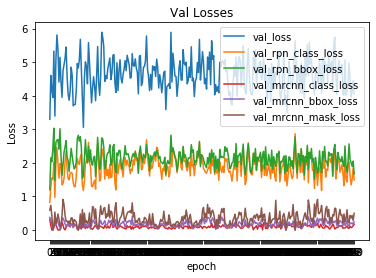

Train Loss 



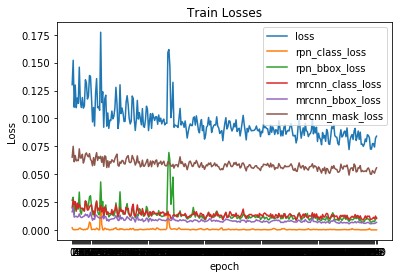

In [17]:
 '''
    # Training - Stage 3
        # Fine tune all layers
        print("Fine tune all layers")
        model.train(dataset_train, dataset_val,
                    learning_rate=config.LEARNING_RATE / 10,
                    epochs=1,
                    layers='all',
                    augmentation=seq)
    '''

In [27]:
'''
model_path = os.path.join(MODEL_DIR, "mask_rcnn_shapes_with_augmentation.h5")
model.keras_model.save_weights(model_path)
'''

In [18]:
# Save weights
# Typically not needed because callbacks save after every epoch
# Uncomment to save manually
'''
model_path = os.path.join(MODEL_DIR, "mask_rcnn_shapes_with_augmentation.h5")
model.keras_model.save_weights(model_path)
'''

## Detection

In [130]:

class InferenceConfig(ShapesConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")

#model_path = model.find_last()
model_path = os.path.join(MODEL_DIR, "mask_rcnn_shapes_with_augmentation.h5")

#model_path = '/home/harsh/Mask_RCNN/logs/shapes20190824T0132/mask_rcnn_shapes_0150.h5'
# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)


Loading weights from  /home/harsh/Mask_RCNN/logs/mask_rcnn_shapes_with_augmentation.h5


In [131]:
import skimage
from skimage import data, io


original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  237.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 3920.00000  float64
gt_class_id              shape: (7,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (7, 4)                min:  135.00000  max:  639.00000  int32
gt_mask                  shape: (1024, 1024, 7)       min:    0.00000  max:    1.00000  bool


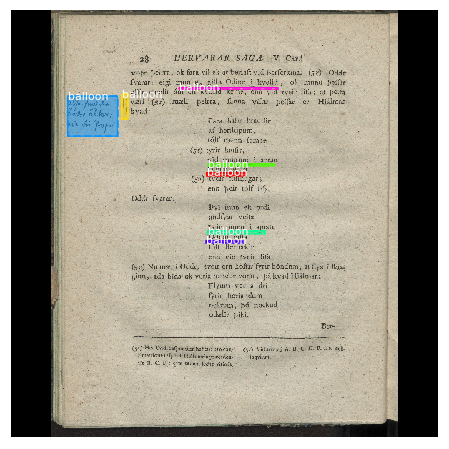

In [132]:

# Test on a random image of validation
#image_id = random.choice(dataset_train.image_ids)
image_id =3
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))
    

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  237.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min:    0.00000  max:  237.00000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


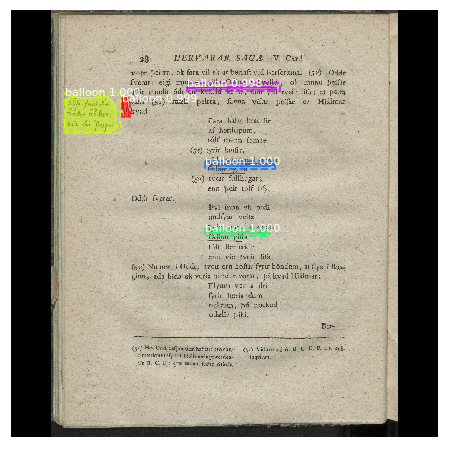

In [133]:

results = model.detect([original_image], verbose=1)
r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                           dataset_val.class_names, r['scores'], ax=get_ax())

In [134]:

def compute_overlaps(boxes1, boxes2):
    """Computes IoU overlaps between two sets of boxes.
    boxes1, boxes2: [N, (y1, x1, y2, x2)].
    For better performance, pass the largest set first and the smaller second.
    """
    # Areas of anchors and GT boxes
    area1 = (boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1])
    area2 = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])

    # Compute overlaps to generate matrix [boxes1 count, boxes2 count]
    # Each cell contains the IoU value.
    overlaps = np.zeros((boxes1.shape[0], boxes2.shape[0]))
    for i in range(overlaps.shape[1]):
        box2 = boxes2[i]
        overlaps[:, i] = compute_iou(box2, boxes1, area2[i], area1)
    return overlaps


def compute_iou(box, boxes, box_area, boxes_area):
    """Calculates IoU of the given box with the array of the given boxes.
    box: 1D vector [y1, x1, y2, x2]
    boxes: [boxes_count, (y1, x1, y2, x2)]
    box_area: float. the area of 'box'
    boxes_area: array of length boxes_count.
    Note: the areas are passed in rather than calculated here for
    efficiency. Calculate once in the caller to avoid duplicate work.
    """
    # Calculate intersection areas
    y1 = np.maximum(box[0], boxes[:, 0])
    y2 = np.minimum(box[2], boxes[:, 2])
    x1 = np.maximum(box[1], boxes[:, 1])
    x2 = np.minimum(box[3], boxes[:, 3])
    intersection = np.maximum(x2 - x1, 0) * np.maximum(y2 - y1, 0)
    union = box_area + boxes_area[:] - intersection[:]
    iou = intersection / union
    return iou


def compute_overlaps_masks(masks1, masks2):
    """Computes IoU overlaps between two sets of masks.
    masks1, masks2: [Height, Width, instances]
    """
    
    # If either set of masks is empty return empty result
    if masks1.shape[-1] == 0 or masks2.shape[-1] == 0:
        return np.zeros((masks1.shape[-1], masks2.shape[-1]))
    # flatten masks and compute their areas
    masks1 = np.reshape(masks1 > .5, (-1, masks1.shape[-1])).astype(np.float32)
    masks2 = np.reshape(masks2 > .5, (-1, masks2.shape[-1])).astype(np.float32)
    area1 = np.sum(masks1, axis=0)
    area2 = np.sum(masks2, axis=0)

    # intersections and union
    intersections = np.dot(masks1.T, masks2)
    union = area1[:, None] + area2[None, :] - intersections
    overlaps = intersections / union

    return overlaps
   

## Evaluation

GT Image


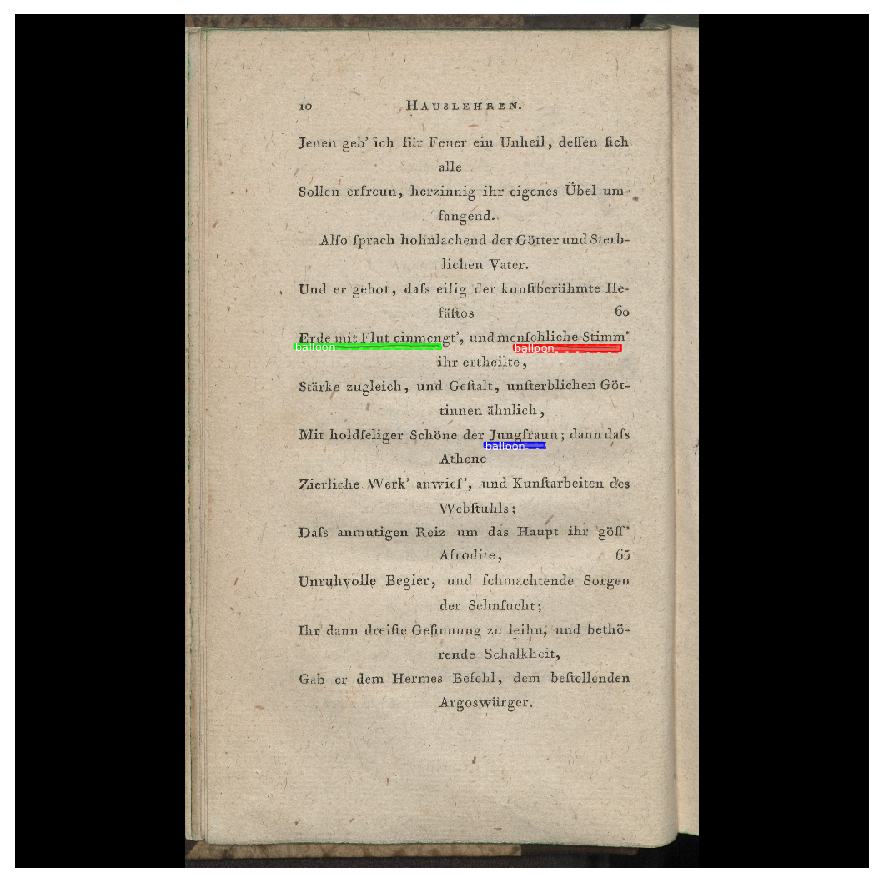

Predicted Image


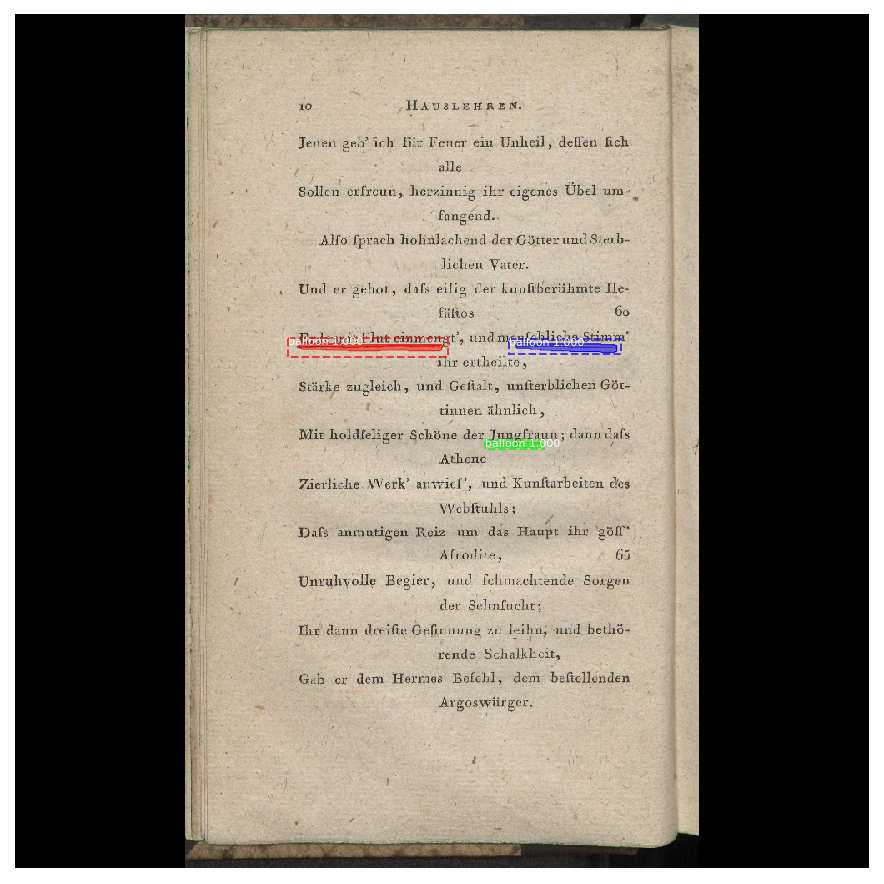

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:32: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:58: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


3
Mask IOU
0.7709500193595886
bb IOU
0.8439613127727165
GT Image


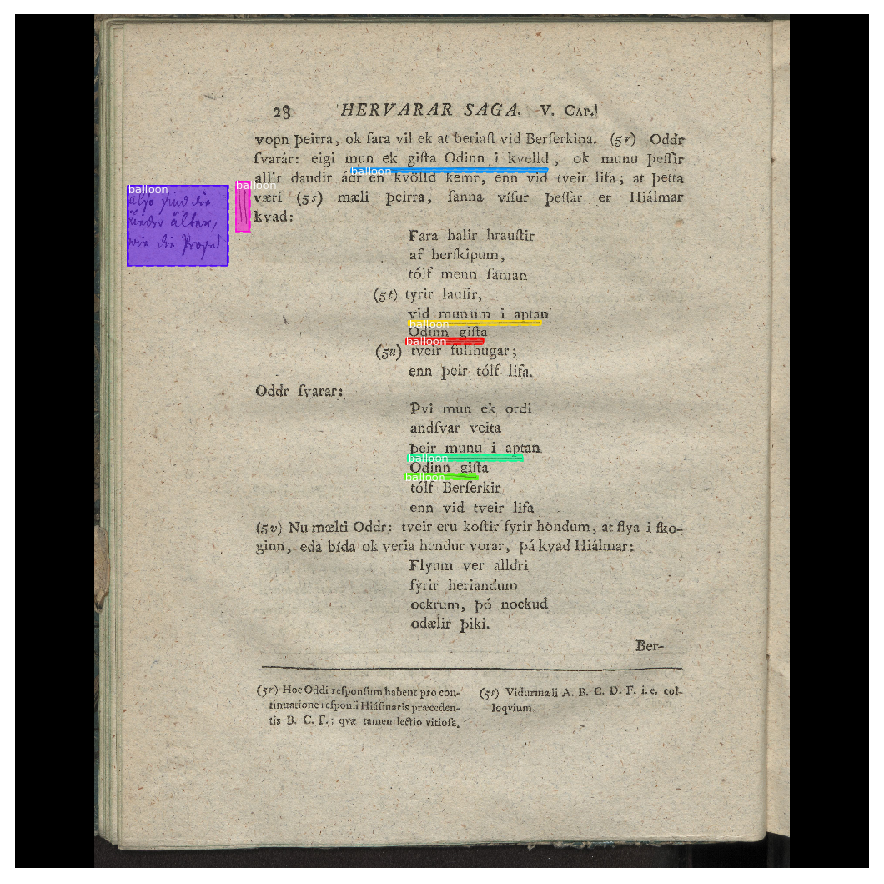

Predicted Image


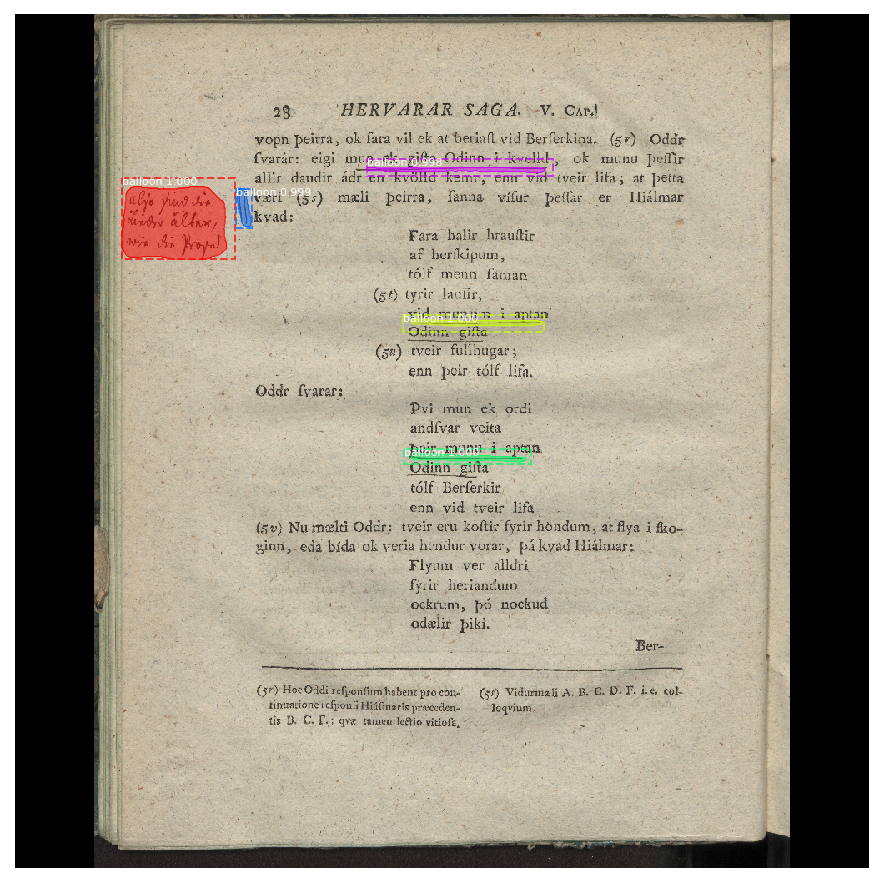

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:32: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:58: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


5
Mask IOU
0.7026179075241089
bb IOU
0.6210530265541874
GT Image


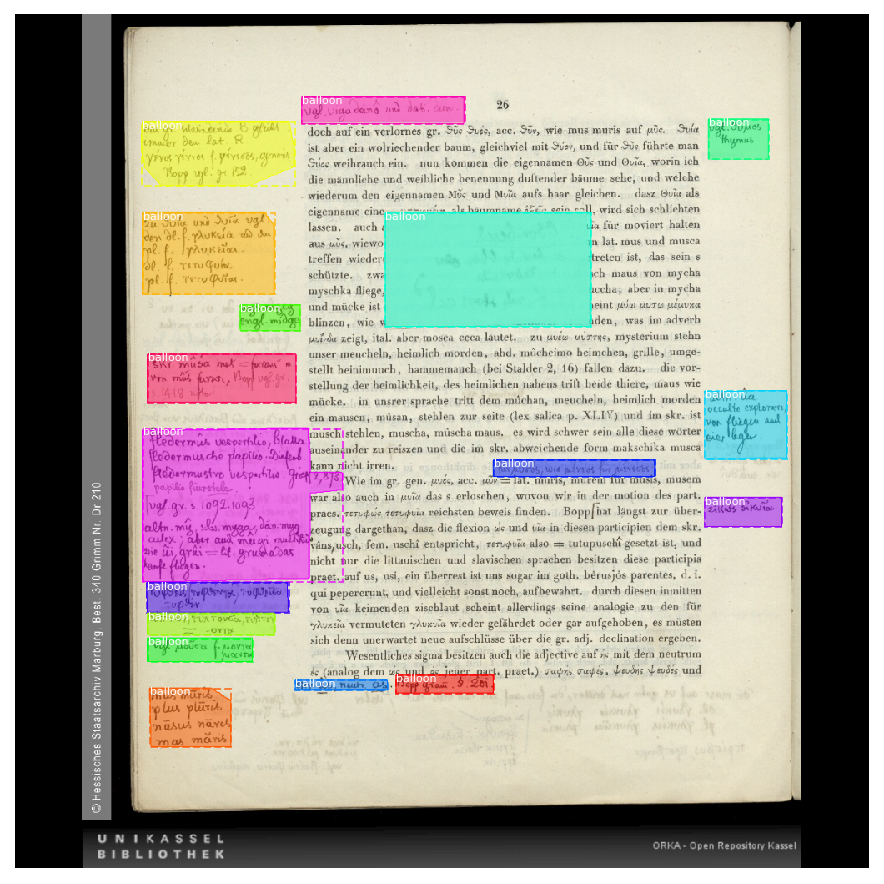

Predicted Image


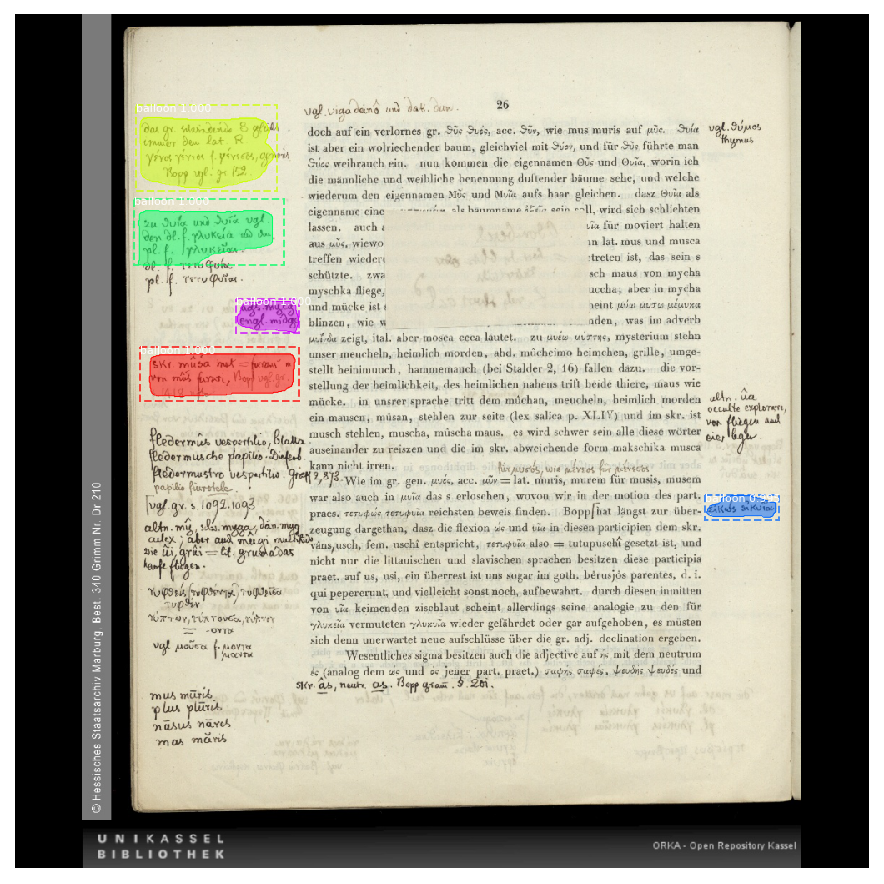

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:32: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:58: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


5
Mask IOU
0.678993421792984
bb IOU
0.36949030760967616
GT Image


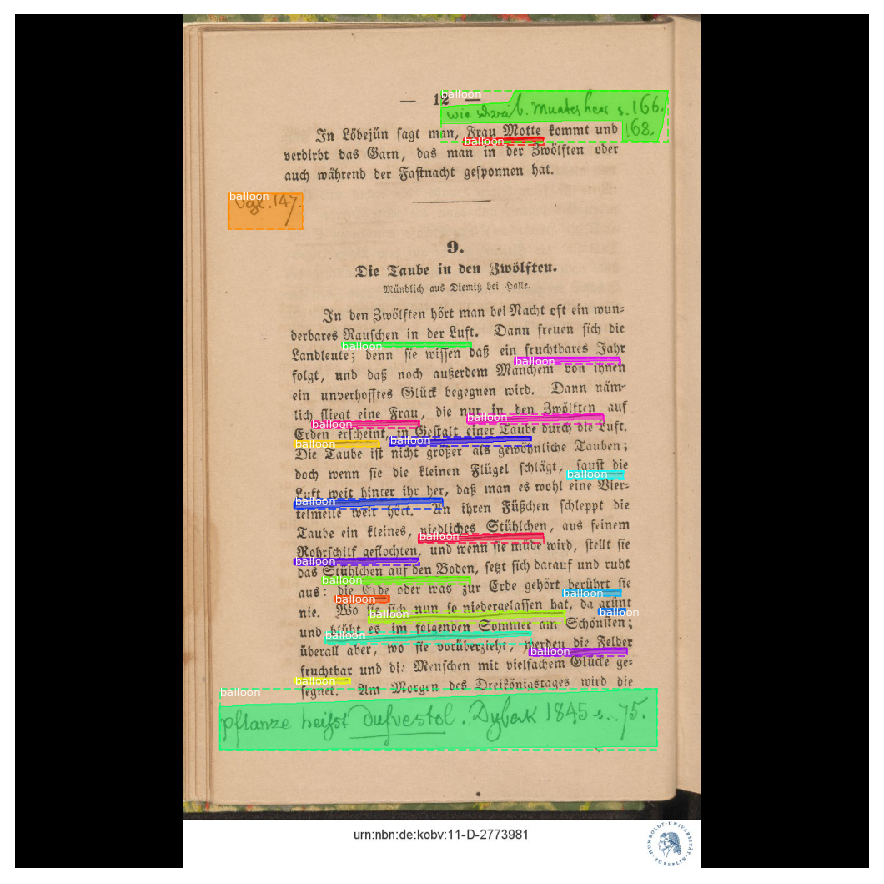

Predicted Image


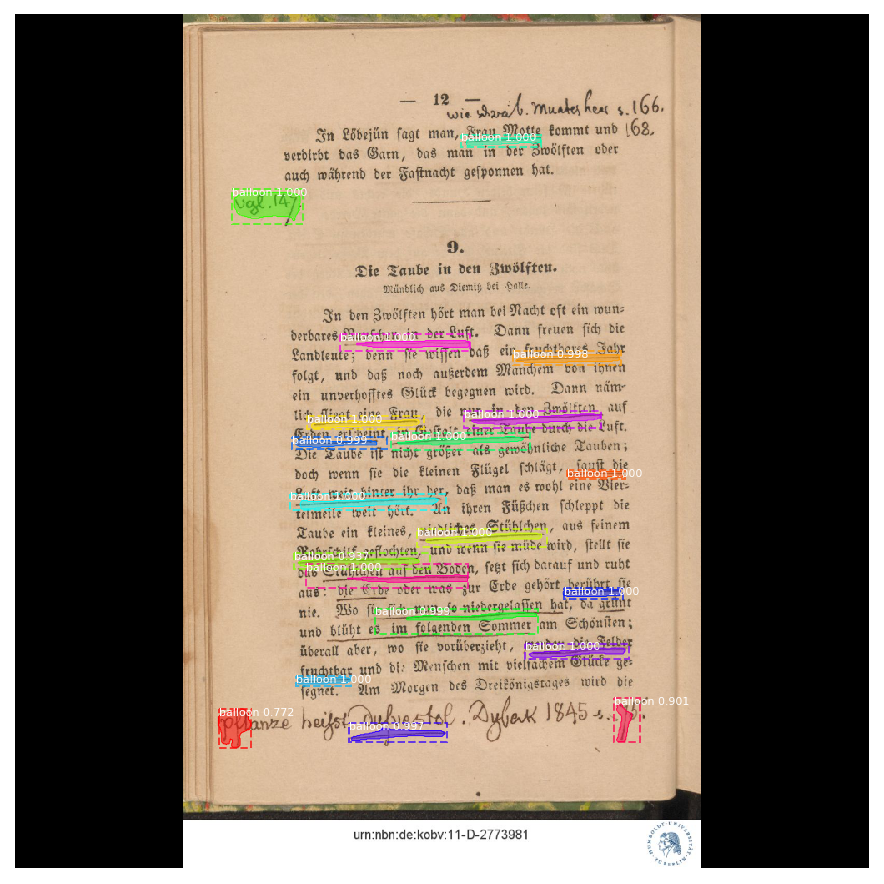

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:32: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:58: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


20
Mask IOU
0.5896363330073655
bb IOU
0.7072053439577315
GT Image


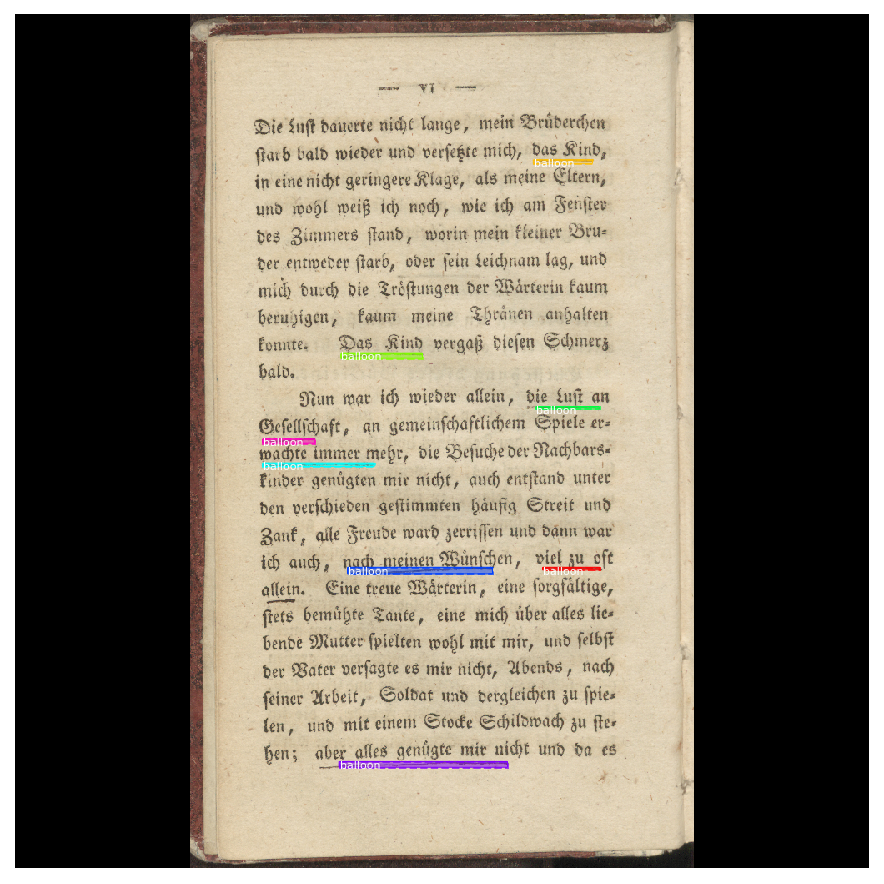

Predicted Image


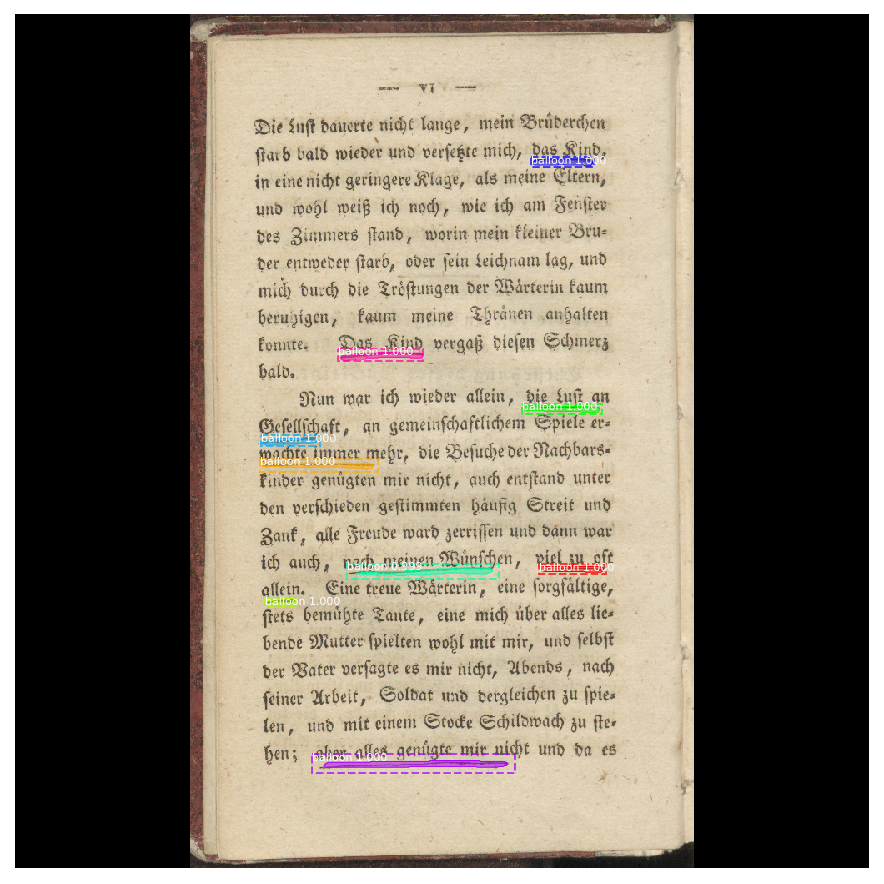

/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:32: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:58: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


9
Mask IOU
0.5426825119389428
bb IOU
0.8314283462448511
GT Image


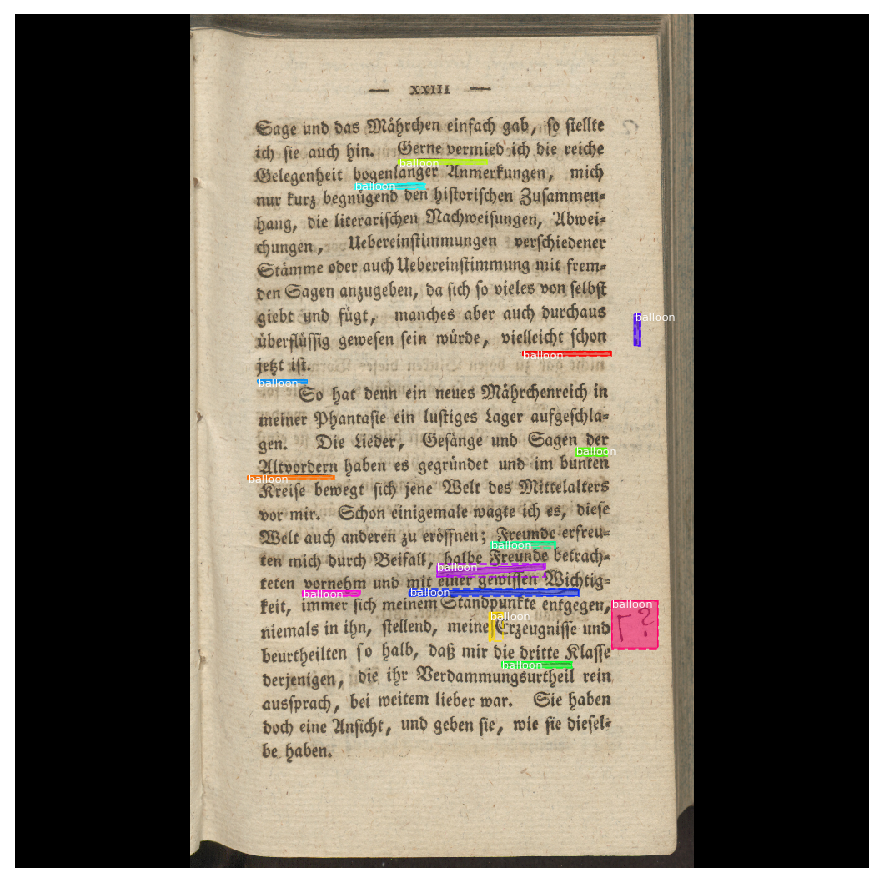

Predicted Image


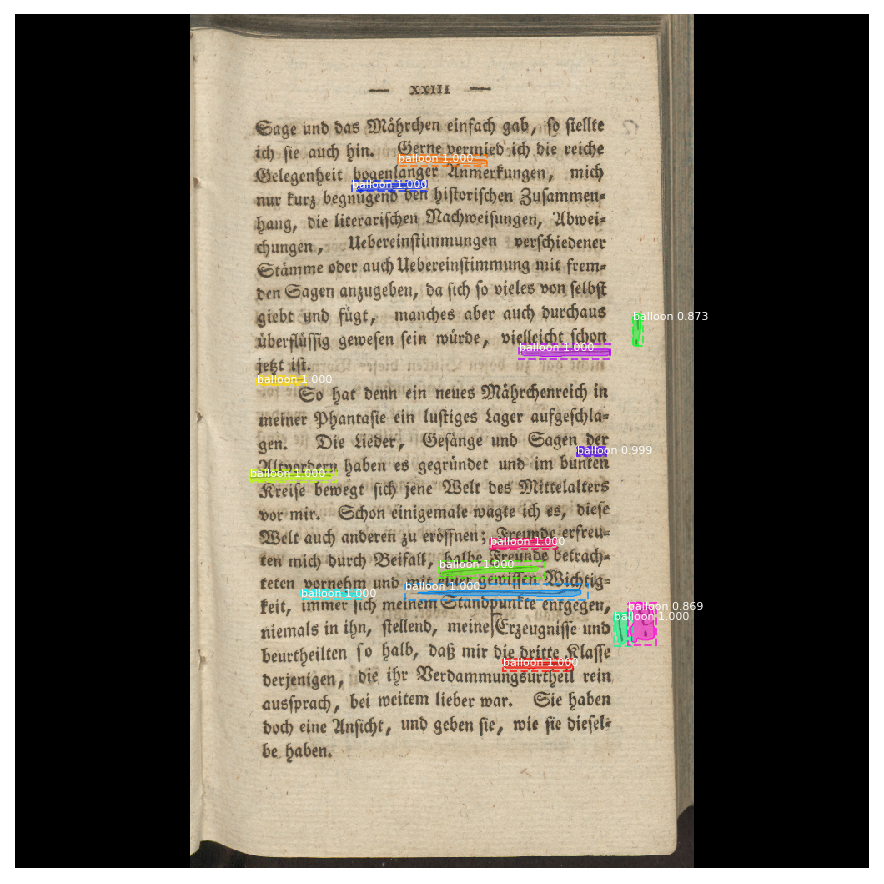

14
Mask IOU
0.5981970801949501
bb IOU
0.8307000367614865
IoU Bounding Box:  0.4203838373900649
IoU Masks:  0.388307727381794


/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:32: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/harsh/anaconda3/envs/maskrcnntensorflowgpu/lib/python3.6/site-packages/ipykernel_launcher.py:58: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


In [141]:

# Compute VOC-Style mAP @ IoU=0.5
# Running on 10 images. Increase for better accuracy.
#image_ids = np.random.choice(dataset_test.image_ids, 10)
image_ids =  dataset_test.image_ids
APs = []
IOU = 0
MSum = 0
for image_id in [0,3,4,5,6,7]:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]    
    print('GT Image')
    visualize.display_instances(image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_test.class_names)
    
    print('Predicted Image')
    
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'])
    
   
    
    # Compute IOU for masks
    mask_iou = compute_overlaps_masks(r['masks'], gt_mask) 
    mask_sum = 0
    for a in mask_iou:
        if(a != []):
            mask_sum += max(a)
   # print(mask_iou)
    if(mask_iou.shape[0]!=0):
        print(len(mask_iou))
        MSum += mask_sum/mask_iou.shape[0]
    print('Mask IOU')
    if(mask_iou.shape[0]!=0):
        print(mask_sum/mask_iou.shape[0])
    #print('\n')
    #print('IOU for Masks \n\n')
    #print(mask_iou)
    
    # Compute IOU for BB
    #print("predition bouding box")
    r['rois'].sort()
   # print(r['rois'])
    
    gt_bbox.sort()

    #print("Ground Truth bouding box")
   # print(gt_bbox)

    IoU_sum =0
    bb_iou = compute_overlaps(gt_bbox,  r['rois'])
    for a in bb_iou:
        if(a != []):
            IoU_sum += max(a)
    IOU += IoU_sum/bb_iou.shape[0]
    print('bb IOU')
    print(IoU_sum/bb_iou.shape[0])
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("IoU Bounding Box: ", IOU/dataset_test.num_images)
print("IoU Masks: ",MSum/dataset_test.num_images)


In [136]:
a = [[[1,2], [1,2]], [[1,2], [1,2]]]


In [118]:
print(len(a))

2
